In [ ]:
from google.colab import drive
drive.mount('/content/drive')


In [ ]:
#importing Libraries
import numpy as np
from matplotlib.image import imread
import cv2
import math
import os
import glob
import shutil
import sys
import matplotlib.pyplot as plt
import io
import scipy
import pickle
import sklearn
import pandas as pd
from sklearn.decomposition import PCA
from scipy.stats import stats
import matplotlib.image as mpimg


from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import mean_squared_error

from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import adam_v2, gradient_descent_v2, rmsprop_v2
from keras.callbacks import CSVLogger, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau


#Multioutput regressors libraryies
from sklearn.datasets import make_regression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor

from sklearn.svm import LinearSVR
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from numpy import absolute
from numpy import mean
from numpy import std

from sklearn.pipeline import *
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score
from sklearn.linear_model import Lasso, LassoCV 
from sklearn.linear_model import MultiTaskLassoCV, MultiTaskLasso
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.linear_model import lasso_path



In [ ]:
# Loading the dataset into the one image form
import cv2
import os

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img=cv2.cvtColor(cv2.imread((os.path.join(folder,filename))), cv2.COLOR_BGR2RGB)
        img = np.float32(img)
        if img is not None:
            images.append(img)
    return images

In [ ]:
img_sq_ring_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_square_ring")
img_rect_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_rect_shaped")
img_cyl_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_cylinder_shaped")
img_sq_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_square_shaped")
img_triangle_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_triangle_shape")
img_cir_ring_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_circular_ring")
img_cross_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_cross_shaped")
img_ellipse_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_ellipse")
img_elliptical_ring_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_elliptical_ring")
img_T_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_T-shaped")
img_hex_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_hexagon")
img_F_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_F_shaped")
img_sq_SC_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_square_super_cell")
img_Z_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_Z_shaped")
img_star_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_star_shaped")
img_cyl_SC_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_cyl_super_cell")


img_sq_ring_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybednum_square_ring")
img_rect_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybednum_rect_shaped")
img_cyl_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybednum_cylinder_shaped")
img_sq_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybednum_square_shaped")
img_triangle_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybednum_triangle_shaped")
img_cir_ring_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybednum_circular_ring")
img_cross_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybednum_cross_shaped")
img_ellipse_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybednum_ellipse")
img_elliptical_ring_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybednum_elliptical_ring")
img_T_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybednum_T-shaped")
img_hex_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybednum_hexagon")
img_F_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybednum_F_shaped")
img_sq_SC_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybednum_square_super_cell")
img_Z_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybedum_Z_shaped")
img_star_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybednum_star_shaped")
img_cyl_SC_mo=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Molybednum/Reshaped_Molybednum_cyl_super_cell")

img_sq_ring_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_square_ring")
img_rect_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_rect_shaped")
img_cyl_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_cylinder_shaped")
img_sq_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_square_shaped")
img_triangle_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_triangle_shaped")
img_cir_ring_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_circular_ring")
img_cross_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_cross_shaped")
img_ellipse_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_ellipse")
img_elliptical_ring_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_elliptical_ring")
img_T_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_T-shaped")
img_hex_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_hexagon")
img_F_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_F_shaped")
img_sq_SC_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_square_super_cell")
img_Z_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_Z_shaped")
img_star_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_star_shaped")
img_cyl_SC_nb=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Niobium/Reshaped_Niobium_cyl_super_cell")

img_sq_ring_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_square_ring")
img_rect_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_rect_shaped")
img_cyl_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_cylinder_shaped")
img_sq_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_square_shaped")
img_triangle_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_triangle_shape")
img_cir_ring_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_circular_ring")
img_cross_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_cross_shaped")
img_ellipse_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_ellipse")
img_elliptical_ring_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_elliptical_ring")
img_T_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_T-shaped")
img_hex_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_hexagon")
img_F_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_F_shaped")
img_sq_SC_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_square_super_cell")
img_Z_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_Z_shaped")
img_star_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_star_shaped")
img_cyl_SC_re=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Rhenium/Reshaped_rhenium_cyl_super_cell")

img_sq_ring_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_square_ring")
img_rect_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_rect_shaped")
img_cyl_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_cylinder_shaped")
img_sq_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_square_shaped")
img_triangle_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_triangle_shaped")
img_cir_ring_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_circular_ring")
img_cross_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_cross_shaped")
img_ellipse_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_ellipse")
img_elliptical_ring_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_elliptical_ring")
img_T_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_T-shaped")
img_hex_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_hexagon")
img_F_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_F_shaped")
img_sq_SC_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_square_super_cell")
img_Z_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_Z_shaped")
img_star_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_star_shaped")
img_cyl_SC_ta=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tantalum/Reshaped_Tantalum_cyl_super_cell")

img_sq_ring_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_square_ring")
img_rect_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_rect_shaped")
img_cyl_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_cylinder_shaped")
img_sq_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_square_shaped")
img_triangle_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_triangle_shape")
img_cir_ring_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_circular_ring")
img_cross_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_cross_shaped")
img_ellipse_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_ellipse")
img_elliptical_ring_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_elliptical_ring")
img_T_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_T-shaped")
img_hex_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_hexagon")
img_F_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_F_shaped")
img_sq_SC_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_square_super_cell")
img_Z_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_Z_shaped")
img_star_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_star_shaped")
img_cyl_SC_ti=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Titanium/Reshaped_Titanium_cyl_super_cell")

img_sq_ring_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_square_ring")
img_rect_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_rect_shaped")
img_cyl_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_cylinder_shaped")
img_sq_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_square_shaped")
img_triangle_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_triangle_shape")
img_cir_ring_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_circular_ring")
img_cross_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_cross_shaped")
img_ellipse_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_ellipse")
img_elliptical_ring_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_elliptical_ring")
img_T_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_T-shaped")
img_hex_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_hexagon")
img_F_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_F_shaped")
img_sq_SC_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_square_super_cell")
img_Z_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_Z_shaped")
img_star_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_star_shaped")
img_cyl_SC_w=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Tungsten/Reshaped_Tungsten_cyl_super_cell")

img_sq_ring_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_square_ring")
img_rect_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_rect_shaped")
img_cyl_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_circular_shaped")
img_sq_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_square_shaped")
img_triangle_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_triangle_shaped")
img_cir_ring_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_circular_ring")
img_cross_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_cross_shaped")
img_ellipse_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_ellipse")
img_elliptical_ring_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_elliptical_ring")
img_T_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_T-shaped")
img_hex_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_hexagon")
img_F_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_F_shaped")
img_sq_SC_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_square_super_cell")
img_Z_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_Z_shaped")
img_star_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_star_shaped")
img_cyl_SC_ZrN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_ZrN/Reshaped_ZrN_cyl_super_cell")

img_sq_ring_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_square_ring")
img_rect_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_rect_shaped")
img_cyl_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_cylinder_shaped")
img_sq_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_square_shaped")
img_triangle_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_triangle_shape")
img_cir_ring_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_circular_ring")
img_cross_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_cross_shaped")
img_ellipse_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_ellipse")
img_elliptical_ring_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_elliptical_ring")
img_T_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_T-shaped")
img_hex_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_hexagon")
img_F_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_F_shaped")
img_sq_SC_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_square_super_cell")
img_Z_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_Z_shaped")
img_star_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_star_shaped")
img_cyl_SC_V=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Vanadium/Reshaped_Vanadium_cyl_super_cell")

img_sq_ring_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_square_ring")
img_rect_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_rect_shaped")
img_cyl_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_cylinder_shaped")
img_sq_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_square_shaped")
img_triangle_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_triangle_shape")
img_cir_ring_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_circular_ring")
img_cross_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_cross_shaped")
img_ellipse_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_ellipse")
img_elliptical_ring_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_elliptical_ring")
img_T_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_T-shaped")
img_hex_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_hexagon")
img_F_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_F_shaped")
img_sq_SC_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_square_super_cell")
img_Z_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_Z-shaped")
img_star_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_star_shaped")
img_cyl_SC_TiN=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_TiN/Reshaped_TiN_cyl_super_cell")

In [ ]:
img_sq_ring_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_square_ring")
img_rect_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_rect_shaped")
img_cyl_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_cylinder_shaped")
img_sq_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_square_shaped")
img_triangle_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_triangle_shape")
img_cir_ring_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_circular_ring")
img_cross_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_cross_shaped")
img_ellipse_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_ellipse")
img_elliptical_ring_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_elliptical_ring")
img_T_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_T-shaped")
img_hex_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_hexagon")
img_F_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_F_shaped")
img_sq_SC_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_square_super_cell")
img_Z_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_Z_shaped")
img_star_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_star_shaped")
img_cyl_SC_cr=load_images_from_folder("/content/drive/My Drive/Refractory_Journal/data_images/Reshaped_Chromium/Reshaped_Chromium_cyl_super_cell")

## Chromium

In [ ]:
k=10;

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (6, 1920

img_sq_ring_cr_size_pca (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

(9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin


RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (1, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (2, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (3, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (4, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (5, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (6, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (7, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (8, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (9, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (10, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (11, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (12, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (9, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin


Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape: 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin


Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data F

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_cr (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_cr (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_cr (3, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_cr (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_cr (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_cr (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_cr (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_cr (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_cr (9, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_cr (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_cr (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_cr (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (3, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (7, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:888: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (6, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape: 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (1, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (6, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (8, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (1, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

 (1, 1920)
img_Z_cr (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (9, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (7, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (10, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_cr (13, 1920)


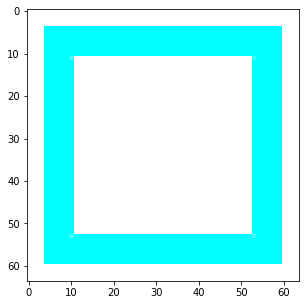

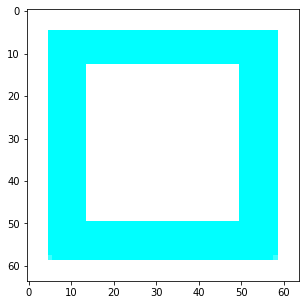

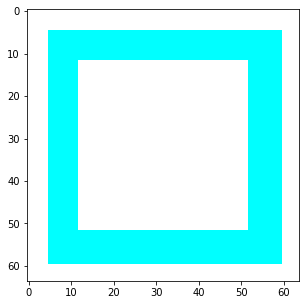

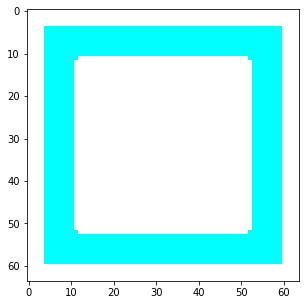

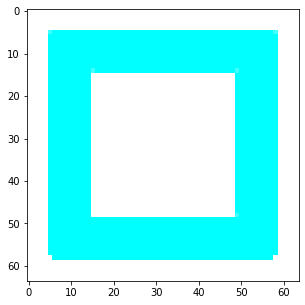

...

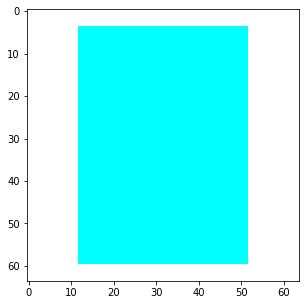

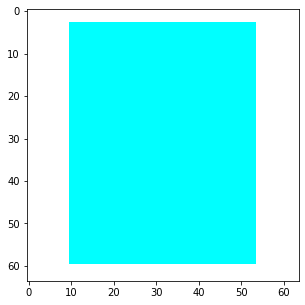

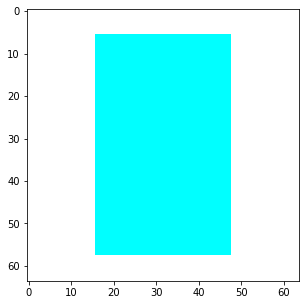

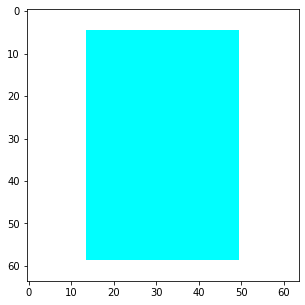

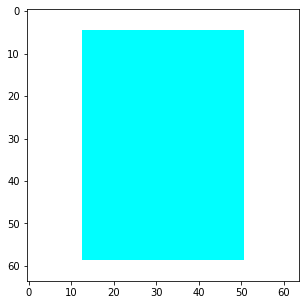

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

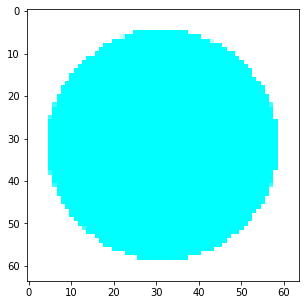

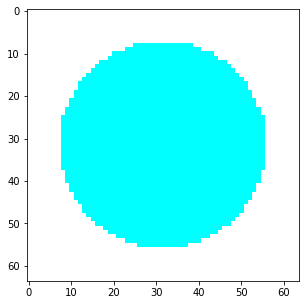

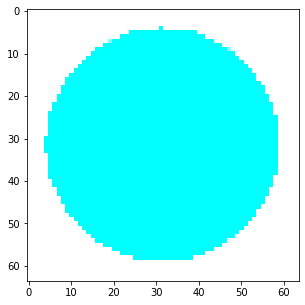

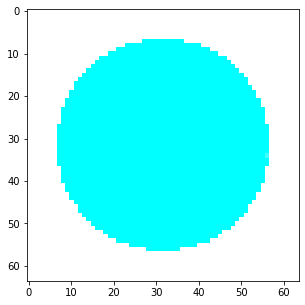

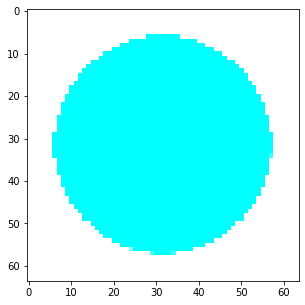

...

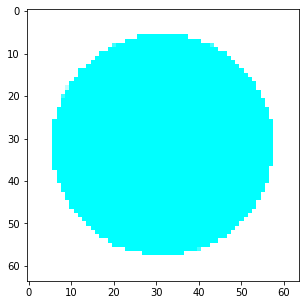

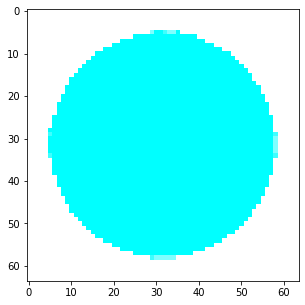

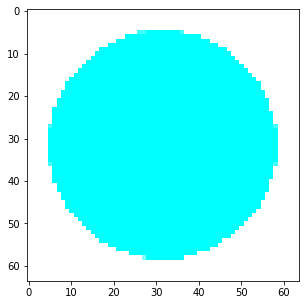

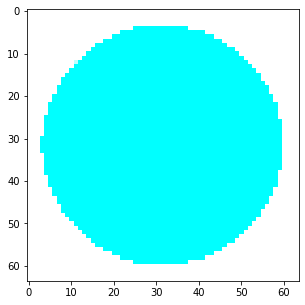

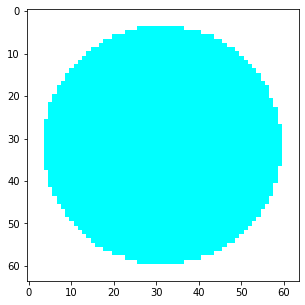

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

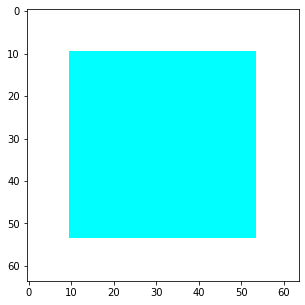

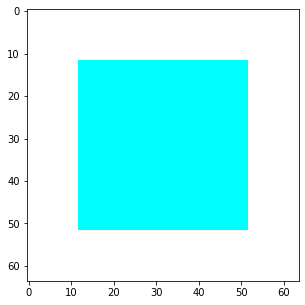

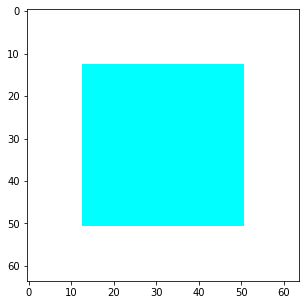

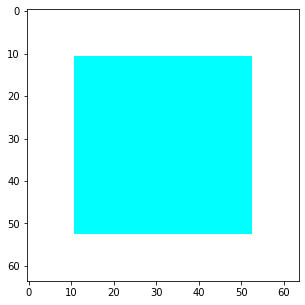

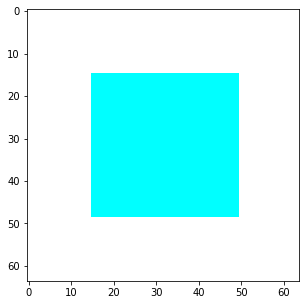

...

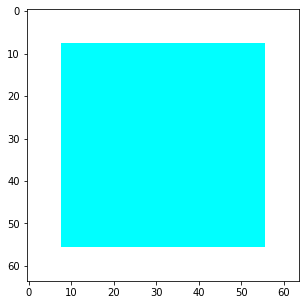

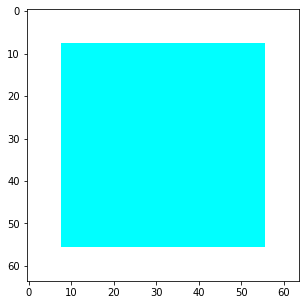

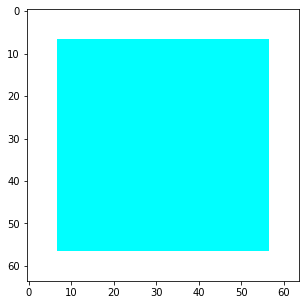

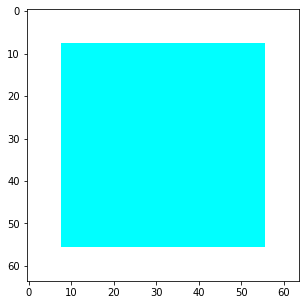

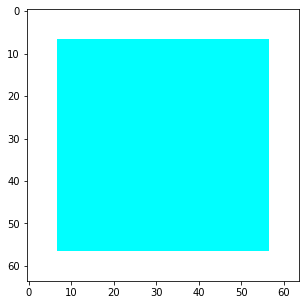

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

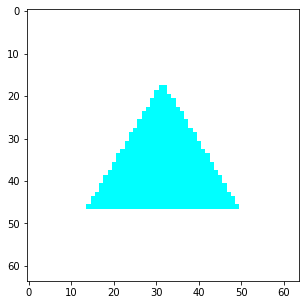

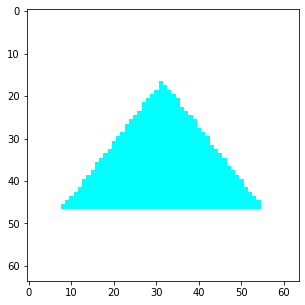

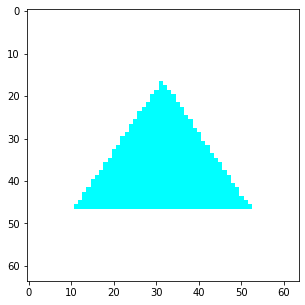

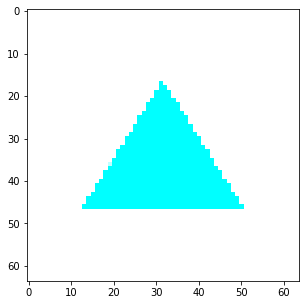

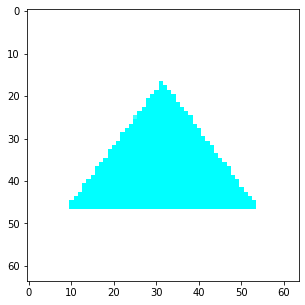

...

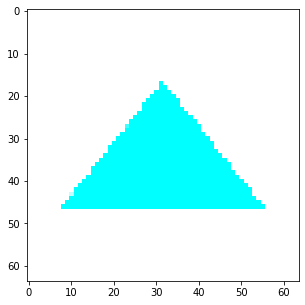

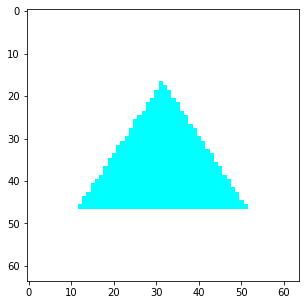

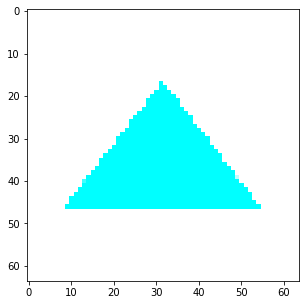

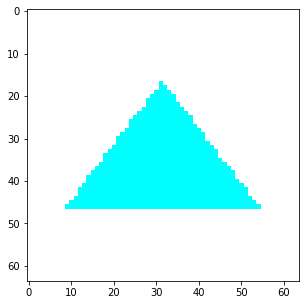

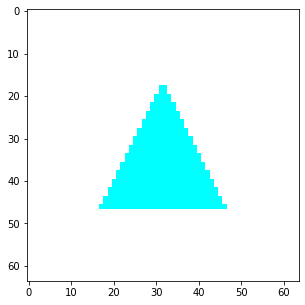

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

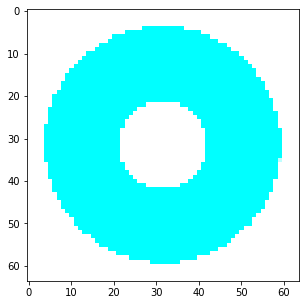

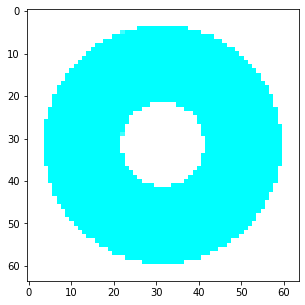

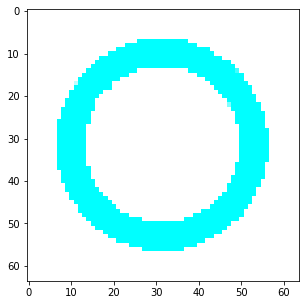

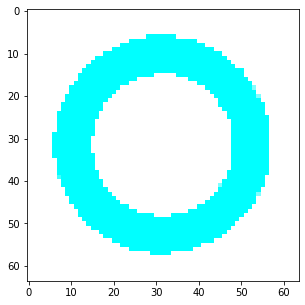

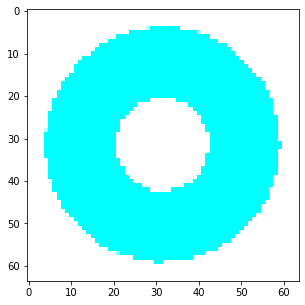

...

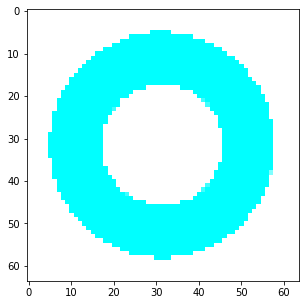

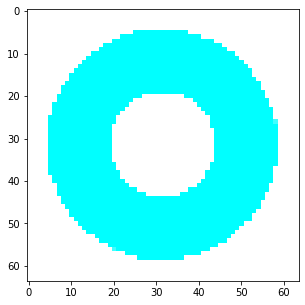

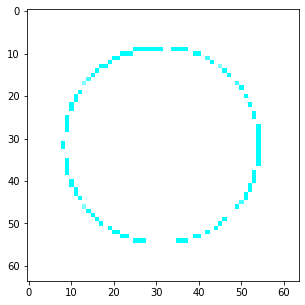

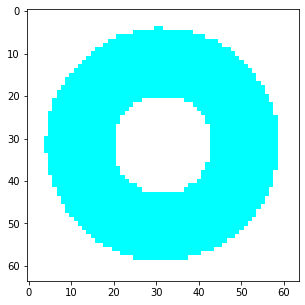

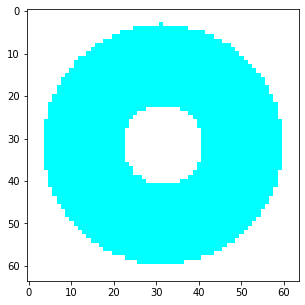

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

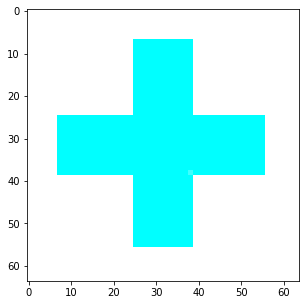

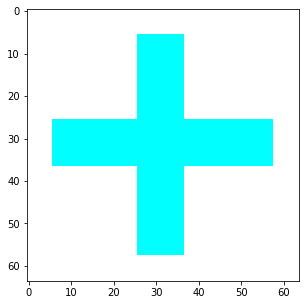

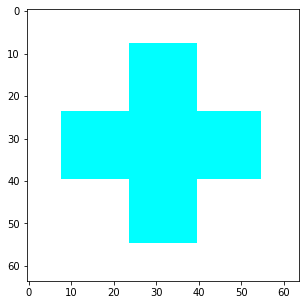

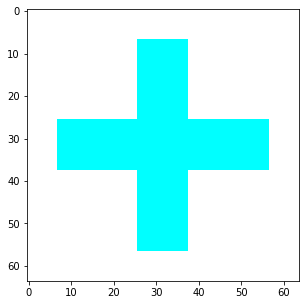

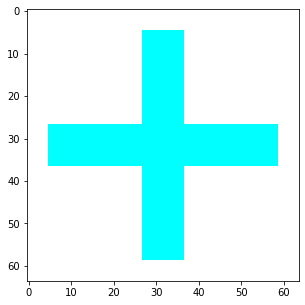

...

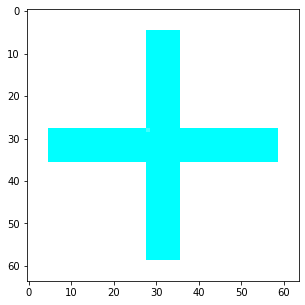

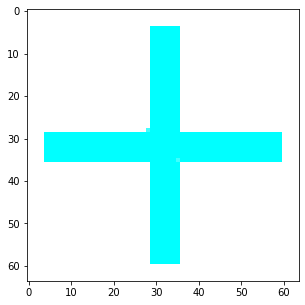

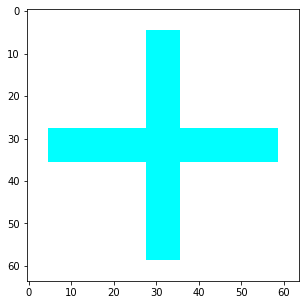

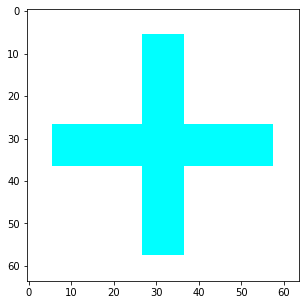

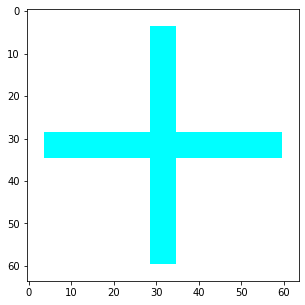

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

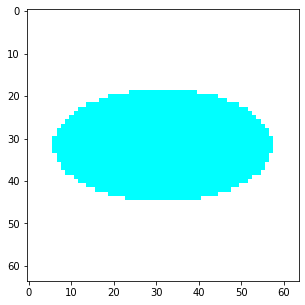

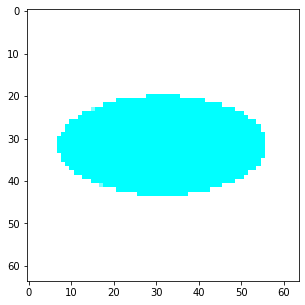

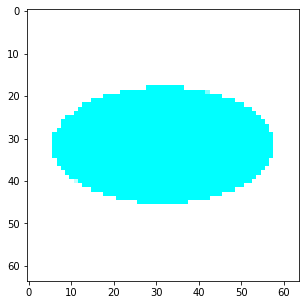

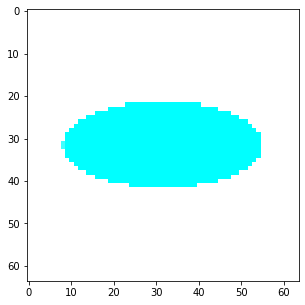

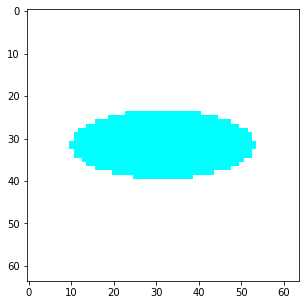

...

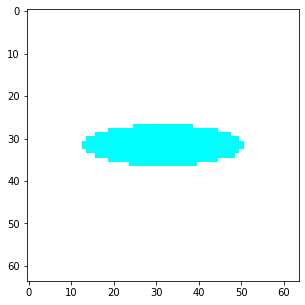

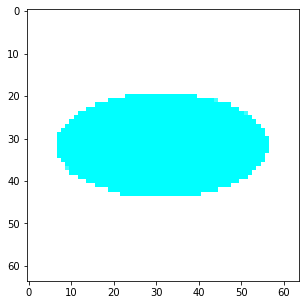

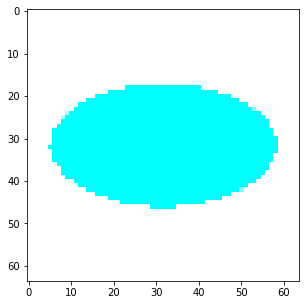

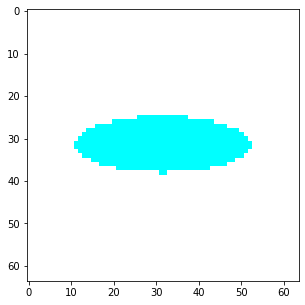

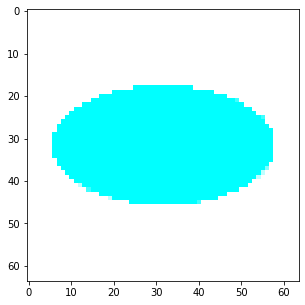

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

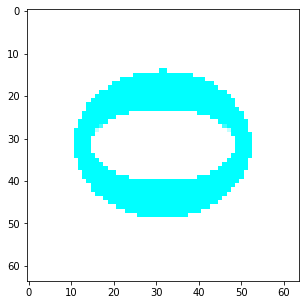

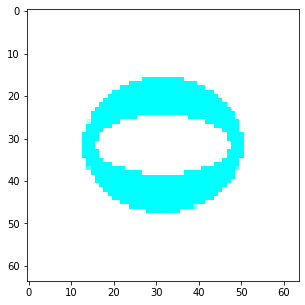

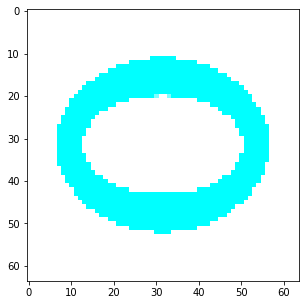

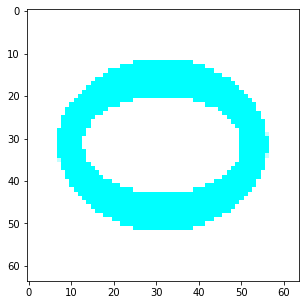

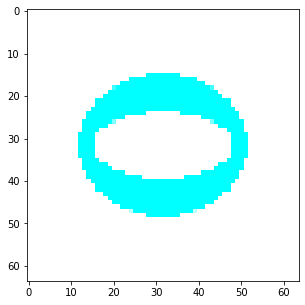

...

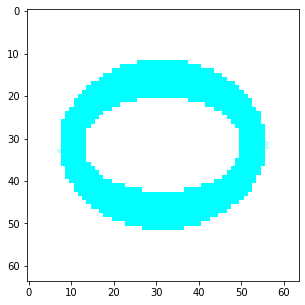

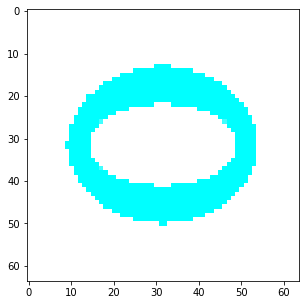

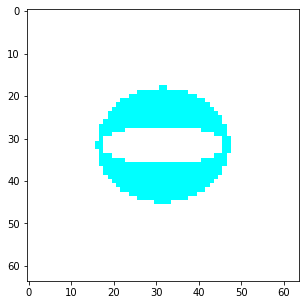

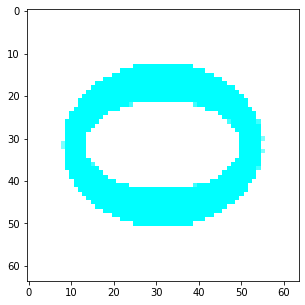

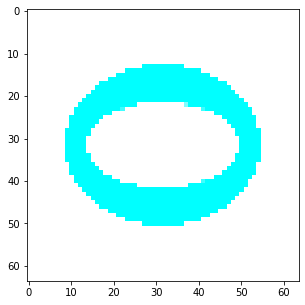

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

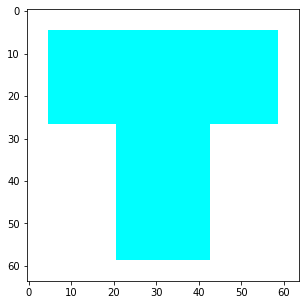

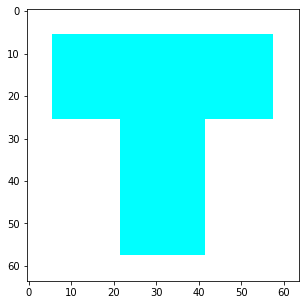

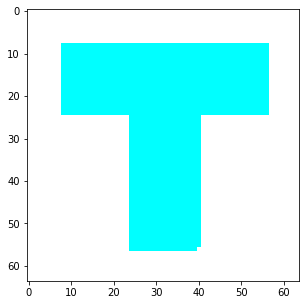

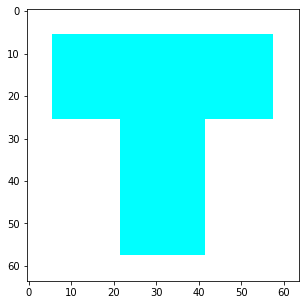

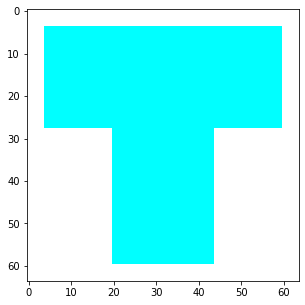

...

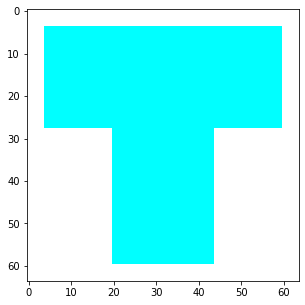

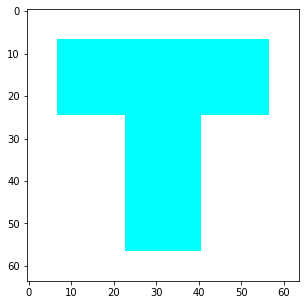

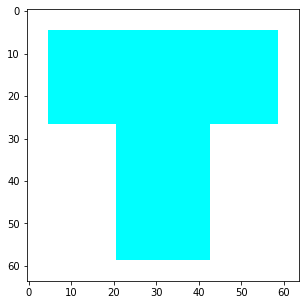

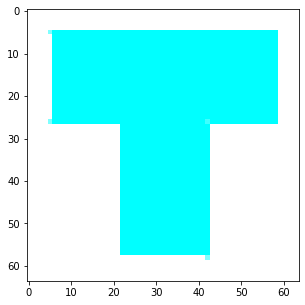

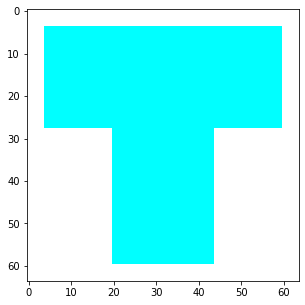

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

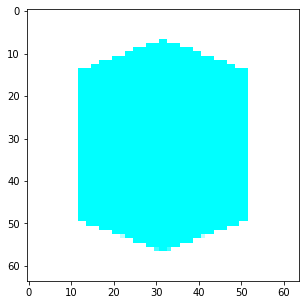

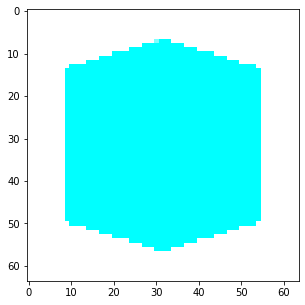

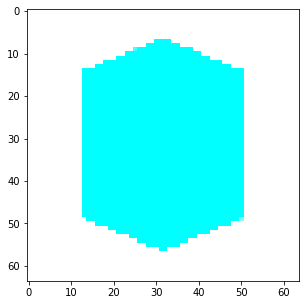

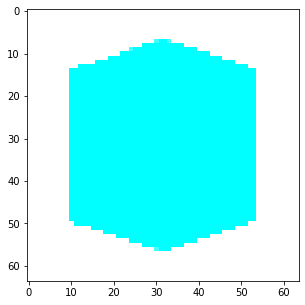

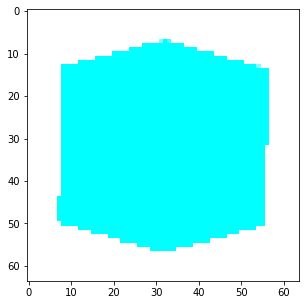

...

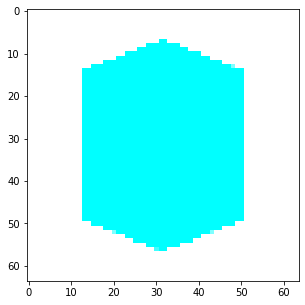

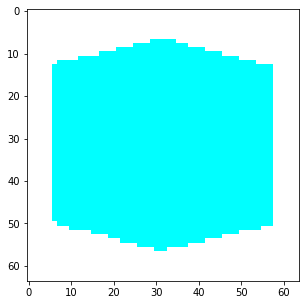

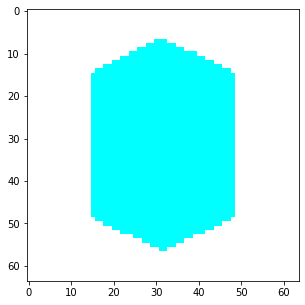

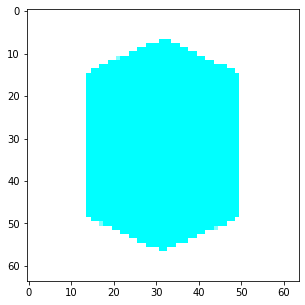

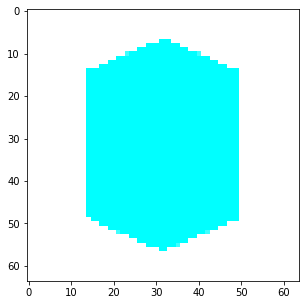

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

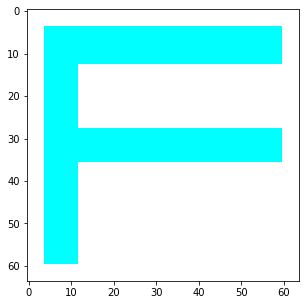

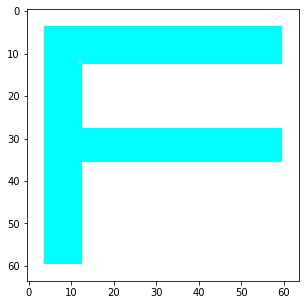

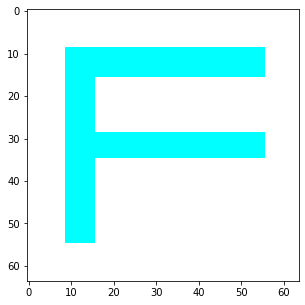

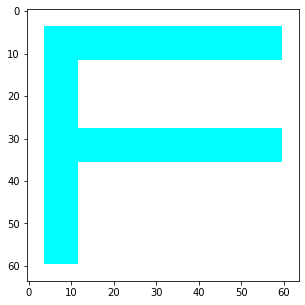

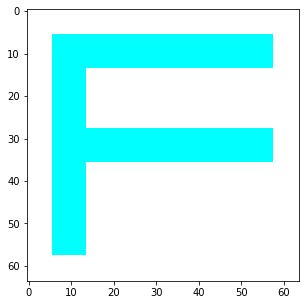

...

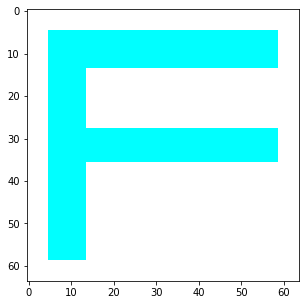

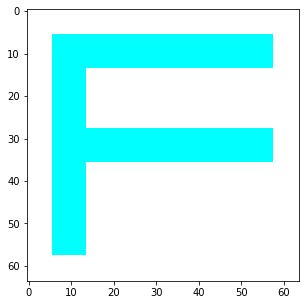

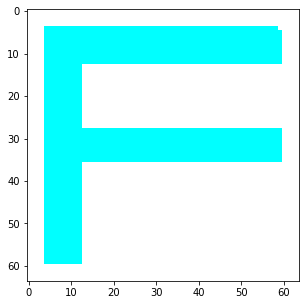

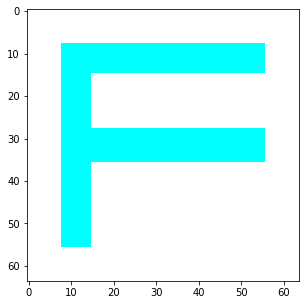

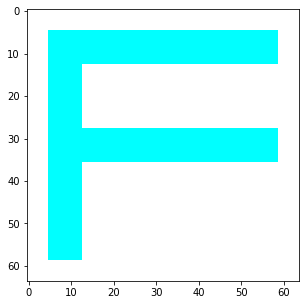

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

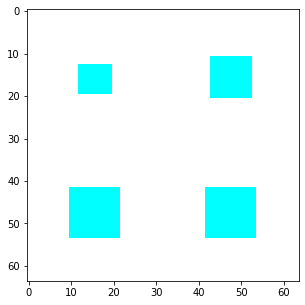

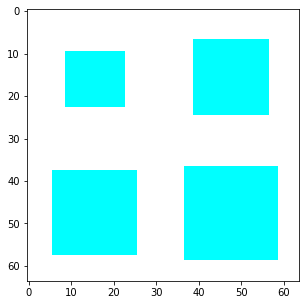

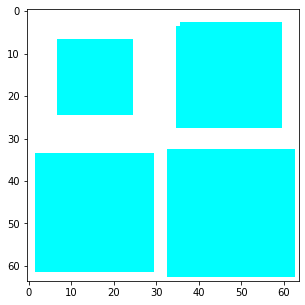

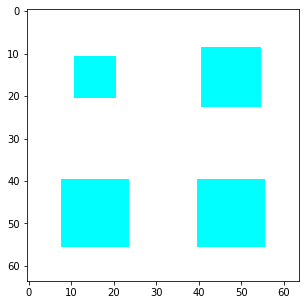

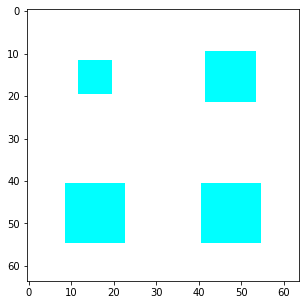

...

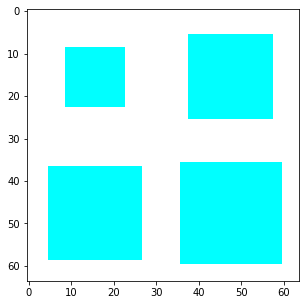

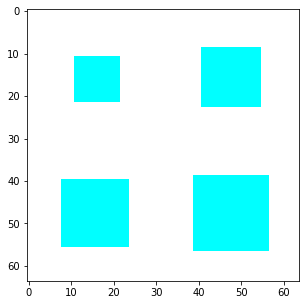

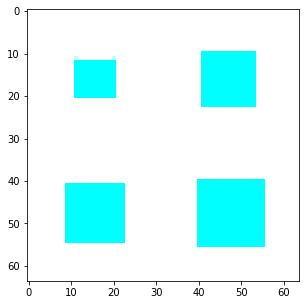

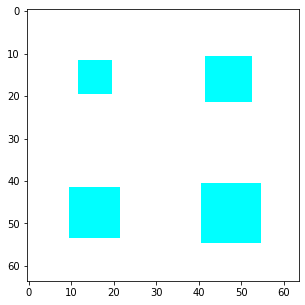

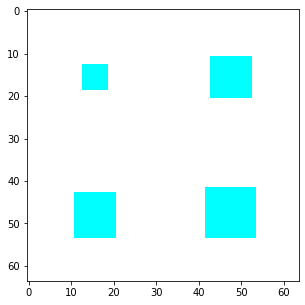

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

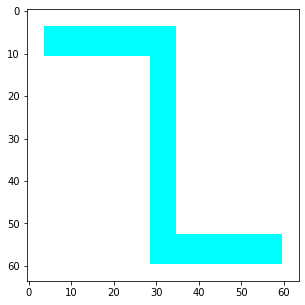

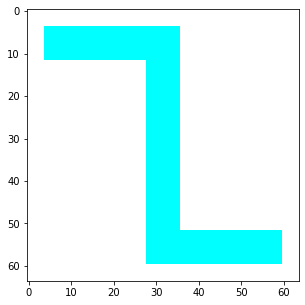

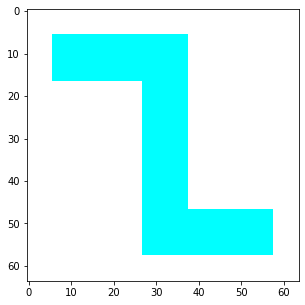

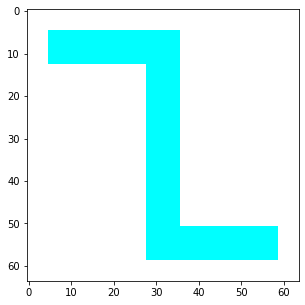

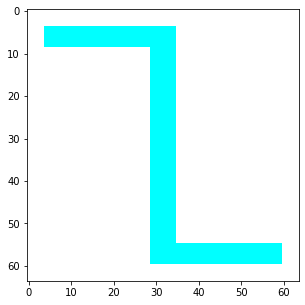

...

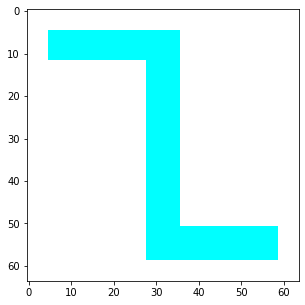

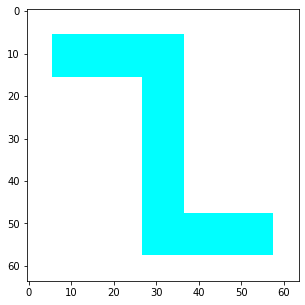

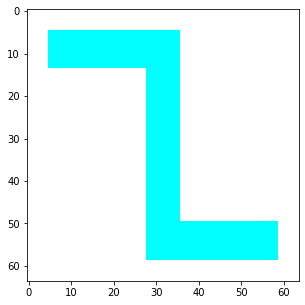

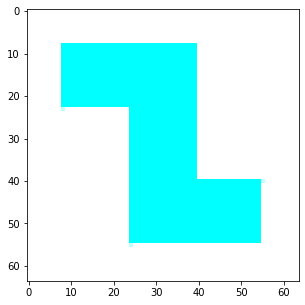

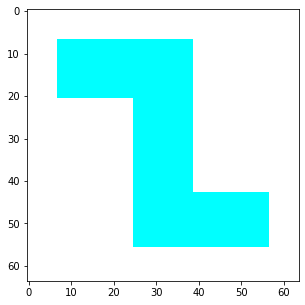

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

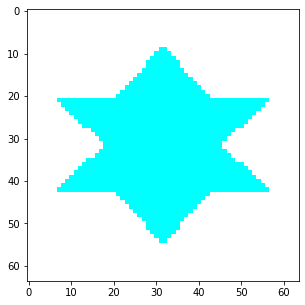

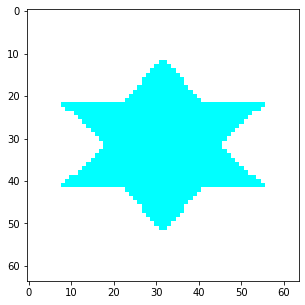

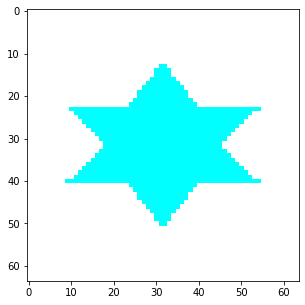

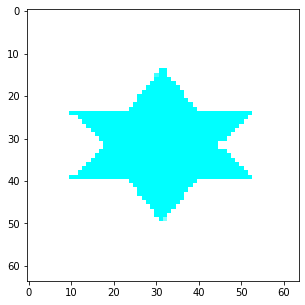

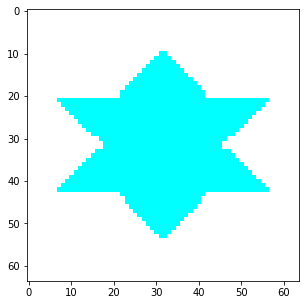

...

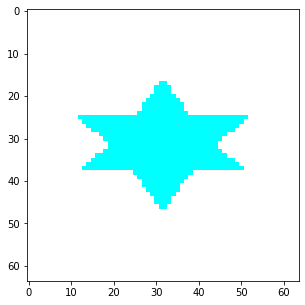

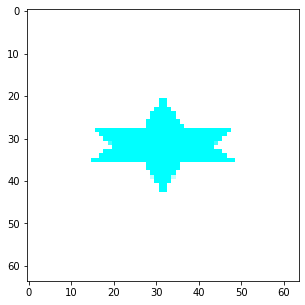

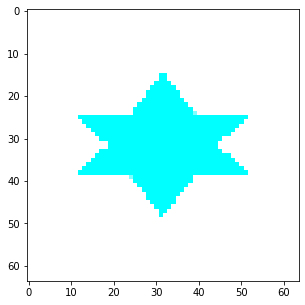

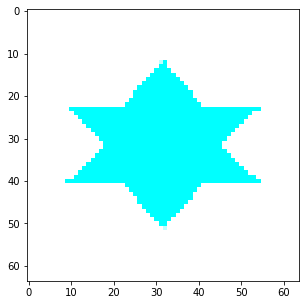

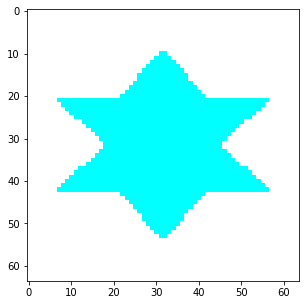

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

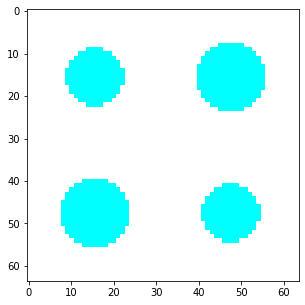

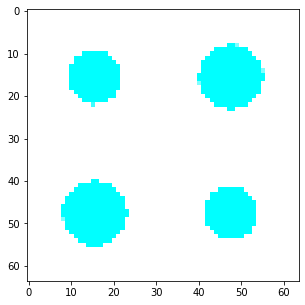

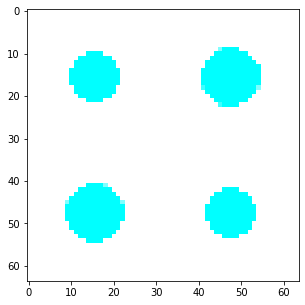

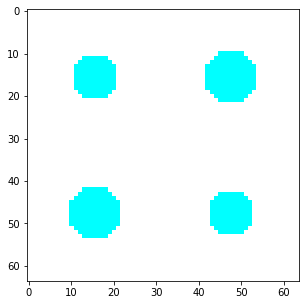

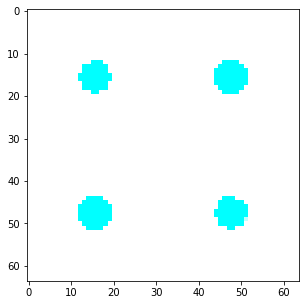

...

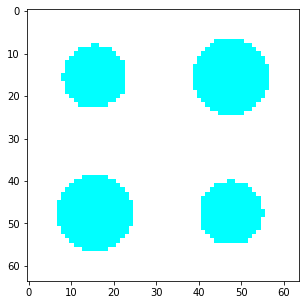

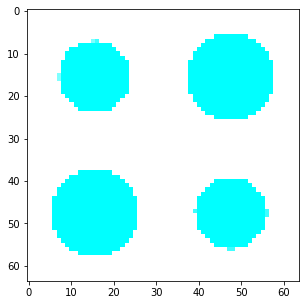

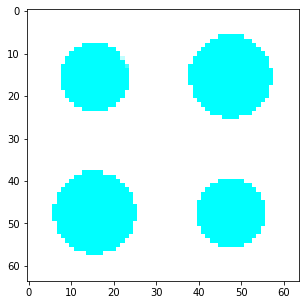

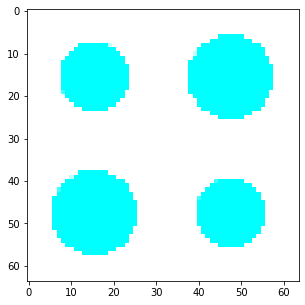

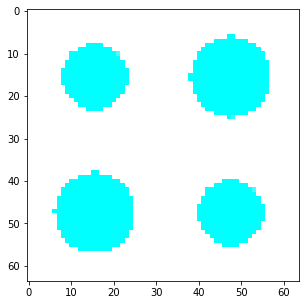

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

In [ ]:
#1 Splitting into Crlybdenum square ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_ring_cr=[];
pca_Cr_sqring=[];
for i in range(len(img_sq_ring_cr)):
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_ring_cr.append(cv2.resize(img_sq_ring_cr[i], target_size))
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_ring_cr[i])

for i in range(len(f_sq_ring_cr)):
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_ring_cr[i]) 
  print ("One Channel Shape: ", blue.shape)
#blue channel
  blue_df = pd.DataFrame(data = blue)
  blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  green_df
#red channel
  red_df = pd.DataFrame(data = red)
  red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_sqring.append(rgd_pca_df_np)
  print("img_sq_ring_cr_size_pca",np.array(pca_Cr_sqring).shape)






#2 Splitting into Cr rect

f_rect_cr=[]; #1
pca_Cr_rect=[]; #2
for i in range(len(img_rect_cr)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_rect_cr.append(cv2.resize(img_rect_cr[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_rect_cr[i]) #5

for i in range(len(f_rect_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_rect_cr[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)

  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]
  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_rect.append(rgd_pca_df_np)              #8
  print("img_sq_rect_cr",np.array(pca_Cr_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#2 Splitting into Cr rect

f_cyl_cr=[]; #1
pca_Cr_cyl=[]; #2
for i in range(len(img_cyl_cr)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_cr.append(cv2.resize(img_cyl_cr[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_cr[i]) #5

for i in range(len(f_cyl_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_cr[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)
  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_cyl.append(rgd_pca_df_np)              #8
  print("img_sq_rect_cr",np.array(pca_Cr_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#4 Splitting into Cr square
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_cr=[]; #1
pca_Cr_sq=[]; #2
for i in range(len(img_sq_cr)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_cr.append(cv2.resize(img_sq_cr[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_cr[i]) #5

for i in range(len(f_sq_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_cr[i]) #7
  #print ("One Channel Shape: ", blue.shape)
  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  #print ("Blue Data Frame")
  #print (trans_pca_b_df)

  #print ("Green Data Frame")
  #print (trans_pca_g_df)

  #print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_sq.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_Cr_sq).shape)

#5 Splitting into Cr triangle

f_tri_cr=[]; #1
pca_Cr_tri=[]; #2
for i in range(len(img_triangle_cr)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_tri_cr.append(cv2.resize(img_triangle_cr[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_tri_cr[i]) #5

for i in range(len(f_tri_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_tri_cr[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df

  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_tri.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_Cr_sq).shape)


#6 Splitting into chromium img_cir_ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_cir_ring_cr=[]; #1
pca_Cr_cir_ring=[]; #2
for i in range(len(img_cir_ring_cr)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cir_ring_cr.append(cv2.resize(img_cir_ring_cr[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cir_ring_cr[i]) #5

for i in range(len(f_cir_ring_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cir_ring_cr[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_cir_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_cr",np.array(pca_Cr_cir_ring).shape)

#7 Splitting into chromium img_cross
f_cross_cr=[]; #1
pca_Cr_cross=[]; #2
for i in range(len(img_cross_cr)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cross_cr.append(cv2.resize(img_cross_cr[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cross_cr[i]) #5
for i in range(len(f_cross_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cross_cr[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_cross.append(rgd_pca_df_np)              #8
  print("img_cir_ring_cr",np.array(pca_Cr_cir_ring).shape)
#Its shape is now 4608x1 instead of 64x72




#8 Splitting into chromium img_ellipse

f_ellipse_cr=[]; #1
pca_Cr_ellipse=[]; #2
for i in range(len(img_ellipse_cr)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_ellipse_cr.append(cv2.resize(img_ellipse_cr[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_ellipse_cr[i]) #5

for i in range(len(f_ellipse_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_ellipse_cr[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_ellipse.append(rgd_pca_df_np)              #8
  print("img_ellipse_cr",np.array(pca_Cr_cir_ring).shape)

#8 Splitting into cr _elliptical_ring

f_elliptical_ring_cr=[]; #1
pca_Cr_elliptical_ring=[]; #2
for i in range(len(img_elliptical_ring_cr)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_elliptical_ring_cr.append(cv2.resize(img_elliptical_ring_cr[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_elliptical_ring_cr[i]) #5

for i in range(len(f_elliptical_ring_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_elliptical_ring_cr[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_elliptical_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_cr",np.array(pca_Cr_cir_ring).shape)

#10 Splitting into chromium _T shaped

f_T_cr=[]; #1
pca_Cr_T=[]; #2
for i in range(len(img_T_cr)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_T_cr.append(cv2.resize(img_T_cr[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_T_cr[i]) #5

for i in range(len(f_T_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_T_cr[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_T.append(rgd_pca_df_np)              #8
  print("img_T_cr",np.array(pca_Cr_T).shape)

#10 Splitting into chromium Hexagon

f_hex_cr=[]; #1
pca_Cr_hex=[]; #2
for i in range(len(img_hex_cr)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_hex_cr.append(cv2.resize(img_hex_cr[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_hex_cr[i]) #5
for i in range(len(f_hex_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_hex_cr[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_hex.append(rgd_pca_df_np)              #8
  print("img_hex_cr",np.array(pca_Cr_hex).shape)


#11 Splitting into chromium F-shaped

f_F_cr=[]; #1
pca_Cr_F=[]; #2
for i in range(len(img_F_cr)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_F_cr.append(cv2.resize(img_F_cr[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_F_cr[i]) #5

for i in range(len(f_F_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_F_cr[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_F.append(rgd_pca_df_np)              #8
  print("img_hex_cr",np.array(pca_Cr_F).shape)


#12 Splitting into chromium Square SC
f_sq_SC_cr=[]; #1
pca_Cr_sq_SC=[]; #2
for i in range(len(img_sq_SC_cr)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_SC_cr.append(cv2.resize(img_sq_SC_cr[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_SC_cr[i]) #5

for i in range(len(f_sq_SC_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_SC_cr[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_sq_SC.append(rgd_pca_df_np)              #8
  print("img_hex_sq_SC",np.array(pca_Cr_sq_SC).shape)

#13 Splitting into chromium Z shaped
f_Z_cr=[]; #1
pca_Cr_Z=[]; #2
for i in range(len(img_Z_cr)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_Z_cr.append(cv2.resize(img_Z_cr[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_Z_cr[i]) #5

for i in range(len(f_Z_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_Z_cr[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)
  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_Z.append(rgd_pca_df_np)              #8
  print("img_Z_cr",np.array(pca_Cr_Z).shape)



#14 Splitting into chromium star
f_star_cr=[]; #1
pca_Cr_star=[]; #2
for i in range(len(img_star_cr)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_star_cr.append(cv2.resize(img_star_cr[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_star_cr[i]) #5

for i in range(len(f_star_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_star_cr[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)
  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_star.append(rgd_pca_df_np)              #8
  print("img_Z_cr",np.array(pca_Cr_Z).shape)

#16 Splitting into chromium cyl_Sc

f_cyl_SC_cr=[]; #1
pca_Cr_cyl_SC=[]; #2
for i in range(len(img_cyl_SC_cr)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_SC_cr.append(cv2.resize(img_cyl_SC_cr[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_SC_cr[i]) #5

for i in range(len(f_cyl_SC_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_SC_cr[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Cr_cyl_SC.append(rgd_pca_df_np)              #8
  print("img_Z_cr",np.array(pca_Cr_cyl_SC).shape)



#




In [ ]:
reps = (25,1)
all_pca_sqring_cr =np.tile(pca_Cr_sqring,reps) #1
all_pca_rect_cr=np.tile(pca_Cr_rect,reps) #2
all_pca_cyl_cr =np.tile(pca_Cr_cyl,reps) #3
all_pca_sq_cr = np.tile(pca_Cr_sq,reps) #4
all_pca_tri_cr = np.tile(pca_Cr_tri,reps)#5
all_pca_cir_ring_cr = np.tile(pca_Cr_cir_ring,reps)
all_pca_cross_cr = np.tile(pca_Cr_cross,reps)
all_pca_ellipse_cr = np.tile(pca_Cr_ellipse,reps)
all_pca_elliptical_ring_cr = np.tile(pca_Cr_elliptical_ring,reps)
all_pca_T_cr = np.tile(pca_Cr_T,reps)
all_pca_hex_cr = np.tile(pca_Cr_hex,reps)
all_pca_F_cr = np.tile(pca_Cr_F,reps)
all_pca_sq_SC_cr = np.tile(pca_Cr_sq_SC,reps)
all_pca_Z_cr=np.tile(pca_Cr_Z,reps)
all_pca_star_cr=np.tile(pca_Cr_star,reps)
all_pca_cyl_SC_cr=np.tile(pca_Cr_cyl_SC,reps)
print(all_pca_Z_cr.shape)

(325, 1920)


In [ ]:

all_img_CR= np.concatenate((all_pca_sqring_cr,all_pca_rect_cr,all_pca_cyl_cr,all_pca_sq_cr,all_pca_tri_cr,all_pca_cir_ring_cr,all_pca_cross_cr,all_pca_ellipse_cr,all_pca_elliptical_ring_cr,all_pca_T_cr,all_pca_hex_cr,all_pca_F_cr,all_pca_sq_SC_cr,all_pca_Z_cr,all_pca_star_cr,all_pca_cyl_SC_cr ),axis=0)
print(all_img_CR.shape)

(5200, 1920)


# Molybdenum

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (6, 1920

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (9, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_mo (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (1, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (2, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (3, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (4, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (1, 1920)
img_sq_cr (5, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (6, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (7, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (8, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (9, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (10, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (11, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (12, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape: 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (8, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_mo (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_mo (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_mo (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_mo (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_mo (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_mo (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_mo (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_mo (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_mo (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_mo (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_mo (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_mo (8, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_mo (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_mo (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_mo (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_mo (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_mo (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:808: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (3, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (8, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (7, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (12, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_mo (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (3, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (8, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape: 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

 (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (8, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (9, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_mo (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

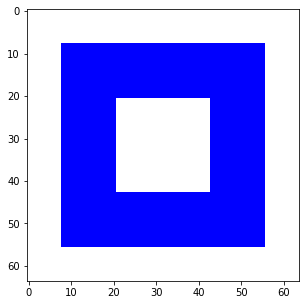

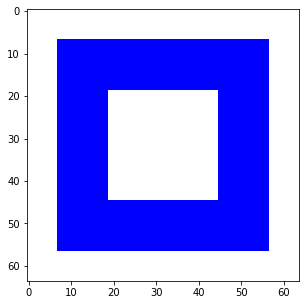

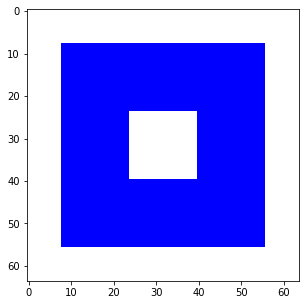

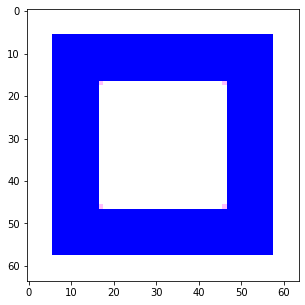

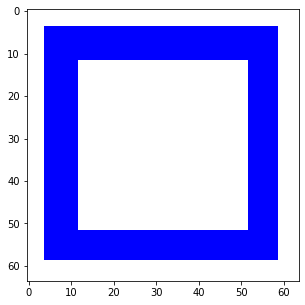

...

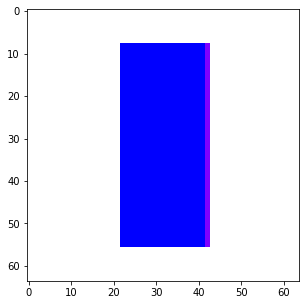

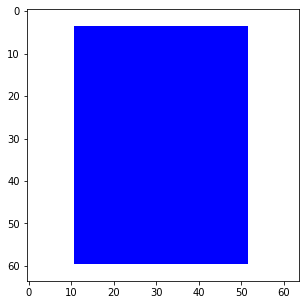

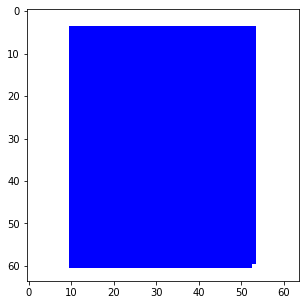

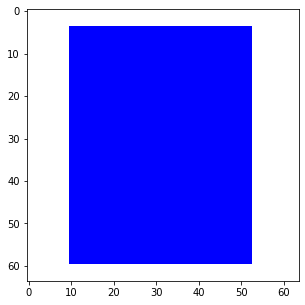

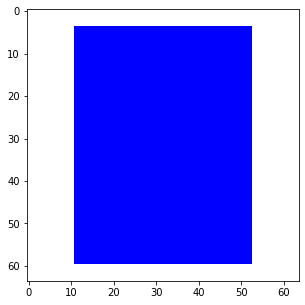

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

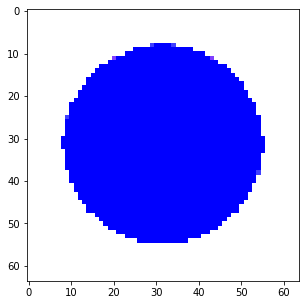

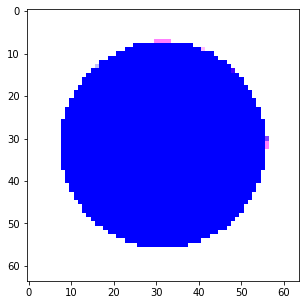

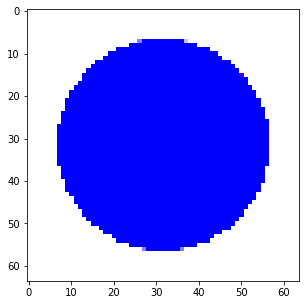

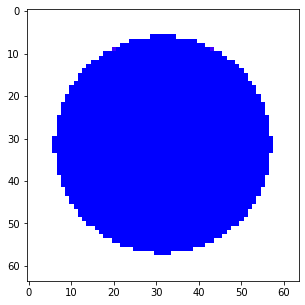

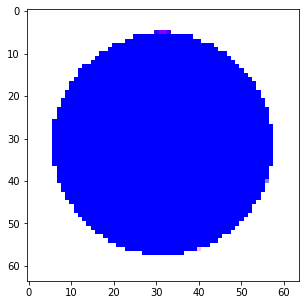

...

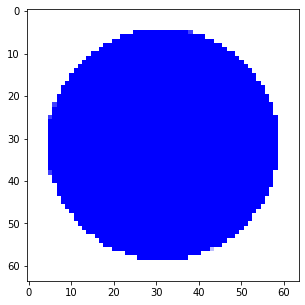

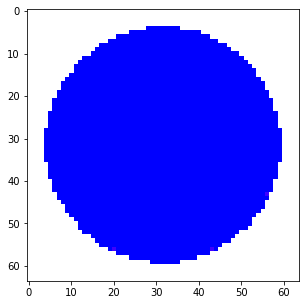

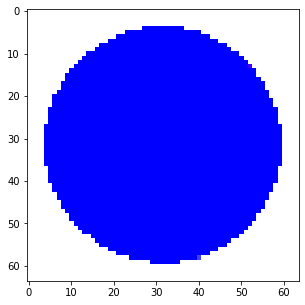

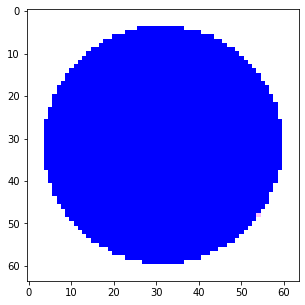

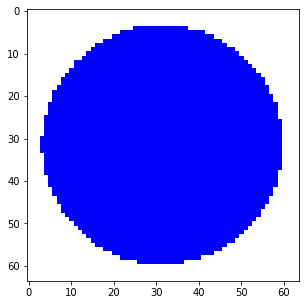

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

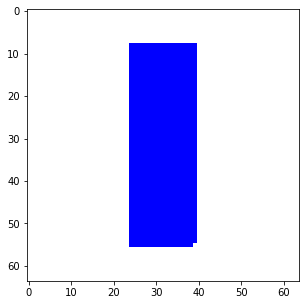

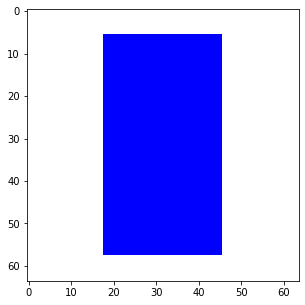

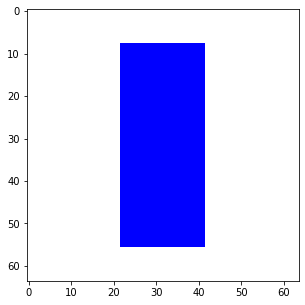

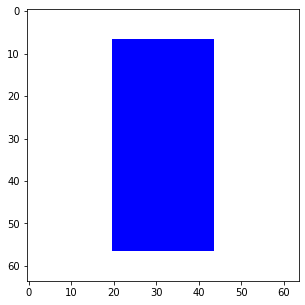

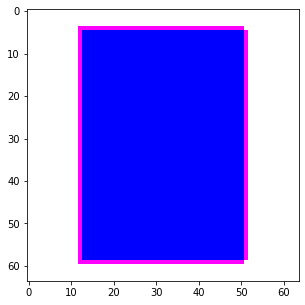

...

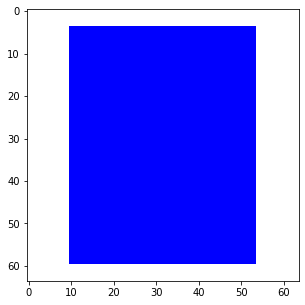

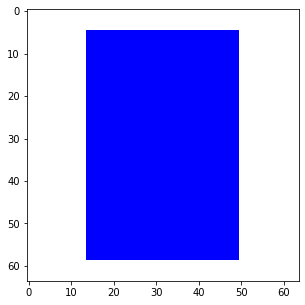

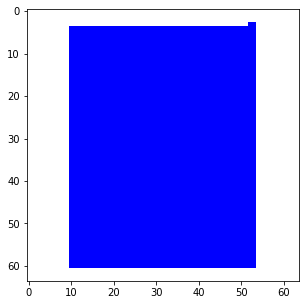

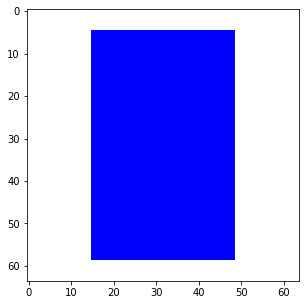

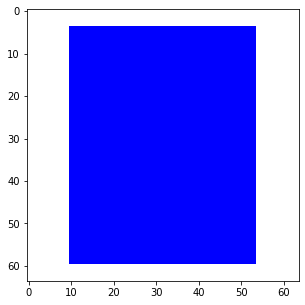

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

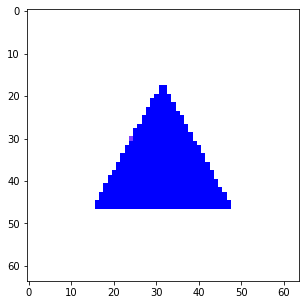

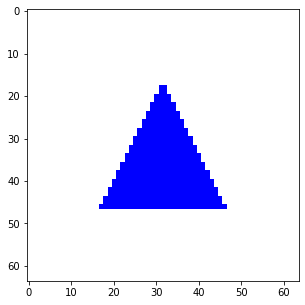

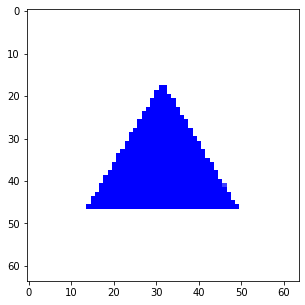

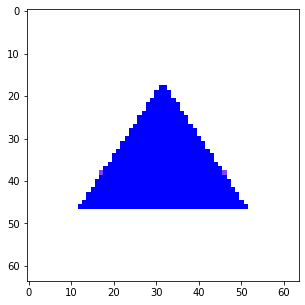

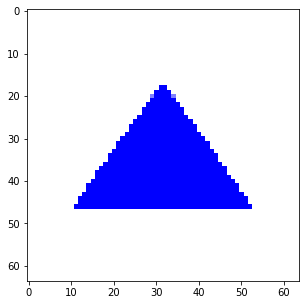

...

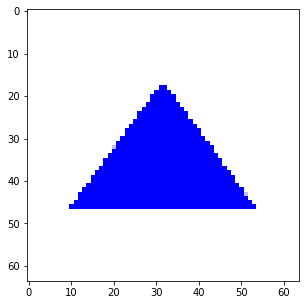

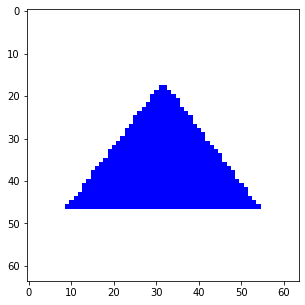

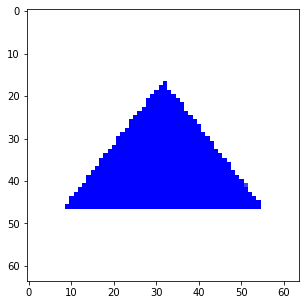

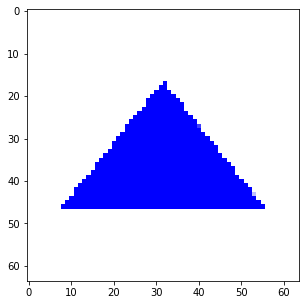

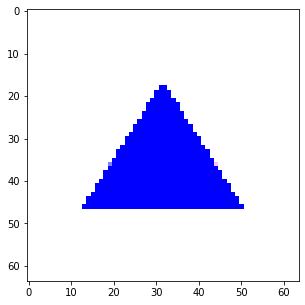

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

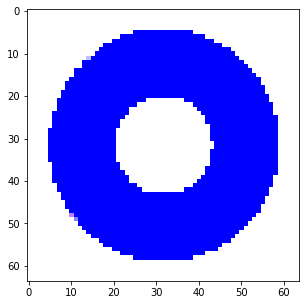

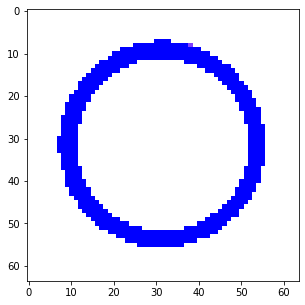

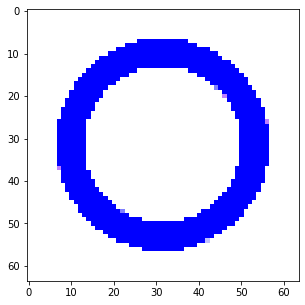

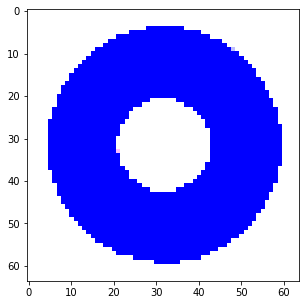

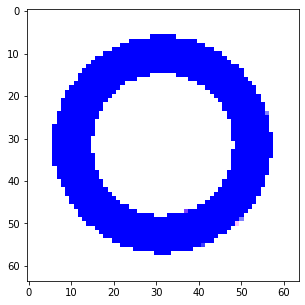

...

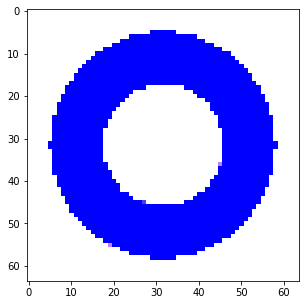

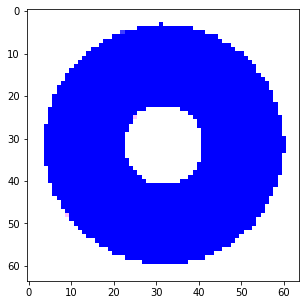

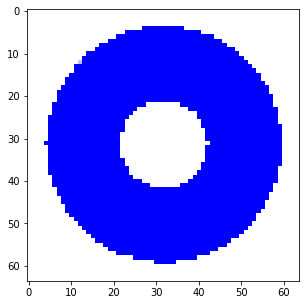

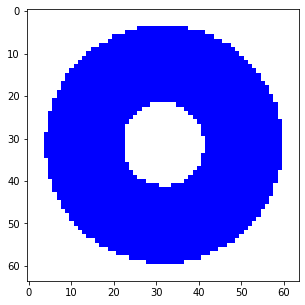

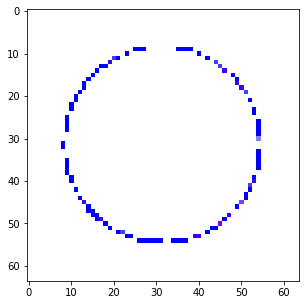

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

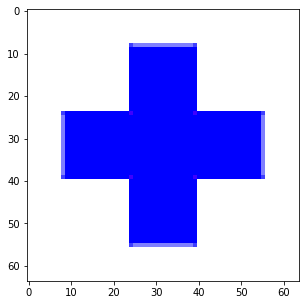

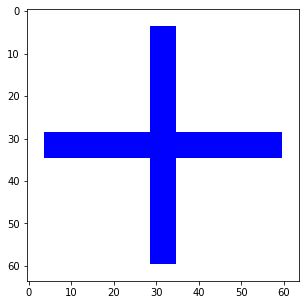

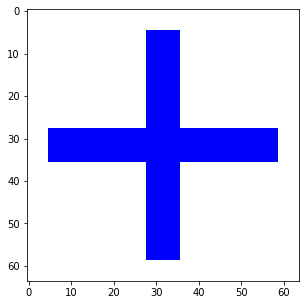

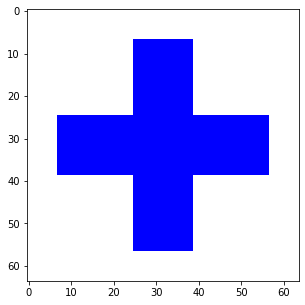

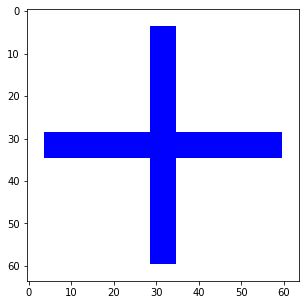

...

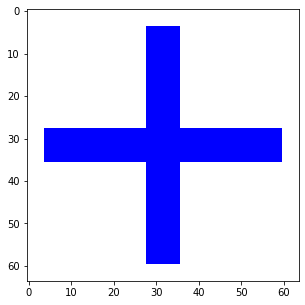

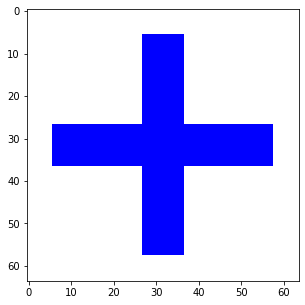

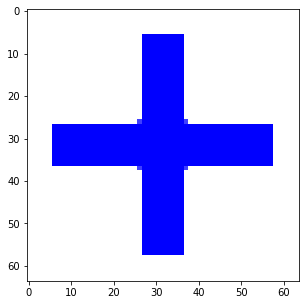

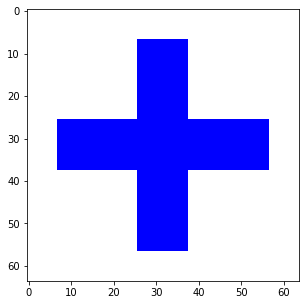

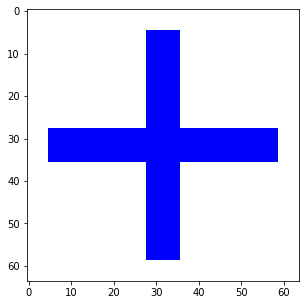

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

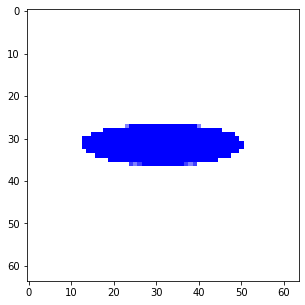

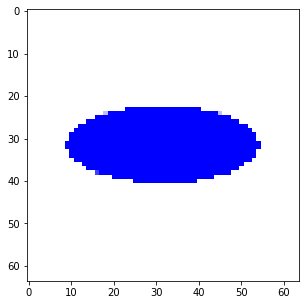

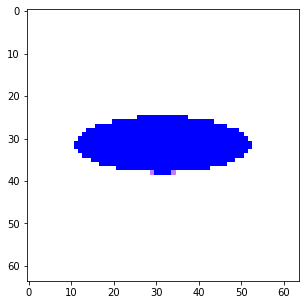

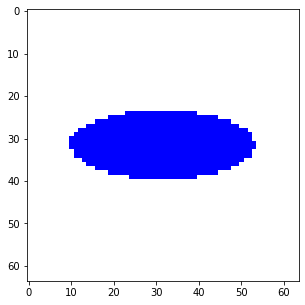

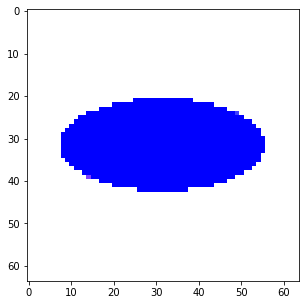

...

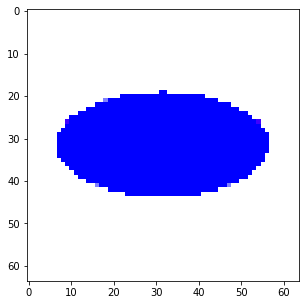

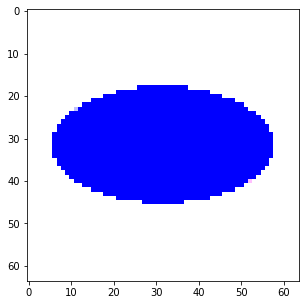

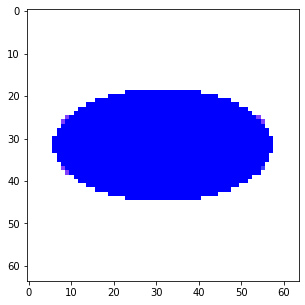

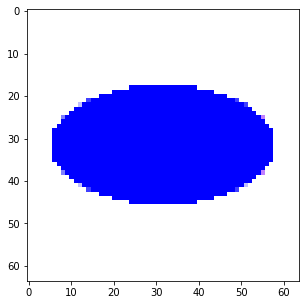

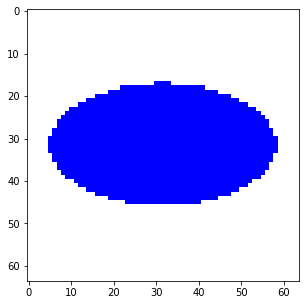

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

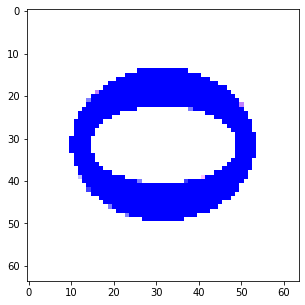

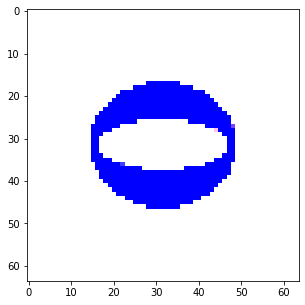

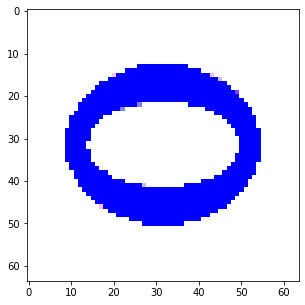

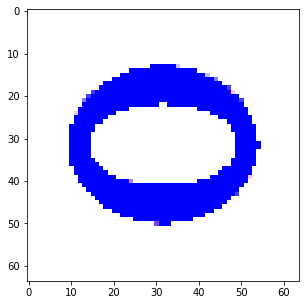

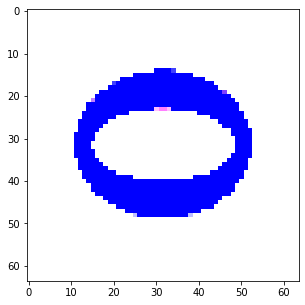

...

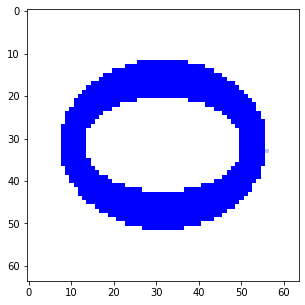

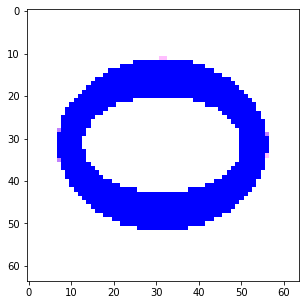

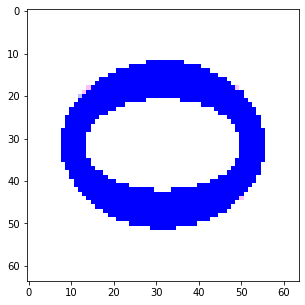

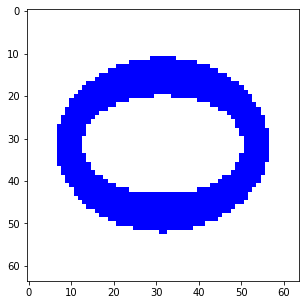

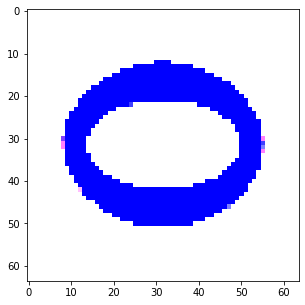

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

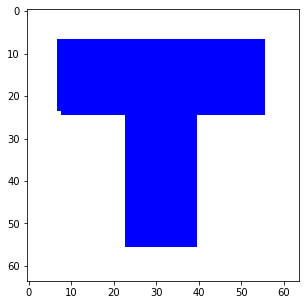

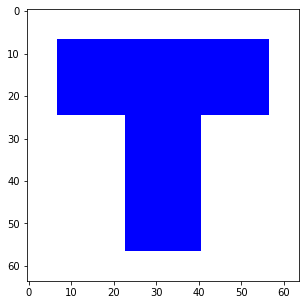

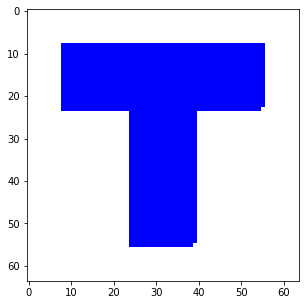

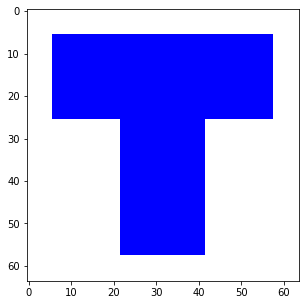

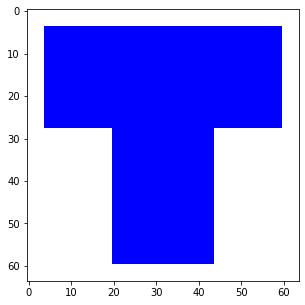

...

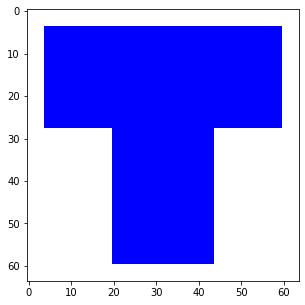

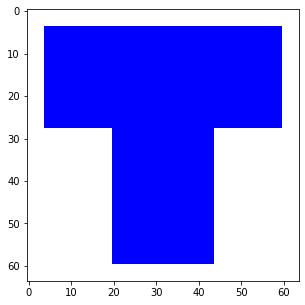

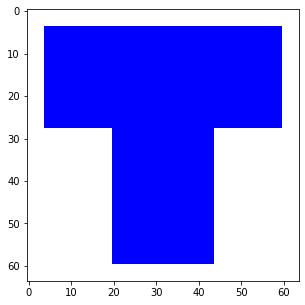

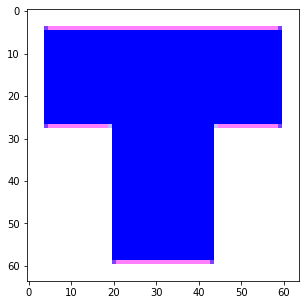

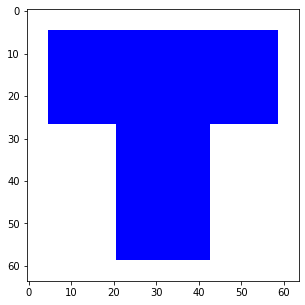

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

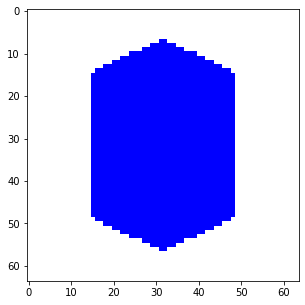

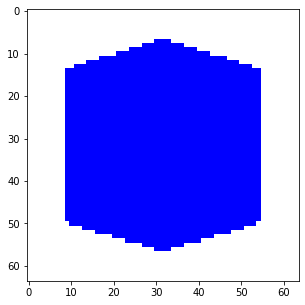

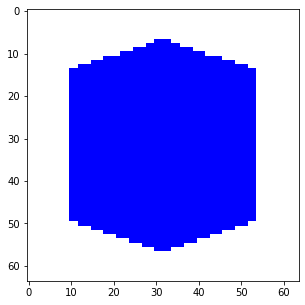

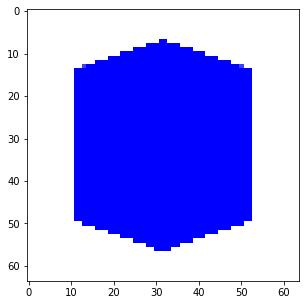

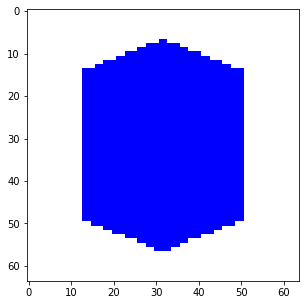

...

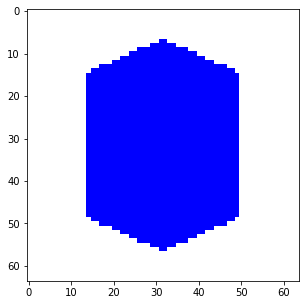

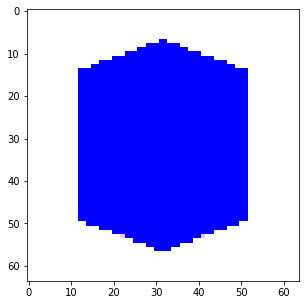

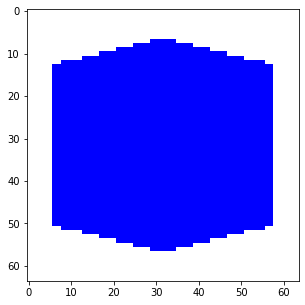

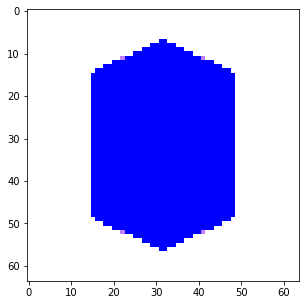

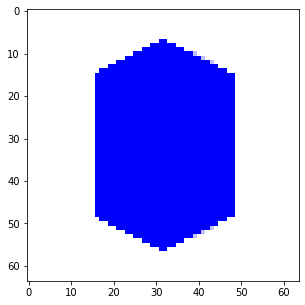

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

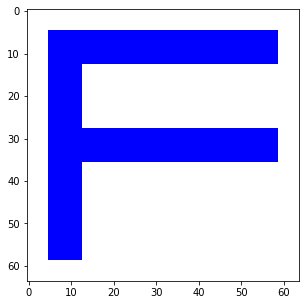

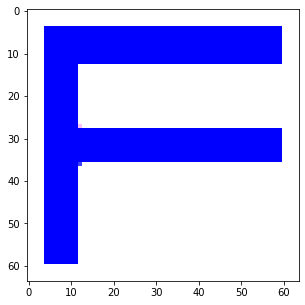

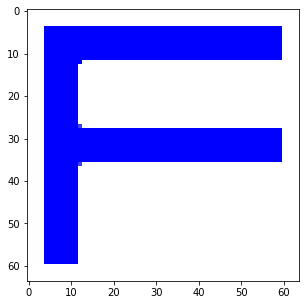

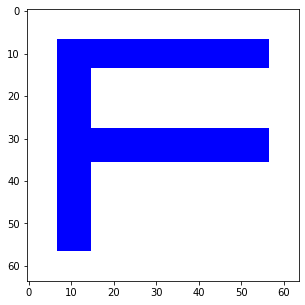

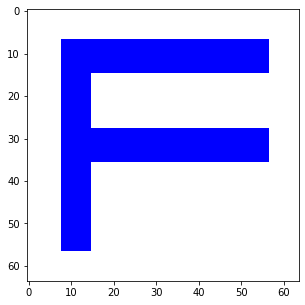

...

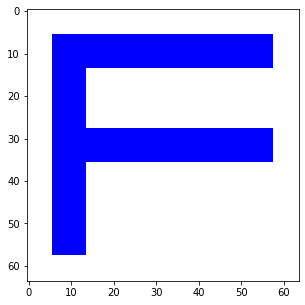

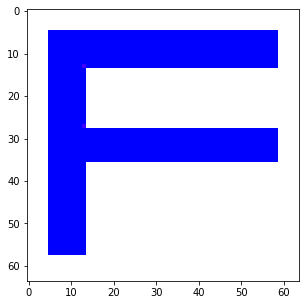

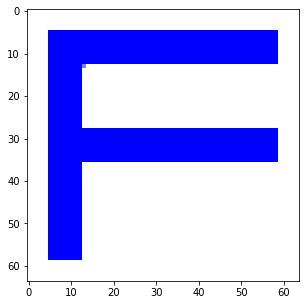

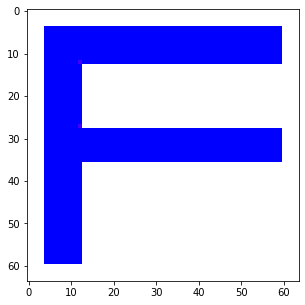

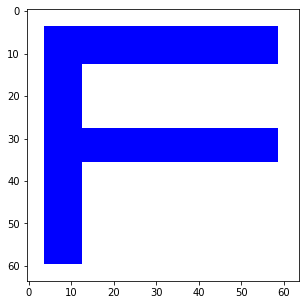

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

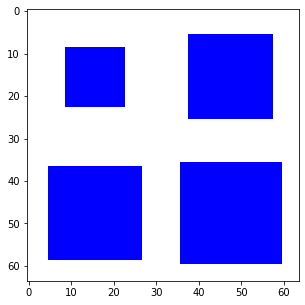

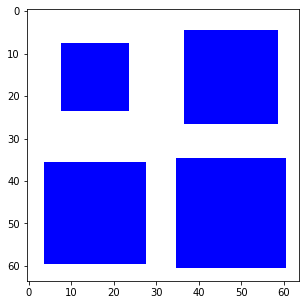

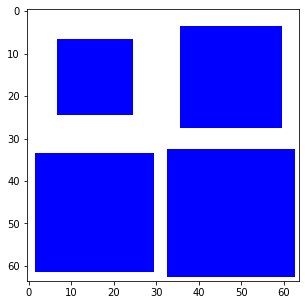

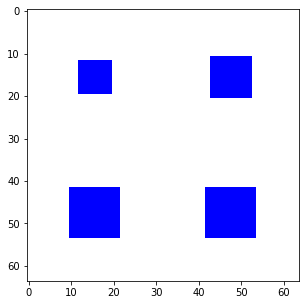

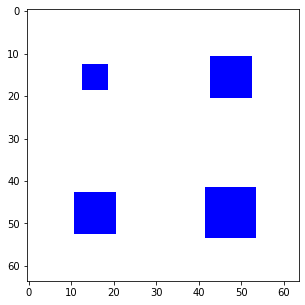

...

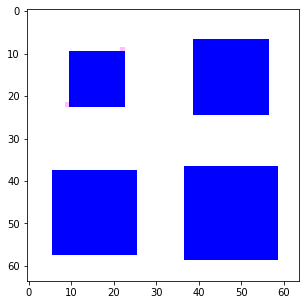

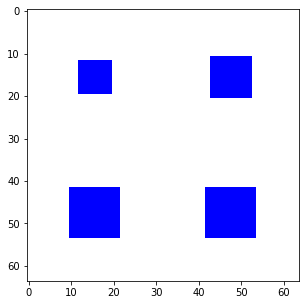

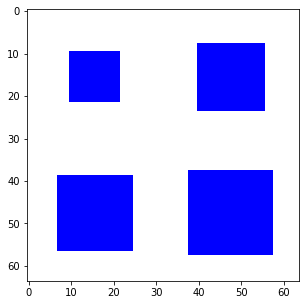

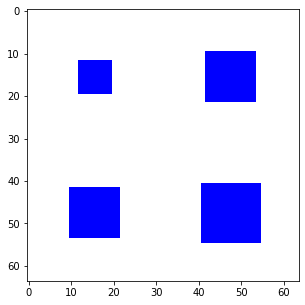

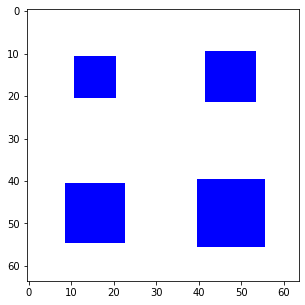

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

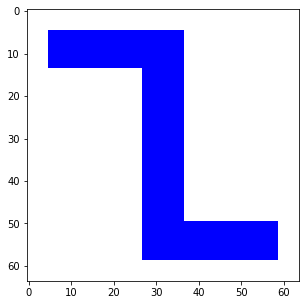

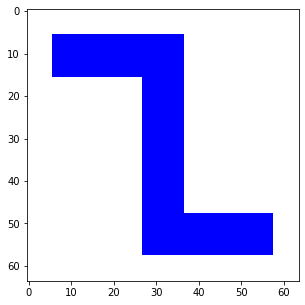

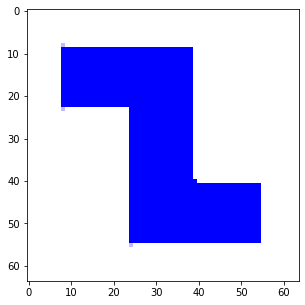

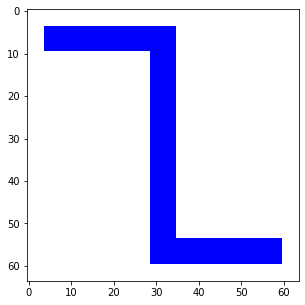

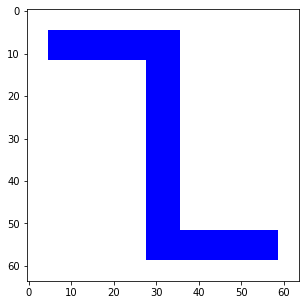

...

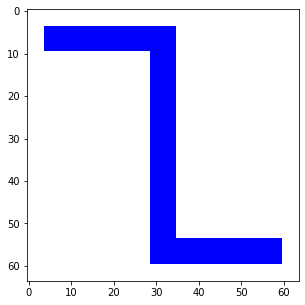

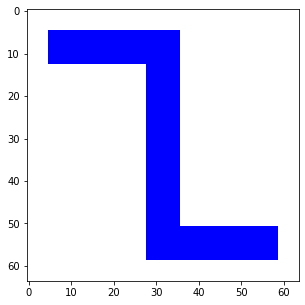

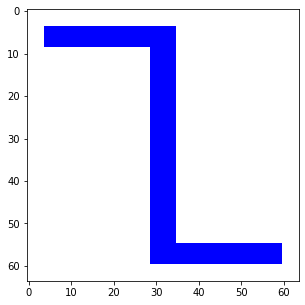

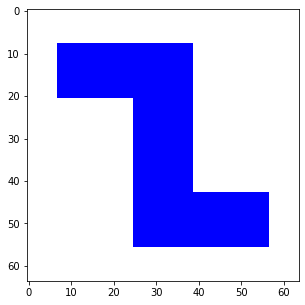

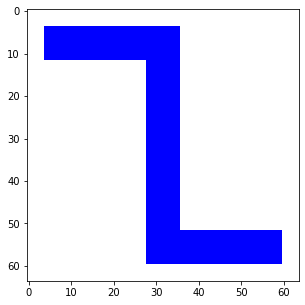

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

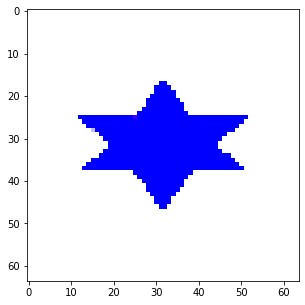

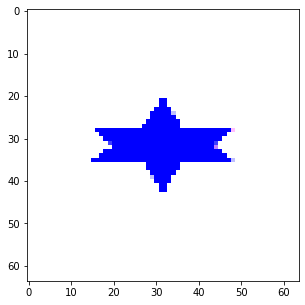

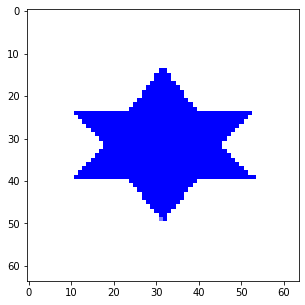

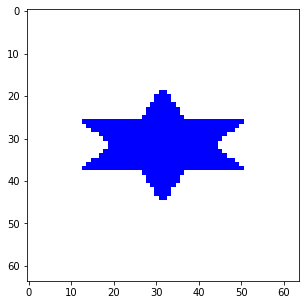

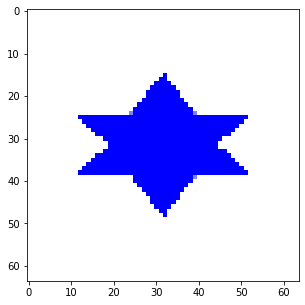

...

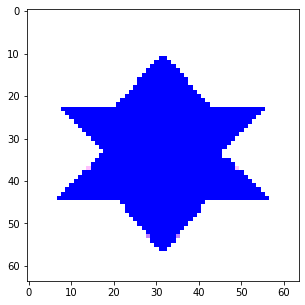

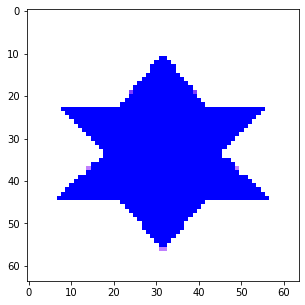

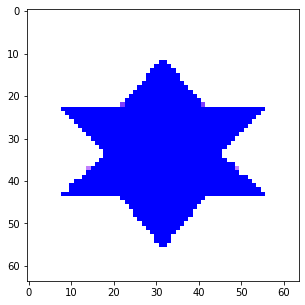

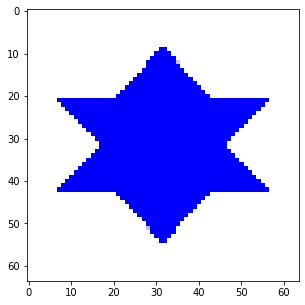

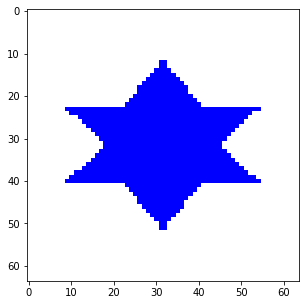

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

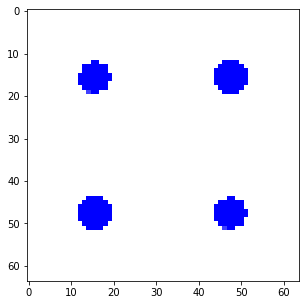

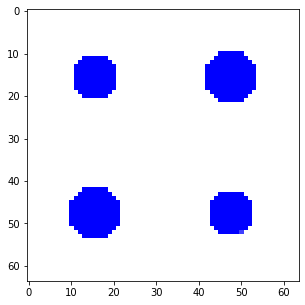

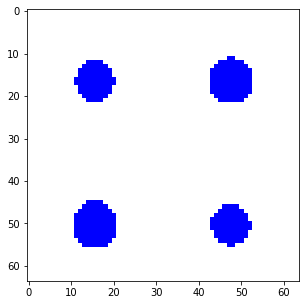

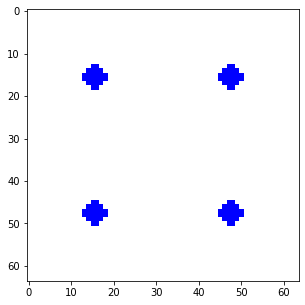

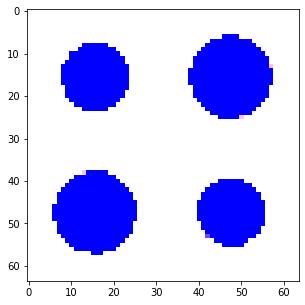

...

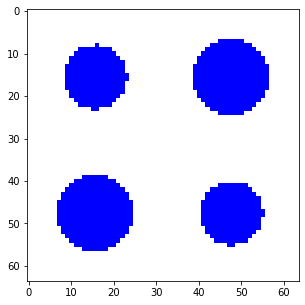

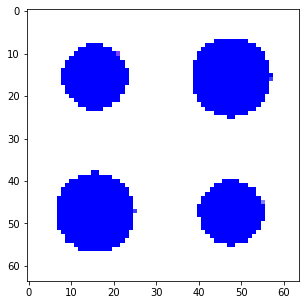

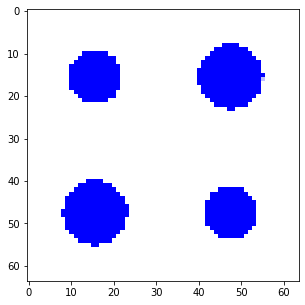

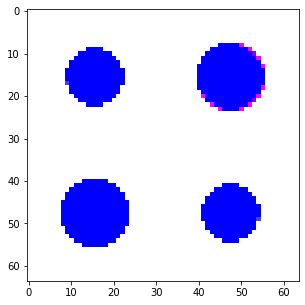

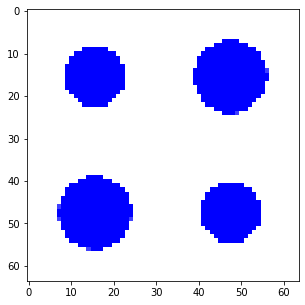

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

In [ ]:
#1 Splitting into Molybdenum square ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_ring_mo=[];
pca_Mo_sqring=[];
for i in range(len(img_sq_ring_mo)):
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_ring_mo.append(cv2.resize(img_sq_ring_mo[i], target_size))
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_ring_mo[i])

for i in range(len(f_sq_ring_mo)):
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_ring_mo[i]) 
  print ("One Channel Shape: ", blue.shape)
#blue channel
  blue_df = pd.DataFrame(data = blue)
  blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  green_df
#red channel
  red_df = pd.DataFrame(data = red)
  red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_sqring.append(rgd_pca_df_np)
  print("img_sq_ring_cr_size_pca",np.array(pca_Mo_sqring).shape)






#2 Splitting into Mo rect

f_rect_mo=[]; #1
pca_Mo_rect=[]; #2
for i in range(len(img_rect_mo)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_rect_mo.append(cv2.resize(img_rect_mo[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_rect_mo[i]) #5

for i in range(len(f_rect_mo)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_rect_mo[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)

  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]
  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_rect.append(rgd_pca_df_np)              #8
  print("img_sq_rect_mo",np.array(pca_Mo_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#2 Splitting into Mo rect

f_cyl_mo=[]; #1
pca_Mo_cyl=[]; #2
for i in range(len(img_cyl_mo)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_mo.append(cv2.resize(img_cyl_mo[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_mo[i]) #5

for i in range(len(f_cyl_mo)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_mo[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)
  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_cyl.append(rgd_pca_df_np)              #8
  print("img_sq_rect_mo",np.array(pca_Mo_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#4 Splitting into Mo square
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_mo=[]; #1
pca_Mo_sq=[]; #2
for i in range(len(img_sq_mo)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_mo.append(cv2.resize(img_sq_mo[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_mo[i]) #5

for i in range(len(f_sq_mo)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_mo[i]) #7
  #print ("One Channel Shape: ", blue.shape)
  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  #print ("Blue Data Frame")
  #print (trans_pca_b_df)

  #print ("Green Data Frame")
  #print (trans_pca_g_df)

  #print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_sq.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_Mo_sq).shape)

#5 Splitting into Mo triangle

f_tri_mo=[]; #1
pca_Mo_tri=[]; #2
for i in range(len(img_triangle_mo)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_tri_mo.append(cv2.resize(img_triangle_mo[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_tri_mo[i]) #5

for i in range(len(f_tri_mo)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_tri_mo[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df

  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_tri.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_Mo_sq).shape)


#6 Splitting into chromium img_cir_ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_cir_ring_mo=[]; #1
pca_Mo_cir_ring=[]; #2
for i in range(len(img_cir_ring_mo)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cir_ring_mo.append(cv2.resize(img_cir_ring_mo[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cir_ring_mo[i]) #5

for i in range(len(f_cir_ring_mo)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cir_ring_mo[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_cir_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_mo",np.array(pca_Mo_cir_ring).shape)

#7 Splitting into chromium img_cross
f_cross_mo=[]; #1
pca_Mo_cross=[]; #2
for i in range(len(img_cross_mo)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cross_mo.append(cv2.resize(img_cross_mo[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cross_mo[i]) #5
for i in range(len(f_cross_mo)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cross_mo[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_cross.append(rgd_pca_df_np)              #8
  print("img_cir_ring_cr",np.array(pca_Mo_cir_ring).shape)
#Its shape is now 4608x1 instead of 64x72




#8 Splitting into chromium img_ellipse

f_ellipse_mo=[]; #1
pca_Mo_ellipse=[]; #2
for i in range(len(img_ellipse_mo)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_ellipse_mo.append(cv2.resize(img_ellipse_mo[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_ellipse_mo[i]) #5

for i in range(len(f_ellipse_mo)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_ellipse_mo[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_ellipse.append(rgd_pca_df_np)              #8
  print("img_ellipse_mo",np.array(pca_Mo_cir_ring).shape)

#8 Splitting into mo _elliptical_ring

f_elliptical_ring_mo=[]; #1
pca_Mo_elliptical_ring=[]; #2
for i in range(len(img_elliptical_ring_mo)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_elliptical_ring_mo.append(cv2.resize(img_elliptical_ring_mo[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_elliptical_ring_mo[i]) #5

for i in range(len(f_elliptical_ring_mo)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_elliptical_ring_mo[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_elliptical_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_mo",np.array(pca_Mo_cir_ring).shape)

#10 Splitting into chromium _T shaped

f_T_mo=[]; #1
pca_Mo_T=[]; #2
for i in range(len(img_T_mo)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_T_mo.append(cv2.resize(img_T_mo[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_T_mo[i]) #5

for i in range(len(f_T_mo)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_T_mo[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_T.append(rgd_pca_df_np)              #8
  print("img_T_mo",np.array(pca_Mo_T).shape)

#10 Splitting into chromium Hexagon

f_hex_mo=[]; #1
pca_Mo_hex=[]; #2
for i in range(len(img_hex_mo)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_hex_mo.append(cv2.resize(img_hex_mo[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_hex_mo[i]) #5
for i in range(len(f_hex_mo)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_hex_mo[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_hex.append(rgd_pca_df_np)              #8
  print("img_hex_mo",np.array(pca_Mo_hex).shape)


#11 Splitting into chromium F-shaped

f_F_mo=[]; #1
pca_Mo_F=[]; #2
for i in range(len(img_F_mo)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_F_mo.append(cv2.resize(img_F_mo[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_F_mo[i]) #5

for i in range(len(f_F_mo)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_F_mo[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_F.append(rgd_pca_df_np)              #8
  print("img_hex_mo",np.array(pca_Mo_F).shape)


#12 Splitting into chromium Square SC
f_sq_SC_mo=[]; #1
pca_Mo_sq_SC=[]; #2
for i in range(len(img_sq_SC_mo)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_SC_mo.append(cv2.resize(img_sq_SC_mo[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_SC_mo[i]) #5

for i in range(len(f_sq_SC_mo)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_SC_mo[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_sq_SC.append(rgd_pca_df_np)              #8
  print("img_hex_sq_SC",np.array(pca_Mo_sq_SC).shape)

#13 Splitting into chromium Z shaped
f_Z_mo=[]; #1
pca_Mo_Z=[]; #2
for i in range(len(img_Z_mo)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_Z_mo.append(cv2.resize(img_Z_mo[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_Z_mo[i]) #5

for i in range(len(f_Z_mo)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_Z_mo[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)
  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_Z.append(rgd_pca_df_np)              #8
  print("img_Z_mo",np.array(pca_Mo_Z).shape)



#14 Splitting into chromium star
f_star_mo=[]; #1
pca_Mo_star=[]; #2
for i in range(len(img_star_mo)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_star_mo.append(cv2.resize(img_star_mo[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_star_mo[i]) #5

for i in range(len(f_star_mo)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_star_mo[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)
  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_star.append(rgd_pca_df_np)              #8
  print("img_Z_mo",np.array(pca_Mo_Z).shape)

#16 Splitting into chromium cyl_Sc

f_cyl_SC_mo=[]; #1
pca_Mo_cyl_SC=[]; #2
for i in range(len(img_cyl_SC_mo)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_SC_mo.append(cv2.resize(img_cyl_SC_mo[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_SC_mo[i]) #5

for i in range(len(f_cyl_SC_mo)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_SC_mo[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Mo_cyl_SC.append(rgd_pca_df_np)              #8
  print("img_Z_mo",np.array(pca_Mo_cyl_SC).shape)



#

In [ ]:
reps = (25,1)
all_pca_sqring_mo =np.tile(pca_Mo_sqring,reps) #1
all_pca_rect_mo=np.tile(pca_Mo_rect,reps) #2
all_pca_cyl_mo =np.tile(pca_Mo_cyl,reps) #3
all_pca_sq_mo = np.tile(pca_Mo_sq,reps) #4
all_pca_tri_mo = np.tile(pca_Mo_tri,reps)#5
all_pca_cir_ring_mo = np.tile(pca_Mo_cir_ring,reps) #6
all_pca_cross_mo = np.tile(pca_Mo_cross,reps) #7
all_pca_ellipse_mo = np.tile(pca_Mo_ellipse,reps) #8
all_pca_elliptical_ring_mo = np.tile(pca_Mo_elliptical_ring,reps) #9
all_pca_T_mo = np.tile(pca_Mo_T,reps)#10
all_pca_hex_mo = np.tile(pca_Mo_hex,reps)#11
all_pca_F_mo = np.tile(pca_Mo_F,reps) #12
all_pca_sq_SC_mo = np.tile(pca_Mo_sq_SC,reps) #13
all_pca_Z_mo=np.tile(pca_Mo_Z,reps)
all_pca_star_mo=np.tile(pca_Mo_star,reps)
all_pca_cyl_SC_mo=np.tile(pca_Mo_cyl_SC,reps)
print(all_pca_cross_mo.shape)

(325, 1920)


In [ ]:

all_img_Mo= np.concatenate((all_pca_sqring_mo,all_pca_rect_mo,all_pca_cyl_mo,all_pca_sq_mo,all_pca_tri_mo,all_pca_cir_ring_mo,all_pca_cross_mo,all_pca_ellipse_mo,all_pca_elliptical_ring_mo,all_pca_T_mo,all_pca_hex_mo,all_pca_F_mo,all_pca_sq_SC_mo,all_pca_Z_mo,all_pca_star_mo,all_pca_cyl_SC_mo ),axis=0)
all_img_Mo= np.concatenate((all_pca_sqring_mo,all_pca_rect_mo,all_pca_cyl_mo,all_pca_sq_mo,all_pca_tri_mo,all_pca_cir_ring_mo,all_pca_cross_mo,all_pca_ellipse_mo ),axis=0)
print(all_img_Mo.shape)

(2600, 1920)


# Niobium

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (6, 1920

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (12, 1920)
One Channel Shape:  (64,

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:87: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:98: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:98: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:101: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:101: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:98: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:175: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:178: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:181: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:175: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:178: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:181: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:175: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:178: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:181: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_nb (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:255: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:258: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:261: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (1, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (2, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (3, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (4, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (5, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (6, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (7, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:255: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:258: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:261: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (8, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (9, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (10, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (11, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (12, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:326: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:334: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:334: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:334: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

(64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:414: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:417: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:420: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:414: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:417: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:420: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (1, 1920)
img_cir_ring_nb (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:414: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:417: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:420: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:489: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:492: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:495: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:489: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:492: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:495: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:489: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:492: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:495: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin


Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:570: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:573: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_nb (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:570: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:573: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_nb (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:570: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:573: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_nb (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:649: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:652: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:655: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:649: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:652: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:655: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:649: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:652: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:655: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_nb (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:728: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:731: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:734: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_nb (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_nb (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_nb (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_nb (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_nb (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:728: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:731: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:734: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_nb (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_nb (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_nb (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_nb (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_nb (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_nb (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:734: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:728: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:731: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_nb (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_nb (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:806: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:809: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:812: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:806: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:809: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:812: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

(1, 1920)
img_hex_nb (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (10, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:806: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:809: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:812: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:886: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:889: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:892: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:886: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:889: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:892: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:886: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:889: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:892: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin


Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_nb (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:964: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:967: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:970: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape: 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:964: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:967: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:970: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (10, 1920)
One Channel Shape:  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:970: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:964: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:967: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

(64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1044: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1047: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1050: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1044: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1047: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1050: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (10, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1044: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1047: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1050: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1124: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1127: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1124: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1127: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1124: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1127: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1202: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1208: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1202: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1208: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (9, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1202: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1208: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_nb (13, 1920)


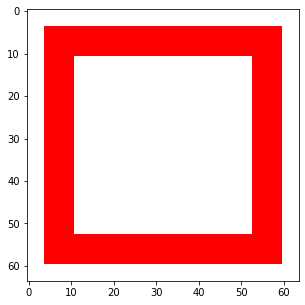

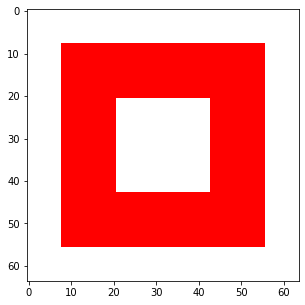

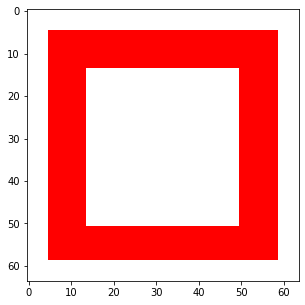

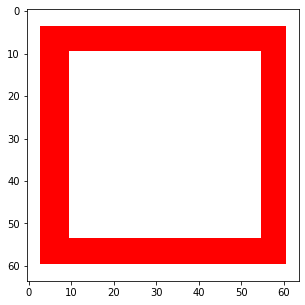

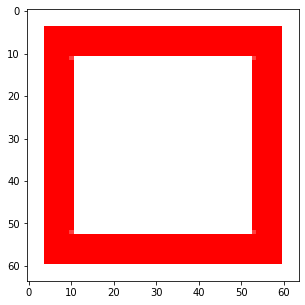

...

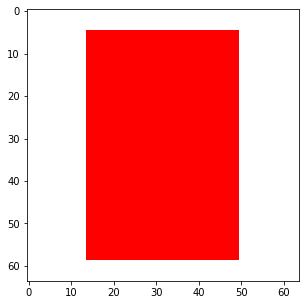

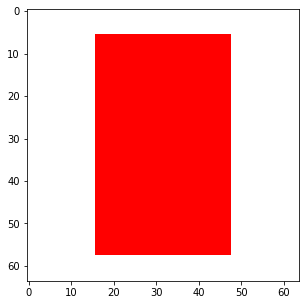

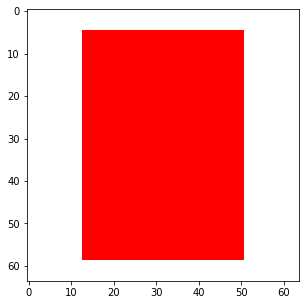

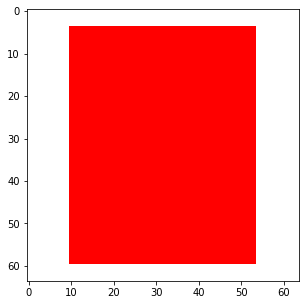

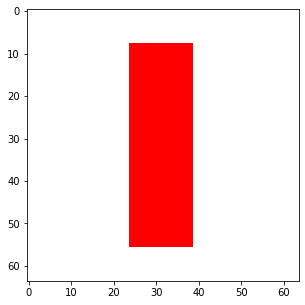

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

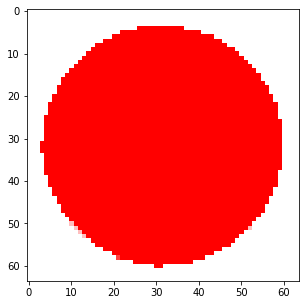

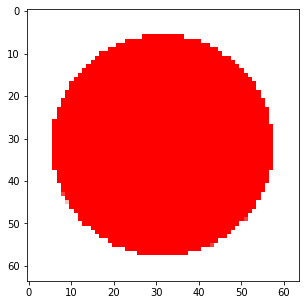

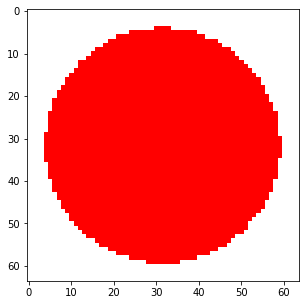

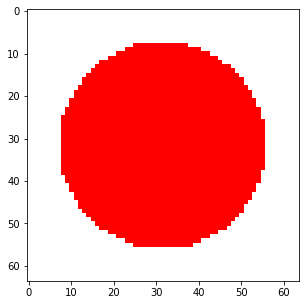

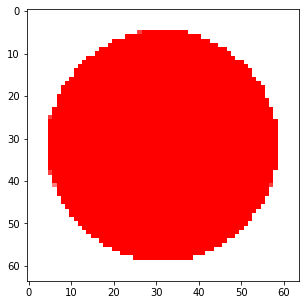

...

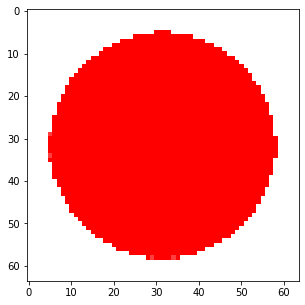

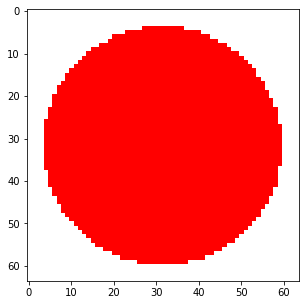

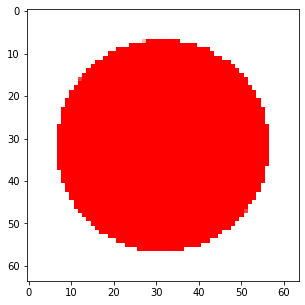

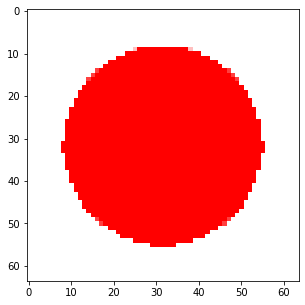

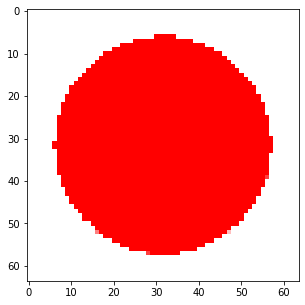

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

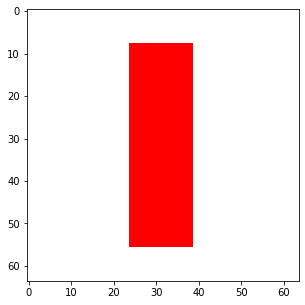

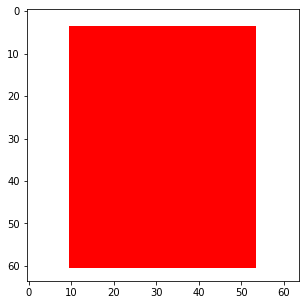

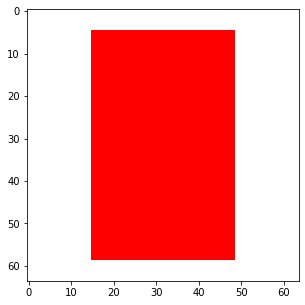

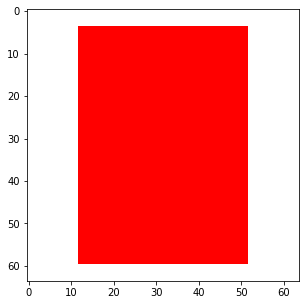

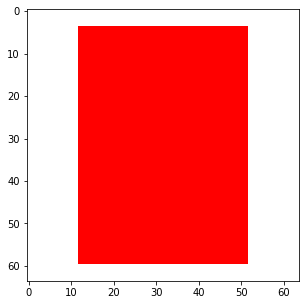

...

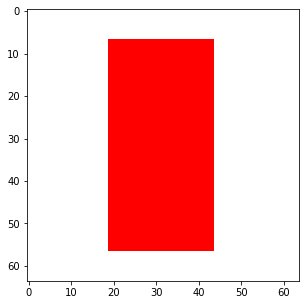

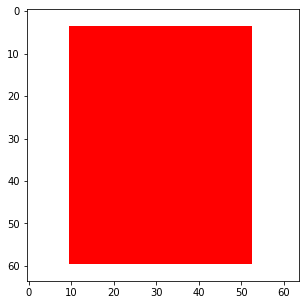

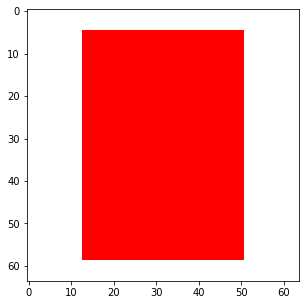

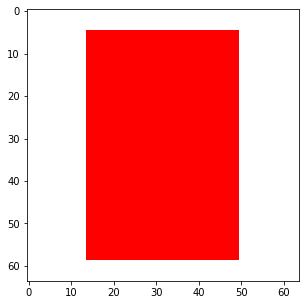

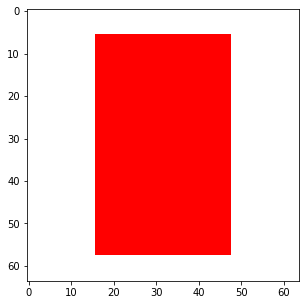

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

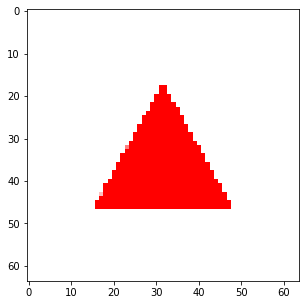

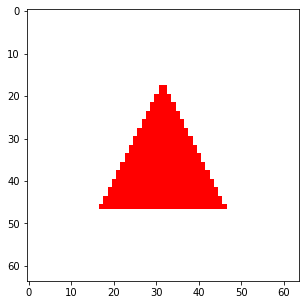

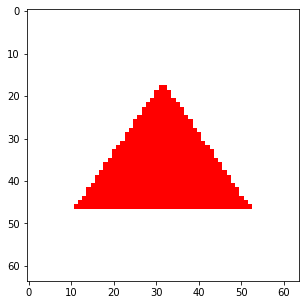

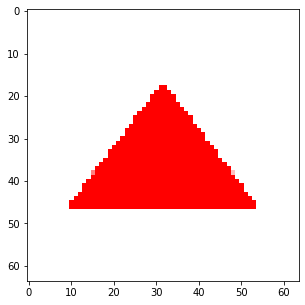

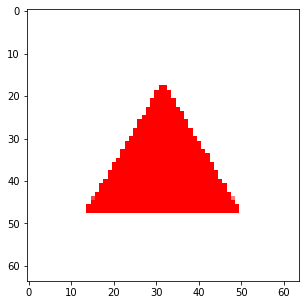

...

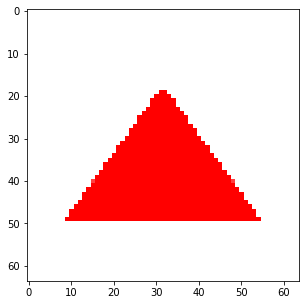

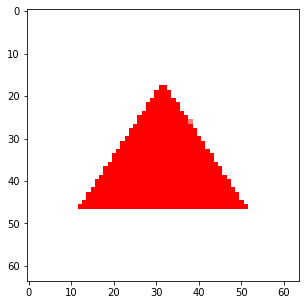

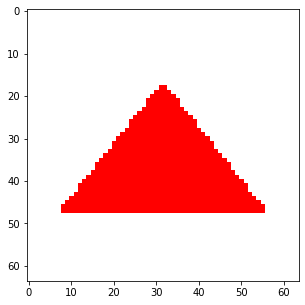

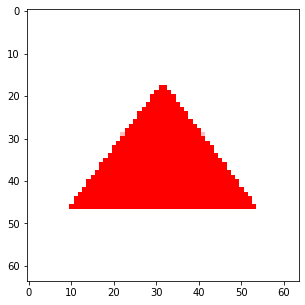

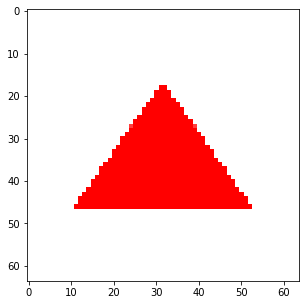

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

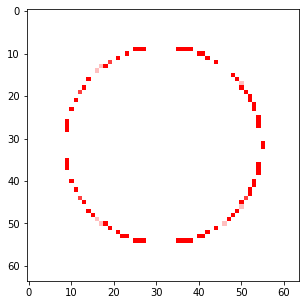

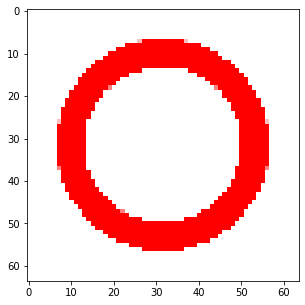

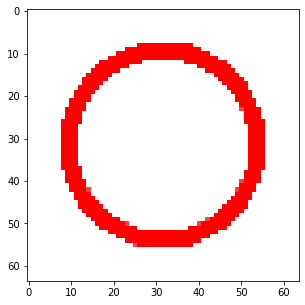

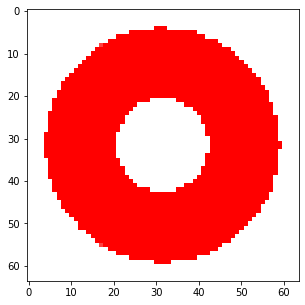

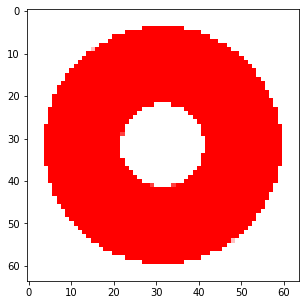

...

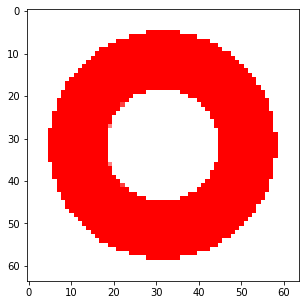

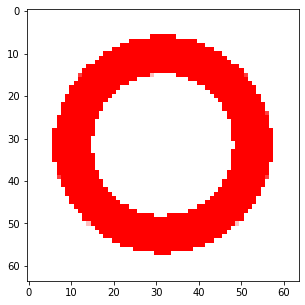

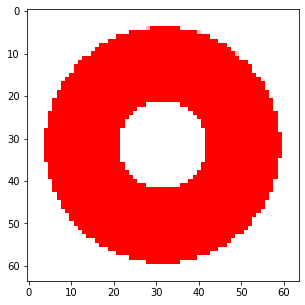

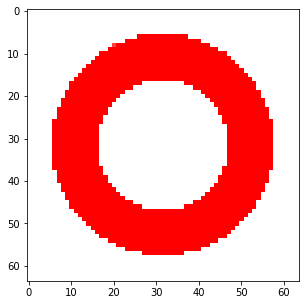

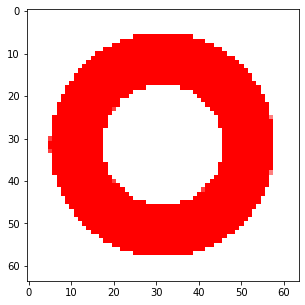

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

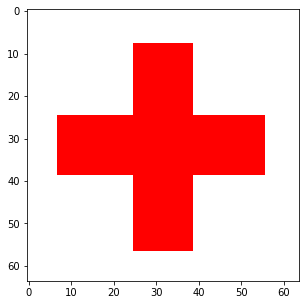

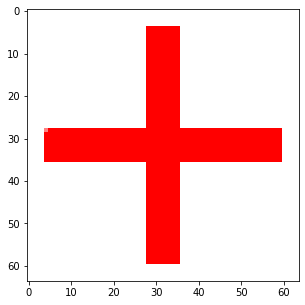

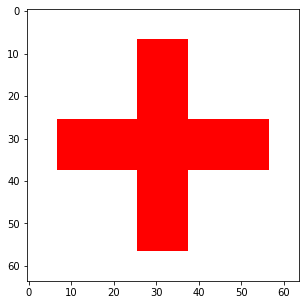

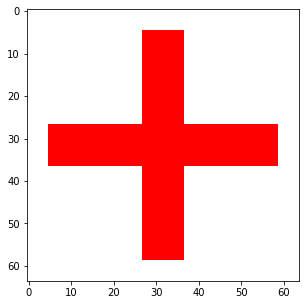

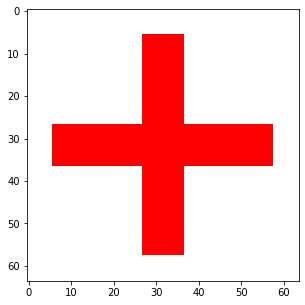

...

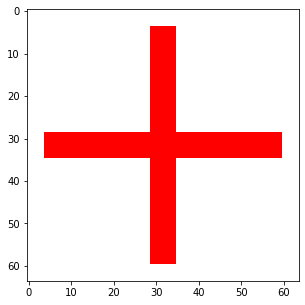

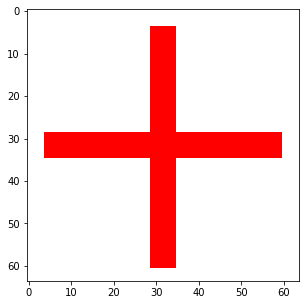

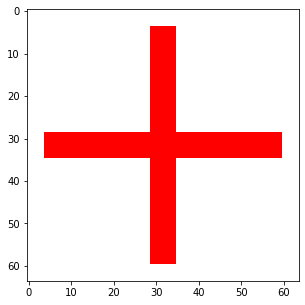

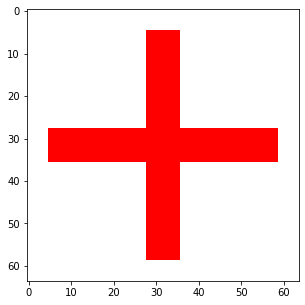

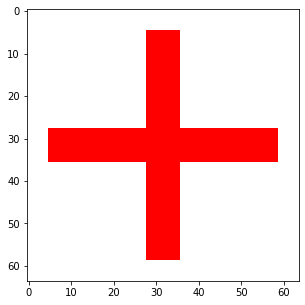

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

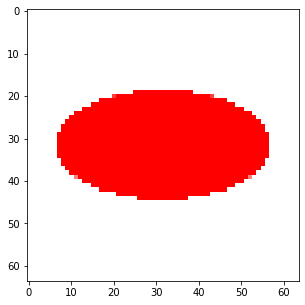

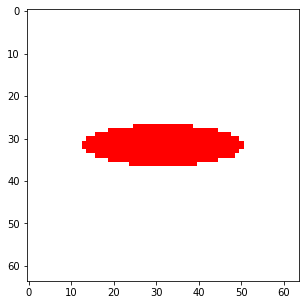

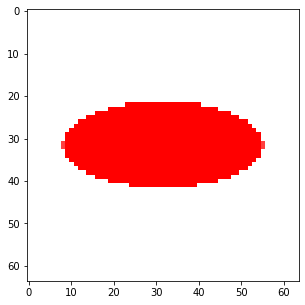

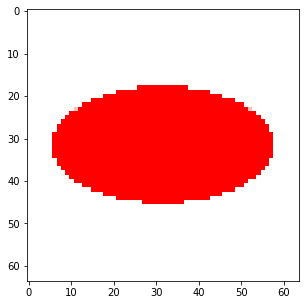

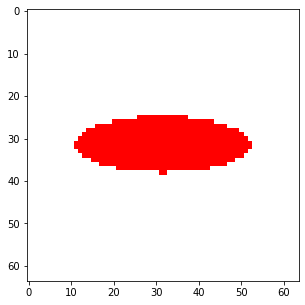

...

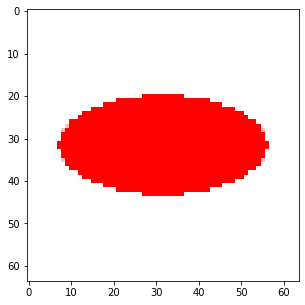

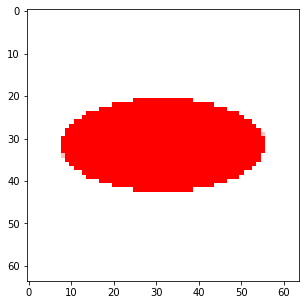

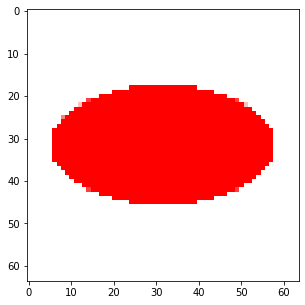

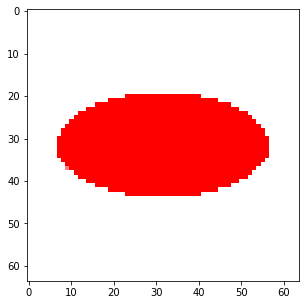

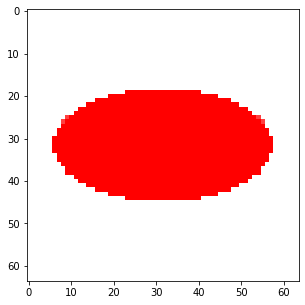

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

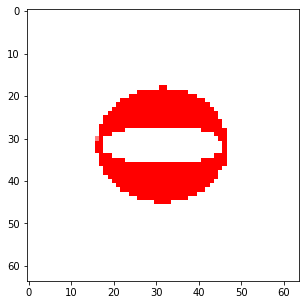

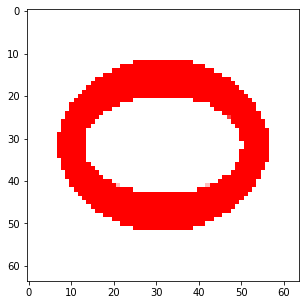

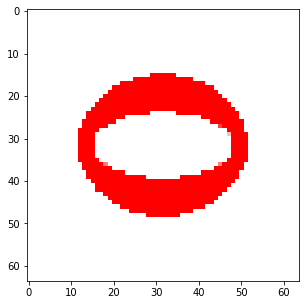

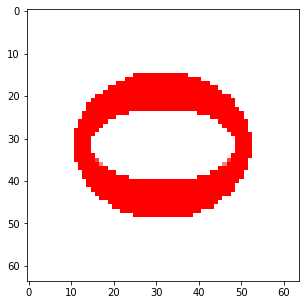

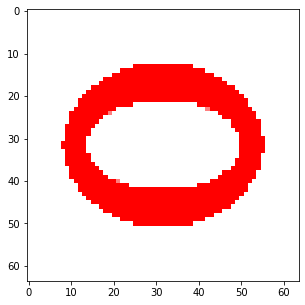

...

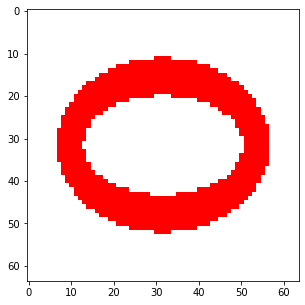

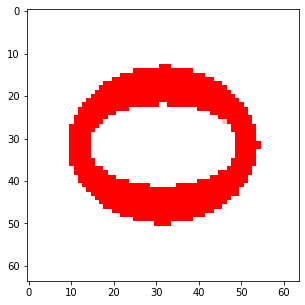

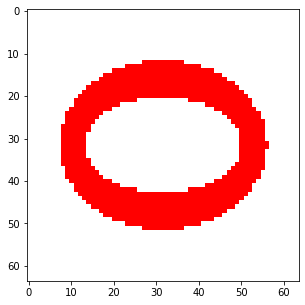

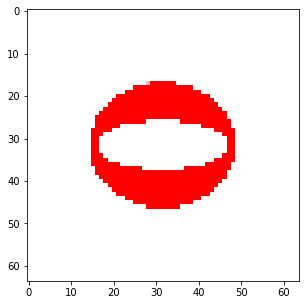

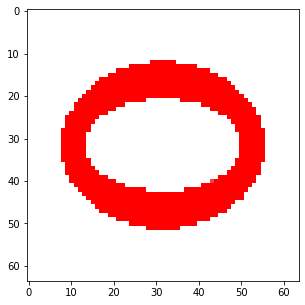

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

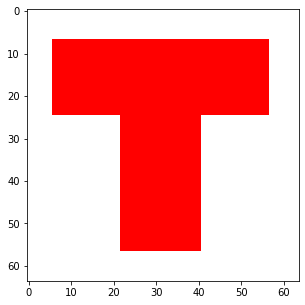

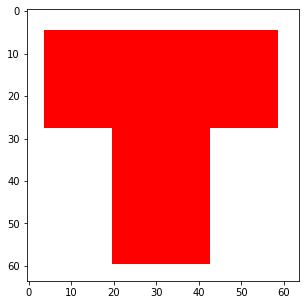

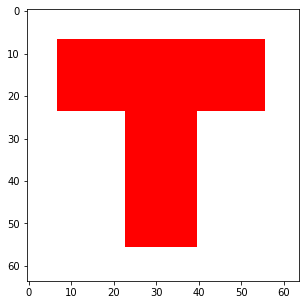

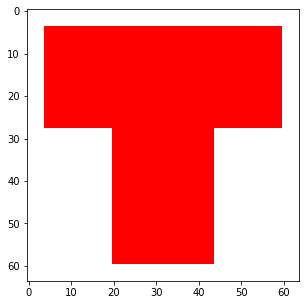

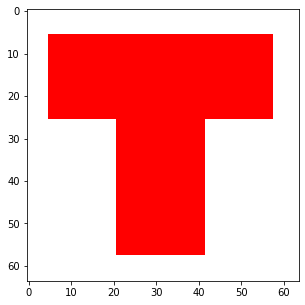

...

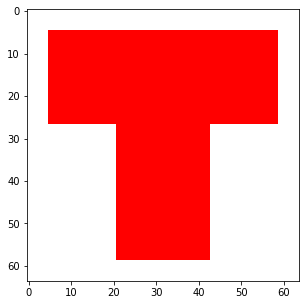

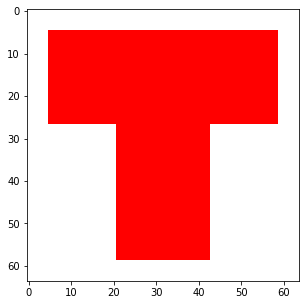

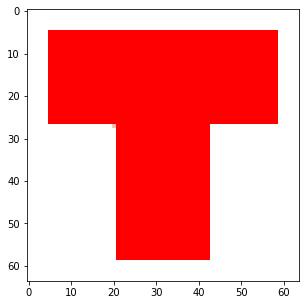

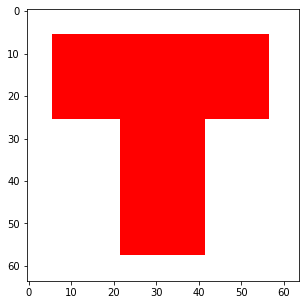

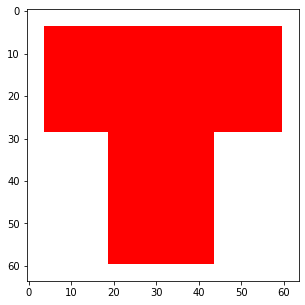

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

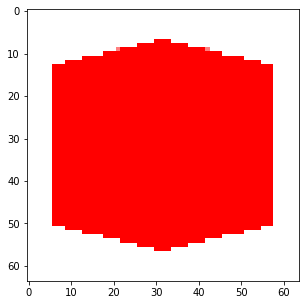

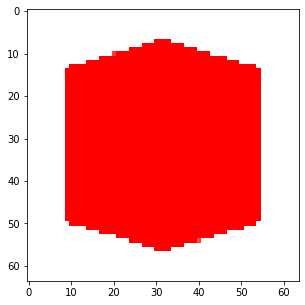

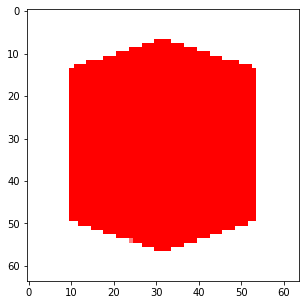

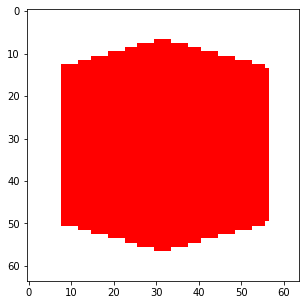

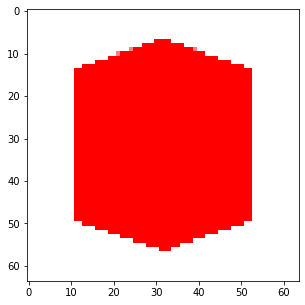

...

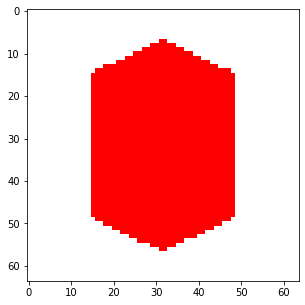

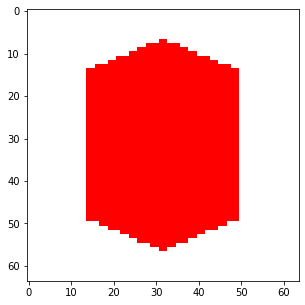

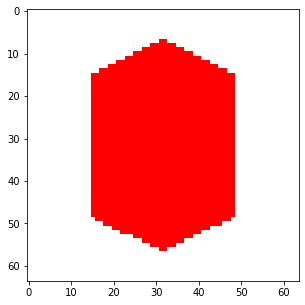

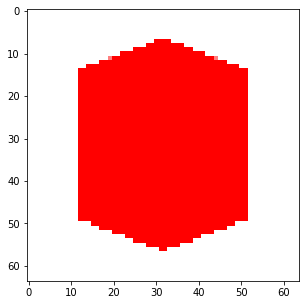

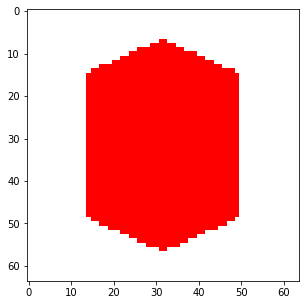

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

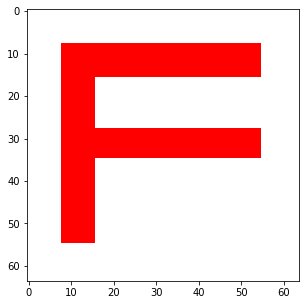

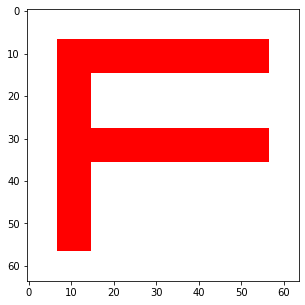

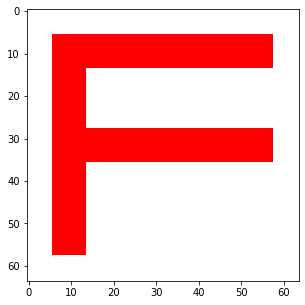

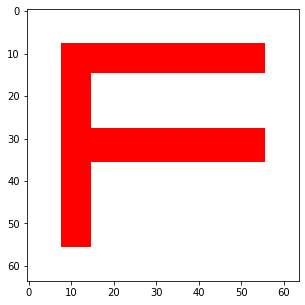

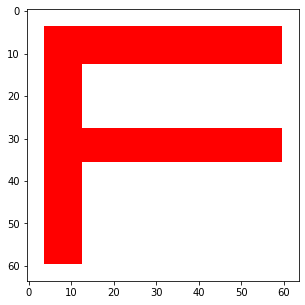

...

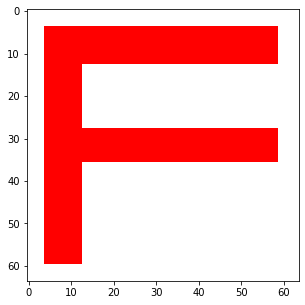

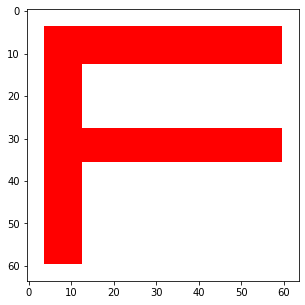

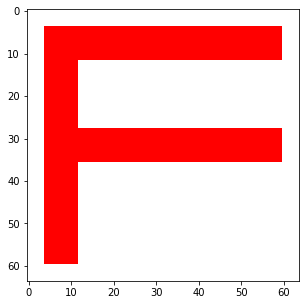

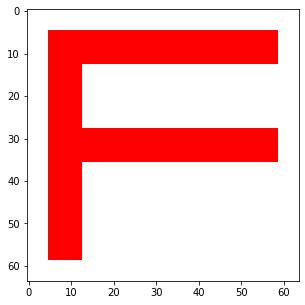

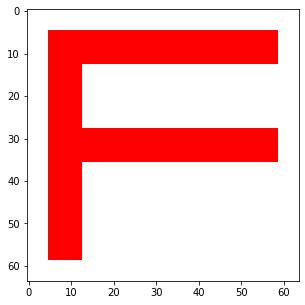

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

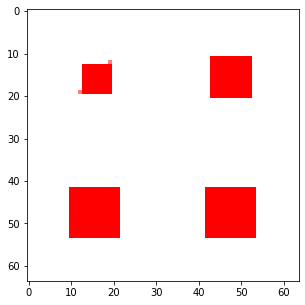

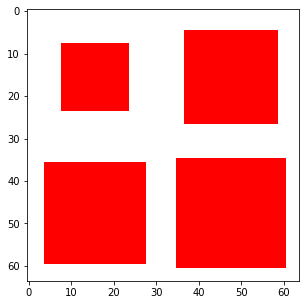

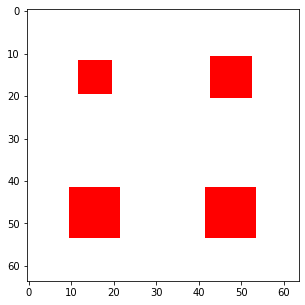

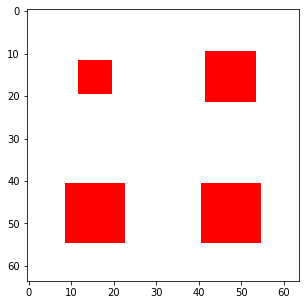

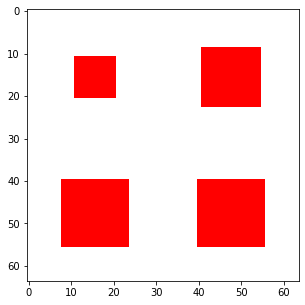

...

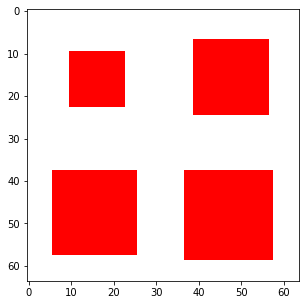

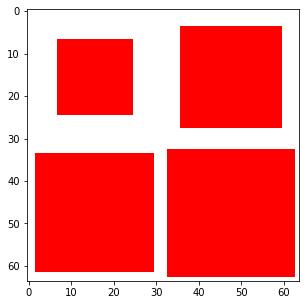

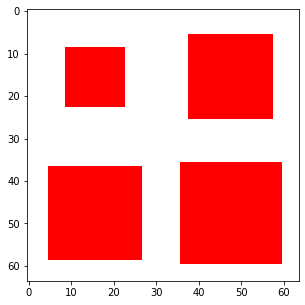

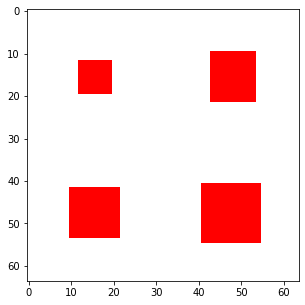

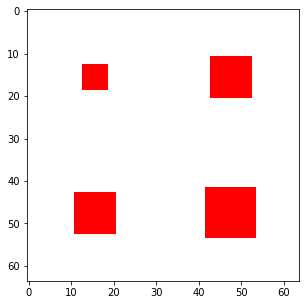

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

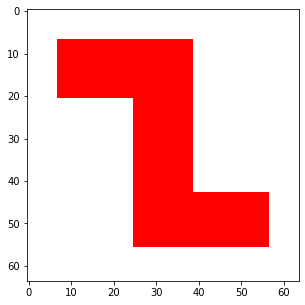

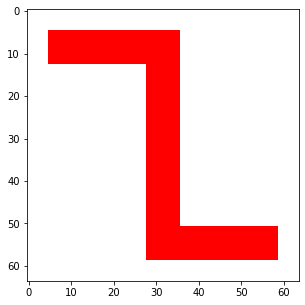

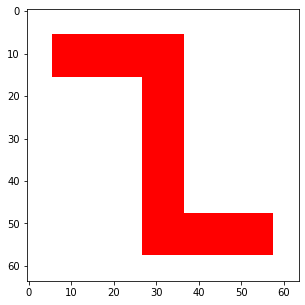

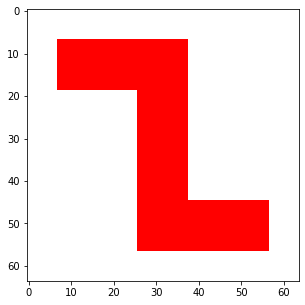

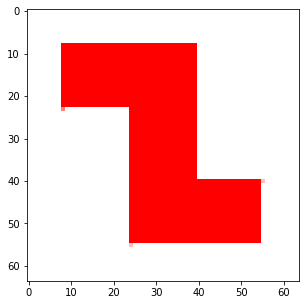

...

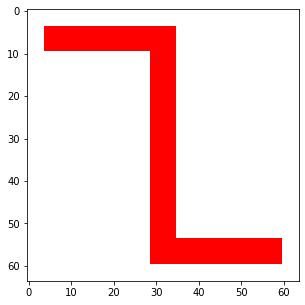

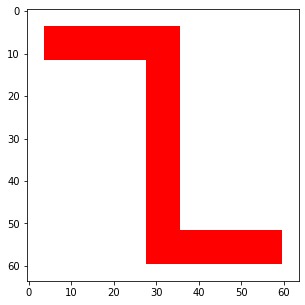

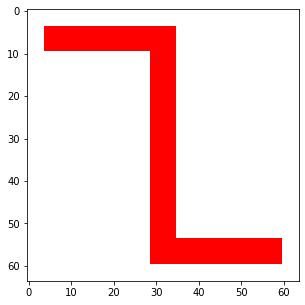

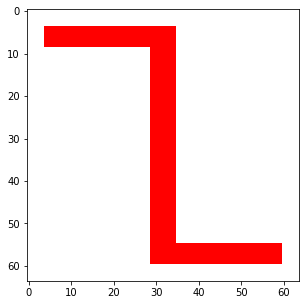

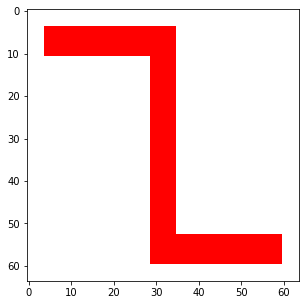

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

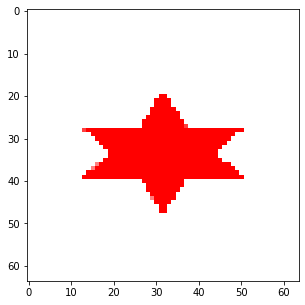

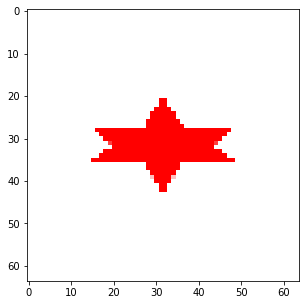

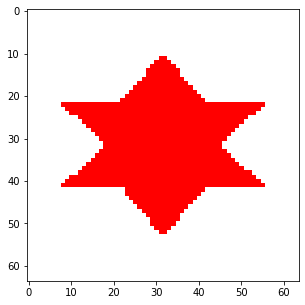

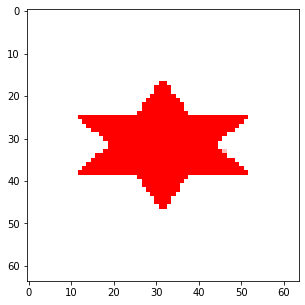

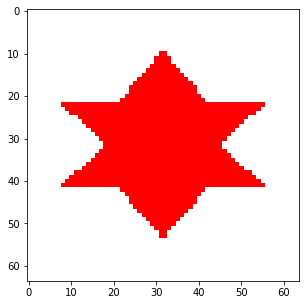

...

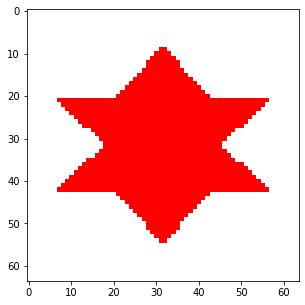

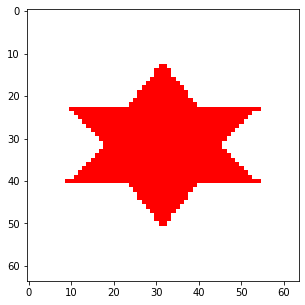

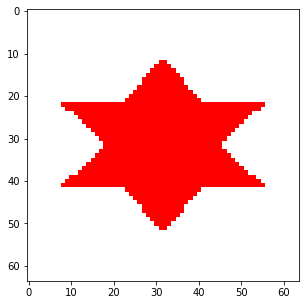

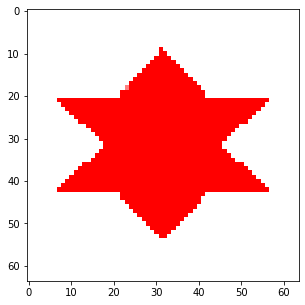

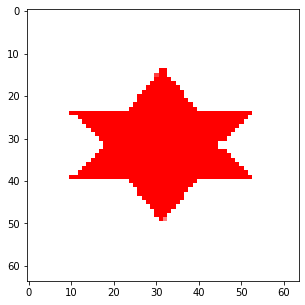

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

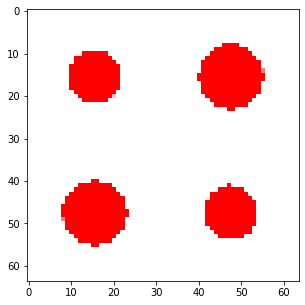

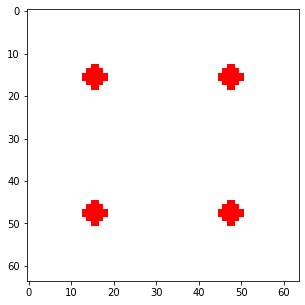

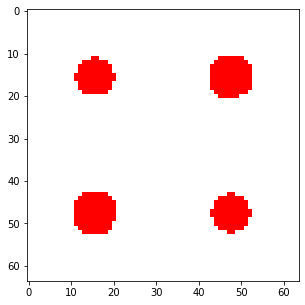

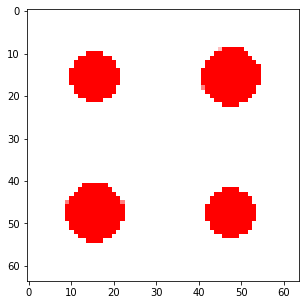

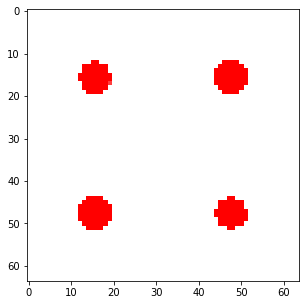

...

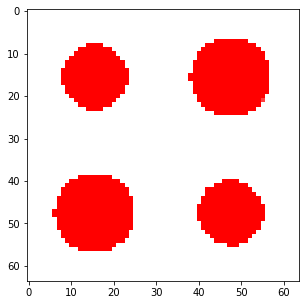

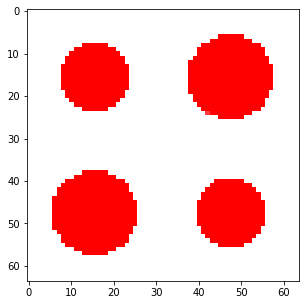

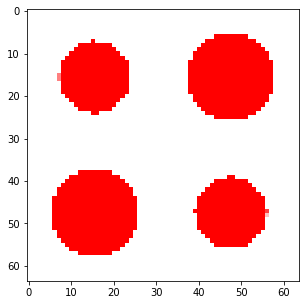

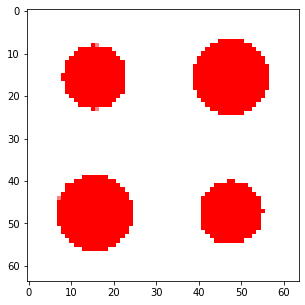

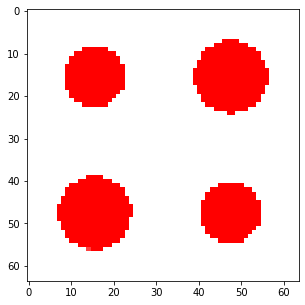

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

In [ ]:
#1 Splitting into Nb square ring
i=0

target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_ring_nb=[];
pca_Nb_sqring=[];
for i in range(len(img_sq_ring_nb)):
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_ring_nb.append(cv2.resize(img_sq_ring_nb[i], target_size))
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_ring_nb[i])

for i in range(len(f_sq_ring_nb)):
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_ring_nb[i]) 
  print ("One Channel Shape: ", blue.shape)
#blue channel
  blue_df = pd.DataFrame(data = blue)
  blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  green_df
#red channel
  red_df = pd.DataFrame(data = red)
  red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_sqring.append(rgd_pca_df_np)
  print("img_sq_ring_cr_size_pca",np.array(pca_Nb_sqring).shape)





#2 Splitting into Nb rect

f_rect_nb=[]; #1
pca_Nb_rect=[]; #2
for i in range(len(img_rect_nb)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_rect_nb.append(cv2.resize(img_rect_nb[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_rect_nb[i]) #5

for i in range(len(f_rect_nb)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_rect_nb[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)

  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]
  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_rect.append(rgd_pca_df_np)              #8
  print("img_sq_rect_nb",np.array(pca_Nb_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#2 Splitting into Nb rect

f_cyl_nb=[]; #1
pca_Nb_cyl=[]; #2
for i in range(len(img_cyl_nb)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_nb.append(cv2.resize(img_cyl_nb[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_nb[i]) #5

for i in range(len(f_cyl_nb)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_nb[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)
  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_cyl.append(rgd_pca_df_np)              #8
  print("img_sq_rect_nb",np.array(pca_Nb_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#4 Splitting into Nb square
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_nb=[]; #1
pca_Nb_sq=[]; #2
for i in range(len(img_sq_nb)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_nb.append(cv2.resize(img_sq_nb[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_nb[i]) #5

for i in range(len(f_sq_nb)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_nb[i]) #7
  #print ("One Channel Shape: ", blue.shape)
  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  #print ("Blue Data Frame")
  #print (trans_pca_b_df)

  #print ("Green Data Frame")
  #print (trans_pca_g_df)

  #print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_sq.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_Nb_sq).shape)

#5 Splitting into Nb triangle

f_tri_nb=[]; #1
pca_Nb_tri=[]; #2
for i in range(len(img_triangle_nb)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_tri_nb.append(cv2.resize(img_triangle_nb[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_tri_nb[i]) #5

for i in range(len(f_tri_nb)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_tri_nb[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df

  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_tri.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_Nb_sq).shape)

#6 Splitting into chromium img_cir_ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_cir_ring_nb=[]; #1
pca_Nb_cir_ring=[]; #2
for i in range(len(img_cir_ring_nb)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cir_ring_nb.append(cv2.resize(img_cir_ring_nb[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cir_ring_nb[i]) #5

for i in range(len(f_cir_ring_nb)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cir_ring_nb[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_cir_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_nb",np.array(pca_Nb_cir_ring).shape)

#7 Splitting into chromium img_cross
f_cross_nb=[]; #1
pca_Nb_cross=[]; #2
for i in range(len(img_cross_nb)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cross_nb.append(cv2.resize(img_cross_nb[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cross_nb[i]) #5
for i in range(len(f_cross_nb)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cross_nb[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_cross.append(rgd_pca_df_np)              #8
  print("img_cir_ring_cr",np.array(pca_Nb_cir_ring).shape)
#Its shape is now 4608x1 instead of 64x72



#8 Splitting into chromium img_ellipse

f_ellipse_nb=[]; #1
pca_Nb_ellipse=[]; #2
for i in range(len(img_ellipse_nb)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_ellipse_nb.append(cv2.resize(img_ellipse_nb[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_ellipse_nb[i]) #5

for i in range(len(f_ellipse_nb)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_ellipse_nb[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_ellipse.append(rgd_pca_df_np)              #8
  print("img_ellipse_nb",np.array(pca_Nb_cir_ring).shape)

#8 Splitting into nb _elliptical_ring

f_elliptical_ring_nb=[]; #1
pca_Nb_elliptical_ring=[]; #2
for i in range(len(img_elliptical_ring_nb)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_elliptical_ring_nb.append(cv2.resize(img_elliptical_ring_nb[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_elliptical_ring_nb[i]) #5

for i in range(len(f_elliptical_ring_nb)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_elliptical_ring_nb[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_elliptical_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_nb",np.array(pca_Nb_cir_ring).shape)

#10 Splitting into chromium _T shaped

f_T_nb=[]; #1
pca_Nb_T=[]; #2
for i in range(len(img_T_nb)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_T_nb.append(cv2.resize(img_T_nb[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_T_nb[i]) #5

for i in range(len(f_T_cr)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_T_nb[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_T.append(rgd_pca_df_np)              #8
  print("img_T_nb",np.array(pca_Nb_T).shape)

#10 Splitting into chromium Hexagon

f_hex_nb=[]; #1
pca_Nb_hex=[]; #2
for i in range(len(img_hex_nb)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_hex_nb.append(cv2.resize(img_hex_nb[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_hex_nb[i]) #5
for i in range(len(f_hex_nb)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_hex_nb[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_hex.append(rgd_pca_df_np)              #8
  print("img_hex_nb",np.array(pca_Nb_hex).shape)

#11 Splitting into chromium F-shaped

f_F_nb=[]; #1
pca_Nb_F=[]; #2
for i in range(len(img_F_nb)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_F_nb.append(cv2.resize(img_F_nb[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_F_nb[i]) #5

for i in range(len(f_F_nb)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_F_nb[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_F.append(rgd_pca_df_np)              #8
  print("img_hex_nb",np.array(pca_Nb_F).shape)

#12 Splitting into chromium Square SC
f_sq_SC_nb=[]; #1
pca_Nb_sq_SC=[]; #2
for i in range(len(img_sq_SC_nb)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_SC_nb.append(cv2.resize(img_sq_SC_nb[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_SC_nb[i]) #5

for i in range(len(f_sq_SC_nb)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_SC_nb[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_sq_SC.append(rgd_pca_df_np)              #8
  print("img_hex_sq_SC",np.array(pca_Nb_sq_SC).shape)

#13 Splitting into chromium Z shaped
f_Z_nb=[]; #1
pca_Nb_Z=[]; #2
for i in range(len(img_Z_nb)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_Z_nb.append(cv2.resize(img_Z_nb[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_Z_nb[i]) #5

for i in range(len(f_Z_nb)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_Z_nb[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)
  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_Z.append(rgd_pca_df_np)              #8
  print("img_Z_nb",np.array(pca_Nb_Z).shape)


#14 Splitting into chromium star
f_star_nb=[]; #1
pca_Nb_star=[]; #2
for i in range(len(img_star_nb)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_star_nb.append(cv2.resize(img_star_nb[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_star_nb[i]) #5

for i in range(len(f_star_nb)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_star_nb[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)
  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_star.append(rgd_pca_df_np)              #8
  print("img_Z_nb",np.array(pca_Nb_Z).shape)

#16 Splitting into chromium cyl_Sc

f_cyl_SC_nb=[]; #1
pca_Nb_cyl_SC=[]; #2
for i in range(len(img_cyl_SC_nb)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_SC_nb.append(cv2.resize(img_cyl_SC_nb[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_SC_nb[i]) #5

for i in range(len(f_cyl_SC_nb)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_SC_nb[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Nb_cyl_SC.append(rgd_pca_df_np)              #8
  print("img_Z_nb",np.array(pca_Nb_cyl_SC).shape)


#



In [ ]:
reps = (25,1)
all_pca_sqring_nb =np.tile(pca_Nb_sqring,reps) #1
all_pca_rect_nb=np.tile(pca_Nb_rect,reps) #2
all_pca_cyl_nb =np.tile(pca_Nb_cyl,reps) #3
all_pca_sq_nb = np.tile(pca_Nb_sq,reps) #4
all_pca_tri_nb = np.tile(pca_Nb_tri,reps)#5
all_pca_cir_ring_nb = np.tile(pca_Nb_cir_ring,reps) #6
all_pca_cross_nb = np.tile(pca_Nb_cross,reps) #7
all_pca_ellipse_nb = np.tile(pca_Nb_ellipse,reps) #8
all_pca_elliptical_ring_nb = np.tile(pca_Nb_elliptical_ring,reps) #9
all_pca_T_nb = np.tile(pca_Nb_T,reps)#10
all_pca_hex_nb = np.tile(pca_Nb_hex,reps)#11
all_pca_F_nb = np.tile(pca_Nb_F,reps) #12
all_pca_sq_SC_nb = np.tile(pca_Nb_sq_SC,reps) #13
all_pca_Z_nb=np.tile(pca_Nb_Z,reps) #14
all_pca_star_nb=np.tile(pca_Nb_star,reps) #15
all_pca_cyl_SC_nb=np.tile(pca_Nb_cyl_SC,reps) #16
print(all_pca_cross_nb.shape)



(325, 1920)


In [ ]:

all_img_NB= np.concatenate((all_pca_sqring_nb,all_pca_rect_nb,all_pca_cyl_nb,all_pca_sq_nb,all_pca_tri_nb,all_pca_cir_ring_nb,all_pca_cross_nb,all_pca_ellipse_nb,all_pca_elliptical_ring_nb,all_pca_T_nb,all_pca_hex_nb,all_pca_F_nb,all_pca_sq_SC_nb,all_pca_Z_nb,all_pca_star_nb,all_pca_cyl_SC_nb ),axis=0)
print(all_img_NB.shape)



(5200, 1920)


# Rhenium

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (6, 1920

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:86: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:94: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (2, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:94: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:100: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (6, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:94: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:100: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (10, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:94: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:100: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:174: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:177: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:174: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:177: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

(1, 1920)
img_sq_rect_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:174: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:177: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_re (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:174: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:177: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (1, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (2, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (3, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:254: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (4, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (5, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (6, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (7, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:254: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (8, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (9, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (10, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (11, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (12, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:254: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:333: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:339: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:333: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:339: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:333: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:339: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:333: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:339: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:413: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:416: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:419: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (2, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:413: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:416: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:419: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:413: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:416: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:419: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (9, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:413: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:416: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:419: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (12, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:413: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:416: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:419: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:488: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:491: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:488: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:491: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:488: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:491: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:488: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:491: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (1, 1920)
img_cir_ring_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:568: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:571: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:574: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_re (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:568: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:571: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:574: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_re (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:568: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:571: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:574: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:568: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:571: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:574: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

rgd_pca_df_1d (1, 1920)
img_ellipse_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_re (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:568: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:571: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:574: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_re (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:647: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:650: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:653: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:647: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:650: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:653: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:647: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:650: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:653: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:647: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:650: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:653: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_re (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:726: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:729: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:732: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_re (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_re (2, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:726: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:729: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:732: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_re (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_re (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_re (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:726: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:729: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:732: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_re (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_re (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_re (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_re (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:726: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:729: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:732: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (1, 1920)
img_T_re (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_re (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_re (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_re (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:804: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:807: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:810: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (3, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:804: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:807: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:810: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape: 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:804: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:807: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:810: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:804: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:807: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:810: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:884: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:887: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:890: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (2, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:884: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:887: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:890: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (6, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:884: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:887: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:890: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (9, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:884: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:887: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:890: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (12, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:884: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:887: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:890: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_re (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:962: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:965: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:968: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (2, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:962: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:965: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:968: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:962: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:965: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:968: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (9, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:962: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:965: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:968: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (12, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:962: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:965: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:968: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1042: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1045: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1048: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (2, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1042: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1045: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1048: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (7, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1042: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1045: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1048: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (12, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1042: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1045: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1048: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1119: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1121: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1124: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape: 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1119: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1121: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1124: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

 (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1119: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1121: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1124: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1119: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1121: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1124: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1199: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1202: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (2, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1199: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1202: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1199: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1202: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (8, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1199: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1202: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1199: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1202: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1205: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_re (13, 1920)


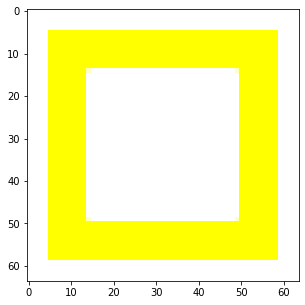

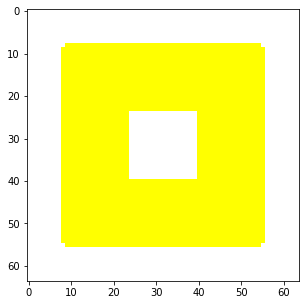

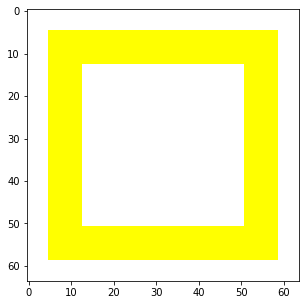

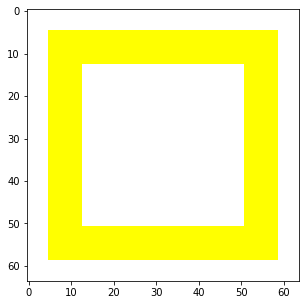

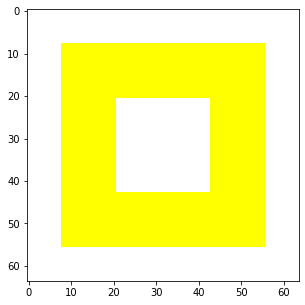

...

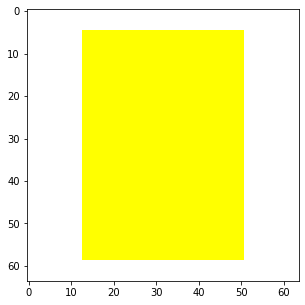

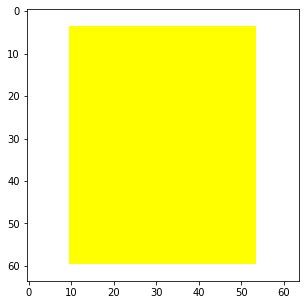

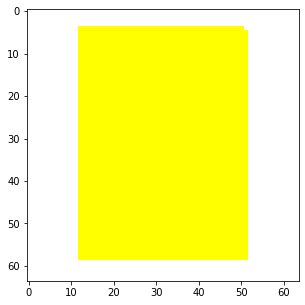

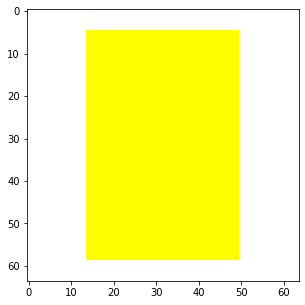

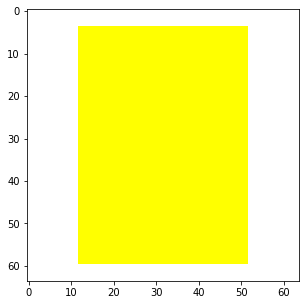

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

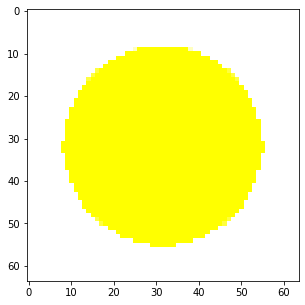

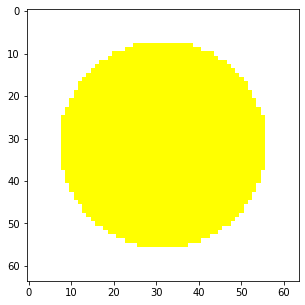

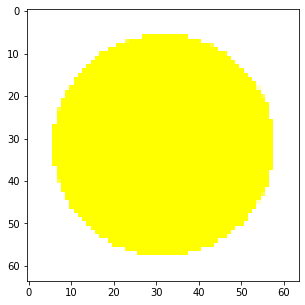

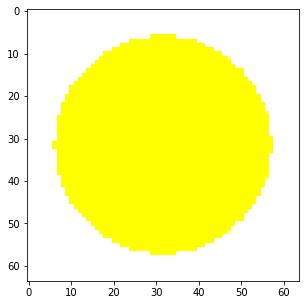

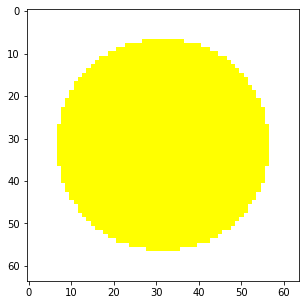

...

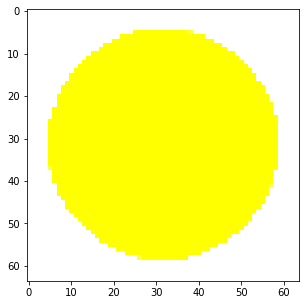

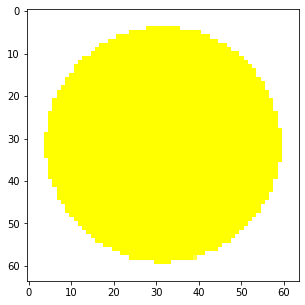

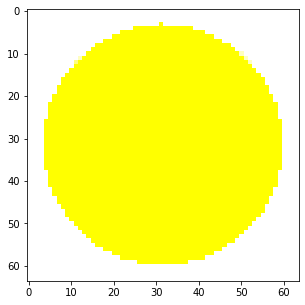

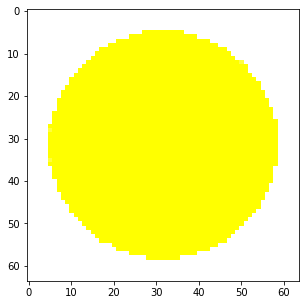

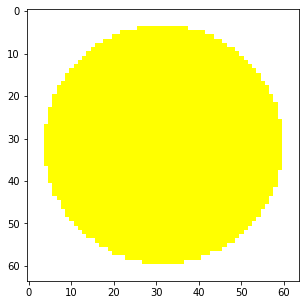

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

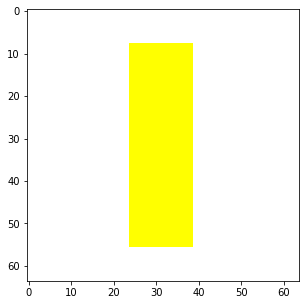

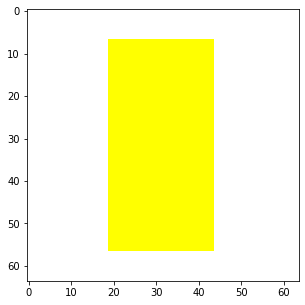

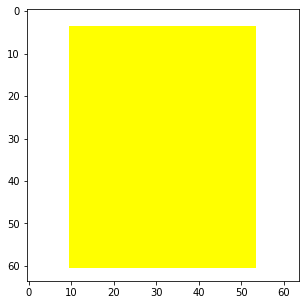

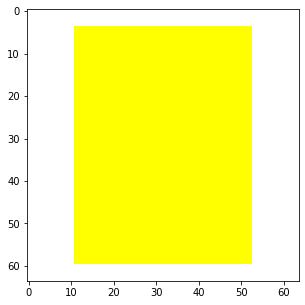

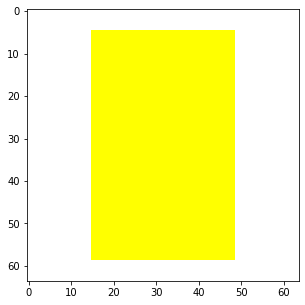

...

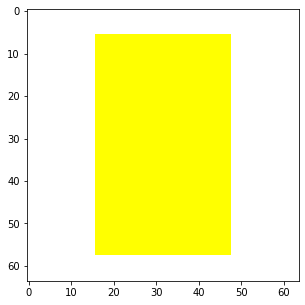

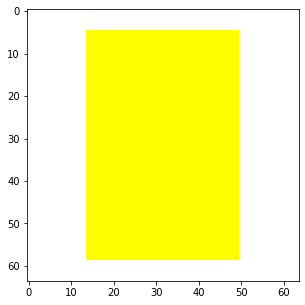

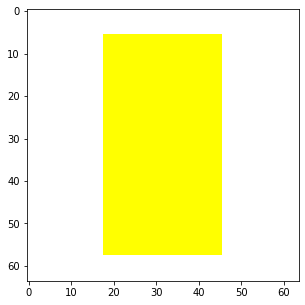

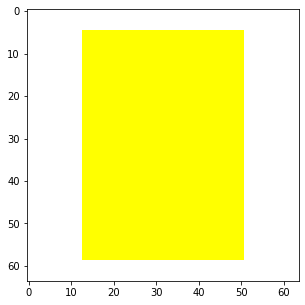

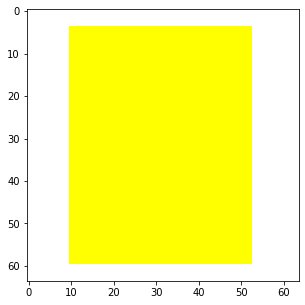

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

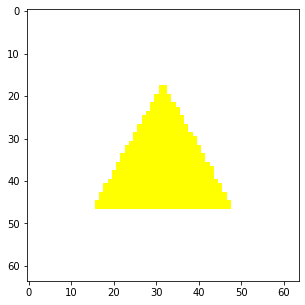

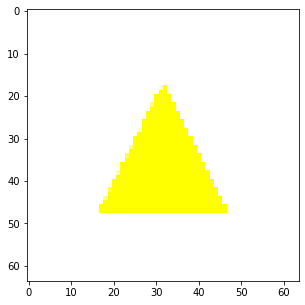

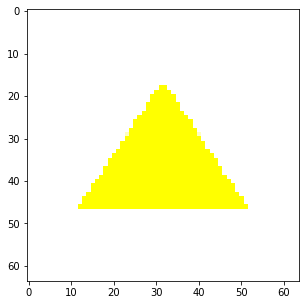

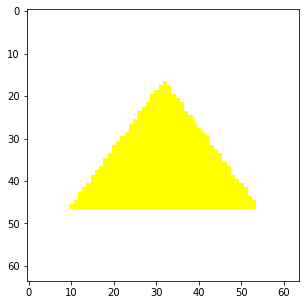

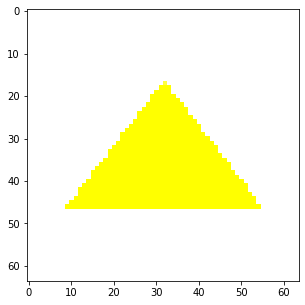

...

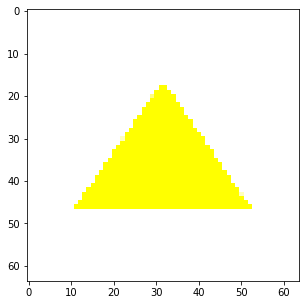

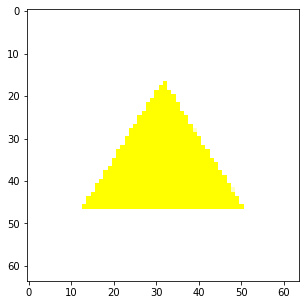

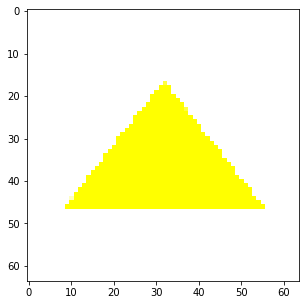

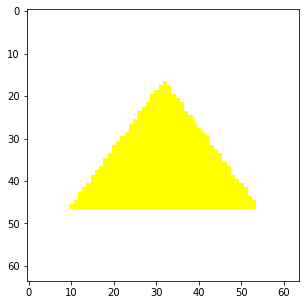

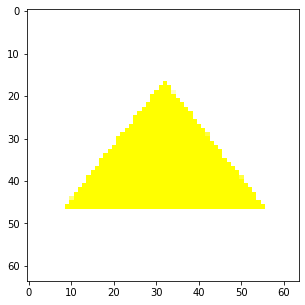

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

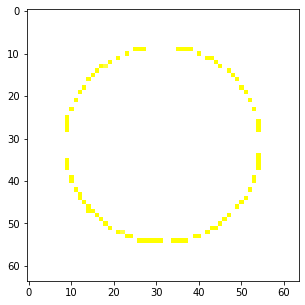

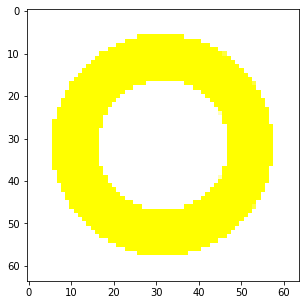

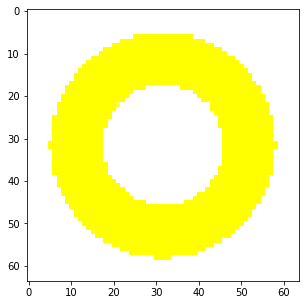

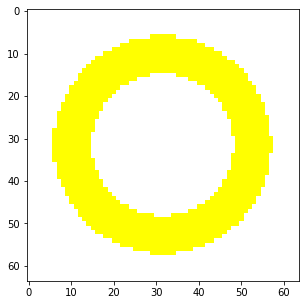

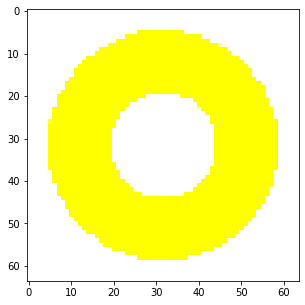

...

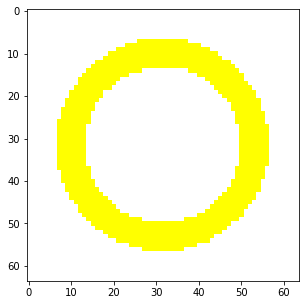

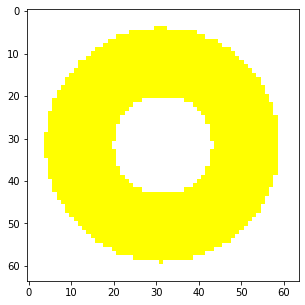

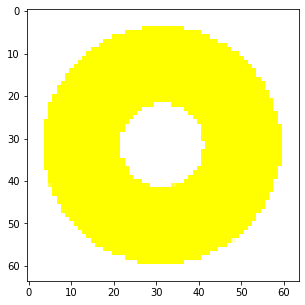

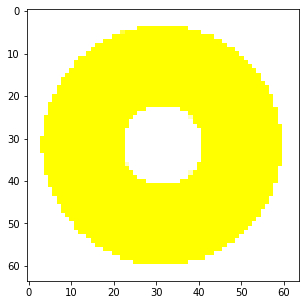

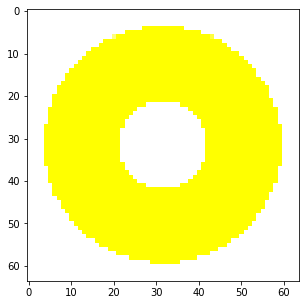

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

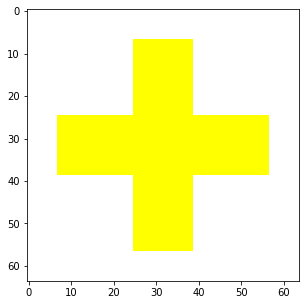

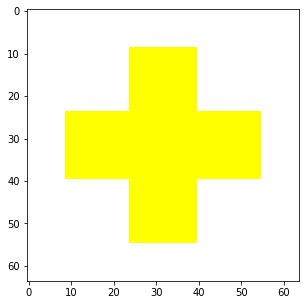

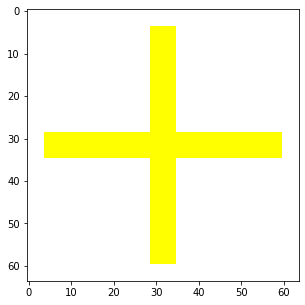

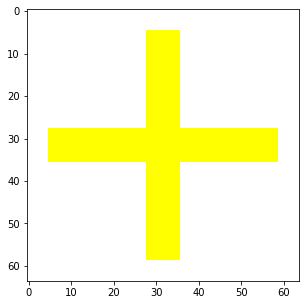

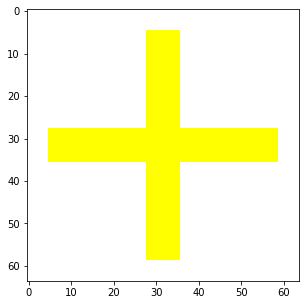

...

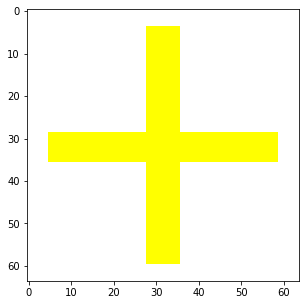

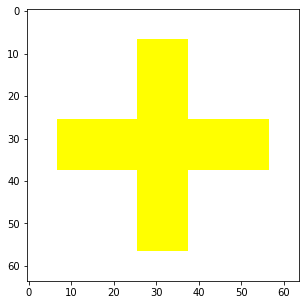

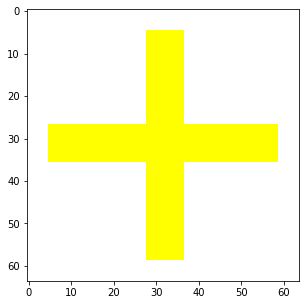

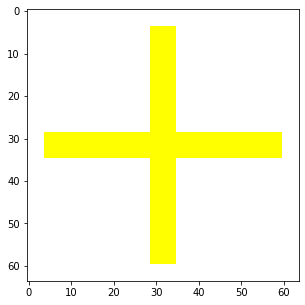

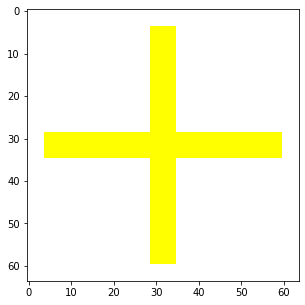

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

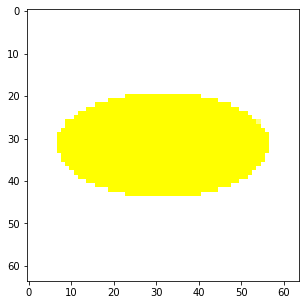

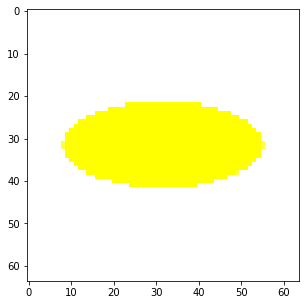

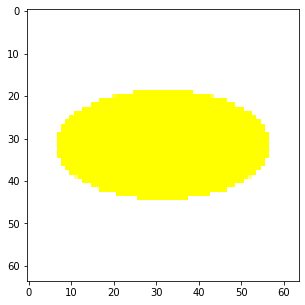

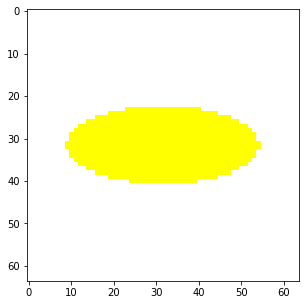

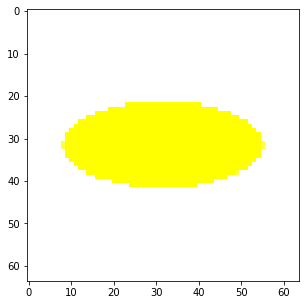

...

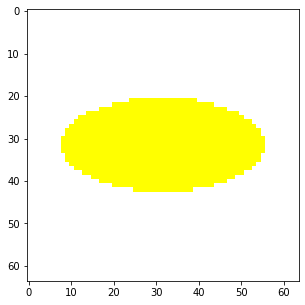

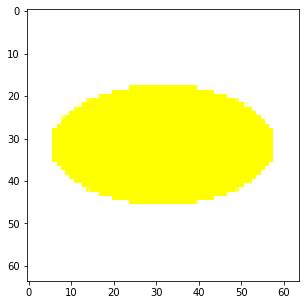

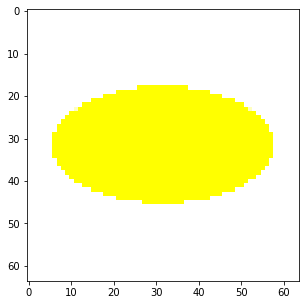

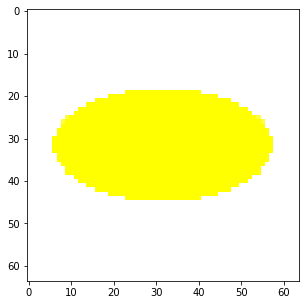

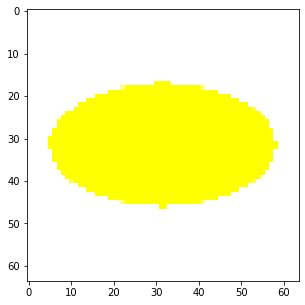

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

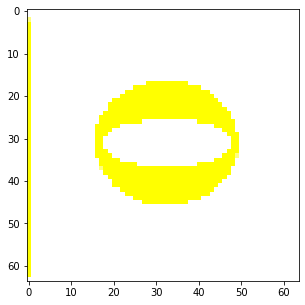

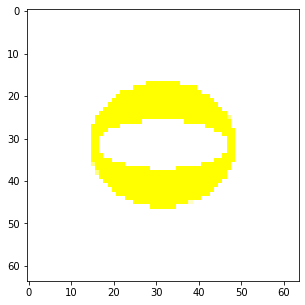

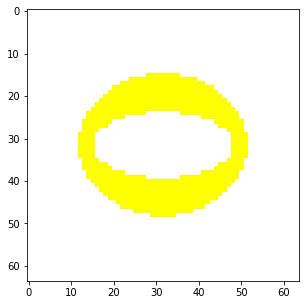

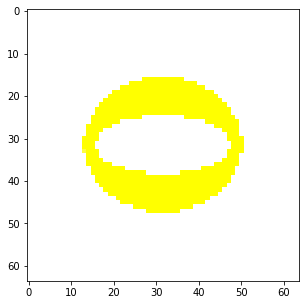

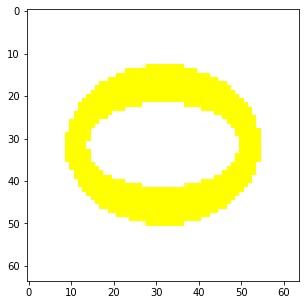

...

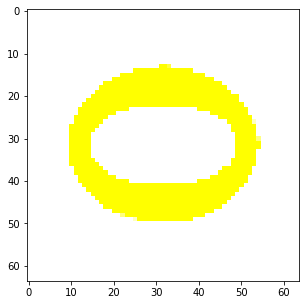

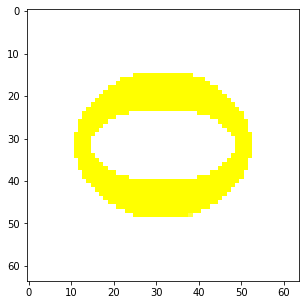

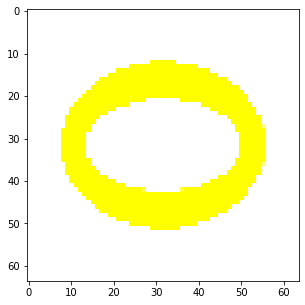

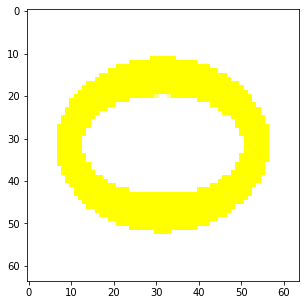

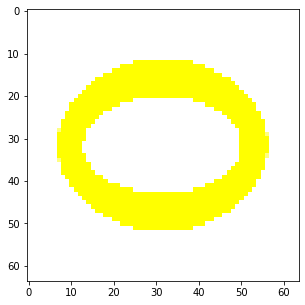

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

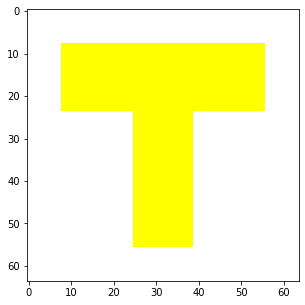

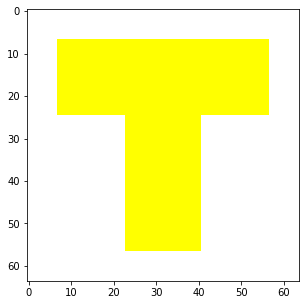

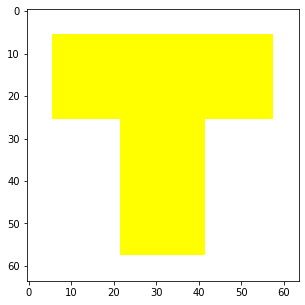

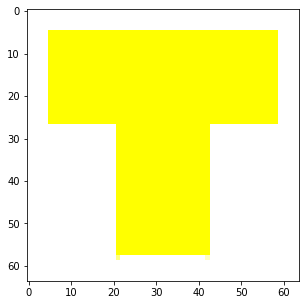

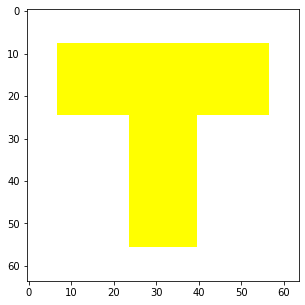

...

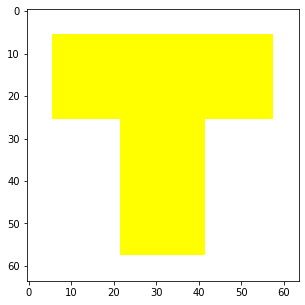

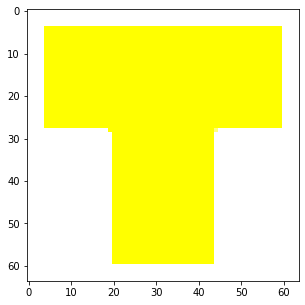

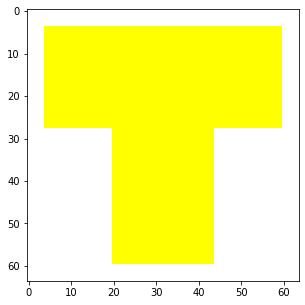

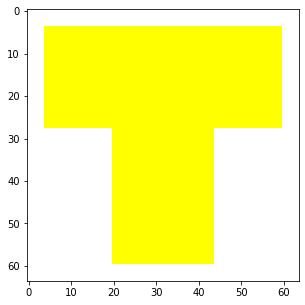

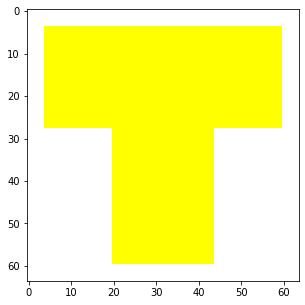

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

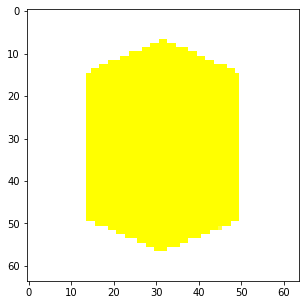

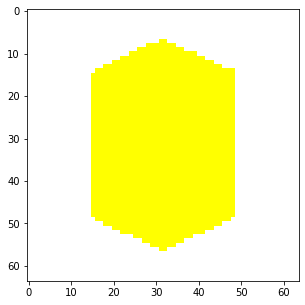

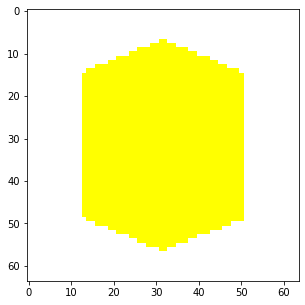

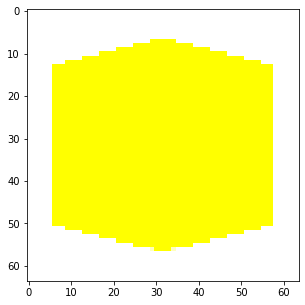

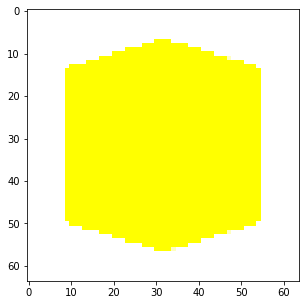

...

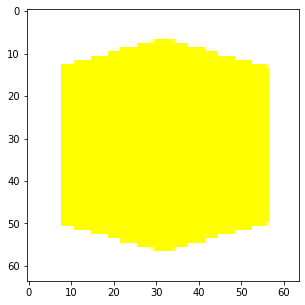

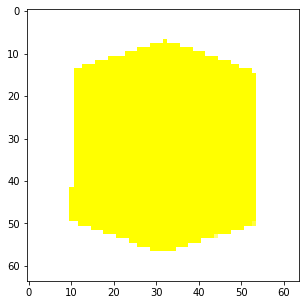

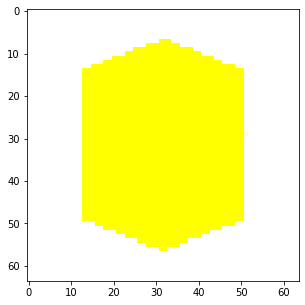

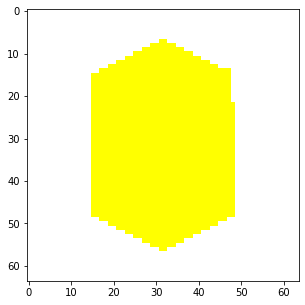

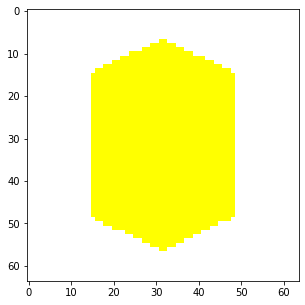

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

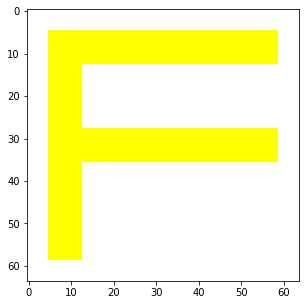

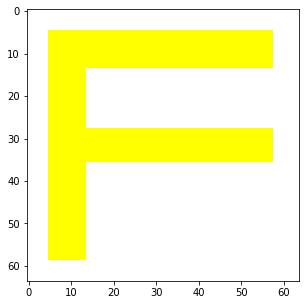

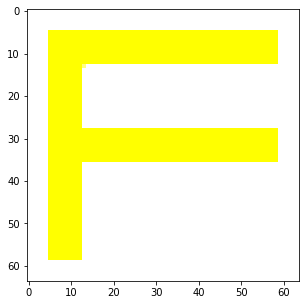

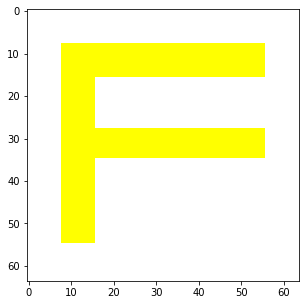

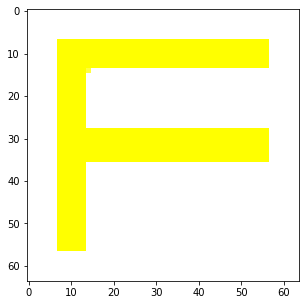

...

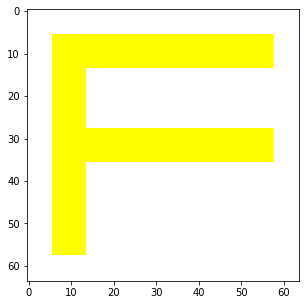

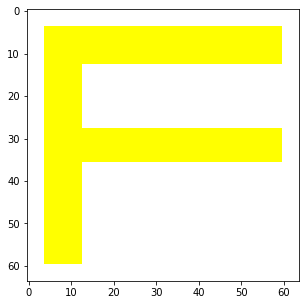

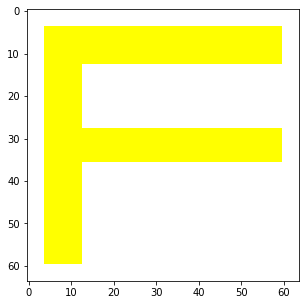

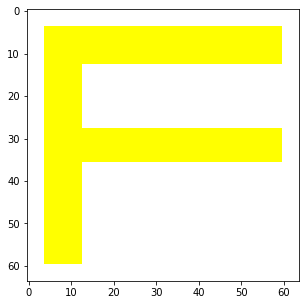

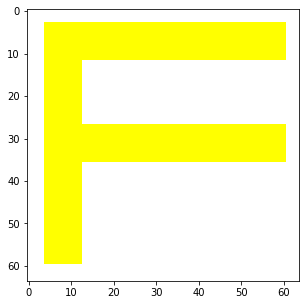

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

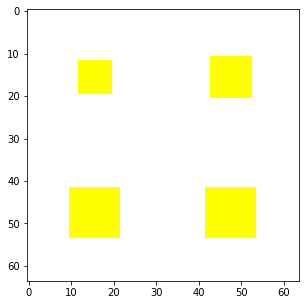

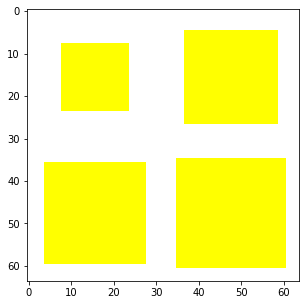

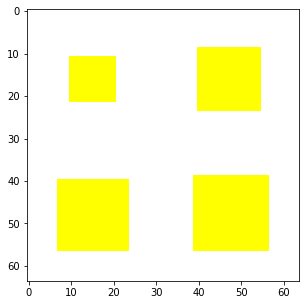

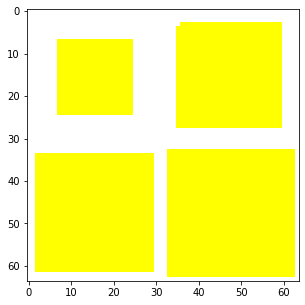

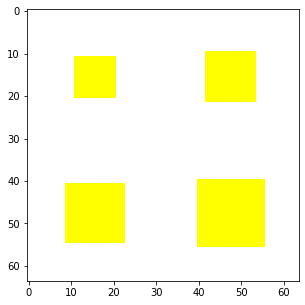

...

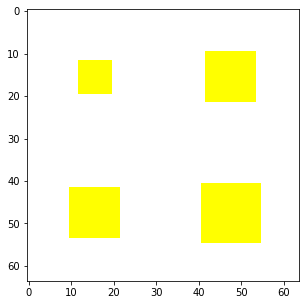

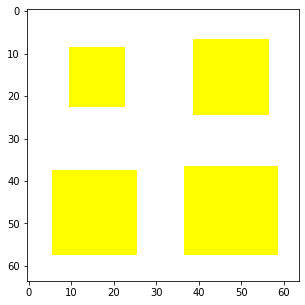

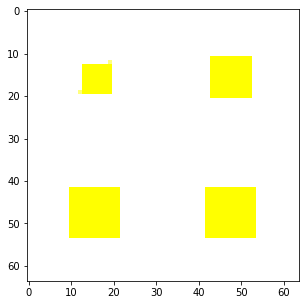

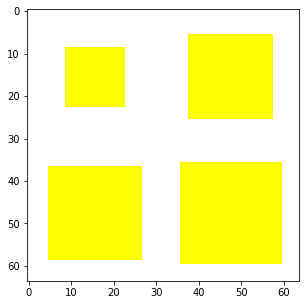

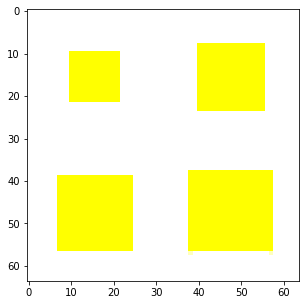

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

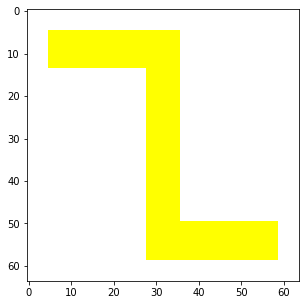

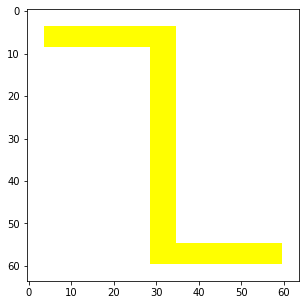

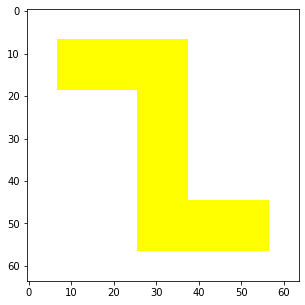

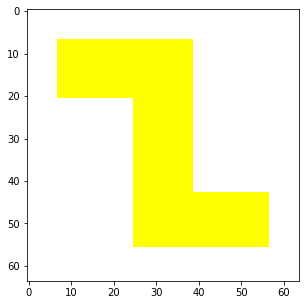

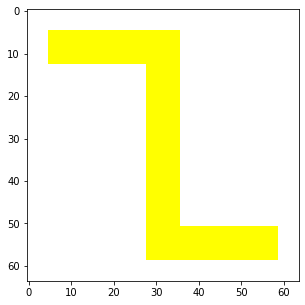

...

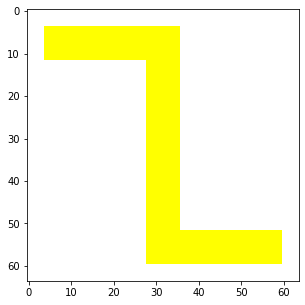

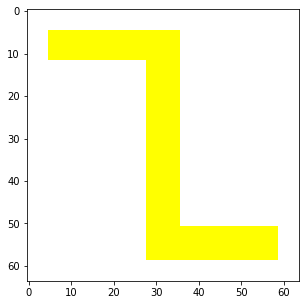

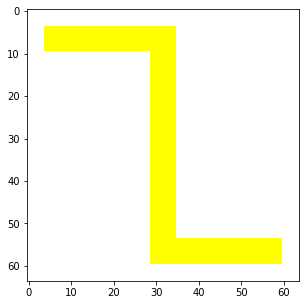

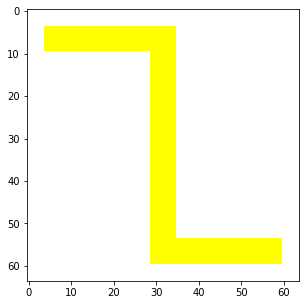

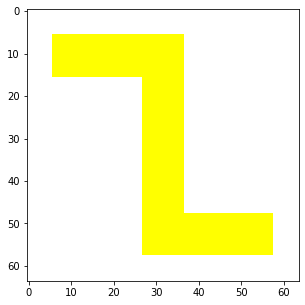

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

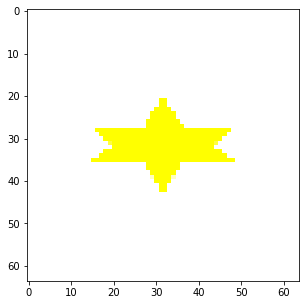

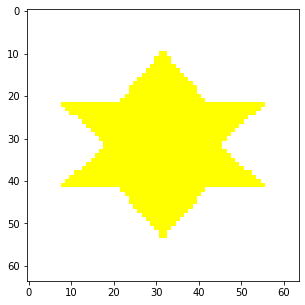

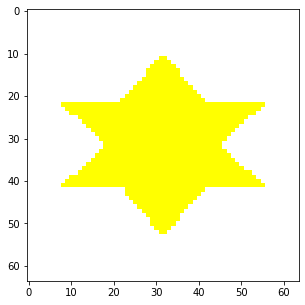

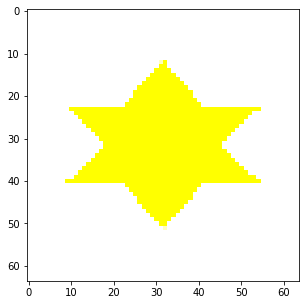

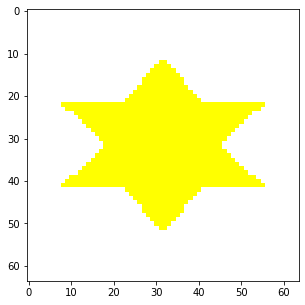

...

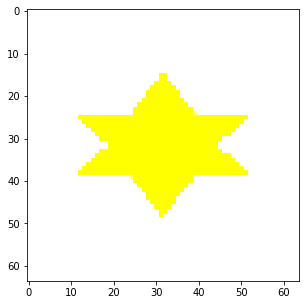

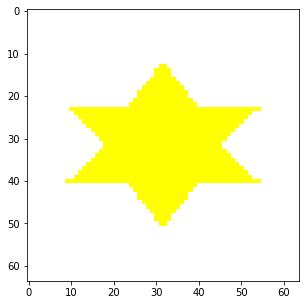

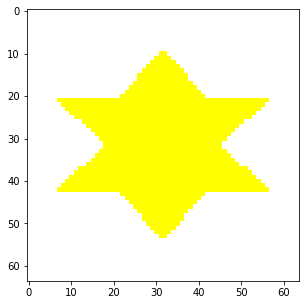

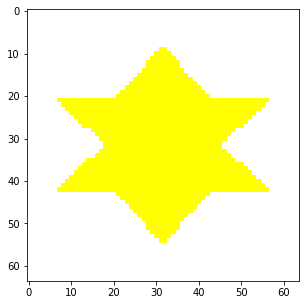

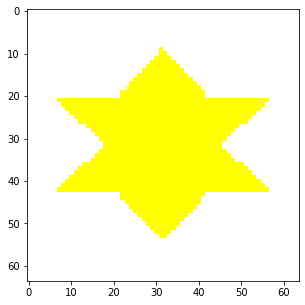

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

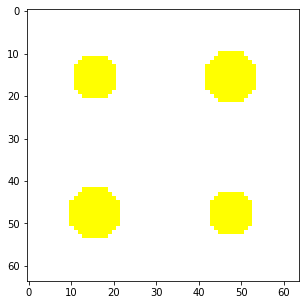

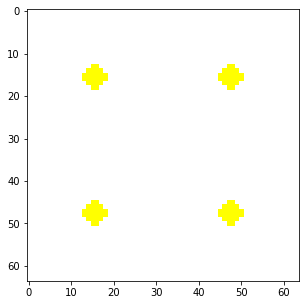

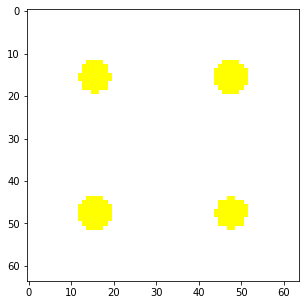

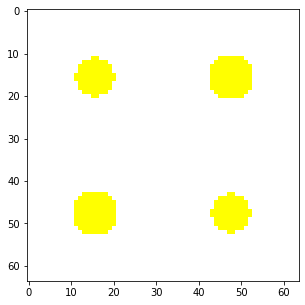

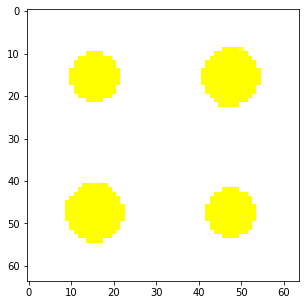

...

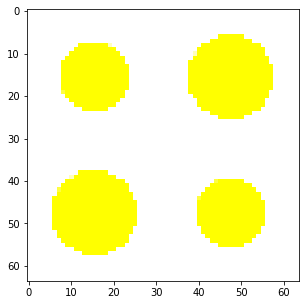

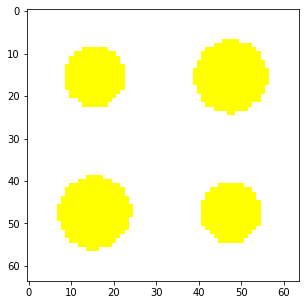

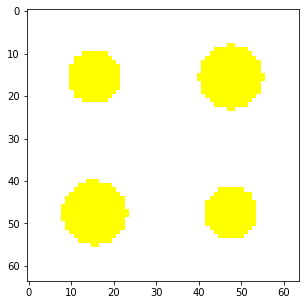

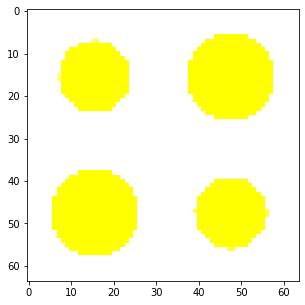

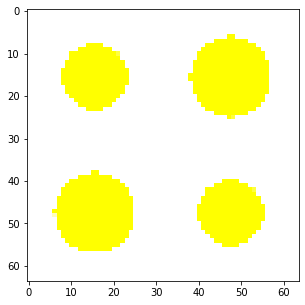

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

In [ ]:
#1 Splitting into Re square ring

i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_ring_re=[];
pca_Re_sqring=[];
for i in range(len(img_sq_ring_re)):
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_ring_re.append(cv2.resize(img_sq_ring_re[i], target_size))
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_ring_re[i])

for i in range(len(f_sq_ring_re)):
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_ring_re[i]) 
  print ("One Channel Shape: ", blue.shape)
#blue channel
  blue_df = pd.DataFrame(data = blue)
  blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  green_df
#red channel
  red_df = pd.DataFrame(data = red)
  red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_sqring.append(rgd_pca_df_np)
  print("img_sq_ring_cr_size_pca",np.array(pca_Re_sqring).shape)




#2 Splitting into Re rect

f_rect_re=[]; #1
pca_Re_rect=[]; #2
for i in range(len(img_rect_re)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_rect_re.append(cv2.resize(img_rect_re[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_rect_re[i]) #5

for i in range(len(f_rect_re)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_rect_re[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)

  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]
  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_rect.append(rgd_pca_df_np)              #8
  print("img_sq_rect_re",np.array(pca_Re_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#2 Splitting into Re rect

f_cyl_re=[]; #1
pca_Re_cyl=[]; #2
for i in range(len(img_cyl_re)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_re.append(cv2.resize(img_cyl_re[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_re[i]) #5

for i in range(len(f_cyl_re)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_re[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)
  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_cyl.append(rgd_pca_df_np)              #8
  print("img_sq_rect_re",np.array(pca_Re_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#4 Splitting into Re square
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_re=[]; #1
pca_Re_sq=[]; #2
for i in range(len(img_sq_re)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_re.append(cv2.resize(img_sq_re[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_re[i]) #5

for i in range(len(f_sq_re)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_re[i]) #7
  #print ("One Channel Shape: ", blue.shape)
  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  #print ("Blue Data Frame")
  #print (trans_pca_b_df)

  #print ("Green Data Frame")
  #print (trans_pca_g_df)

  #print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_sq.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_Re_sq).shape)

#5 Splitting into Re triangle

f_tri_re=[]; #1
pca_Re_tri=[]; #2
for i in range(len(img_triangle_re)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_tri_re.append(cv2.resize(img_triangle_re[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_tri_re[i]) #5

for i in range(len(f_tri_re)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_tri_re[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df

  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_tri.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_Re_sq).shape)

#6 Splitting into chromium img_cir_ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_cir_ring_re=[]; #1
pca_Re_cir_ring=[]; #2
for i in range(len(img_cir_ring_re)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cir_ring_re.append(cv2.resize(img_cir_ring_re[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cir_ring_re[i]) #5

for i in range(len(f_cir_ring_re)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cir_ring_re[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_cir_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_re",np.array(pca_Re_cir_ring).shape)

#7 Splitting into chromium img_cross
f_cross_re=[]; #1
pca_Re_cross=[]; #2
for i in range(len(img_cross_re)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cross_re.append(cv2.resize(img_cross_re[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cross_re[i]) #5
for i in range(len(f_cross_re)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cross_re[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_cross.append(rgd_pca_df_np)              #8
  print("img_cir_ring_cr",np.array(pca_Re_cir_ring).shape)
#Its shape is now 4608x1 instead of 64x72


#8 Splitting into chromium img_ellipse

f_ellipse_re=[]; #1
pca_Re_ellipse=[]; #2
for i in range(len(img_ellipse_re)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_ellipse_re.append(cv2.resize(img_ellipse_re[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_ellipse_re[i]) #5

for i in range(len(f_ellipse_re)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_ellipse_re[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_ellipse.append(rgd_pca_df_np)              #8
  print("img_ellipse_re",np.array(pca_Re_cir_ring).shape)

#8 Splitting into re _elliptical_ring

f_elliptical_ring_re=[]; #1
pca_Re_elliptical_ring=[]; #2
for i in range(len(img_elliptical_ring_re)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_elliptical_ring_re.append(cv2.resize(img_elliptical_ring_re[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_elliptical_ring_re[i]) #5

for i in range(len(f_elliptical_ring_re)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_elliptical_ring_re[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_elliptical_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_re",np.array(pca_Re_cir_ring).shape)

#10 Splitting into chromium _T shaped

f_T_re=[]; #1
pca_Re_T=[]; #2
for i in range(len(img_T_re)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_T_re.append(cv2.resize(img_T_re[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_T_re[i]) #5

for i in range(len(f_T_re)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_T_re[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_T.append(rgd_pca_df_np)              #8
  print("img_T_re",np.array(pca_Re_T).shape)

#10 Splitting into chromium Hexagon

f_hex_re=[]; #1
pca_Re_hex=[]; #2
for i in range(len(img_hex_re)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_hex_re.append(cv2.resize(img_hex_re[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_hex_re[i]) #5
for i in range(len(f_hex_re)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_hex_re[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_hex.append(rgd_pca_df_np)              #8
  print("img_hex_re",np.array(pca_Re_hex).shape)

#11 Splitting into chromium F-shaped

f_F_re=[]; #1
pca_Re_F=[]; #2
for i in range(len(img_F_re)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_F_re.append(cv2.resize(img_F_re[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_F_re[i]) #5

for i in range(len(f_F_re)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_F_re[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_F.append(rgd_pca_df_np)              #8
  print("img_hex_re",np.array(pca_Re_F).shape)

#12 Splitting into chromium Square SC
f_sq_SC_re=[]; #1
pca_Re_sq_SC=[]; #2
for i in range(len(img_sq_SC_re)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_SC_re.append(cv2.resize(img_sq_SC_re[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_SC_re[i]) #5

for i in range(len(f_sq_SC_re)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_SC_re[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_sq_SC.append(rgd_pca_df_np)              #8
  print("img_hex_sq_SC",np.array(pca_Re_sq_SC).shape)

#13 Splitting into chromium Z shaped
f_Z_re=[]; #1
pca_Re_Z=[]; #2
for i in range(len(img_Z_re)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_Z_re.append(cv2.resize(img_Z_re[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_Z_re[i]) #5

for i in range(len(f_Z_re)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_Z_re[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)
  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_Z.append(rgd_pca_df_np)              #8
  print("img_Z_re",np.array(pca_Re_Z).shape)

#14 Splitting into chromium star
f_star_re=[]; #1
pca_Re_star=[]; #2
for i in range(len(img_star_re)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_star_re.append(cv2.resize(img_star_re[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_star_re[i]) #5

for i in range(len(f_star_re)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_star_re[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)
  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_star.append(rgd_pca_df_np)              #8
  print("img_Z_re",np.array(pca_Re_Z).shape)

#16 Splitting into chromium cyl_Sc

f_cyl_SC_re=[]; #1
pca_Re_cyl_SC=[]; #2
for i in range(len(img_cyl_SC_re)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_SC_re.append(cv2.resize(img_cyl_SC_re[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_SC_re[i]) #5

for i in range(len(f_cyl_SC_re)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_SC_re[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Re_cyl_SC.append(rgd_pca_df_np)              #8
  print("img_Z_re",np.array(pca_Re_cyl_SC).shape)

#




In [ ]:
reps = (25,1)
all_pca_sqring_re =np.tile(pca_Re_sqring,reps) #1
all_pca_rect_re=np.tile(pca_Re_rect,reps) #2
all_pca_cyl_re =np.tile(pca_Re_cyl,reps) #3
all_pca_sq_re = np.tile(pca_Re_sq,reps) #4
all_pca_tri_re = np.tile(pca_Re_tri,reps)#5
all_pca_cir_ring_re = np.tile(pca_Re_cir_ring,reps) #6
all_pca_cross_re = np.tile(pca_Re_cross,reps) #7
all_pca_ellipse_re = np.tile(pca_Re_ellipse,reps) #8
all_pca_elliptical_ring_re = np.tile(pca_Re_elliptical_ring,reps) #9
all_pca_T_re = np.tile(pca_Re_T,reps)#10
all_pca_hex_re = np.tile(pca_Re_hex,reps)#11
all_pca_F_re = np.tile(pca_Re_F,reps) #12
all_pca_sq_SC_re = np.tile(pca_Re_sq_SC,reps) #13
all_pca_Z_re=np.tile(pca_Re_Z,reps) #14
all_pca_star_re=np.tile(pca_Re_star,reps) #15
all_pca_cyl_SC_re=np.tile(pca_Re_cyl_SC,reps) #16
print(all_pca_cross_re.shape)




(325, 1920)


In [ ]:

#all_img_Re= np.concatenate((all_pca_sqring_re,all_pca_rect_re,all_pca_cyl_re,all_pca_sq_re,all_pca_tri_re,all_pca_cir_ring_re,all_pca_cross_re,all_pca_ellipse_re,all_pca_elliptical_ring_re,all_pca_T_re,all_pca_hex_re,all_pca_F_re,all_pca_sq_SC_re,all_pca_Z_re,all_pca_star_re,all_pca_cyl_SC_re ),axis=0)
all_img_Re= np.concatenate((all_pca_sq_SC_re,all_pca_Z_re,all_pca_star_re,all_pca_cyl_SC_re ),axis=0)
print(all_img_Re.shape)



(1300, 1920)


# Tantalum

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (6, 1920

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ta (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (1, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (2, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (3, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (4, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (5, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (6, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (7, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (8, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (9, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (10, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (11, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (12, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


(1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape: 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ta (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Fram

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

(1, 1920)
img_ellipse_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ta (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ta (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ta (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ta (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ta (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ta (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ta (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ta (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ta (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ta (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ta (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ta (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

(1, 1920)
img_T_ta (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ta (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ta (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (10, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape: 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (10, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ta (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (10, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

 (1, 1920)
img_Z_ta (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ta (13, 1920)


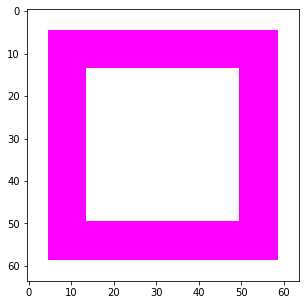

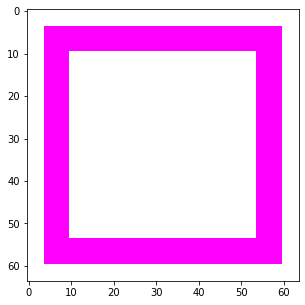

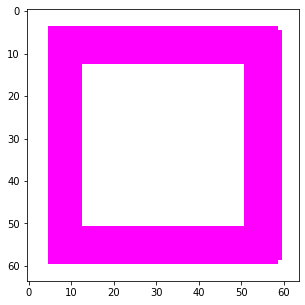

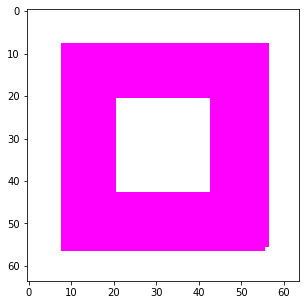

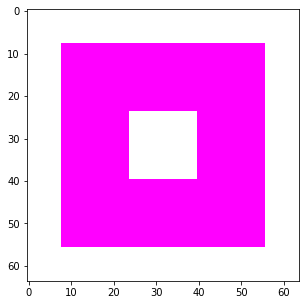

...

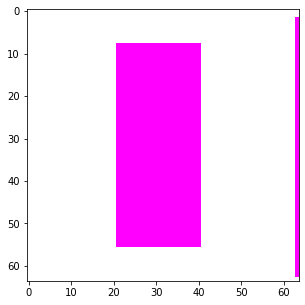

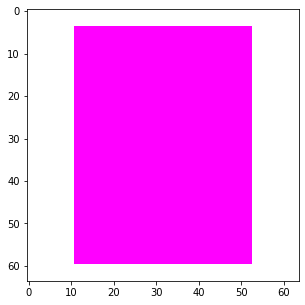

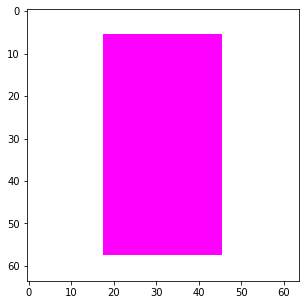

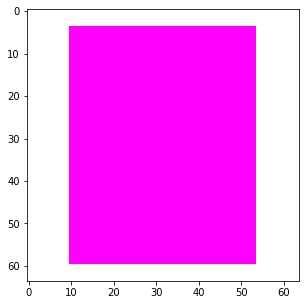

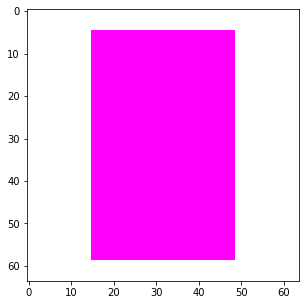

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

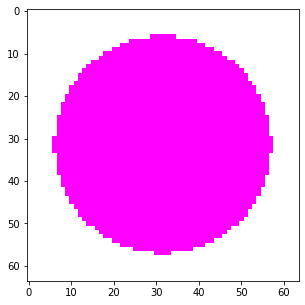

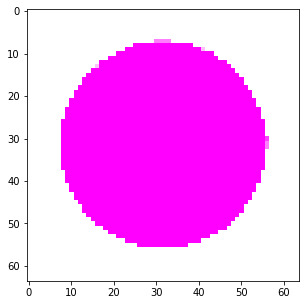

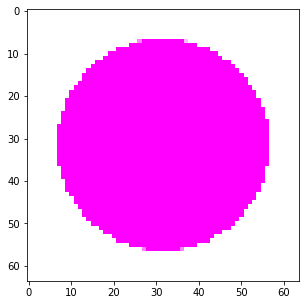

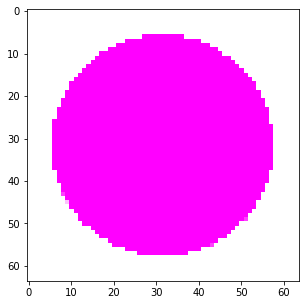

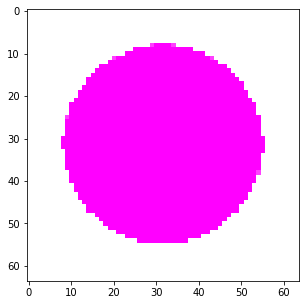

...

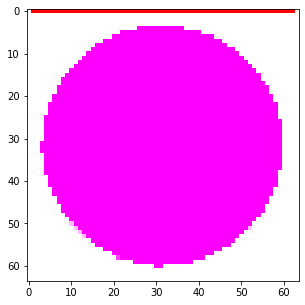

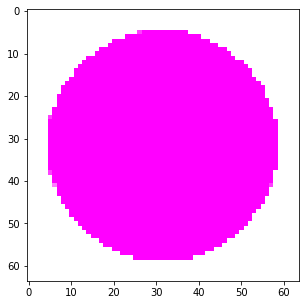

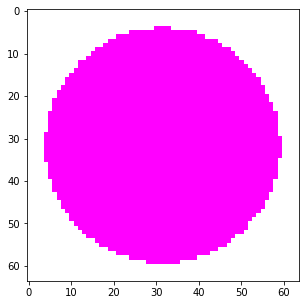

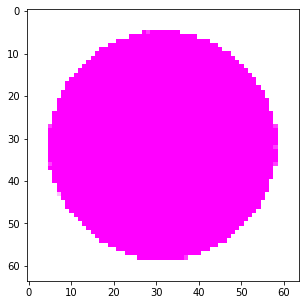

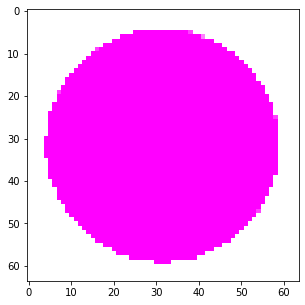

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

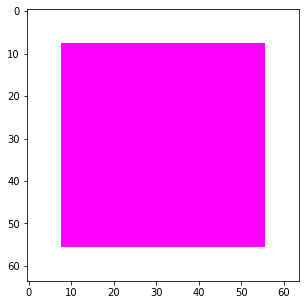

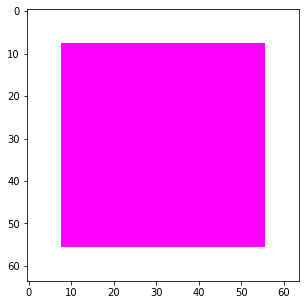

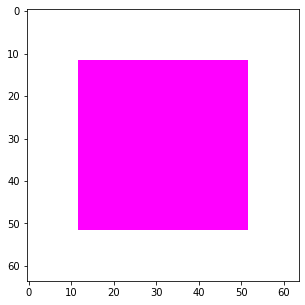

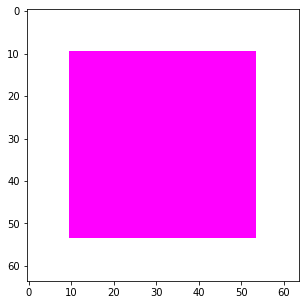

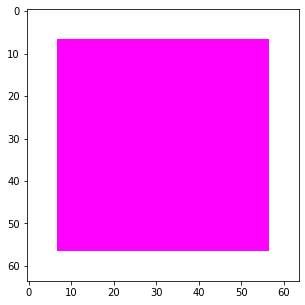

...

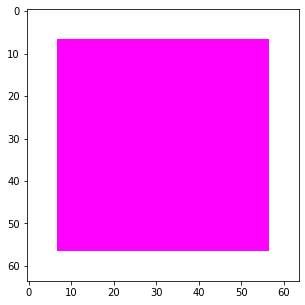

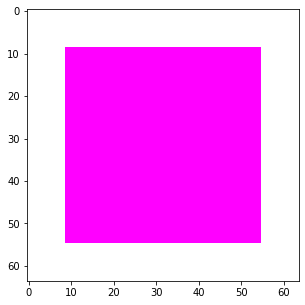

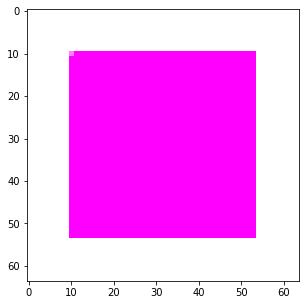

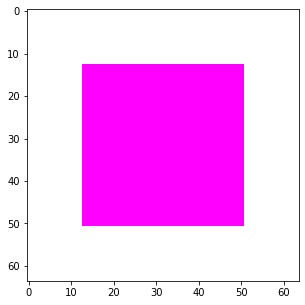

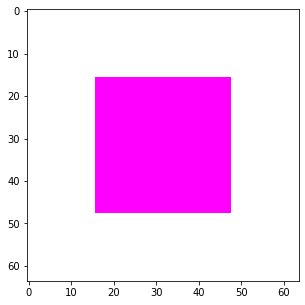

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

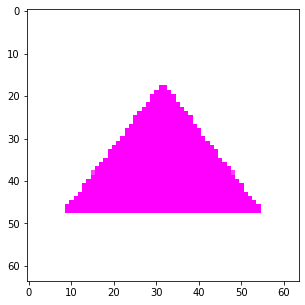

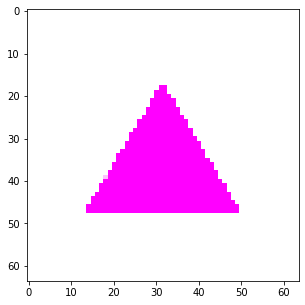

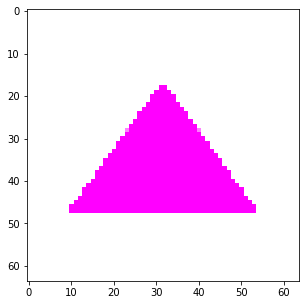

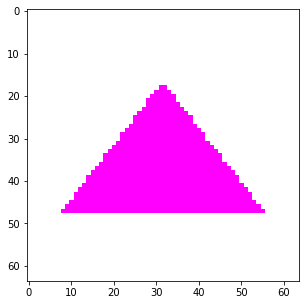

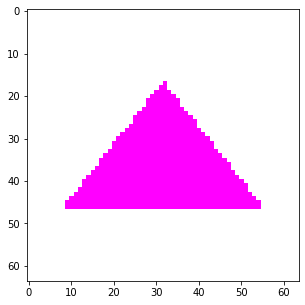

...

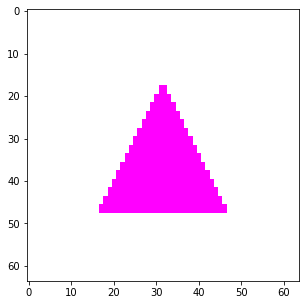

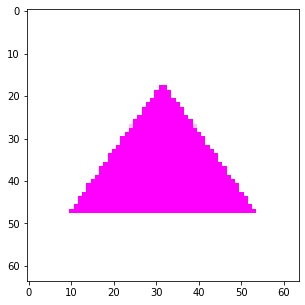

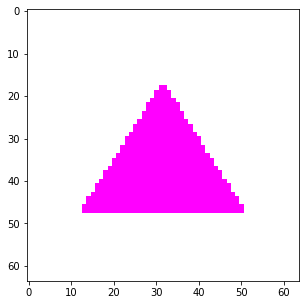

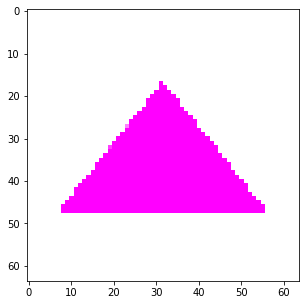

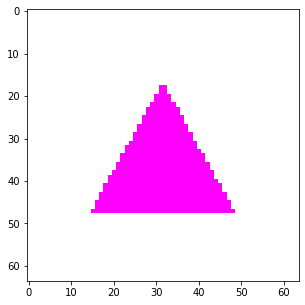

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

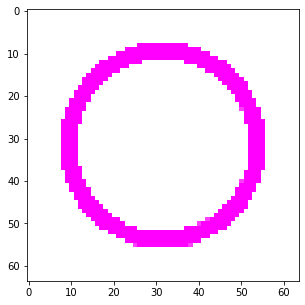

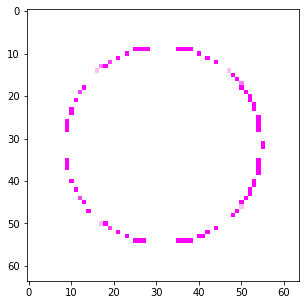

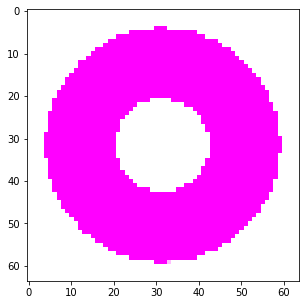

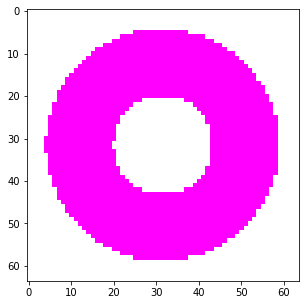

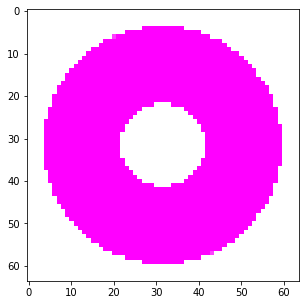

...

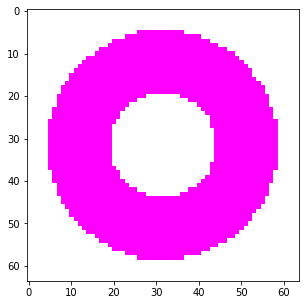

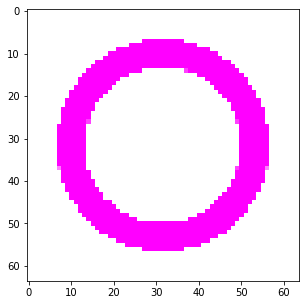

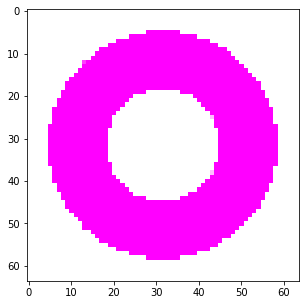

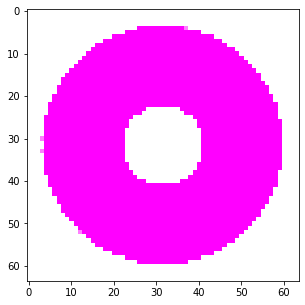

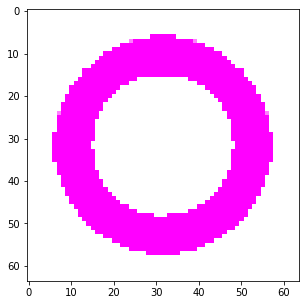

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

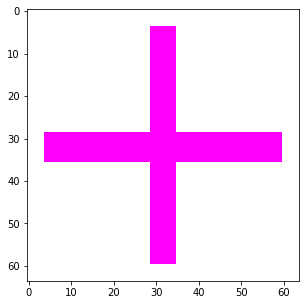

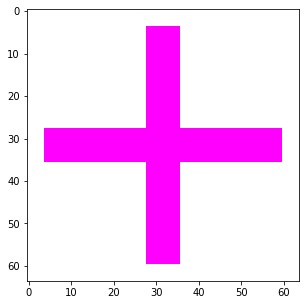

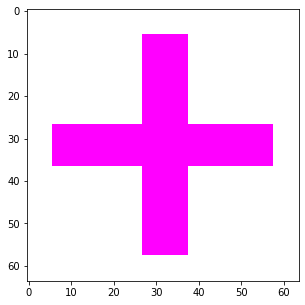

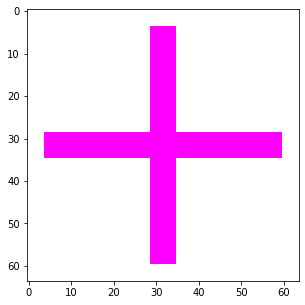

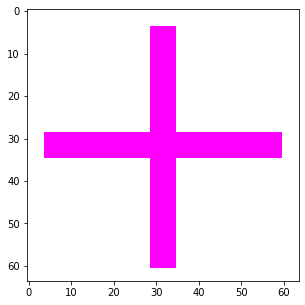

...

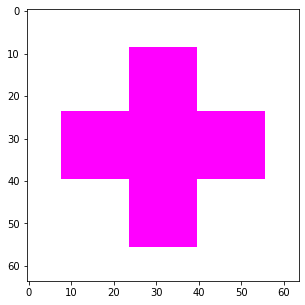

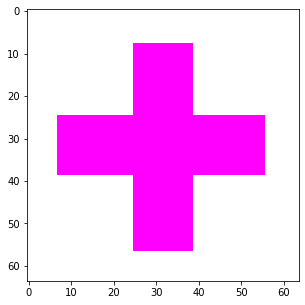

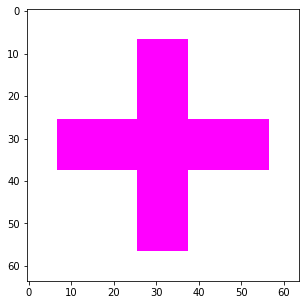

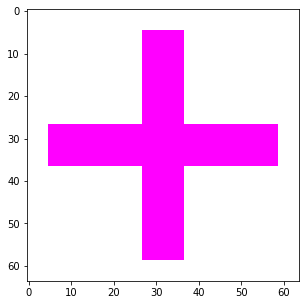

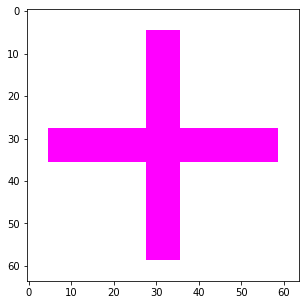

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

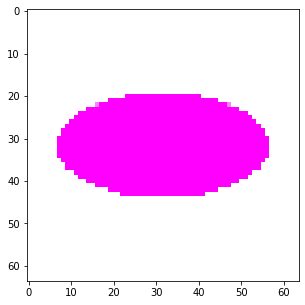

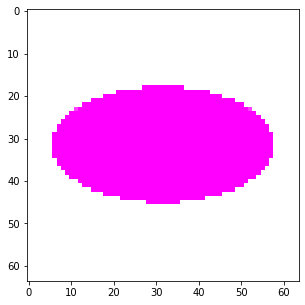

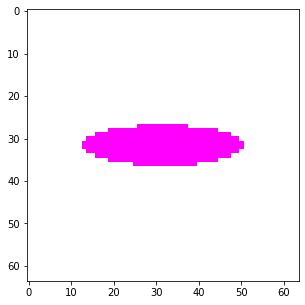

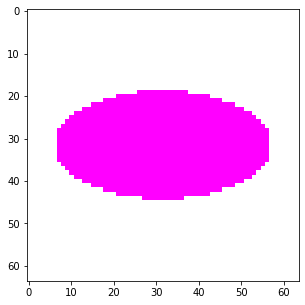

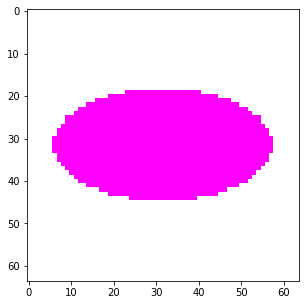

...

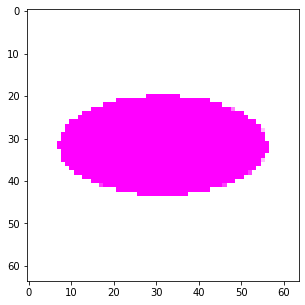

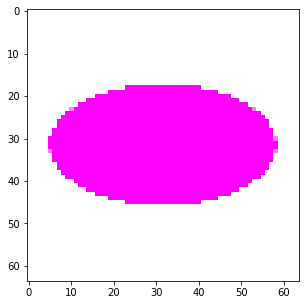

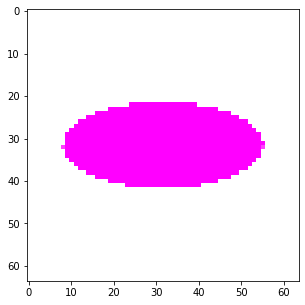

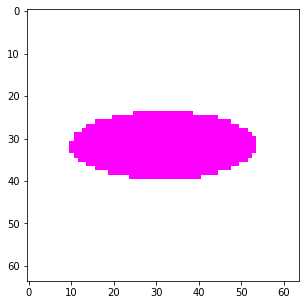

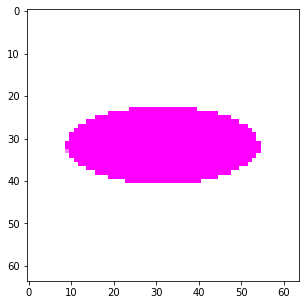

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

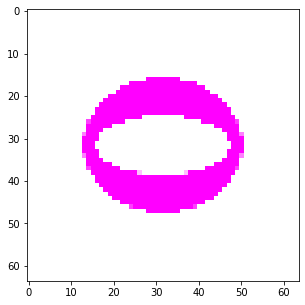

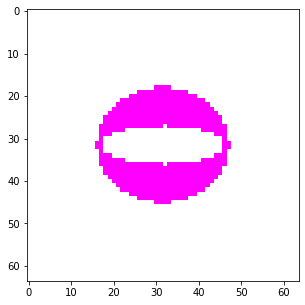

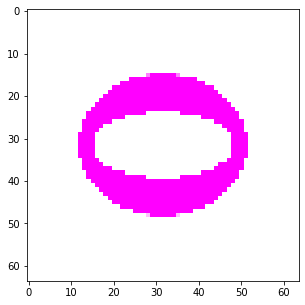

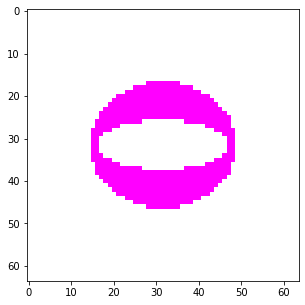

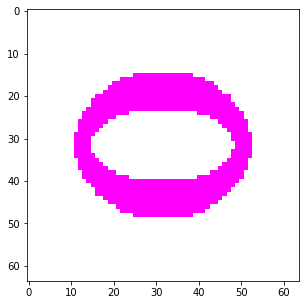

...

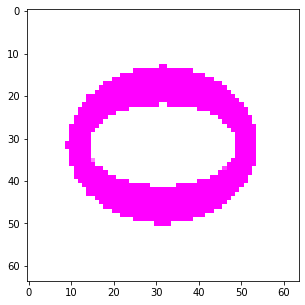

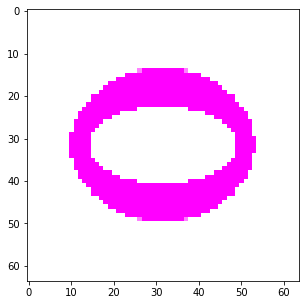

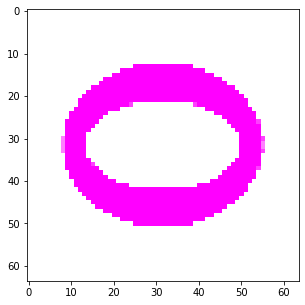

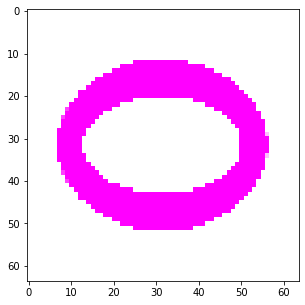

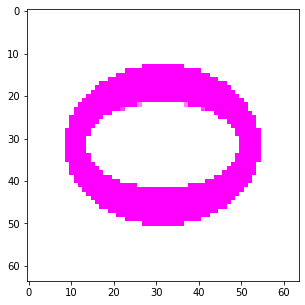

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

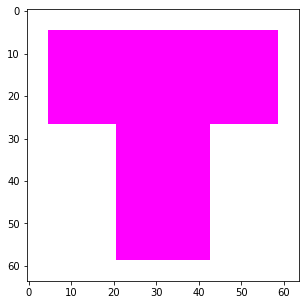

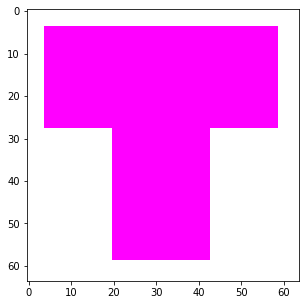

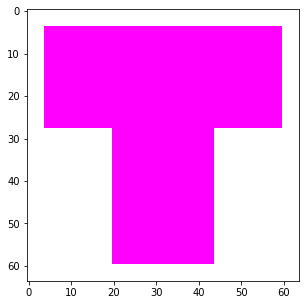

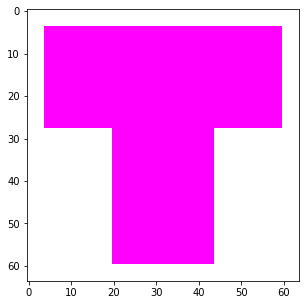

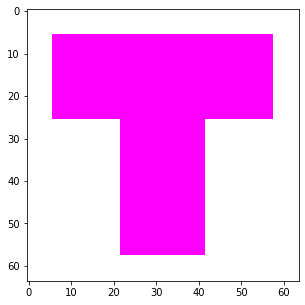

...

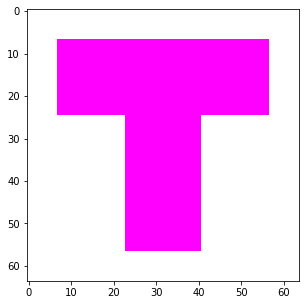

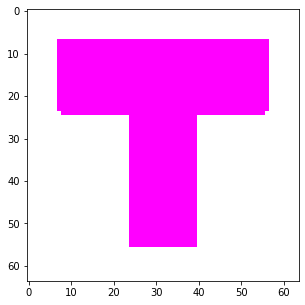

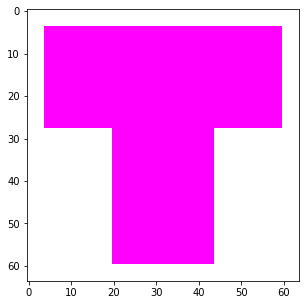

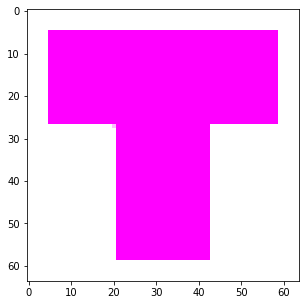

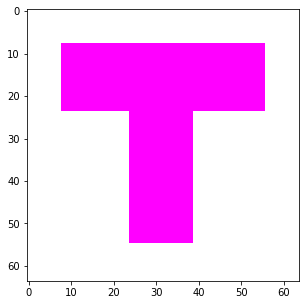

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

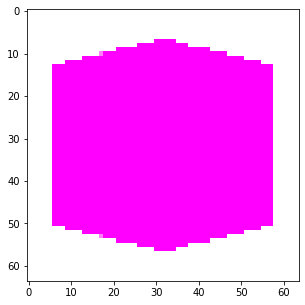

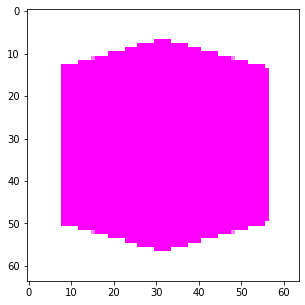

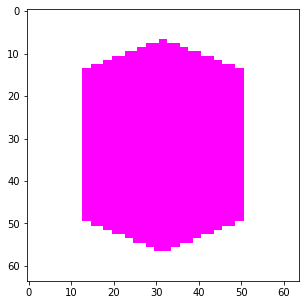

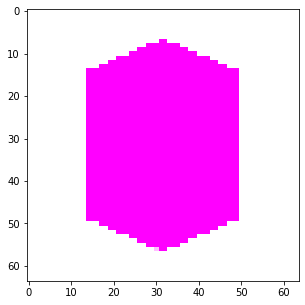

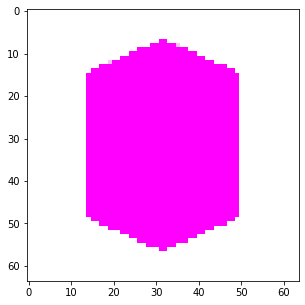

...

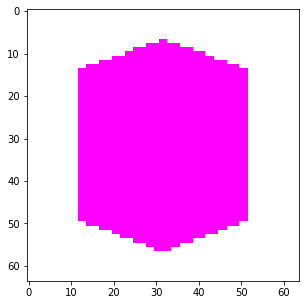

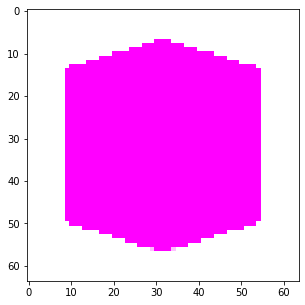

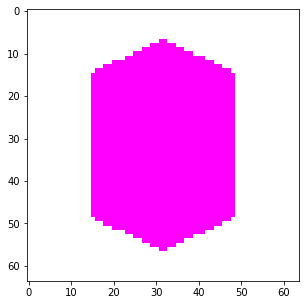

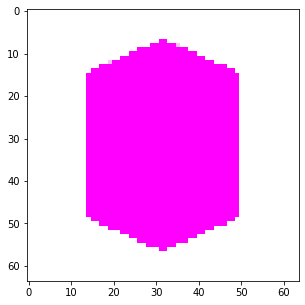

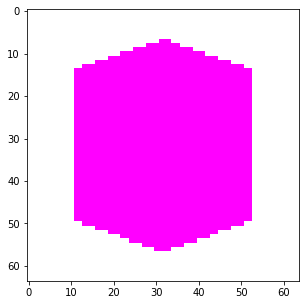

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

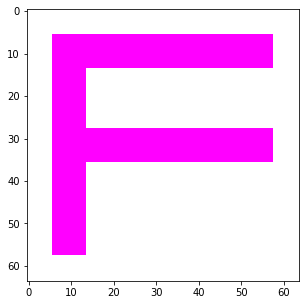

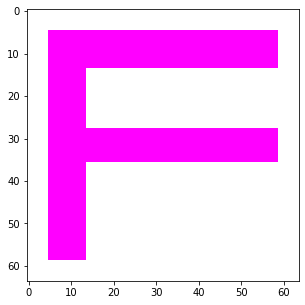

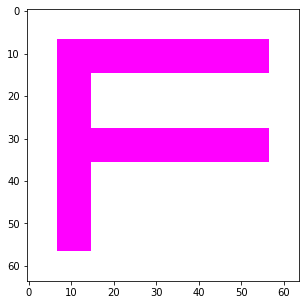

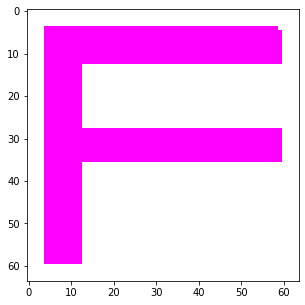

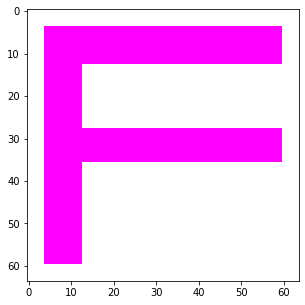

...

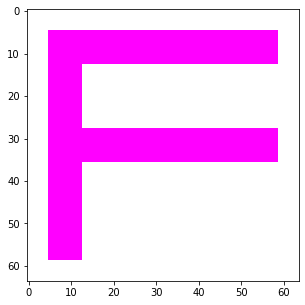

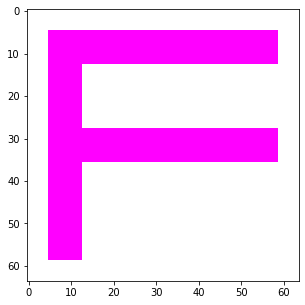

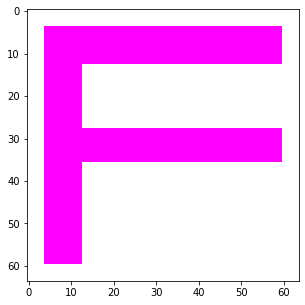

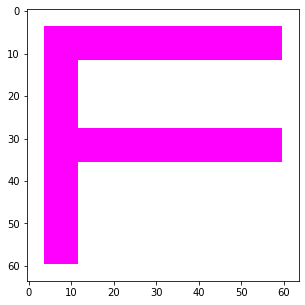

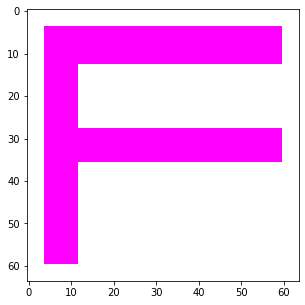

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

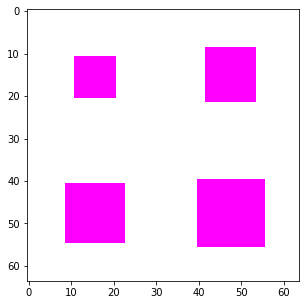

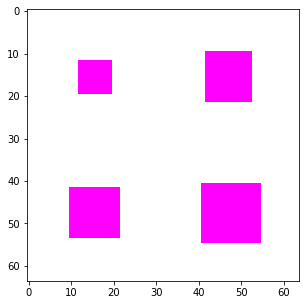

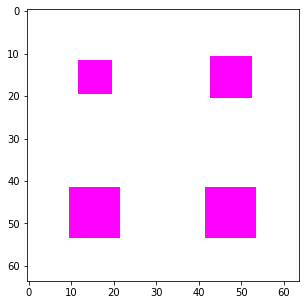

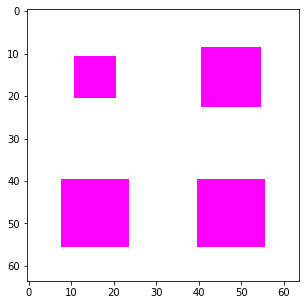

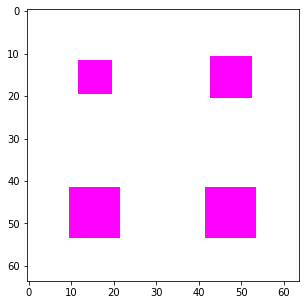

...

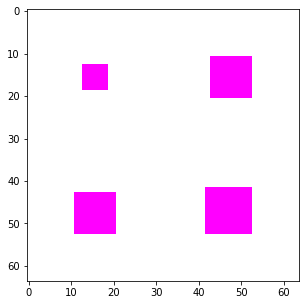

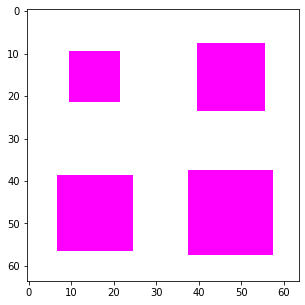

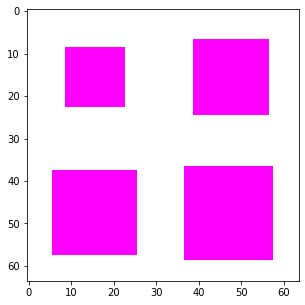

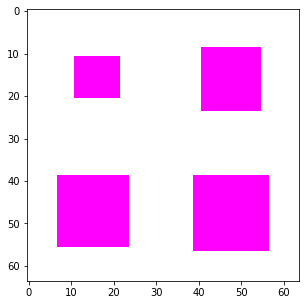

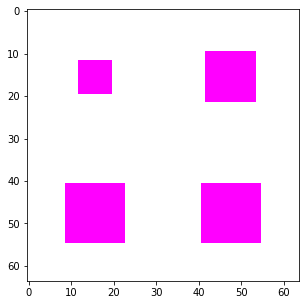

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

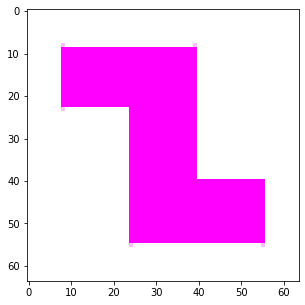

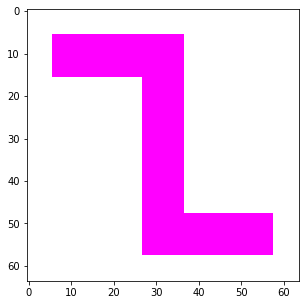

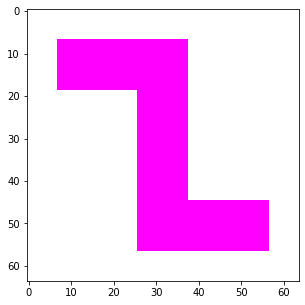

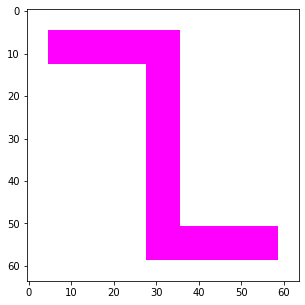

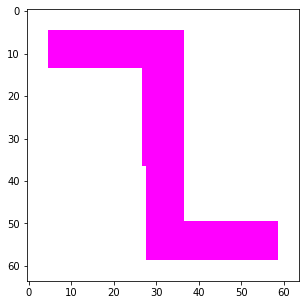

...

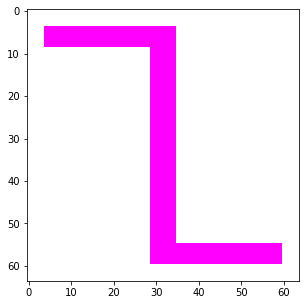

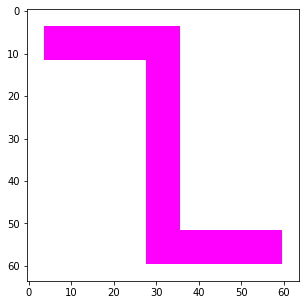

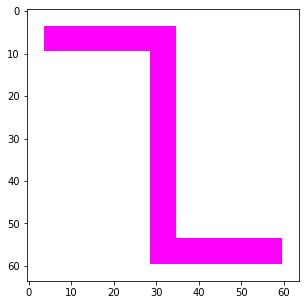

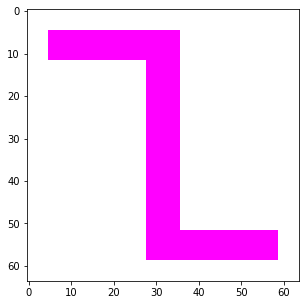

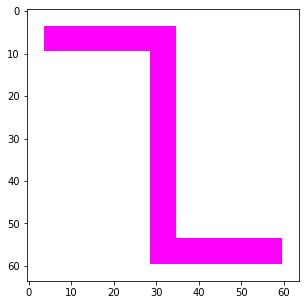

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

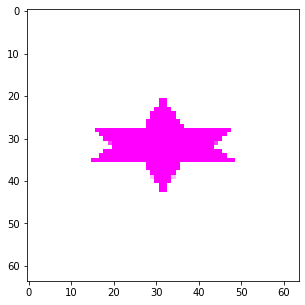

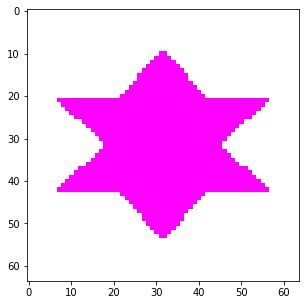

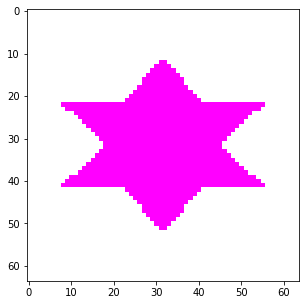

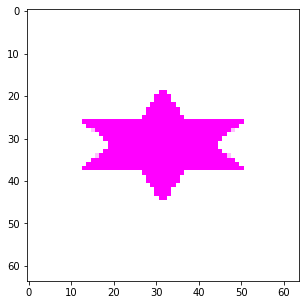

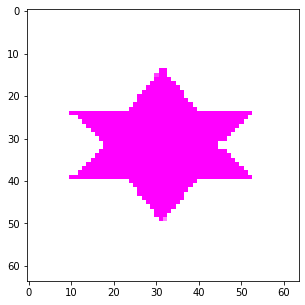

...

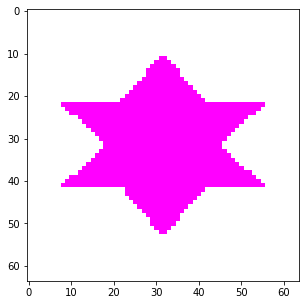

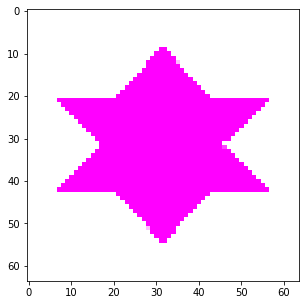

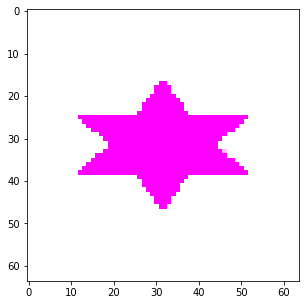

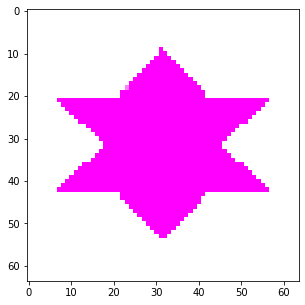

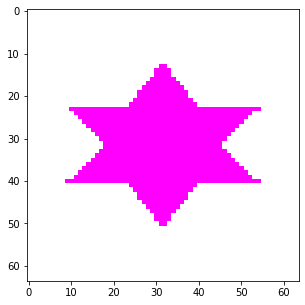

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

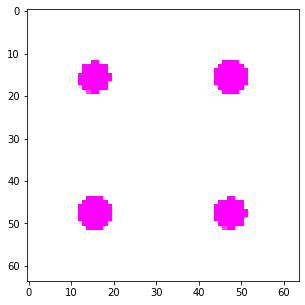

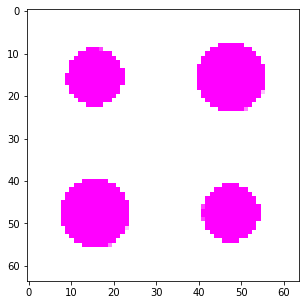

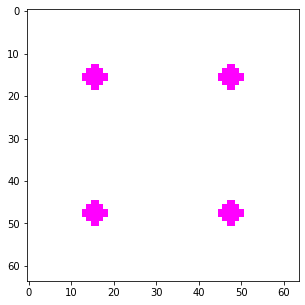

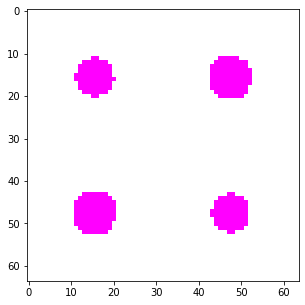

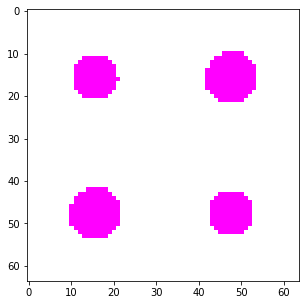

...

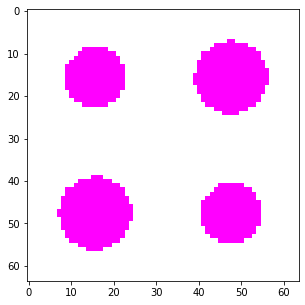

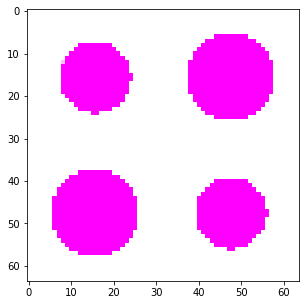

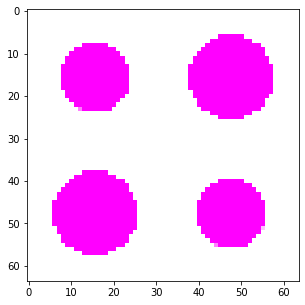

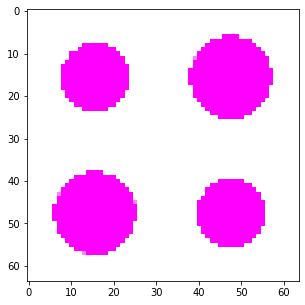

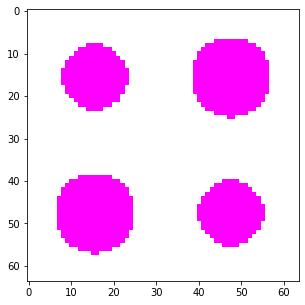

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

In [ ]:
#1 Splitting into Talybdenum square ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_ring_ta=[];
pca_Ta_sqring=[];
for i in range(len(img_sq_ring_ta)):
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_ring_ta.append(cv2.resize(img_sq_ring_ta[i], target_size))
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_ring_ta[i])

for i in range(len(f_sq_ring_ta)):
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_ring_ta[i]) 
  print ("One Channel Shape: ", blue.shape)
#blue channel
  blue_df = pd.DataFrame(data = blue)
  blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  green_df
#red channel
  red_df = pd.DataFrame(data = red)
  red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_sqring.append(rgd_pca_df_np)
  print("img_sq_ring_cr_size_pca",np.array(pca_Ta_sqring).shape)






#2 Splitting into Ta rect

f_rect_ta=[]; #1
pca_Ta_rect=[]; #2
for i in range(len(img_rect_ta)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_rect_ta.append(cv2.resize(img_rect_ta[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_rect_ta[i]) #5

for i in range(len(f_rect_ta)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_rect_ta[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)

  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]
  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_rect.append(rgd_pca_df_np)              #8
  print("img_sq_rect_ta",np.array(pca_Ta_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#2 Splitting into Ta rect

f_cyl_ta=[]; #1
pca_Ta_cyl=[]; #2
for i in range(len(img_cyl_ta)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_ta.append(cv2.resize(img_cyl_ta[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_ta[i]) #5

for i in range(len(f_cyl_ta)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_ta[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)
  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_cyl.append(rgd_pca_df_np)              #8
  print("img_sq_rect_ta",np.array(pca_Ta_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#4 Splitting into Ta square
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_ta=[]; #1
pca_Ta_sq=[]; #2
for i in range(len(img_sq_ta)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_ta.append(cv2.resize(img_sq_ta[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_ta[i]) #5

for i in range(len(f_sq_ta)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_ta[i]) #7
  #print ("One Channel Shape: ", blue.shape)
  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  #print ("Blue Data Frame")
  #print (trans_pca_b_df)

  #print ("Green Data Frame")
  #print (trans_pca_g_df)

  #print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_sq.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_Ta_sq).shape)

#5 Splitting into Ta triangle

f_tri_ta=[]; #1
pca_Ta_tri=[]; #2
for i in range(len(img_triangle_ta)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_tri_ta.append(cv2.resize(img_triangle_ta[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_tri_ta[i]) #5

for i in range(len(f_tri_ta)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_tri_ta[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df

  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_tri.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_Ta_sq).shape)


#6 Splitting into chromium img_cir_ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_cir_ring_ta=[]; #1
pca_Ta_cir_ring=[]; #2
for i in range(len(img_cir_ring_ta)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cir_ring_ta.append(cv2.resize(img_cir_ring_ta[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cir_ring_ta[i]) #5

for i in range(len(f_cir_ring_ta)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cir_ring_ta[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_cir_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_ta",np.array(pca_Ta_cir_ring).shape)

#7 Splitting into chromium img_cross
f_cross_ta=[]; #1
pca_Ta_cross=[]; #2
for i in range(len(img_cross_ta)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cross_ta.append(cv2.resize(img_cross_ta[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cross_ta[i]) #5
for i in range(len(f_cross_ta)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cross_ta[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_cross.append(rgd_pca_df_np)              #8
  print("img_cir_ring_cr",np.array(pca_Ta_cir_ring).shape)
#Its shape is now 4608x1 instead of 64x72




#8 Splitting into chromium img_ellipse

f_ellipse_ta=[]; #1
pca_Ta_ellipse=[]; #2
for i in range(len(img_ellipse_ta)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_ellipse_ta.append(cv2.resize(img_ellipse_ta[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_ellipse_ta[i]) #5

for i in range(len(f_ellipse_ta)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_ellipse_ta[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_ellipse.append(rgd_pca_df_np)              #8
  print("img_ellipse_ta",np.array(pca_Ta_cir_ring).shape)

#8 Splitting into ta _elliptical_ring

f_elliptical_ring_ta=[]; #1
pca_Ta_elliptical_ring=[]; #2
for i in range(len(img_elliptical_ring_ta)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_elliptical_ring_ta.append(cv2.resize(img_elliptical_ring_ta[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_elliptical_ring_ta[i]) #5

for i in range(len(f_elliptical_ring_ta)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_elliptical_ring_ta[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_elliptical_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_ta",np.array(pca_Ta_cir_ring).shape)

#10 Splitting into chromium _T shaped

f_T_ta=[]; #1
pca_Ta_T=[]; #2
for i in range(len(img_T_ta)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_T_ta.append(cv2.resize(img_T_ta[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_T_ta[i]) #5

for i in range(len(f_T_ta)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_T_ta[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_T.append(rgd_pca_df_np)              #8
  print("img_T_ta",np.array(pca_Ta_T).shape)

#10 Splitting into chromium Hexagon

f_hex_ta=[]; #1
pca_Ta_hex=[]; #2
for i in range(len(img_hex_ta)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_hex_ta.append(cv2.resize(img_hex_ta[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_hex_ta[i]) #5
for i in range(len(f_hex_ta)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_hex_ta[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_hex.append(rgd_pca_df_np)              #8
  print("img_hex_ta",np.array(pca_Ta_hex).shape)


#11 Splitting into chromium F-shaped

f_F_ta=[]; #1
pca_Ta_F=[]; #2
for i in range(len(img_F_ta)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_F_ta.append(cv2.resize(img_F_ta[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_F_ta[i]) #5

for i in range(len(f_F_ta)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_F_ta[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_F.append(rgd_pca_df_np)              #8
  print("img_hex_ta",np.array(pca_Ta_F).shape)


#12 Splitting into chromium Square SC
f_sq_SC_ta=[]; #1
pca_Ta_sq_SC=[]; #2
for i in range(len(img_sq_SC_ta)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_SC_ta.append(cv2.resize(img_sq_SC_ta[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_SC_ta[i]) #5

for i in range(len(f_sq_SC_ta)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_SC_ta[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_sq_SC.append(rgd_pca_df_np)              #8
  print("img_hex_sq_SC",np.array(pca_Ta_sq_SC).shape)

#13 Splitting into chromium Z shaped
f_Z_ta=[]; #1
pca_Ta_Z=[]; #2
for i in range(len(img_Z_ta)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_Z_ta.append(cv2.resize(img_Z_ta[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_Z_ta[i]) #5

for i in range(len(f_Z_ta)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_Z_ta[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)
  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_Z.append(rgd_pca_df_np)              #8
  print("img_Z_ta",np.array(pca_Ta_Z).shape)



#14 Splitting into chromium star
f_star_ta=[]; #1
pca_Ta_star=[]; #2
for i in range(len(img_star_ta)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_star_ta.append(cv2.resize(img_star_ta[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_star_ta[i]) #5

for i in range(len(f_star_ta)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_star_ta[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)
  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_star.append(rgd_pca_df_np)              #8
  print("img_Z_ta",np.array(pca_Ta_Z).shape)

#16 Splitting into chromium cyl_Sc

f_cyl_SC_ta=[]; #1
pca_Ta_cyl_SC=[]; #2
for i in range(len(img_cyl_SC_ta)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_SC_ta.append(cv2.resize(img_cyl_SC_ta[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_SC_ta[i]) #5

for i in range(len(f_cyl_SC_ta)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_SC_ta[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ta_cyl_SC.append(rgd_pca_df_np)              #8
  print("img_Z_ta",np.array(pca_Ta_cyl_SC).shape)



#



In [ ]:
reps = (25,1)
all_pca_sqring_ta =np.tile(pca_Ta_sqring,reps) #1
all_pca_rect_ta=np.tile(pca_Ta_rect,reps) #2
all_pca_cyl_ta =np.tile(pca_Ta_cyl,reps) #3
all_pca_sq_ta = np.tile(pca_Ta_sq,reps) #4
all_pca_tri_ta = np.tile(pca_Ta_tri,reps)#5
all_pca_cir_ring_ta = np.tile(pca_Ta_cir_ring,reps) #6
all_pca_cross_ta = np.tile(pca_Ta_cross,reps) #7
all_pca_ellipse_ta = np.tile(pca_Ta_ellipse,reps) #8
all_pca_elliptical_ring_ta = np.tile(pca_Ta_elliptical_ring,reps) #9
all_pca_T_ta = np.tile(pca_Ta_T,reps)#10
all_pca_hex_ta = np.tile(pca_Ta_hex,reps)#11
all_pca_F_ta = np.tile(pca_Ta_F,reps) #12
all_pca_sq_SC_ta = np.tile(pca_Ta_sq_SC,reps) #13
all_pca_Z_ta=np.tile(pca_Ta_Z,reps) #14
all_pca_star_ta=np.tile(pca_Ta_star,reps) #15
all_pca_cyl_SC_ta=np.tile(pca_Ta_cyl_SC,reps) #16
print(all_pca_cross_ta.shape)




(325, 1920)


In [ ]:

all_img_Ta= np.concatenate((all_pca_sqring_ta,all_pca_rect_ta,all_pca_cyl_ta,all_pca_sq_ta,all_pca_tri_ta,all_pca_cir_ring_ta,all_pca_cross_ta,all_pca_ellipse_ta,all_pca_elliptical_ring_ta,all_pca_T_ta,all_pca_hex_ta,all_pca_F_ta,all_pca_sq_SC_ta,all_pca_Z_ta,all_pca_star_ta,all_pca_cyl_SC_ta ),axis=0)
print(all_img_Ta.shape)

(5200, 1920)


# Titanium

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (6, 1920

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (6, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
R

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ti (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (1, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (2, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (3, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (4, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (5, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (6, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (7, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (8, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (9, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (10, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (11, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (12, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_s

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

(64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ti (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ti (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ti (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

(64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin


Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ti (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ti (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ti (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ti (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ti (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ti (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ti (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ti (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ti (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ti (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ti (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ti (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ti (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ti (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (10, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin


Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ti (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ti (13, 1920)


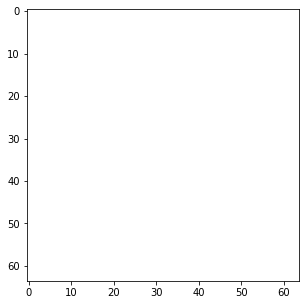

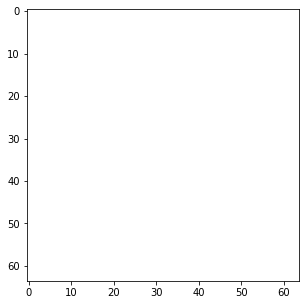

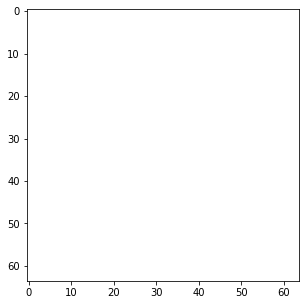

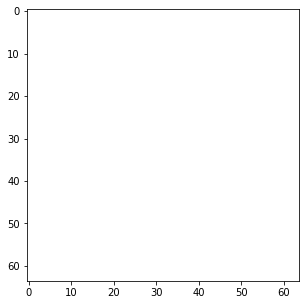

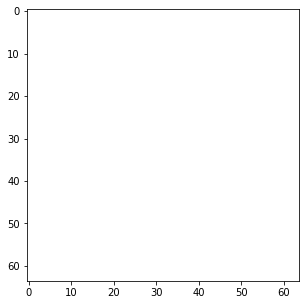

...

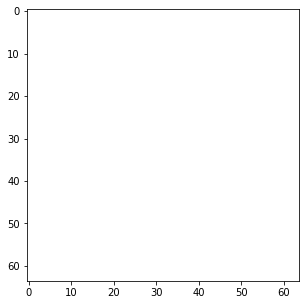

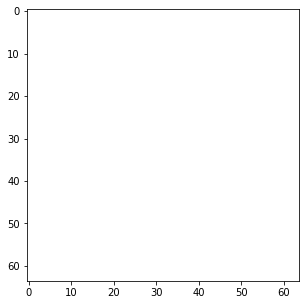

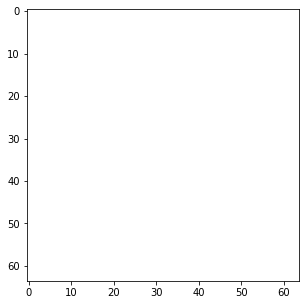

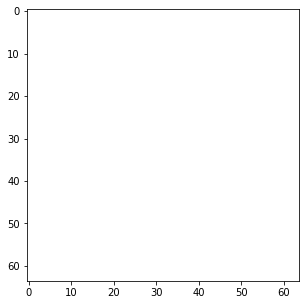

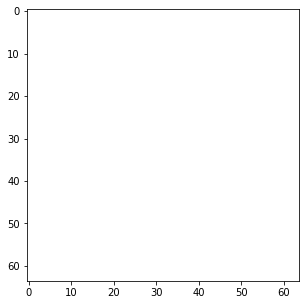

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

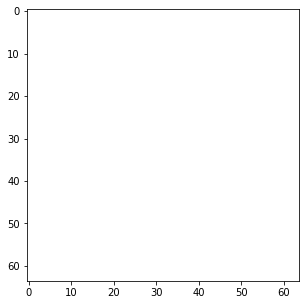

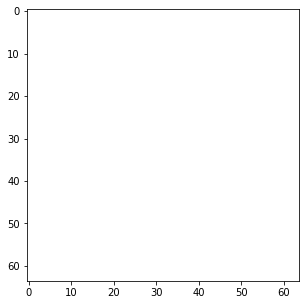

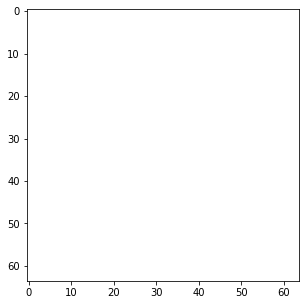

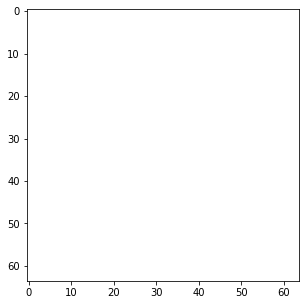

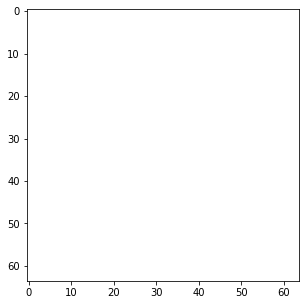

...

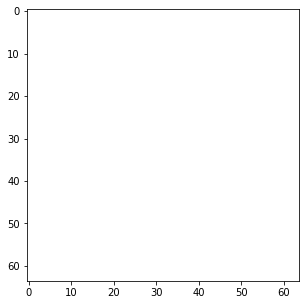

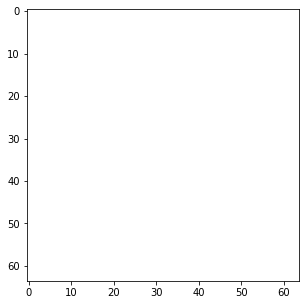

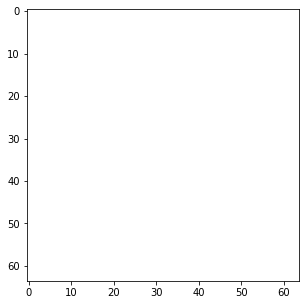

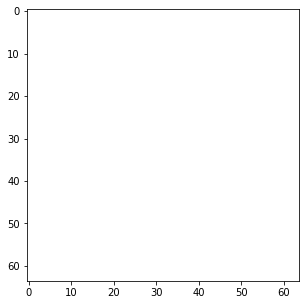

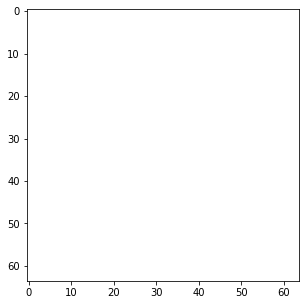

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

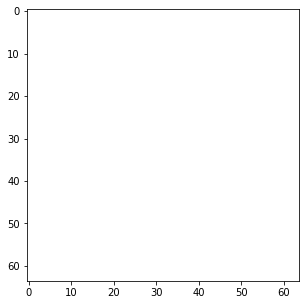

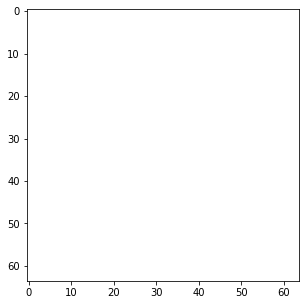

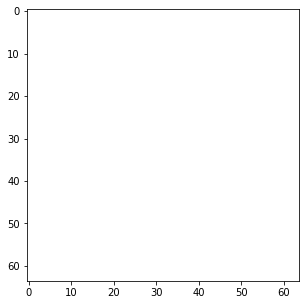

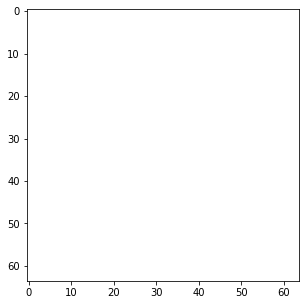

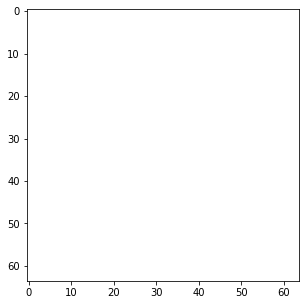

...

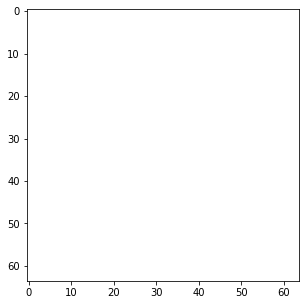

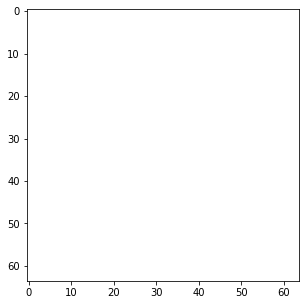

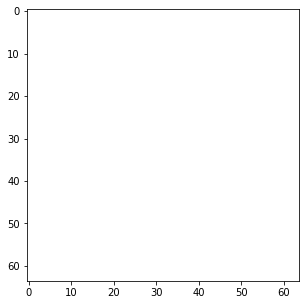

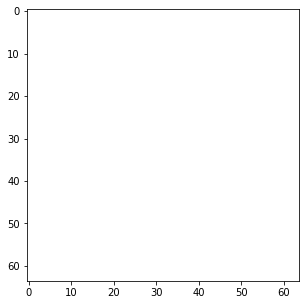

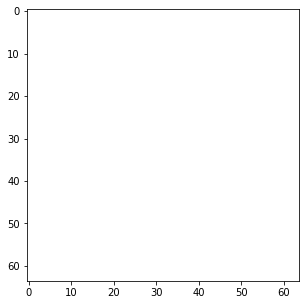

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

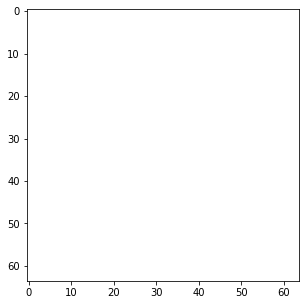

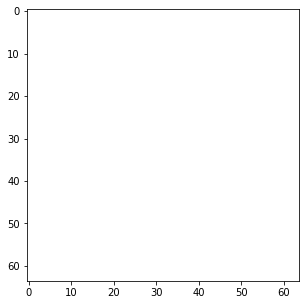

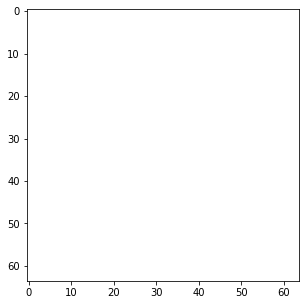

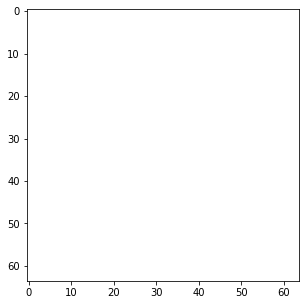

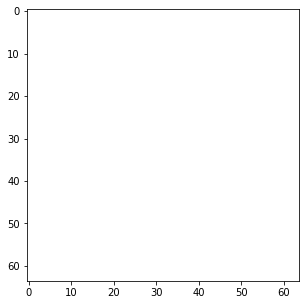

...

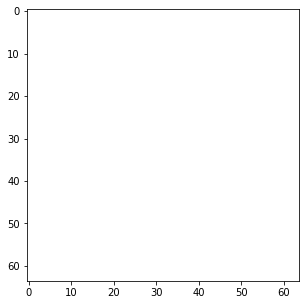

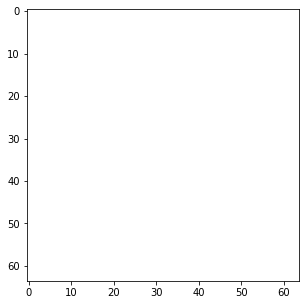

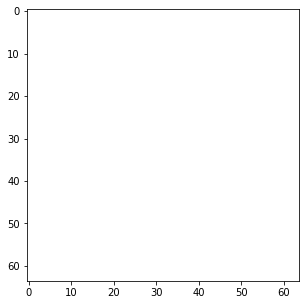

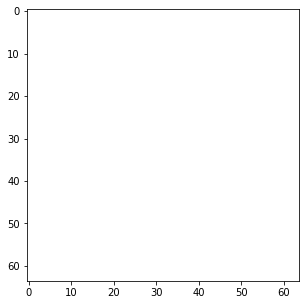

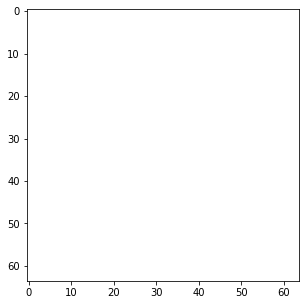

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

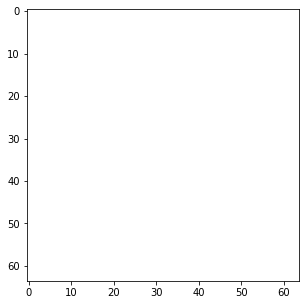

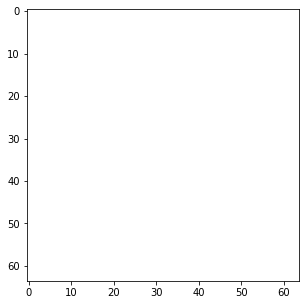

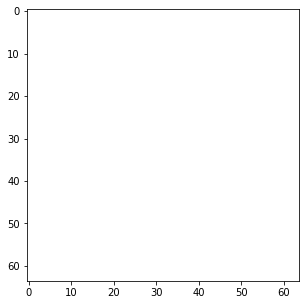

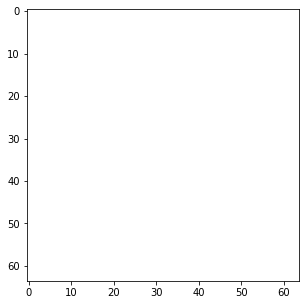

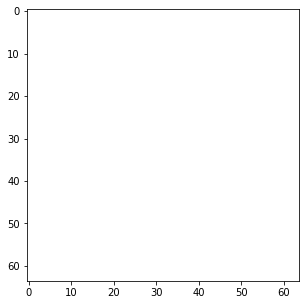

...

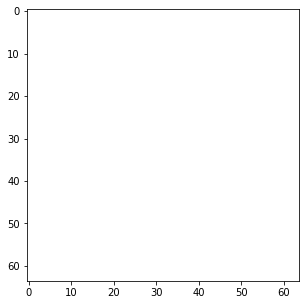

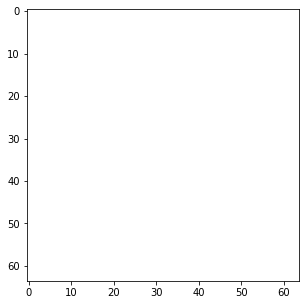

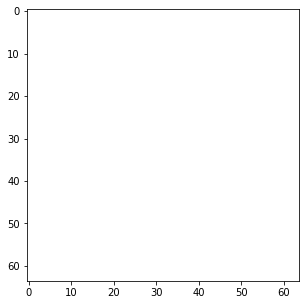

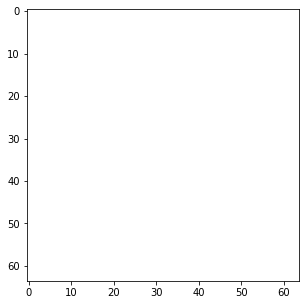

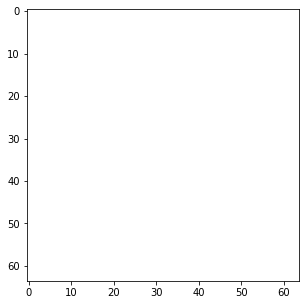

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

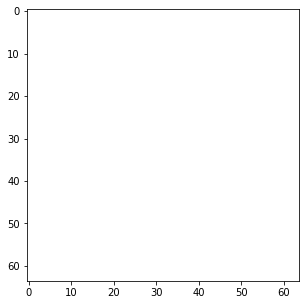

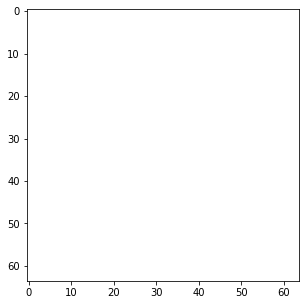

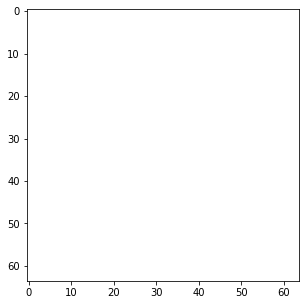

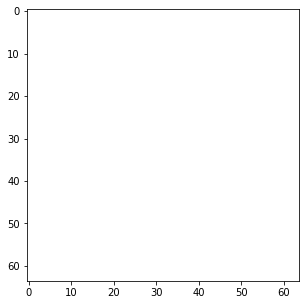

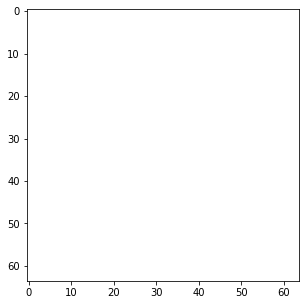

...

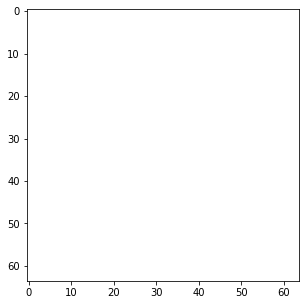

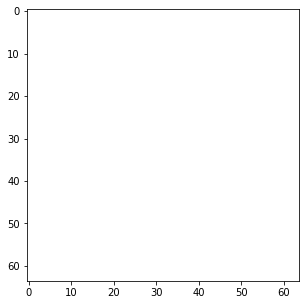

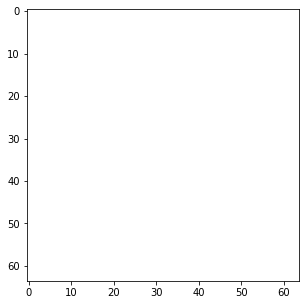

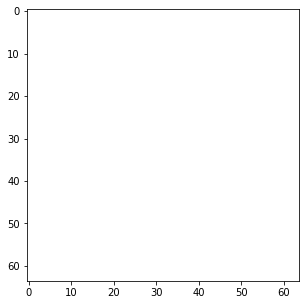

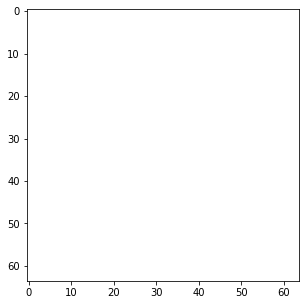

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

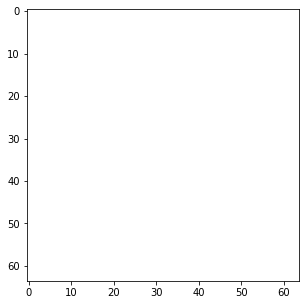

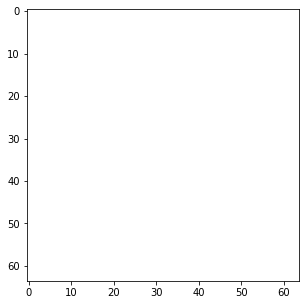

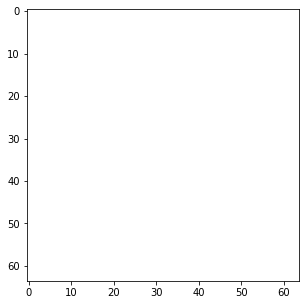

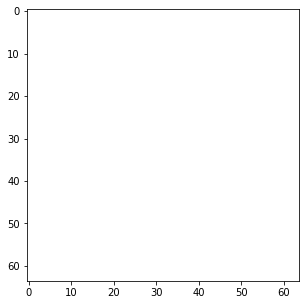

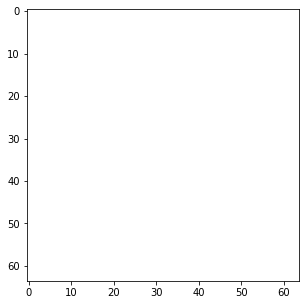

...

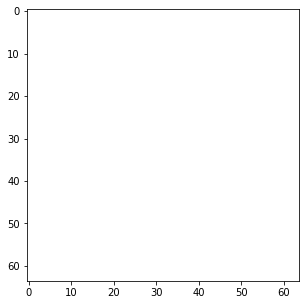

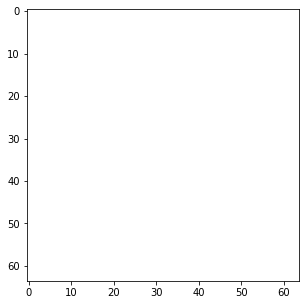

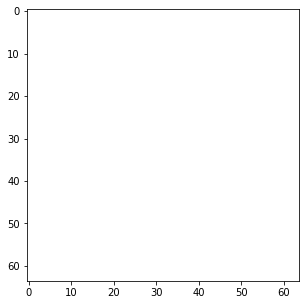

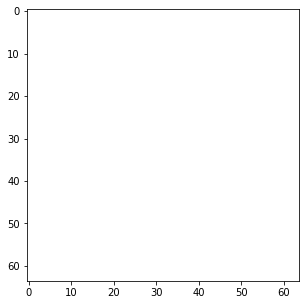

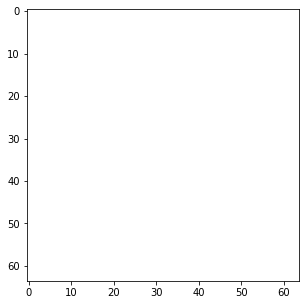

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

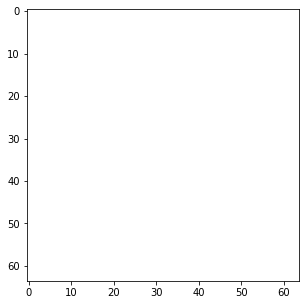

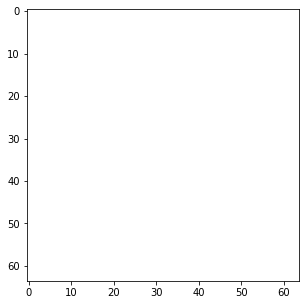

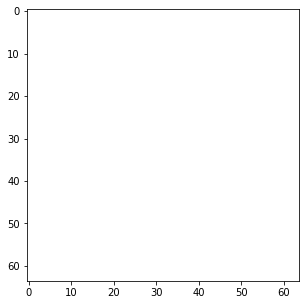

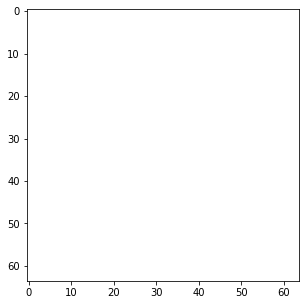

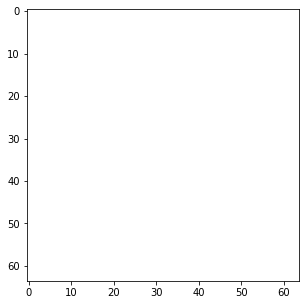

...

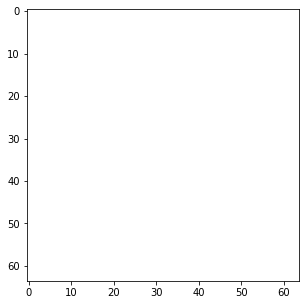

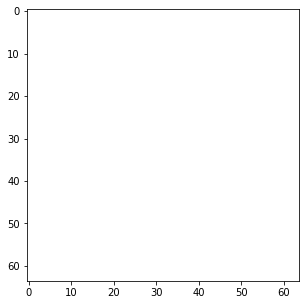

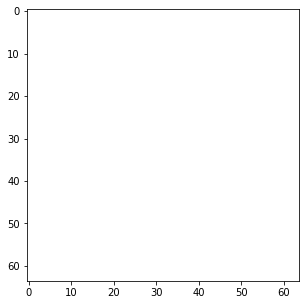

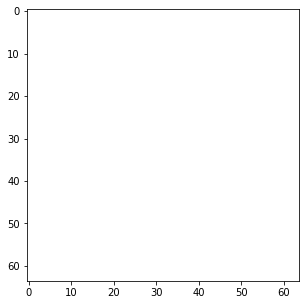

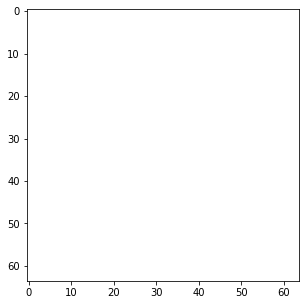

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

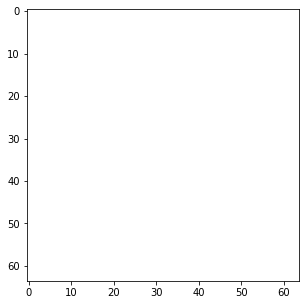

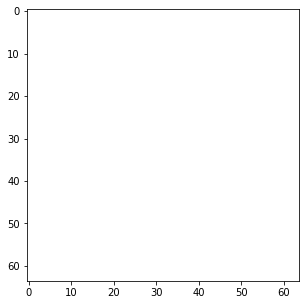

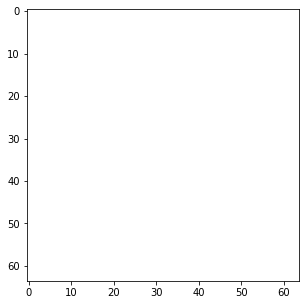

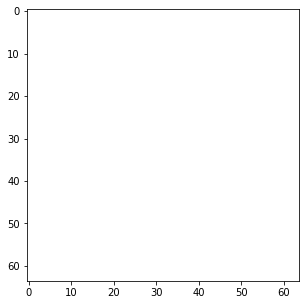

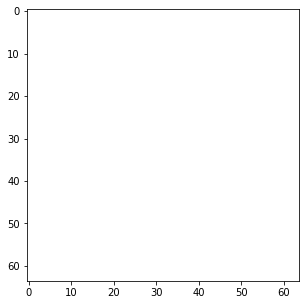

...

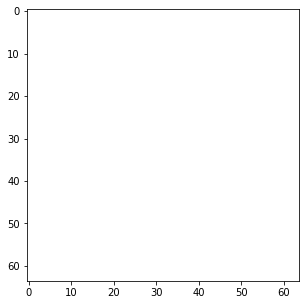

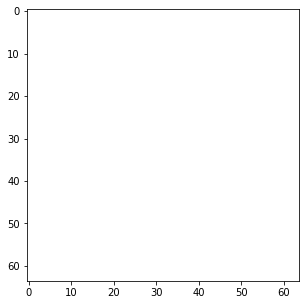

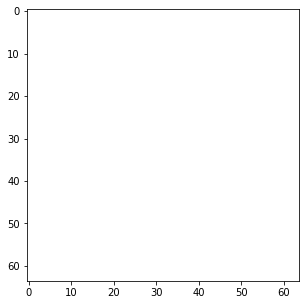

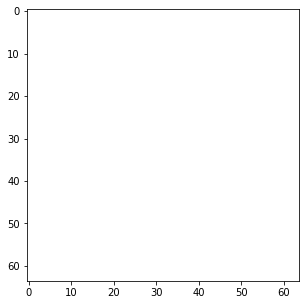

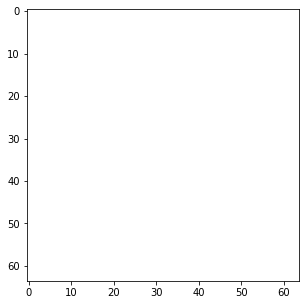

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

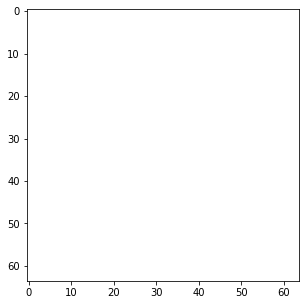

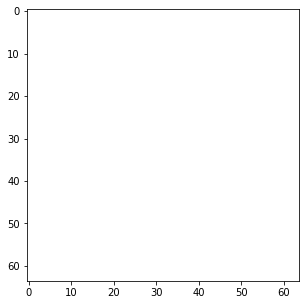

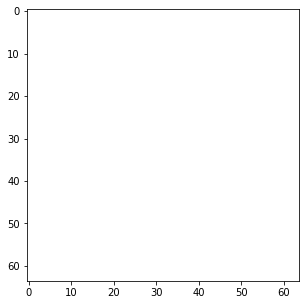

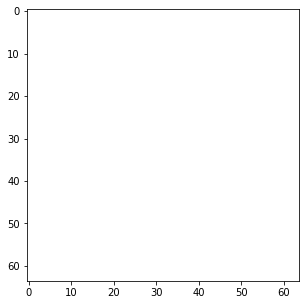

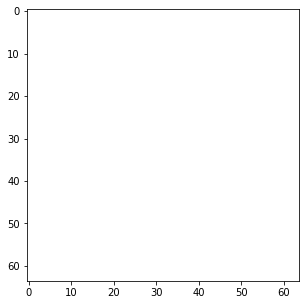

...

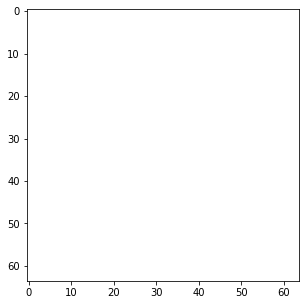

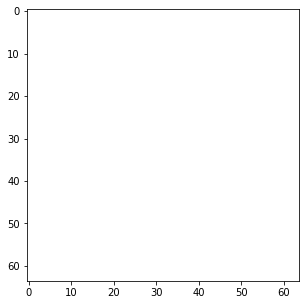

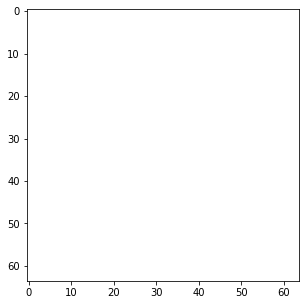

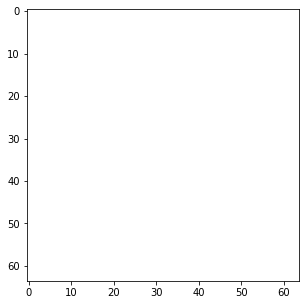

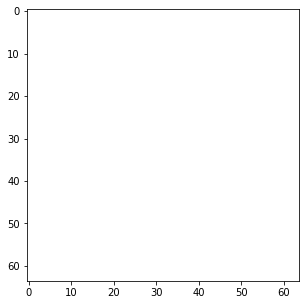

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

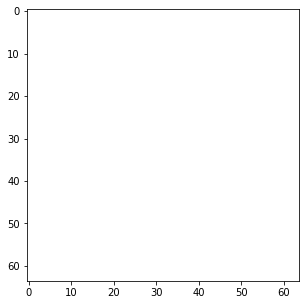

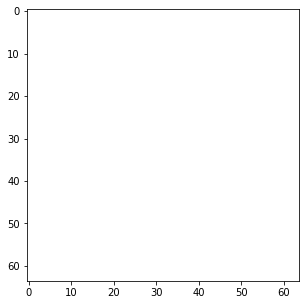

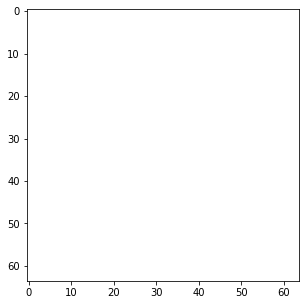

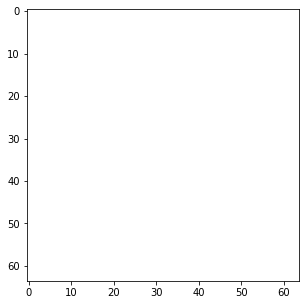

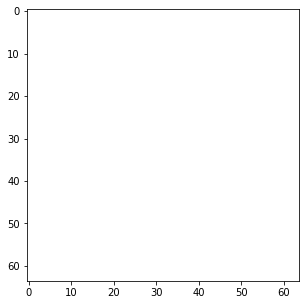

...

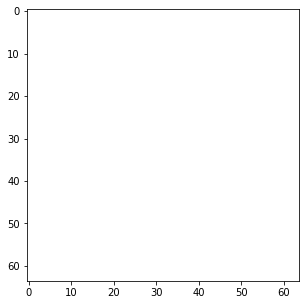

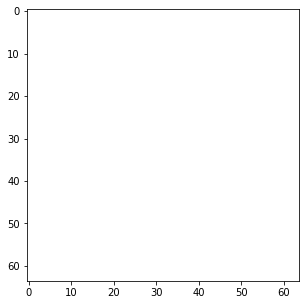

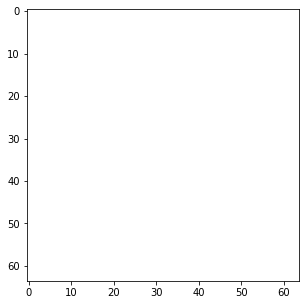

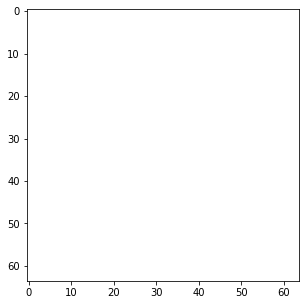

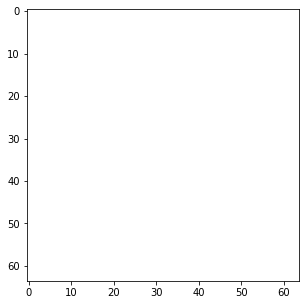

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

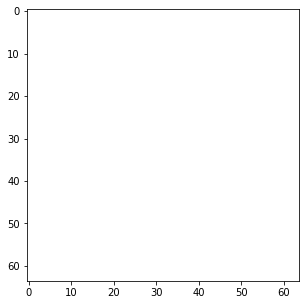

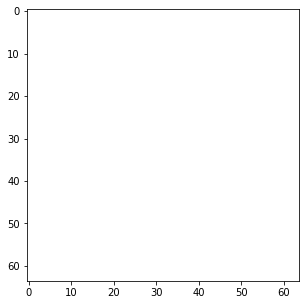

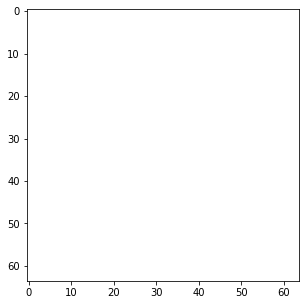

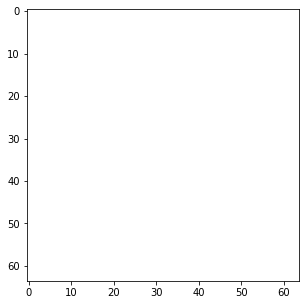

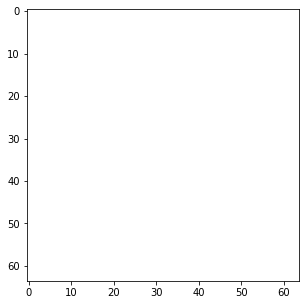

...

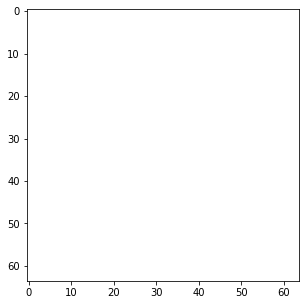

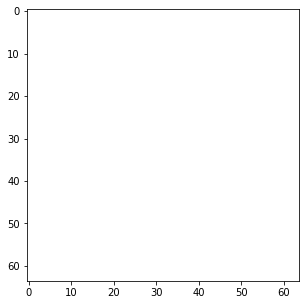

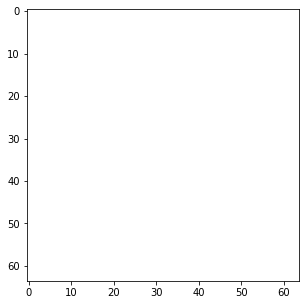

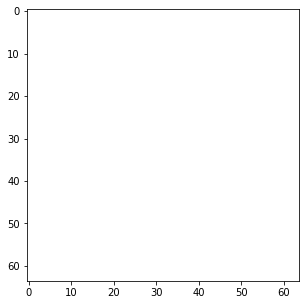

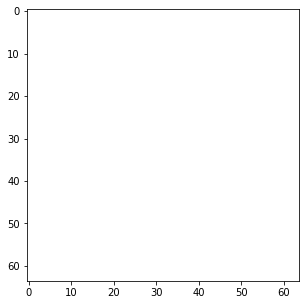

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

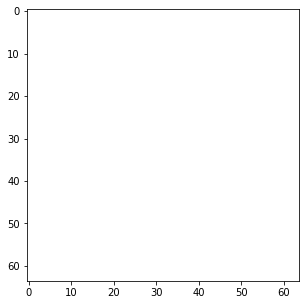

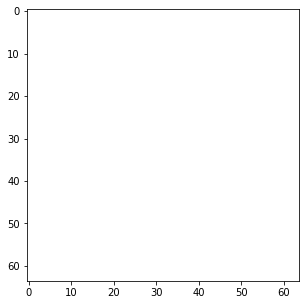

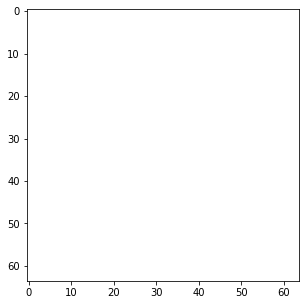

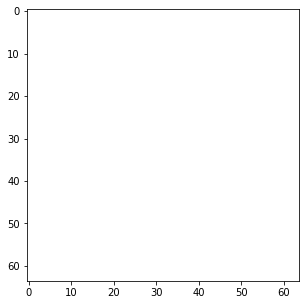

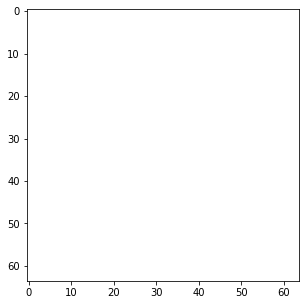

...

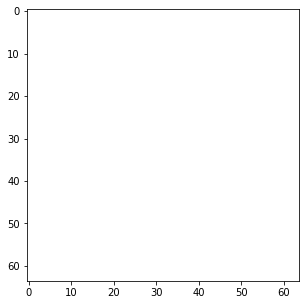

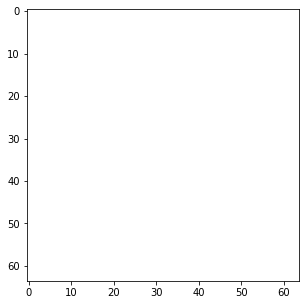

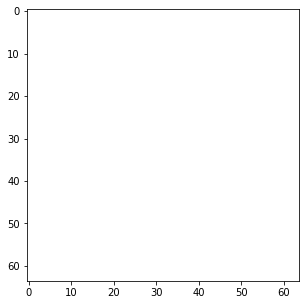

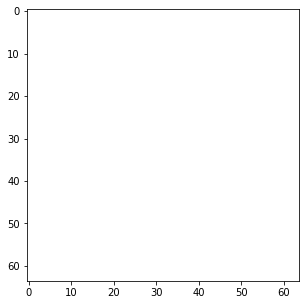

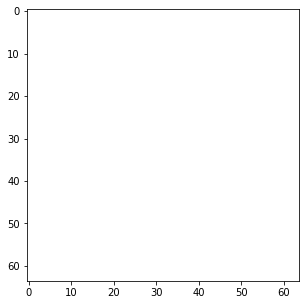

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

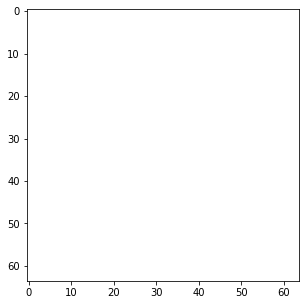

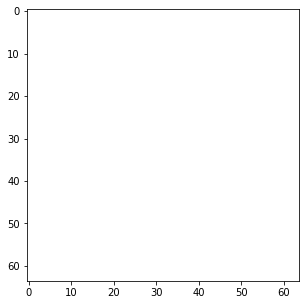

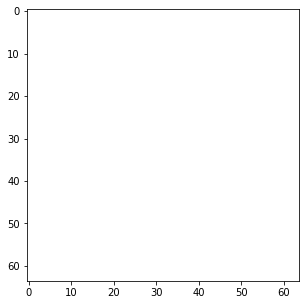

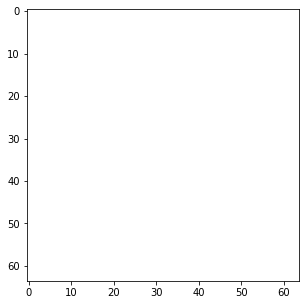

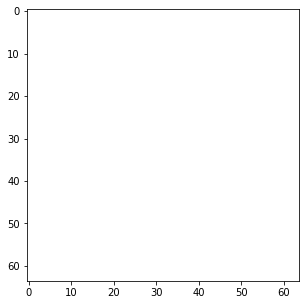

...

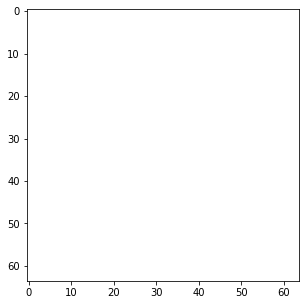

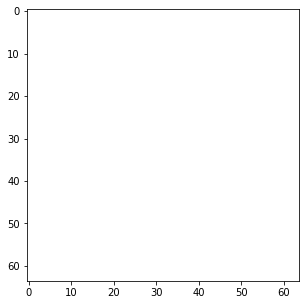

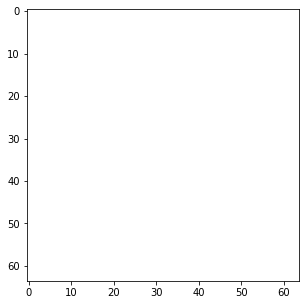

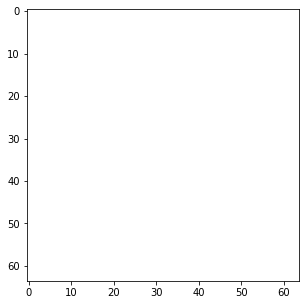

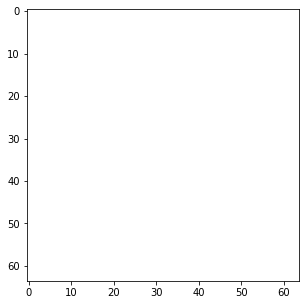

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

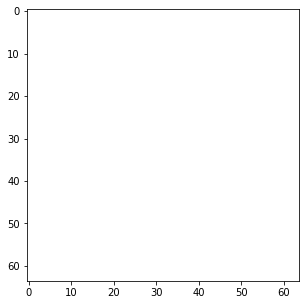

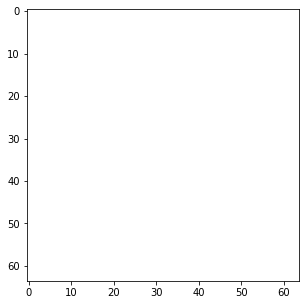

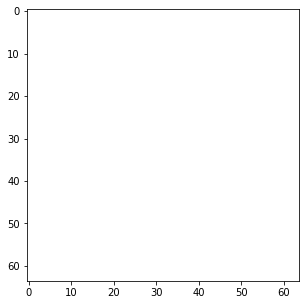

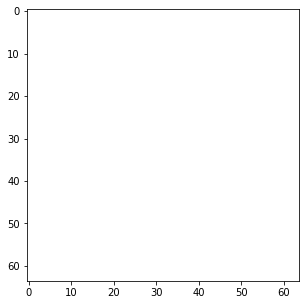

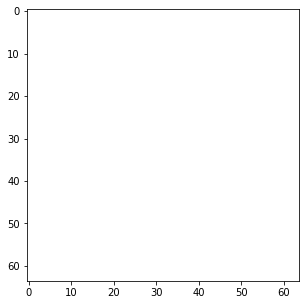

...

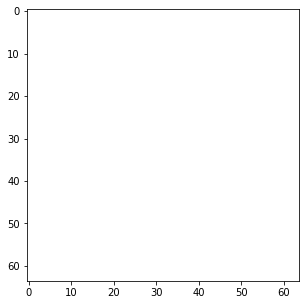

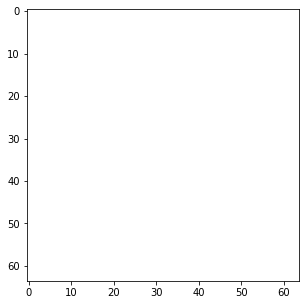

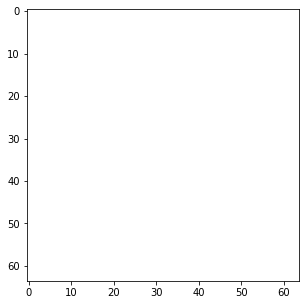

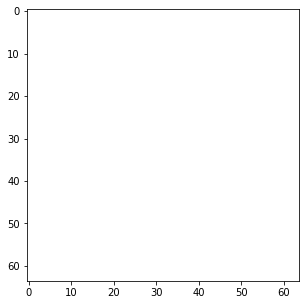

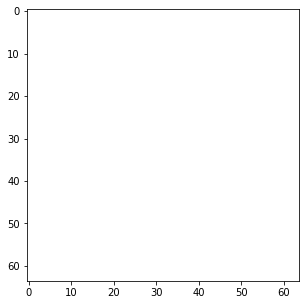

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

In [ ]:
#1 Splitting into Ti square ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_ring_ti=[];
pca_Ti_sqring=[];
for i in range(len(img_sq_ring_ti)):
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_ring_ti.append(cv2.resize(img_sq_ring_ti[i], target_size))
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_ring_ti[i])

for i in range(len(f_sq_ring_ti)):
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_ring_ti[i]) 
  print ("One Channel Shape: ", blue.shape)
#blue channel
  blue_df = pd.DataFrame(data = blue)
  blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  green_df
#red channel
  red_df = pd.DataFrame(data = red)
  red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_sqring.append(rgd_pca_df_np)
  print("img_sq_ring_cr_size_pca",np.array(pca_Ti_sqring).shape)






#2 Splitting into Ti rect

f_rect_ti=[]; #1
pca_Ti_rect=[]; #2
for i in range(len(img_rect_ti)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_rect_ti.append(cv2.resize(img_rect_ti[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_rect_ti[i]) #5

for i in range(len(f_rect_ti)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_rect_ti[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)

  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]
  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_rect.append(rgd_pca_df_np)              #8
  print("img_sq_rect_ti",np.array(pca_Ti_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#2 Splitting into Ti rect

f_cyl_ti=[]; #1
pca_Ti_cyl=[]; #2
for i in range(len(img_cyl_ti)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_ti.append(cv2.resize(img_cyl_ti[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_ti[i]) #5

for i in range(len(f_cyl_ti)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_ti[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)
  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_cyl.append(rgd_pca_df_np)              #8
  print("img_sq_rect_ti",np.array(pca_Ti_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#4 Splitting into Ti square
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_ti=[]; #1
pca_Ti_sq=[]; #2
for i in range(len(img_sq_ti)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_ti.append(cv2.resize(img_sq_ti[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_ti[i]) #5

for i in range(len(f_sq_ti)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_ti[i]) #7
  #print ("One Channel Shape: ", blue.shape)
  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  #print ("Blue Data Frame")
  #print (trans_pca_b_df)

  #print ("Green Data Frame")
  #print (trans_pca_g_df)

  #print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_sq.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_Ti_sq).shape)

#5 Splitting into Ti triangle

f_tri_ti=[]; #1
pca_Ti_tri=[]; #2
for i in range(len(img_triangle_ti)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_tri_ti.append(cv2.resize(img_triangle_ti[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_tri_ti[i]) #5

for i in range(len(f_tri_ti)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_tri_ti[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df

  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_tri.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_Ti_sq).shape)


#6 Splitting into chromium img_cir_ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_cir_ring_ti=[]; #1
pca_Ti_cir_ring=[]; #2
for i in range(len(img_cir_ring_ti)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cir_ring_ti.append(cv2.resize(img_cir_ring_ti[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cir_ring_ti[i]) #5

for i in range(len(f_cir_ring_ti)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cir_ring_ti[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_cir_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_ti",np.array(pca_Ti_cir_ring).shape)

#7 Splitting into chromium img_cross
f_cross_ti=[]; #1
pca_Ti_cross=[]; #2
for i in range(len(img_cross_ti)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cross_ti.append(cv2.resize(img_cross_ti[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cross_ti[i]) #5
for i in range(len(f_cross_ti)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cross_ti[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_cross.append(rgd_pca_df_np)              #8
  print("img_cir_ring_cr",np.array(pca_Ti_cir_ring).shape)
#Its shape is now 4608x1 instead of 64x72




#8 Splitting into chromium img_ellipse

f_ellipse_ti=[]; #1
pca_Ti_ellipse=[]; #2
for i in range(len(img_ellipse_ti)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_ellipse_ti.append(cv2.resize(img_ellipse_ti[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_ellipse_ti[i]) #5

for i in range(len(f_ellipse_ti)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_ellipse_ti[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_ellipse.append(rgd_pca_df_np)              #8
  print("img_ellipse_ti",np.array(pca_Ti_cir_ring).shape)

#8 Splitting into ti _elliptical_ring

f_elliptical_ring_ti=[]; #1
pca_Ti_elliptical_ring=[]; #2
for i in range(len(img_elliptical_ring_ti)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_elliptical_ring_ti.append(cv2.resize(img_elliptical_ring_ti[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_elliptical_ring_ti[i]) #5

for i in range(len(f_elliptical_ring_ti)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_elliptical_ring_ti[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_elliptical_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_ti",np.array(pca_Ti_cir_ring).shape)

#10 Splitting into chromium _T shaped

f_T_ti=[]; #1
pca_Ti_T=[]; #2
for i in range(len(img_T_ti)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_T_ti.append(cv2.resize(img_T_ti[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_T_ti[i]) #5

for i in range(len(f_T_ti)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_T_ti[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_T.append(rgd_pca_df_np)              #8
  print("img_T_ti",np.array(pca_Ti_T).shape)

#10 Splitting into chromium Hexagon

f_hex_ti=[]; #1
pca_Ti_hex=[]; #2
for i in range(len(img_hex_ti)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_hex_ti.append(cv2.resize(img_hex_ti[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_hex_ti[i]) #5
for i in range(len(f_hex_ti)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_hex_ti[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_hex.append(rgd_pca_df_np)              #8
  print("img_hex_ti",np.array(pca_Ti_hex).shape)


#11 Splitting into chromium F-shaped

f_F_ti=[]; #1
pca_Ti_F=[]; #2
for i in range(len(img_F_ti)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_F_ti.append(cv2.resize(img_F_ti[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_F_ti[i]) #5

for i in range(len(f_F_ti)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_F_ti[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_F.append(rgd_pca_df_np)              #8
  print("img_hex_ti",np.array(pca_Ti_F).shape)


#12 Splitting into chromium Square SC
f_sq_SC_ti=[]; #1
pca_Ti_sq_SC=[]; #2
for i in range(len(img_sq_SC_ti)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_SC_ti.append(cv2.resize(img_sq_SC_ti[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_SC_ti[i]) #5

for i in range(len(f_sq_SC_ti)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_SC_ti[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_sq_SC.append(rgd_pca_df_np)              #8
  print("img_hex_sq_SC",np.array(pca_Ti_sq_SC).shape)

#13 Splitting into chromium Z shaped
f_Z_ti=[]; #1
pca_Ti_Z=[]; #2
for i in range(len(img_Z_ti)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_Z_ti.append(cv2.resize(img_Z_ti[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_Z_ti[i]) #5

for i in range(len(f_Z_ti)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_Z_ti[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)
  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_Z.append(rgd_pca_df_np)              #8
  print("img_Z_ti",np.array(pca_Ti_Z).shape)



#14 Splitting into chromium star
f_star_ti=[]; #1
pca_Ti_star=[]; #2
for i in range(len(img_star_ti)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_star_ti.append(cv2.resize(img_star_ti[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_star_ti[i]) #5

for i in range(len(f_star_ti)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_star_ti[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)
  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_star.append(rgd_pca_df_np)              #8
  print("img_Z_ti",np.array(pca_Ti_Z).shape)

#16 Splitting into chromium cyl_Sc

f_cyl_SC_ti=[]; #1
pca_Ti_cyl_SC=[]; #2
for i in range(len(img_cyl_SC_ti)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_SC_ti.append(cv2.resize(img_cyl_SC_ti[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_SC_ti[i]) #5

for i in range(len(f_cyl_SC_ti)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_SC_ti[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_Ti_cyl_SC.append(rgd_pca_df_np)              #8
  print("img_Z_ti",np.array(pca_Ti_cyl_SC).shape)


In [ ]:
reps = (25,1)
all_pca_sqring_ti =np.tile(pca_Ti_sqring,reps) #1
all_pca_rect_ti=np.tile(pca_Ti_rect,reps) #2
all_pca_cyl_ti =np.tile(pca_Ti_cyl,reps) #3
all_pca_sq_ti = np.tile(pca_Ti_sq,reps) #4
all_pca_tri_ti = np.tile(pca_Ti_tri,reps)#5
all_pca_cir_ring_ti = np.tile(pca_Ti_cir_ring,reps) #6
all_pca_cross_ti = np.tile(pca_Ti_cross,reps) #7
all_pca_ellipse_ti = np.tile(pca_Ti_ellipse,reps) #8
all_pca_elliptical_ring_ti = np.tile(pca_Ti_elliptical_ring,reps) #9
all_pca_T_ti = np.tile(pca_Ti_T,reps)#10
all_pca_hex_ti = np.tile(pca_Ti_hex,reps)#11
all_pca_F_ti = np.tile(pca_Ti_F,reps) #12
all_pca_sq_SC_ti = np.tile(pca_Ti_sq_SC,reps) #13
all_pca_Z_ti=np.tile(pca_Ti_Z,reps)
all_pca_star_ti=np.tile(pca_Ti_star,reps)
all_pca_cyl_SC_ti=np.tile(pca_Ti_cyl_SC,reps)
print(all_pca_cross_ti.shape)



(325, 1920)


In [ ]:

all_img_Ti= np.concatenate((all_pca_sqring_ti,all_pca_rect_ti,all_pca_cyl_ti,all_pca_sq_ti,all_pca_tri_ti,all_pca_cir_ring_ti,all_pca_cross_ti,all_pca_ellipse_ti,all_pca_elliptical_ring_ti,all_pca_T_ti,all_pca_hex_ti,all_pca_F_ti,all_pca_sq_SC_ti,all_pca_Z_ti,all_pca_star_ti,all_pca_cyl_SC_ti ),axis=0)
print(all_img_CR.shape)



(5200, 1920)


# Tungsten

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (6, 1920

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

(64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_w (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (1, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (2, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (3, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (4, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (5, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (6, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (7, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (8, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (9, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (10, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (11, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (12, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (6, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (12, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_w (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_w (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_w (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_w (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_w (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_w (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_w (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_w (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_w (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_w (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_w (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_w (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_w (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_w (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_w (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_w (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_w (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (6, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape: 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:888: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


 (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (10, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_w (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (10, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_w (13, 1920)


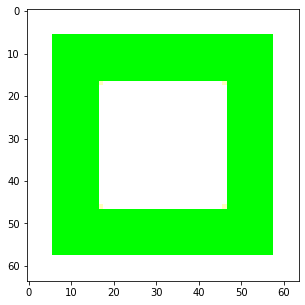

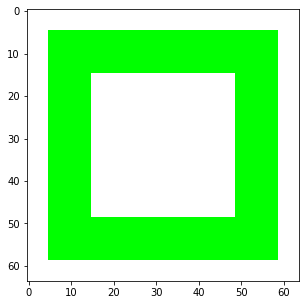

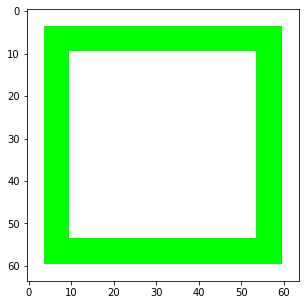

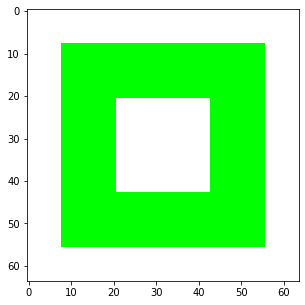

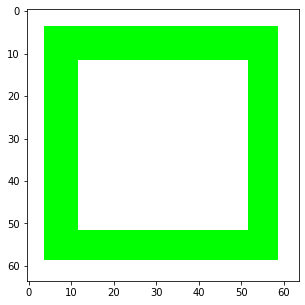

...

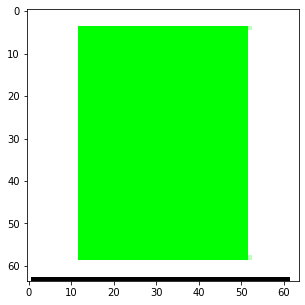

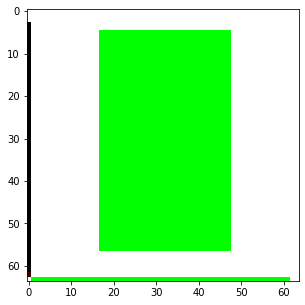

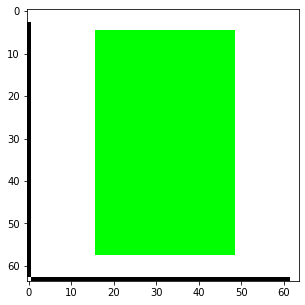

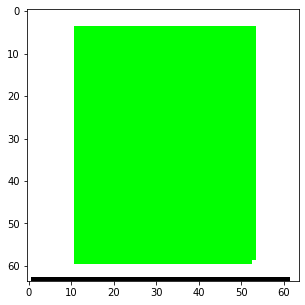

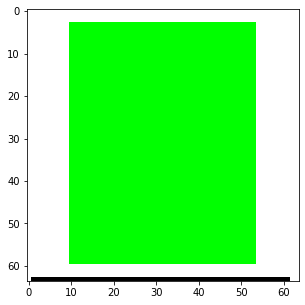

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

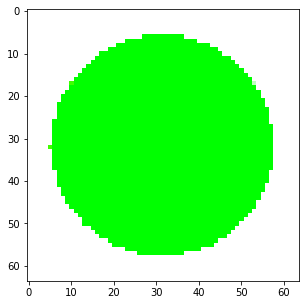

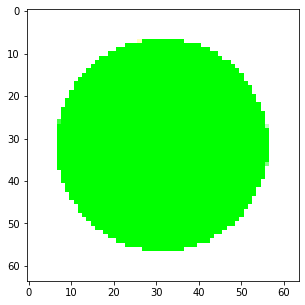

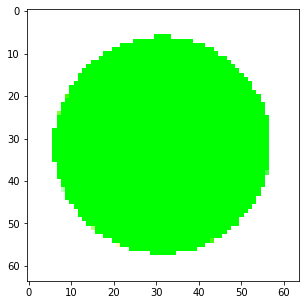

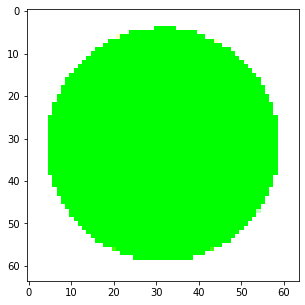

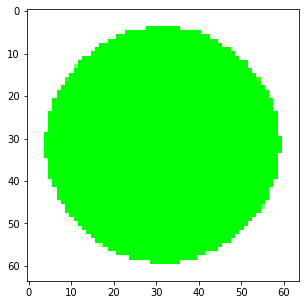

...

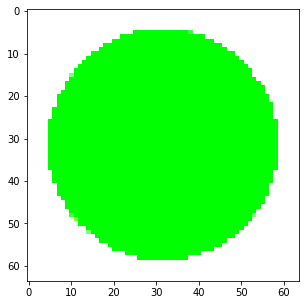

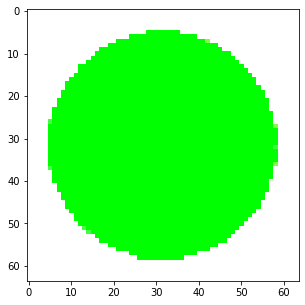

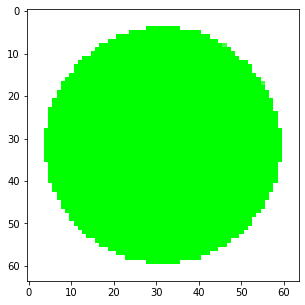

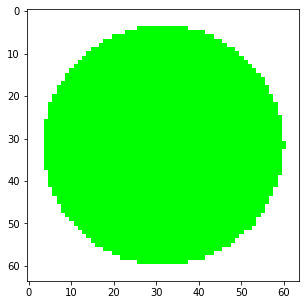

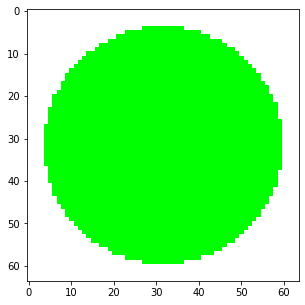

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

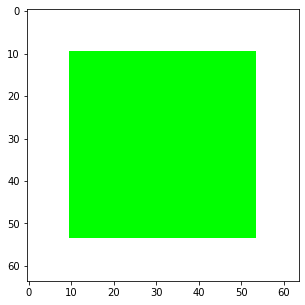

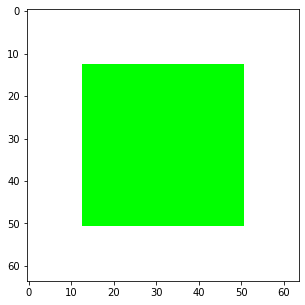

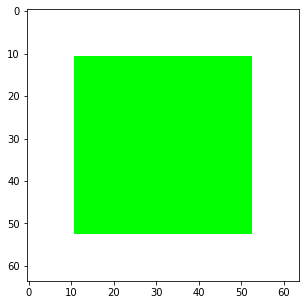

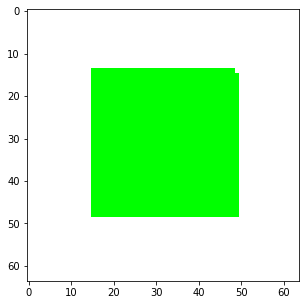

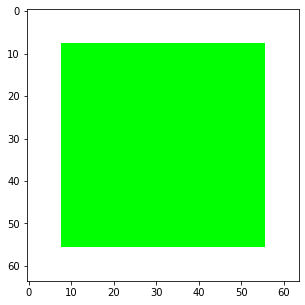

...

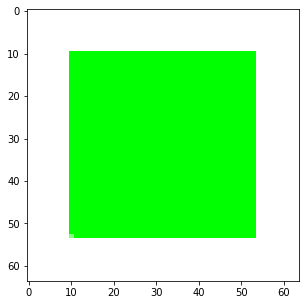

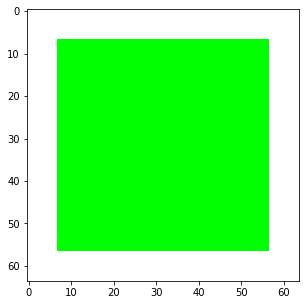

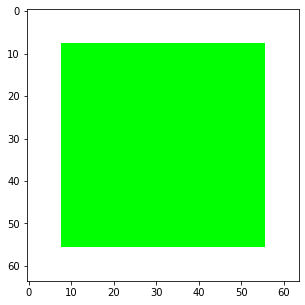

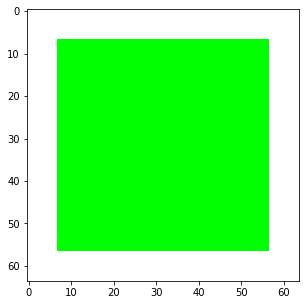

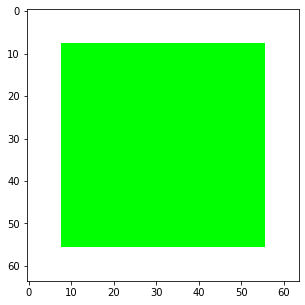

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

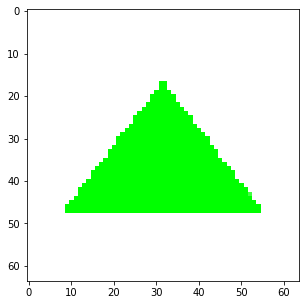

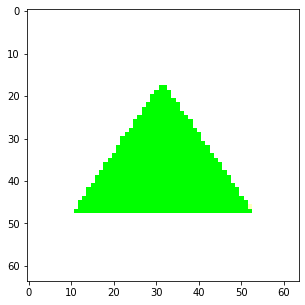

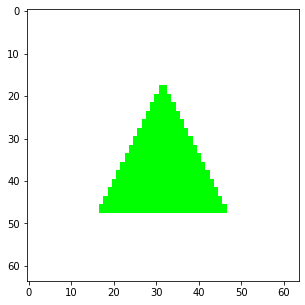

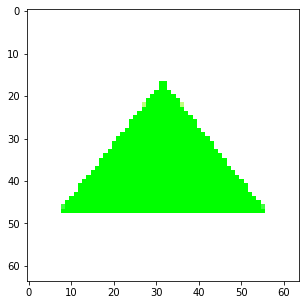

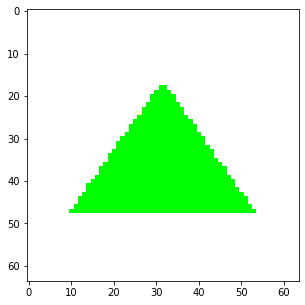

...

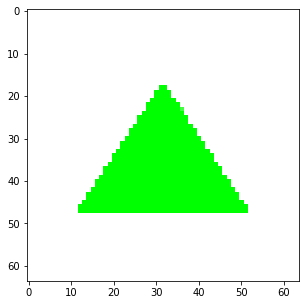

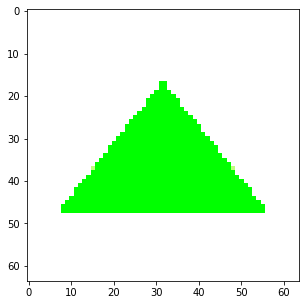

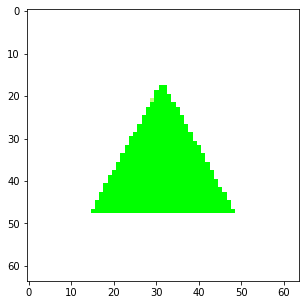

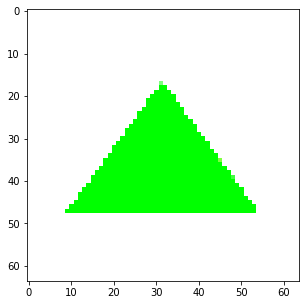

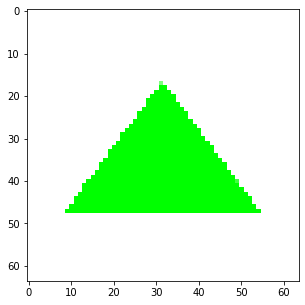

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

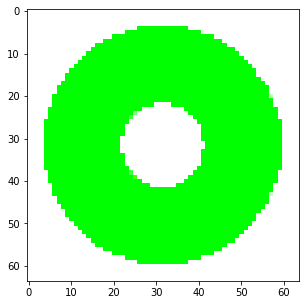

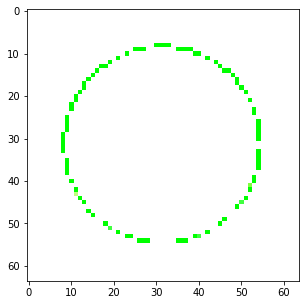

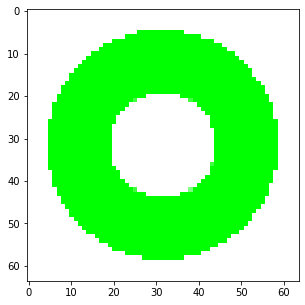

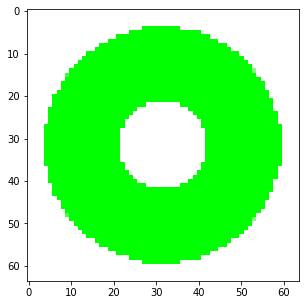

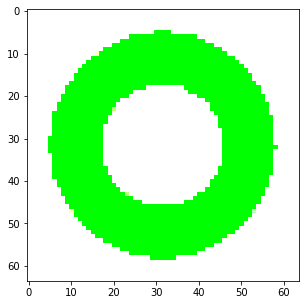

...

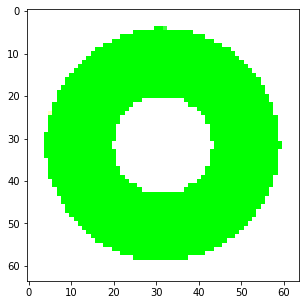

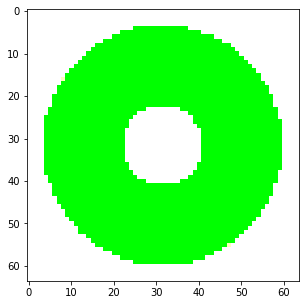

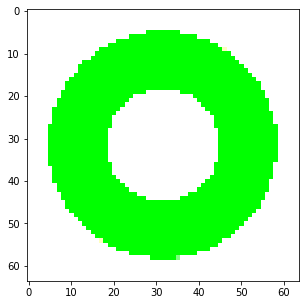

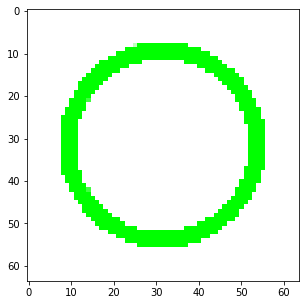

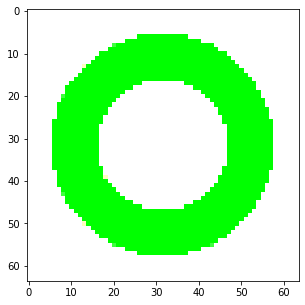

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

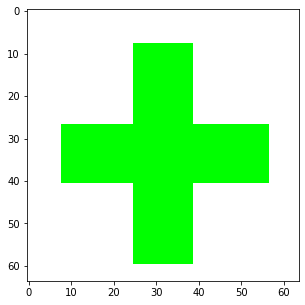

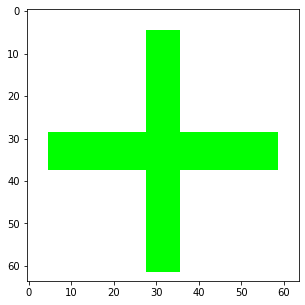

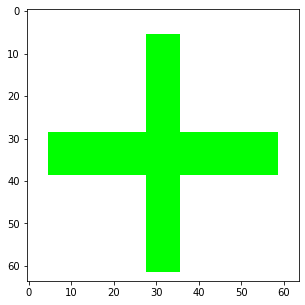

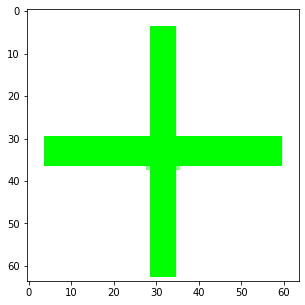

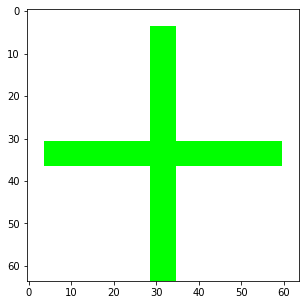

...

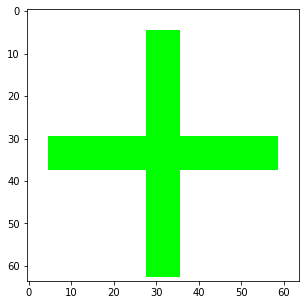

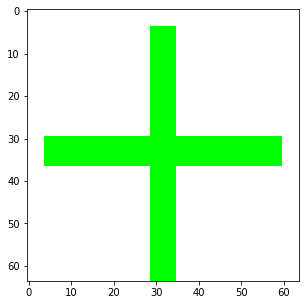

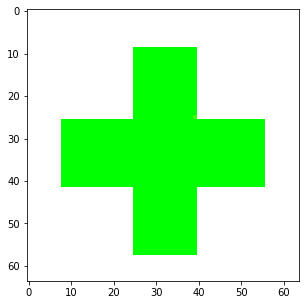

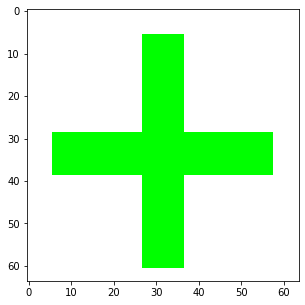

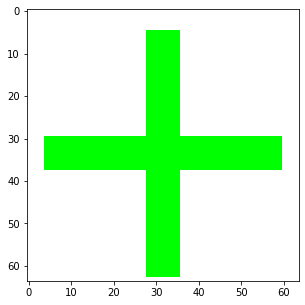

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

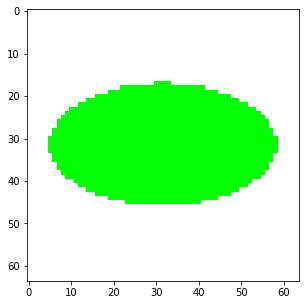

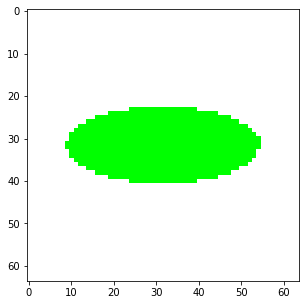

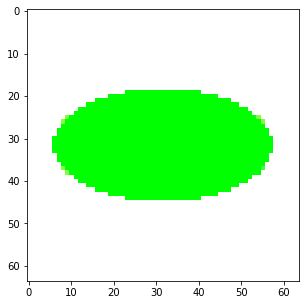

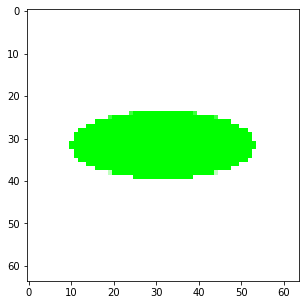

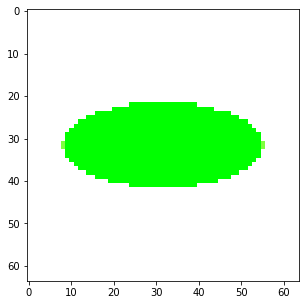

...

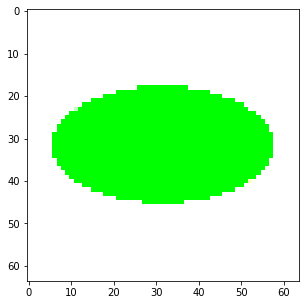

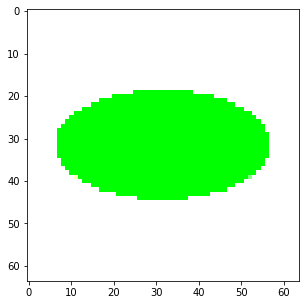

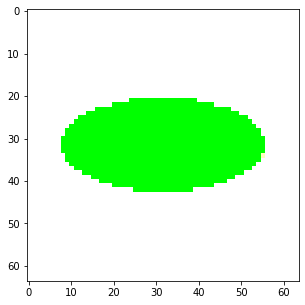

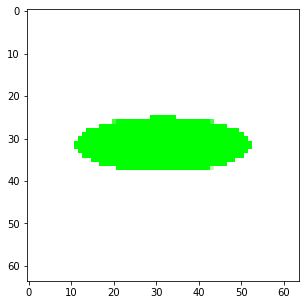

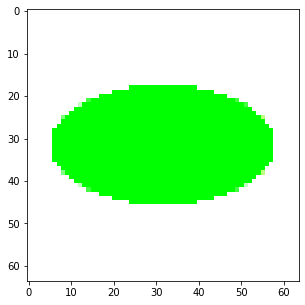

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

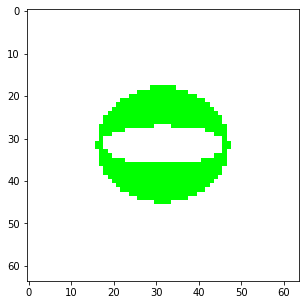

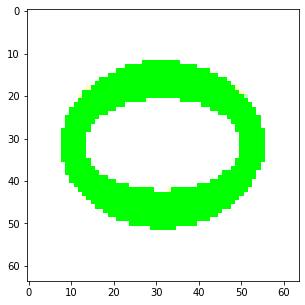

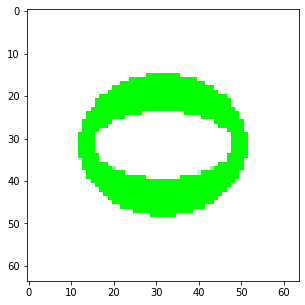

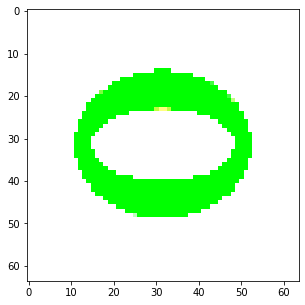

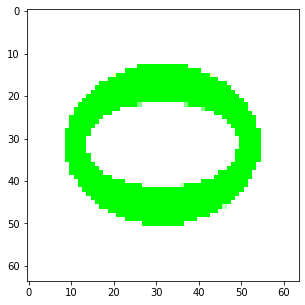

...

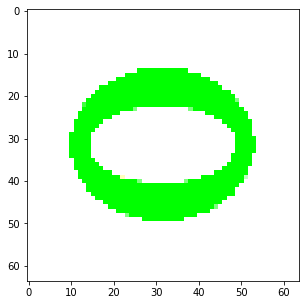

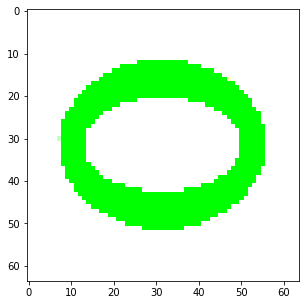

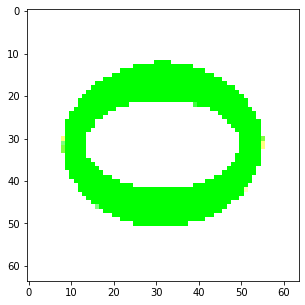

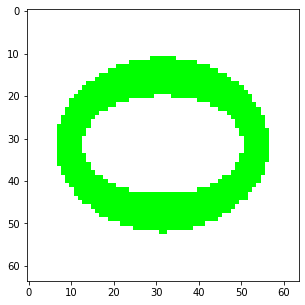

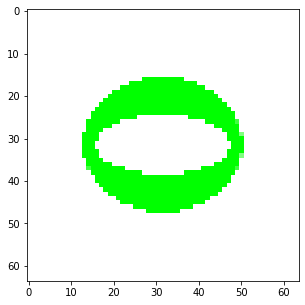

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

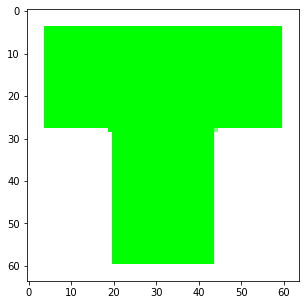

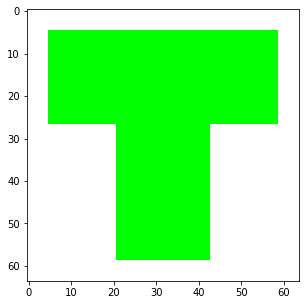

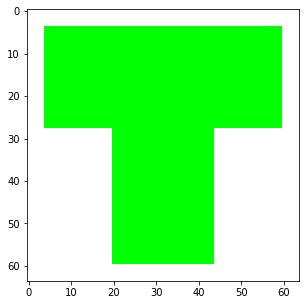

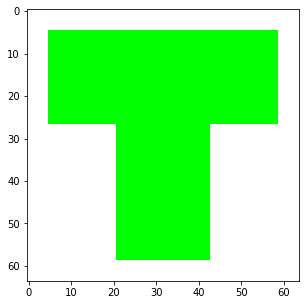

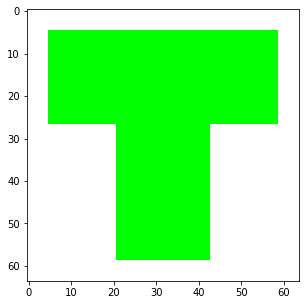

...

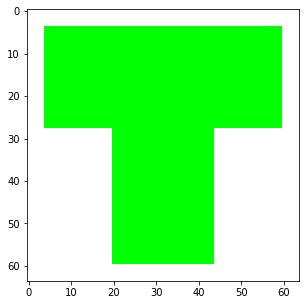

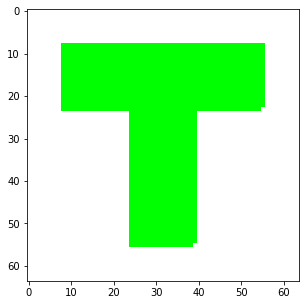

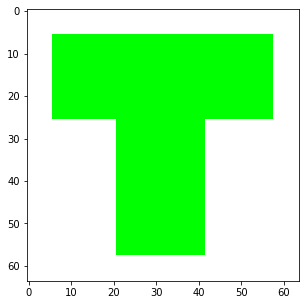

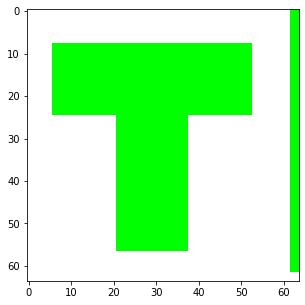

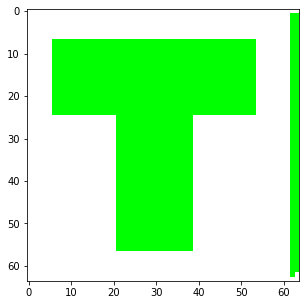

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

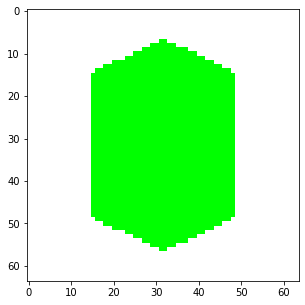

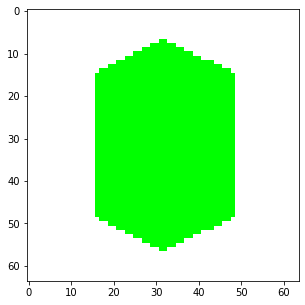

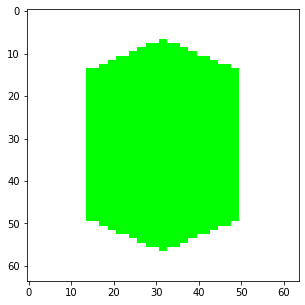

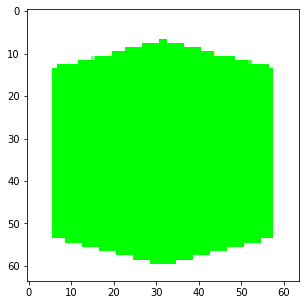

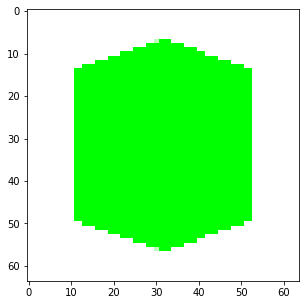

...

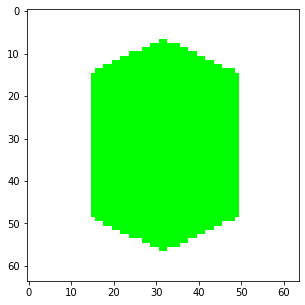

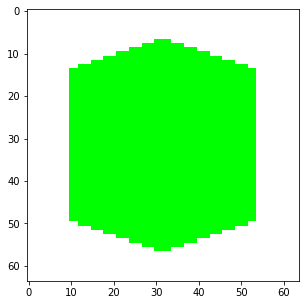

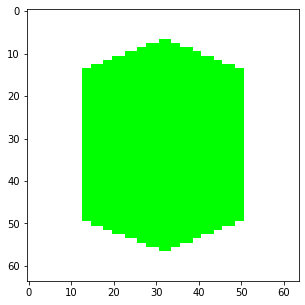

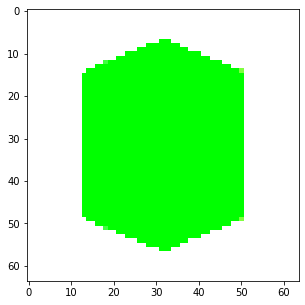

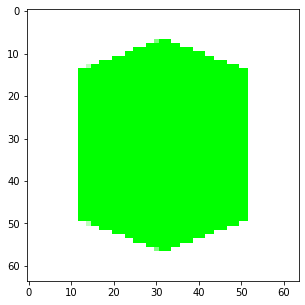

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

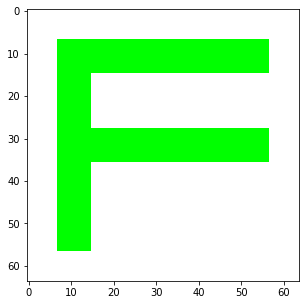

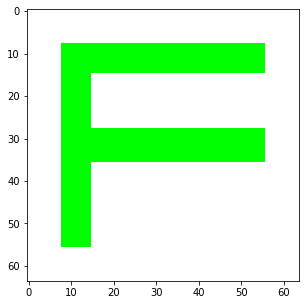

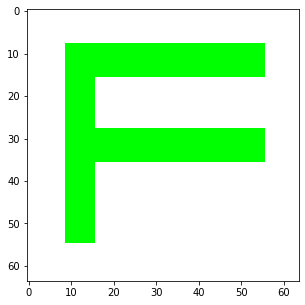

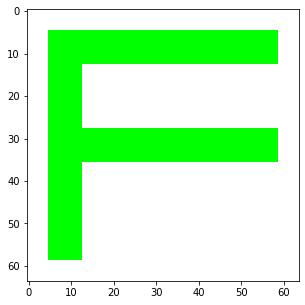

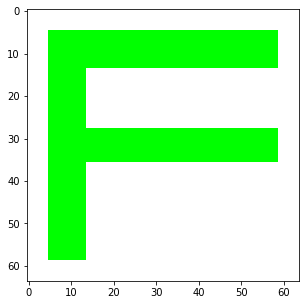

...

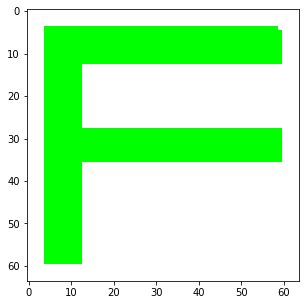

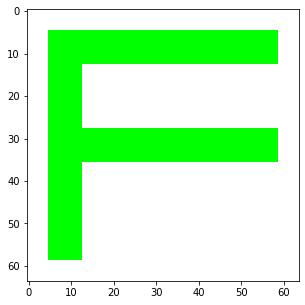

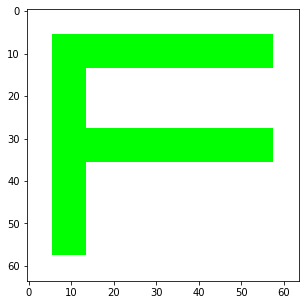

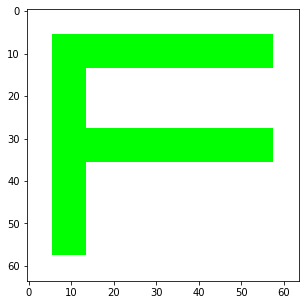

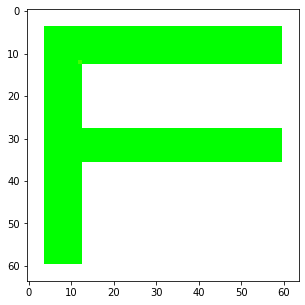

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

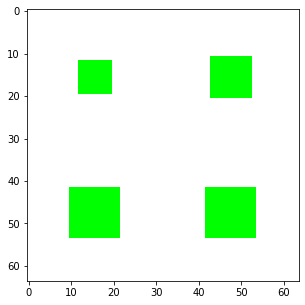

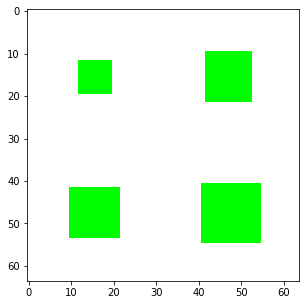

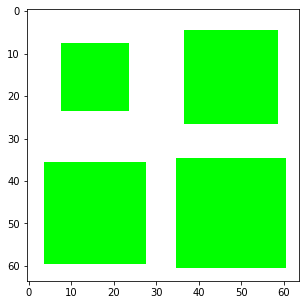

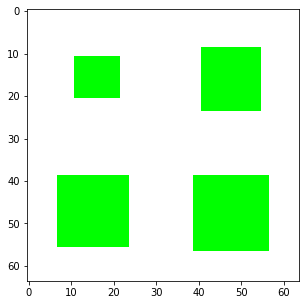

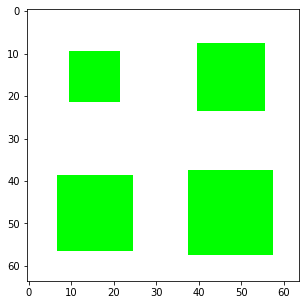

...

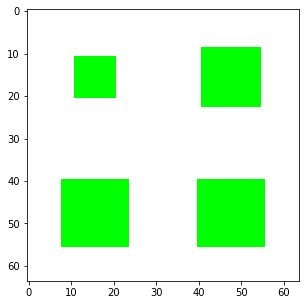

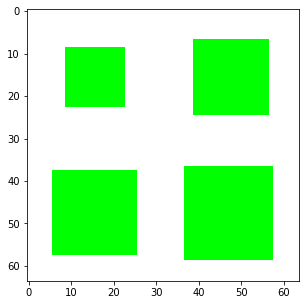

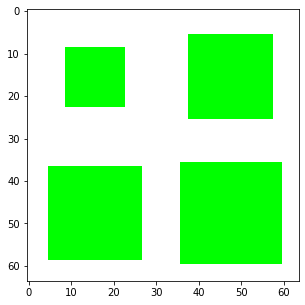

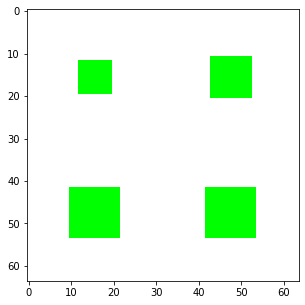

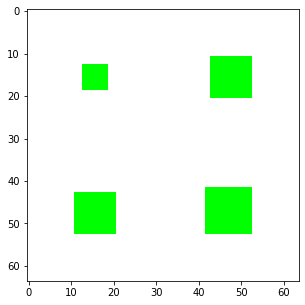

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

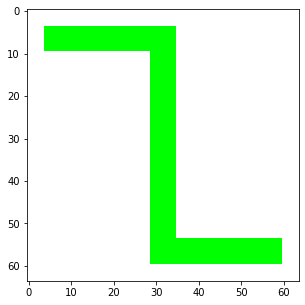

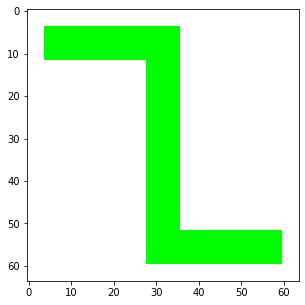

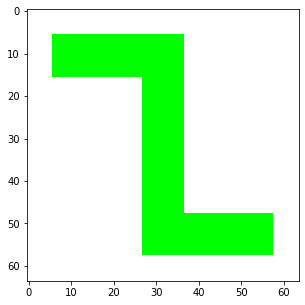

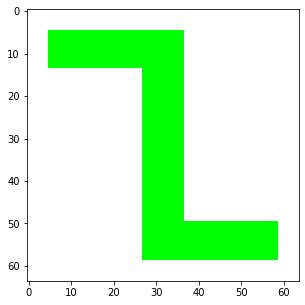

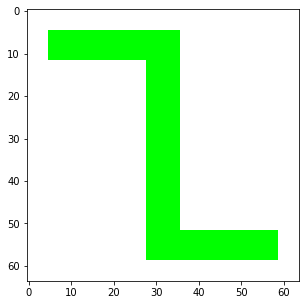

...

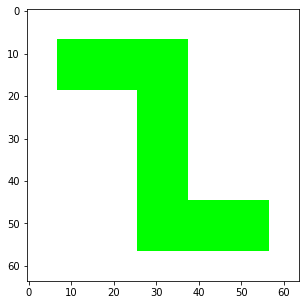

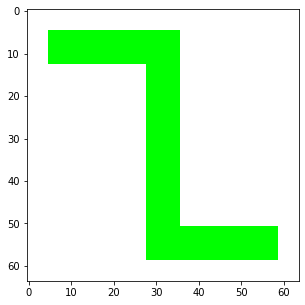

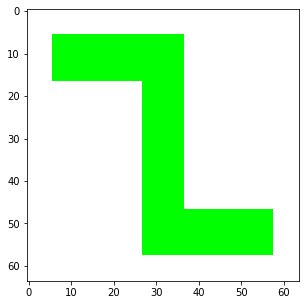

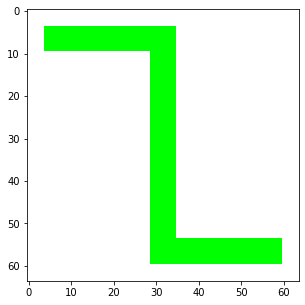

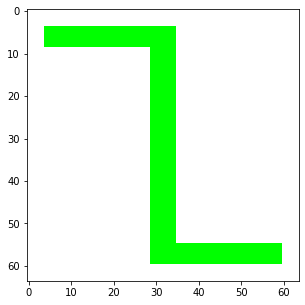

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

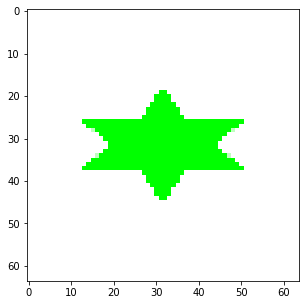

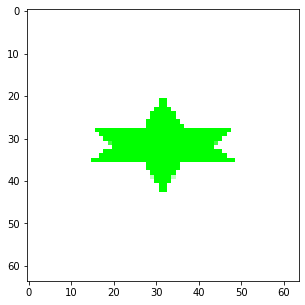

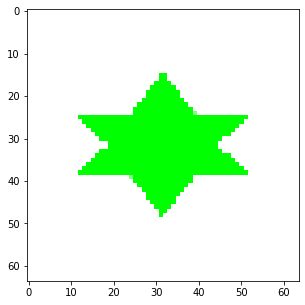

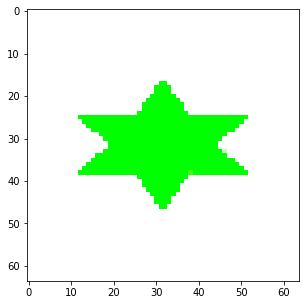

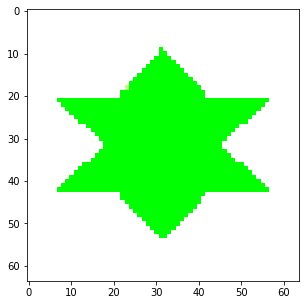

...

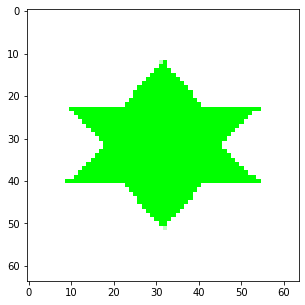

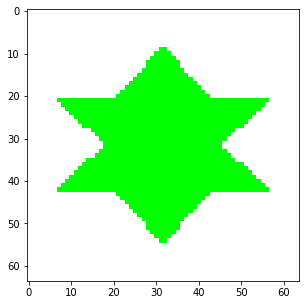

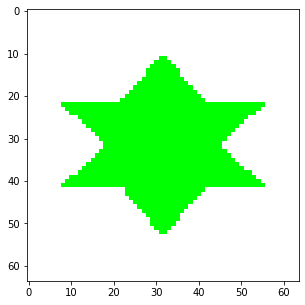

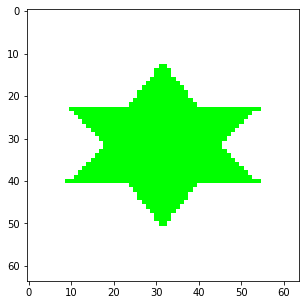

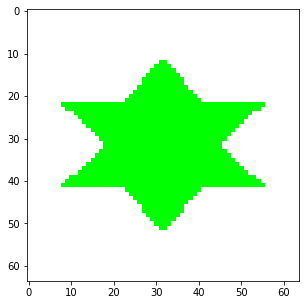

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

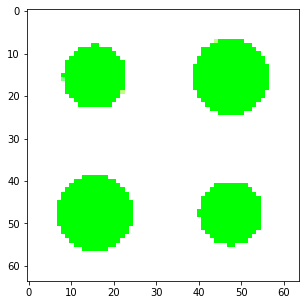

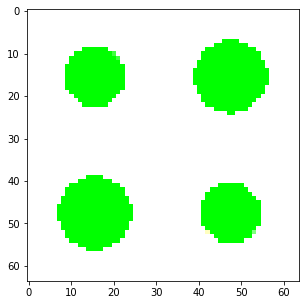

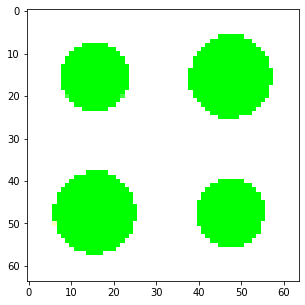

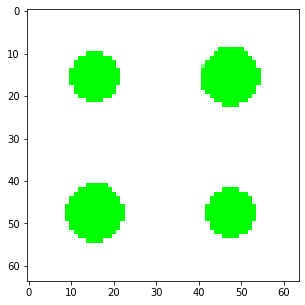

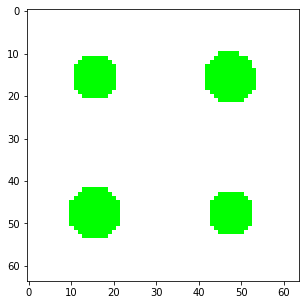

...

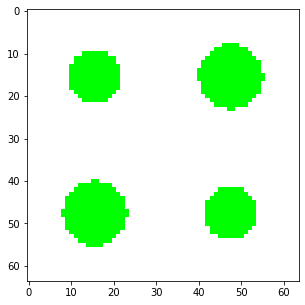

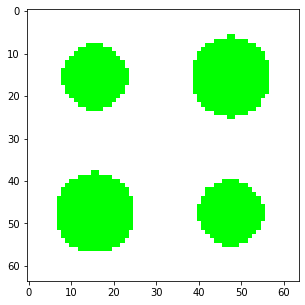

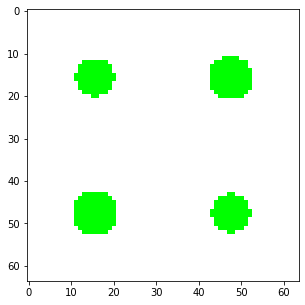

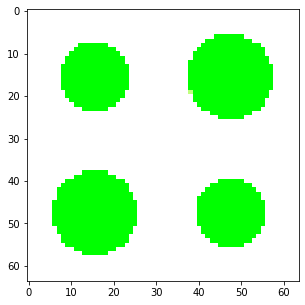

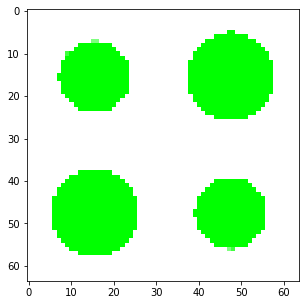

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

In [ ]:
#1 Splitting into Wlybdenum square ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_ring_w=[];
pca_W_sqring=[];
for i in range(len(img_sq_ring_w)):
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_ring_w.append(cv2.resize(img_sq_ring_w[i], target_size))
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_ring_w[i])

for i in range(len(f_sq_ring_w)):
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_ring_w[i]) 
  print ("One Channel Shape: ", blue.shape)
#blue channel
  blue_df = pd.DataFrame(data = blue)
  blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  green_df
#red channel
  red_df = pd.DataFrame(data = red)
  red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_sqring.append(rgd_pca_df_np)
  print("img_sq_ring_cr_size_pca",np.array(pca_W_sqring).shape)






#2 Splitting into W rect

f_rect_w=[]; #1
pca_W_rect=[]; #2
for i in range(len(img_rect_w)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_rect_w.append(cv2.resize(img_rect_w[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_rect_w[i]) #5

for i in range(len(f_rect_w)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_rect_w[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)

  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]
  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_rect.append(rgd_pca_df_np)              #8
  print("img_sq_rect_w",np.array(pca_W_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#2 Splitting into W rect

f_cyl_w=[]; #1
pca_W_cyl=[]; #2
for i in range(len(img_cyl_w)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_w.append(cv2.resize(img_cyl_w[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_w[i]) #5

for i in range(len(f_cyl_w)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_w[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)
  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_cyl.append(rgd_pca_df_np)              #8
  print("img_sq_rect_w",np.array(pca_W_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#4 Splitting into W square
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_w=[]; #1
pca_W_sq=[]; #2
for i in range(len(img_sq_w)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_w.append(cv2.resize(img_sq_w[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_w[i]) #5

for i in range(len(f_sq_w)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_w[i]) #7
  #print ("One Channel Shape: ", blue.shape)
  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  #print ("Blue Data Frame")
  #print (trans_pca_b_df)

  #print ("Green Data Frame")
  #print (trans_pca_g_df)

  #print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_sq.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_W_sq).shape)

#5 Splitting into W triangle

f_tri_w=[]; #1
pca_W_tri=[]; #2
for i in range(len(img_triangle_w)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_tri_w.append(cv2.resize(img_triangle_w[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_tri_w[i]) #5

for i in range(len(f_tri_w)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_tri_w[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df

  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_tri.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_W_sq).shape)


#6 Splitting into chromium img_cir_ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_cir_ring_w=[]; #1
pca_W_cir_ring=[]; #2
for i in range(len(img_cir_ring_w)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cir_ring_w.append(cv2.resize(img_cir_ring_w[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cir_ring_w[i]) #5

for i in range(len(f_cir_ring_w)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cir_ring_w[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_cir_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_w",np.array(pca_W_cir_ring).shape)

#7 Splitting into chromium img_cross
f_cross_w=[]; #1
pca_W_cross=[]; #2
for i in range(len(img_cross_w)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cross_w.append(cv2.resize(img_cross_w[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cross_w[i]) #5
for i in range(len(f_cross_w)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cross_w[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_cross.append(rgd_pca_df_np)              #8
  print("img_cir_ring_cr",np.array(pca_W_cir_ring).shape)
#Its shape is now 4608x1 instead of 64x72




#8 Splitting into chromium img_ellipse

f_ellipse_w=[]; #1
pca_W_ellipse=[]; #2
for i in range(len(img_ellipse_w)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_ellipse_w.append(cv2.resize(img_ellipse_w[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_ellipse_w[i]) #5

for i in range(len(f_ellipse_w)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_ellipse_w[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_ellipse.append(rgd_pca_df_np)              #8
  print("img_ellipse_w",np.array(pca_W_cir_ring).shape)

#8 Splitting into w _elliptical_ring

f_elliptical_ring_w=[]; #1
pca_W_elliptical_ring=[]; #2
for i in range(len(img_elliptical_ring_w)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_elliptical_ring_w.append(cv2.resize(img_elliptical_ring_w[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_elliptical_ring_w[i]) #5

for i in range(len(f_elliptical_ring_w)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_elliptical_ring_w[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_elliptical_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_w",np.array(pca_W_cir_ring).shape)

#10 Splitting into chromium _T shaped

f_T_w=[]; #1
pca_W_T=[]; #2
for i in range(len(img_T_w)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_T_w.append(cv2.resize(img_T_w[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_T_w[i]) #5

for i in range(len(f_T_w)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_T_w[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_T.append(rgd_pca_df_np)              #8
  print("img_T_w",np.array(pca_W_T).shape)

#10 Splitting into chromium Hexagon

f_hex_w=[]; #1
pca_W_hex=[]; #2
for i in range(len(img_hex_w)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_hex_w.append(cv2.resize(img_hex_w[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_hex_w[i]) #5
for i in range(len(f_hex_w)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_hex_w[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_hex.append(rgd_pca_df_np)              #8
  print("img_hex_w",np.array(pca_W_hex).shape)


#11 Splitting into chromium F-shaped

f_F_w=[]; #1
pca_W_F=[]; #2
for i in range(len(img_F_w)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_F_w.append(cv2.resize(img_F_w[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_F_w[i]) #5

for i in range(len(f_F_w)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_F_w[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_F.append(rgd_pca_df_np)              #8
  print("img_hex_w",np.array(pca_W_F).shape)


#12 Splitting into chromium Square SC
f_sq_SC_w=[]; #1
pca_W_sq_SC=[]; #2
for i in range(len(img_sq_SC_w)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_SC_w.append(cv2.resize(img_sq_SC_w[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_SC_w[i]) #5

for i in range(len(f_sq_SC_w)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_SC_w[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_sq_SC.append(rgd_pca_df_np)              #8
  print("img_hex_sq_SC",np.array(pca_W_sq_SC).shape)

#13 Splitting into chromium Z shaped
f_Z_w=[]; #1
pca_W_Z=[]; #2
for i in range(len(img_Z_w)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_Z_w.append(cv2.resize(img_Z_w[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_Z_w[i]) #5

for i in range(len(f_Z_w)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_Z_w[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)
  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_Z.append(rgd_pca_df_np)              #8
  print("img_Z_w",np.array(pca_W_Z).shape)



#14 Splitting into chromium star
f_star_w=[]; #1
pca_W_star=[]; #2
for i in range(len(img_star_w)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_star_w.append(cv2.resize(img_star_w[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_star_w[i]) #5

for i in range(len(f_star_w)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_star_w[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)
  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_star.append(rgd_pca_df_np)              #8
  print("img_Z_w",np.array(pca_W_Z).shape)

#16 Splitting into chromium cyl_Sc

f_cyl_SC_w=[]; #1
pca_W_cyl_SC=[]; #2
for i in range(len(img_cyl_SC_w)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_SC_w.append(cv2.resize(img_cyl_SC_w[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_SC_w[i]) #5

for i in range(len(f_cyl_SC_w)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_SC_w[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_W_cyl_SC.append(rgd_pca_df_np)              #8
  print("img_Z_w",np.array(pca_W_cyl_SC).shape)



#



In [ ]:
reps = (25,1)
all_pca_sqring_w =np.tile(pca_W_sqring,reps) #1
all_pca_rect_w=np.tile(pca_W_rect,reps) #2
all_pca_cyl_w =np.tile(pca_W_cyl,reps) #3
all_pca_sq_w = np.tile(pca_W_sq,reps) #4
all_pca_tri_w = np.tile(pca_W_tri,reps)#5
all_pca_cir_ring_w = np.tile(pca_W_cir_ring,reps) #6
all_pca_cross_w = np.tile(pca_W_cross,reps) #7
all_pca_ellipse_w = np.tile(pca_W_ellipse,reps) #8
all_pca_elliptical_ring_w = np.tile(pca_W_elliptical_ring,reps) #9
all_pca_T_w = np.tile(pca_W_T,reps)#10
all_pca_hex_w = np.tile(pca_W_hex,reps)#11
all_pca_F_w = np.tile(pca_W_F,reps) #12
all_pca_sq_SC_w = np.tile(pca_W_sq_SC,reps) #13
all_pca_Z_w=np.tile(pca_W_Z,reps)
all_pca_star_w=np.tile(pca_W_star,reps)
all_pca_cyl_SC_w=np.tile(pca_W_cyl_SC,reps)
print(all_pca_cross_w.shape)



(325, 1920)


In [ ]:

all_img_W= np.concatenate((all_pca_sqring_w,all_pca_rect_w,all_pca_cyl_w,all_pca_sq_w,all_pca_tri_w,all_pca_cir_ring_w,all_pca_cross_w,all_pca_ellipse_w,all_pca_elliptical_ring_w,all_pca_T_w,all_pca_hex_w,all_pca_F_w,all_pca_sq_SC_w,all_pca_Z_w,all_pca_star_w,all_pca_cyl_SC_w ),axis=0)
print(all_img_CR.shape)



(5200, 1920)


## ZrN

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (6, 1920

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Fr

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`


rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_ZrN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (1, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (2, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (3, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (4, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (5, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (6, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (7, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (8, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (9, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (10, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (11, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (12, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape: 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ci

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ZrN (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ZrN (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_ZrN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_ZrN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ZrN (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ZrN (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ZrN (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ZrN (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ZrN (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ZrN (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ZrN (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ZrN (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ZrN (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ZrN (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ZrN (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ZrN (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_ZrN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape: 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (11, 1920)
One Channel 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_ZrN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (11, 1920)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

 (1, 1920)
img_Z_ZrN (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (10, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_ZrN (13, 1920)


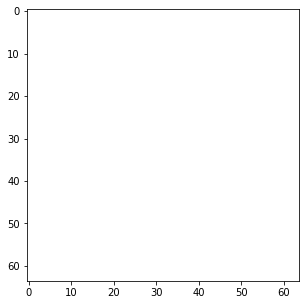

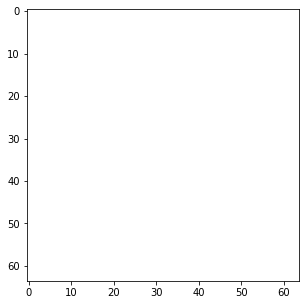

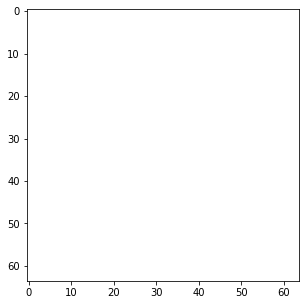

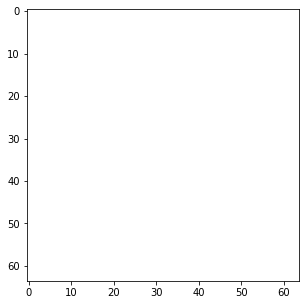

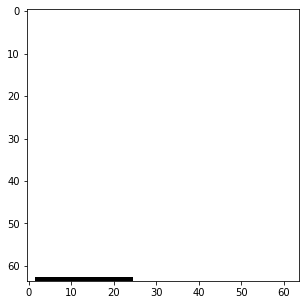

...

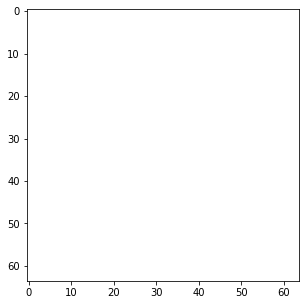

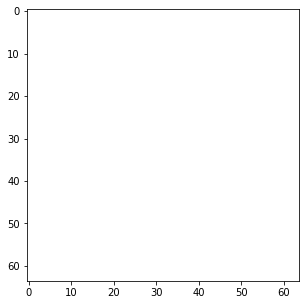

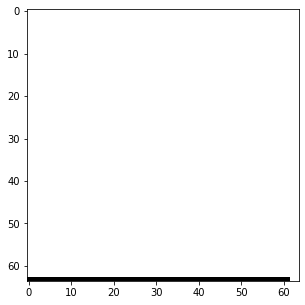

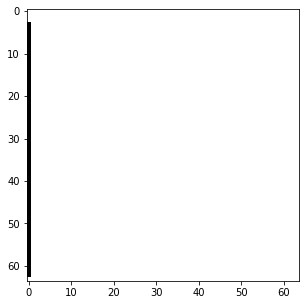

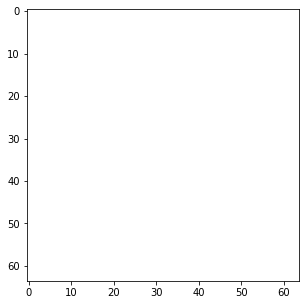

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

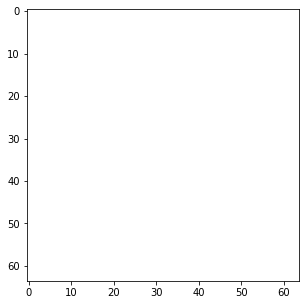

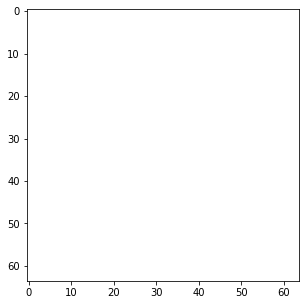

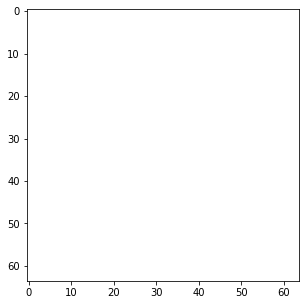

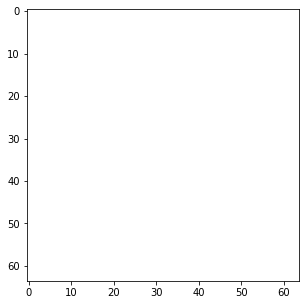

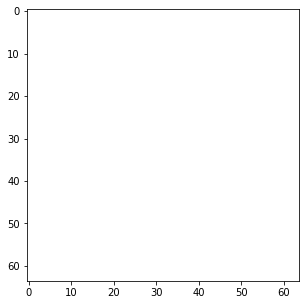

...

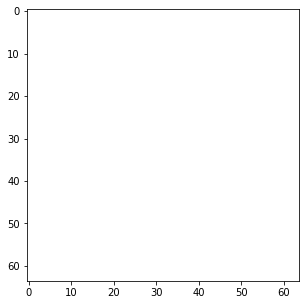

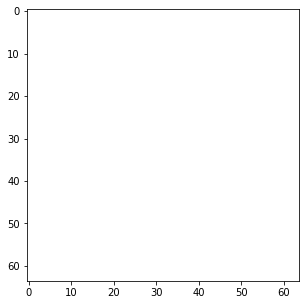

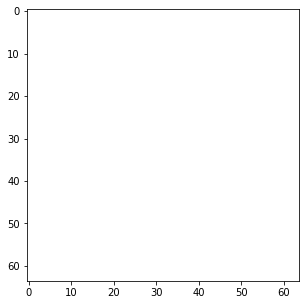

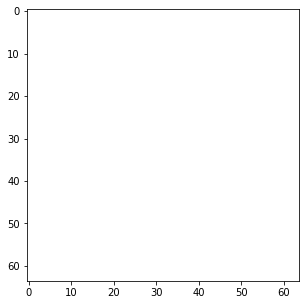

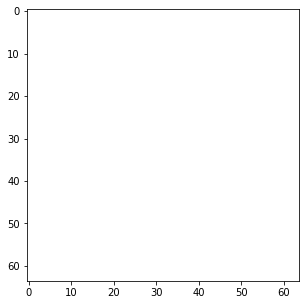

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

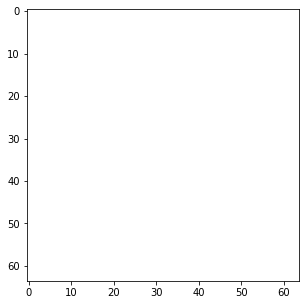

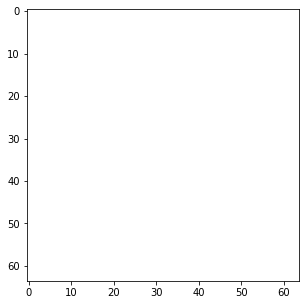

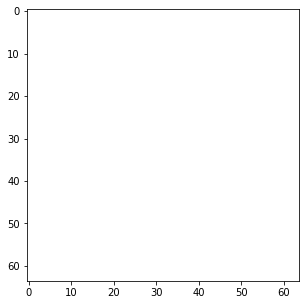

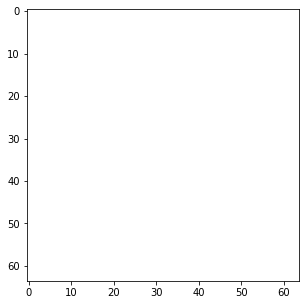

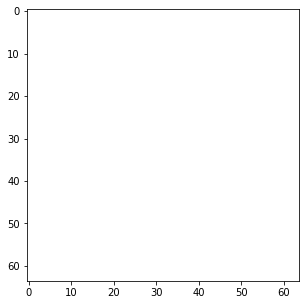

...

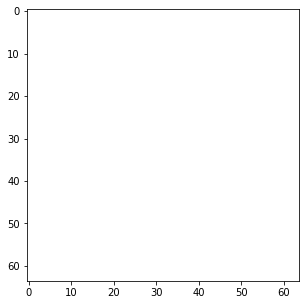

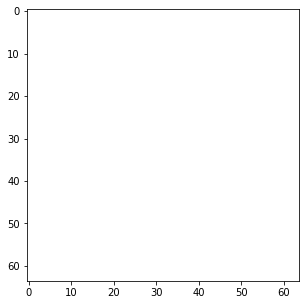

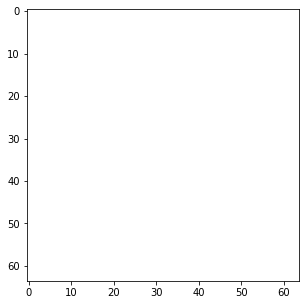

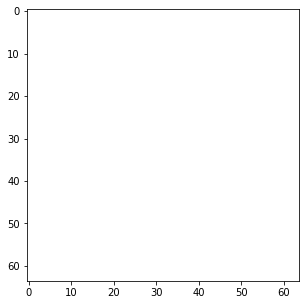

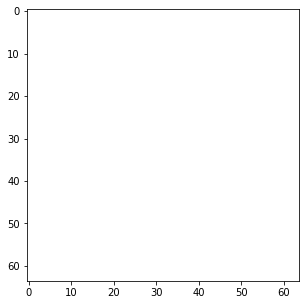

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

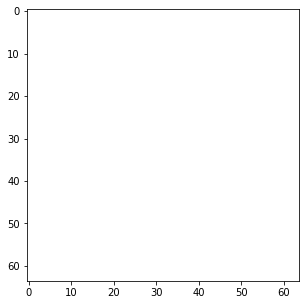

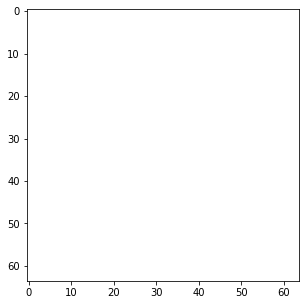

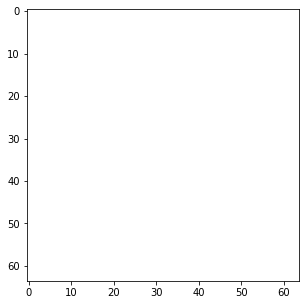

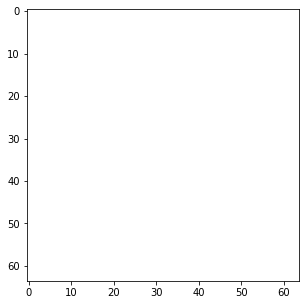

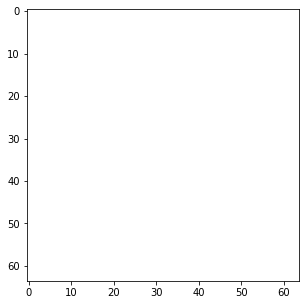

...

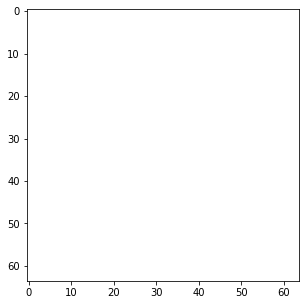

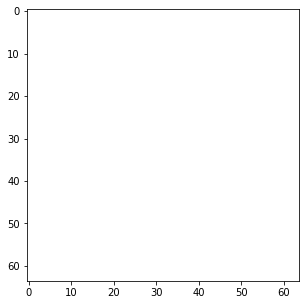

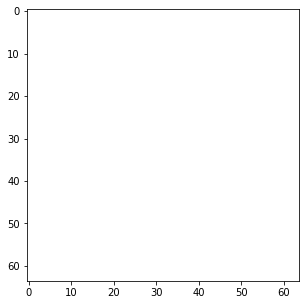

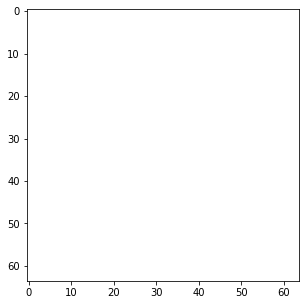

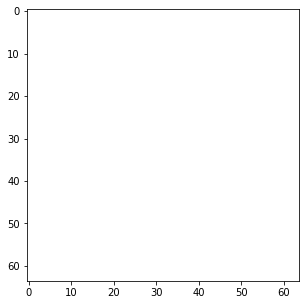

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

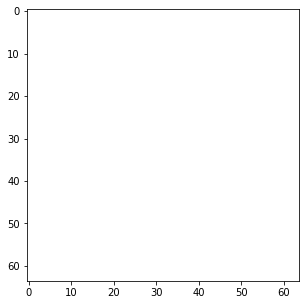

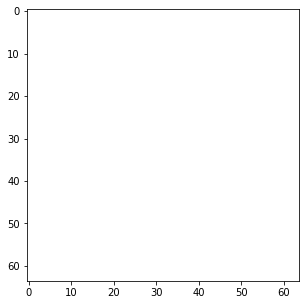

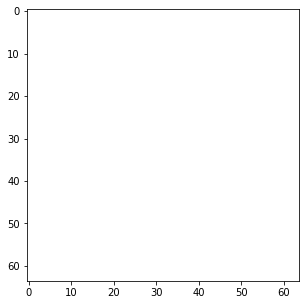

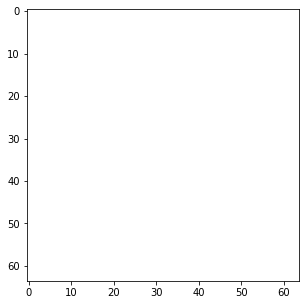

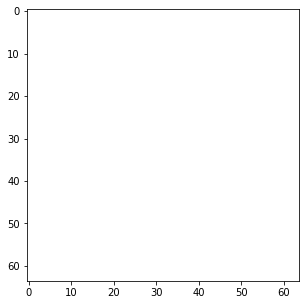

...

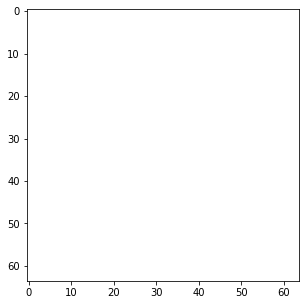

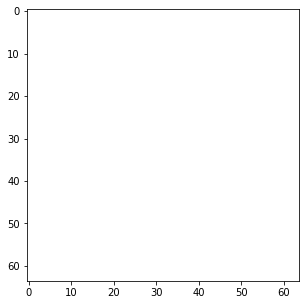

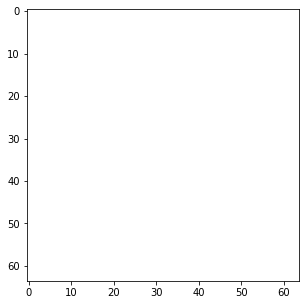

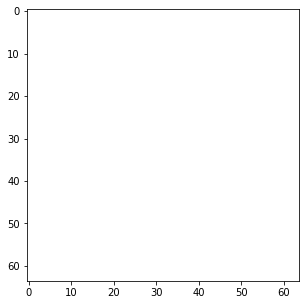

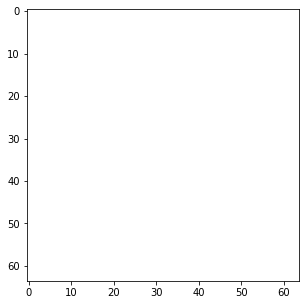

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

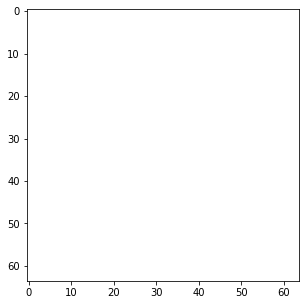

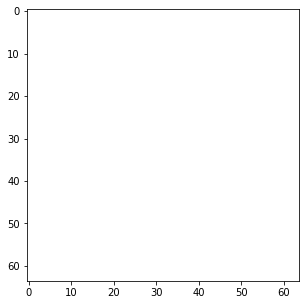

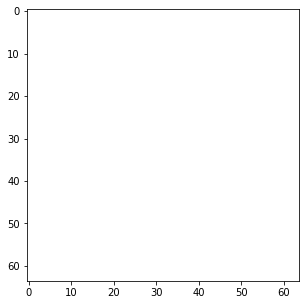

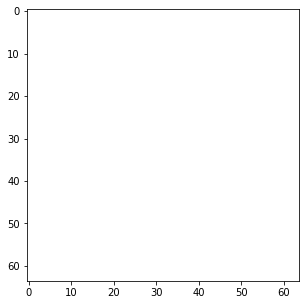

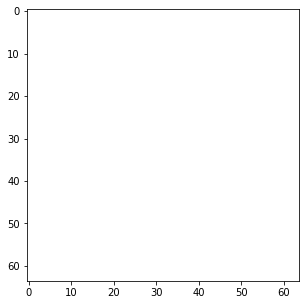

...

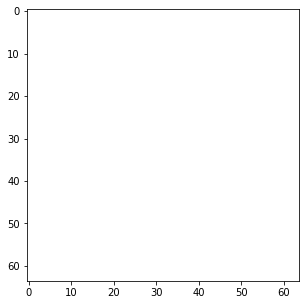

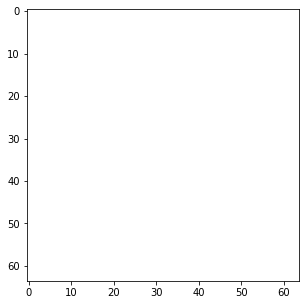

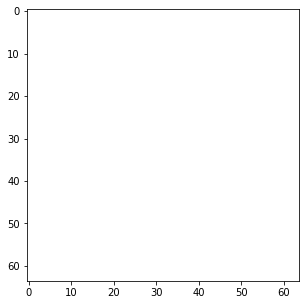

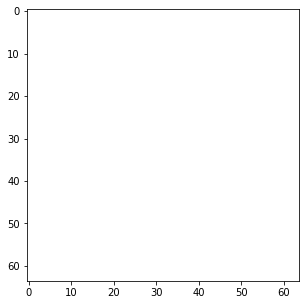

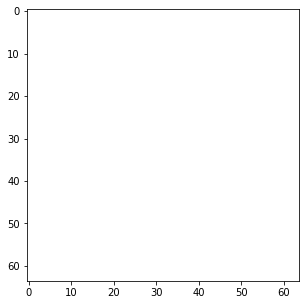

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

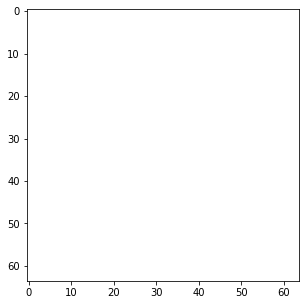

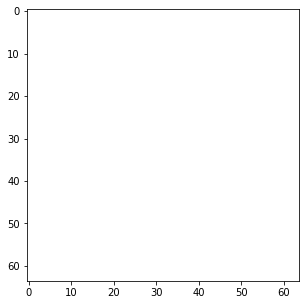

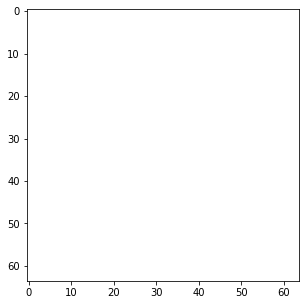

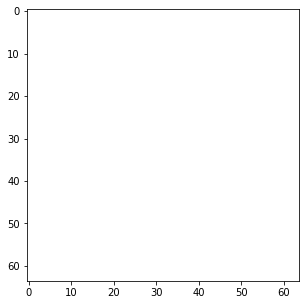

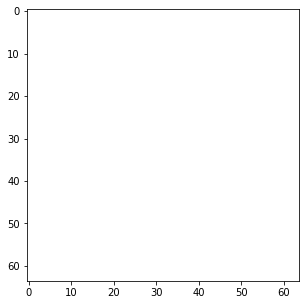

...

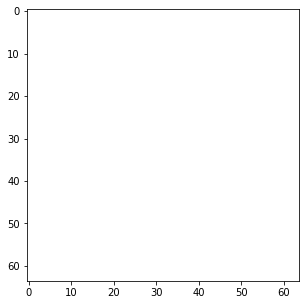

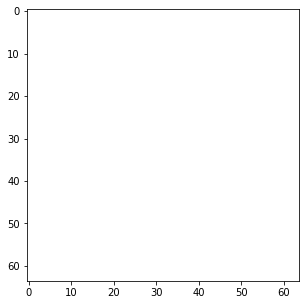

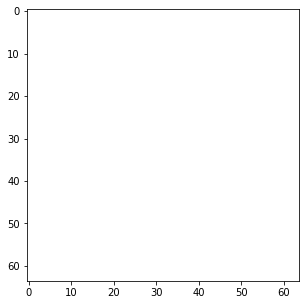

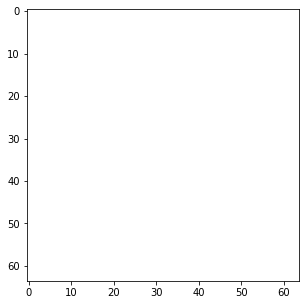

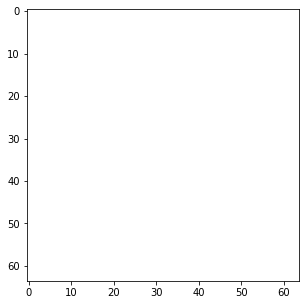

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

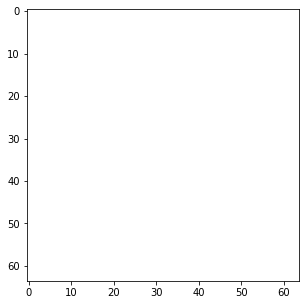

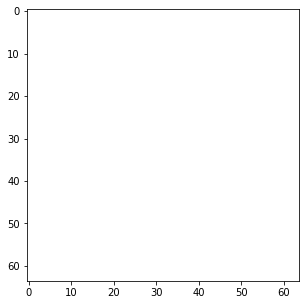

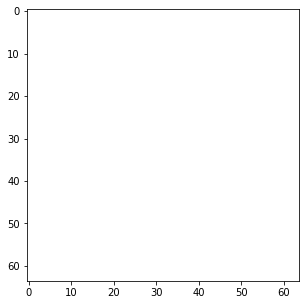

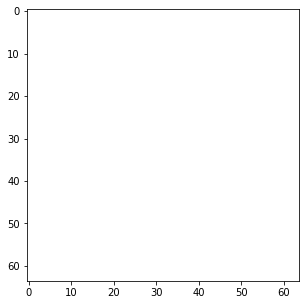

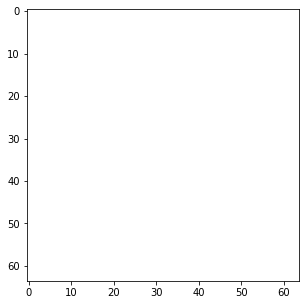

...

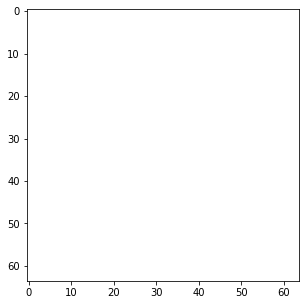

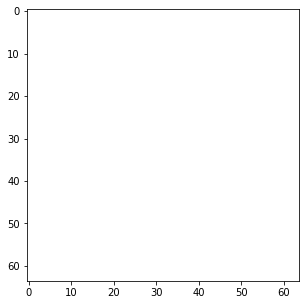

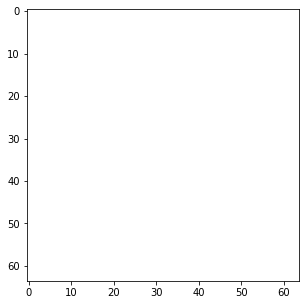

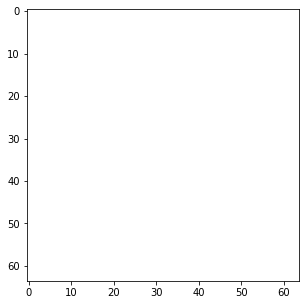

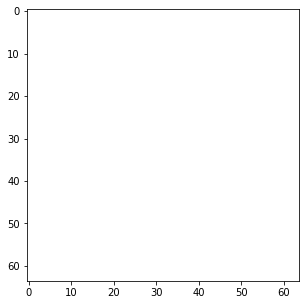

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

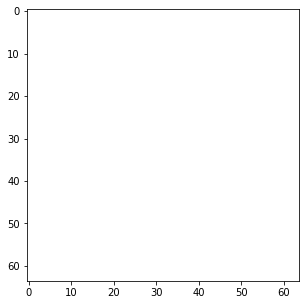

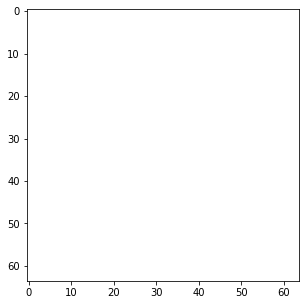

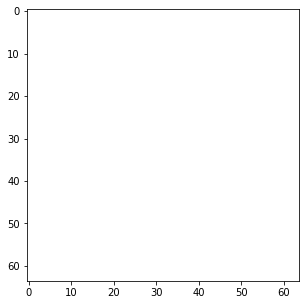

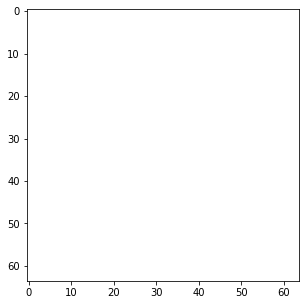

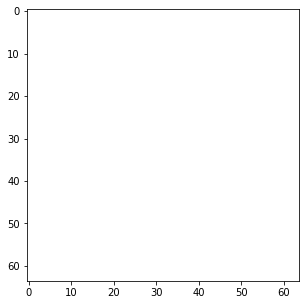

...

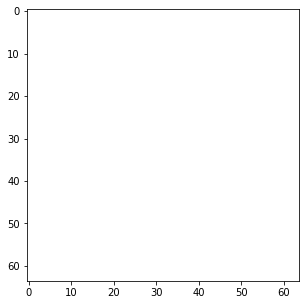

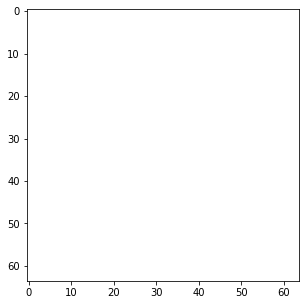

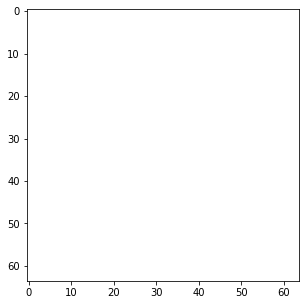

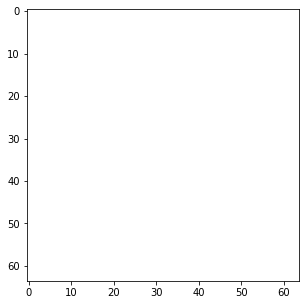

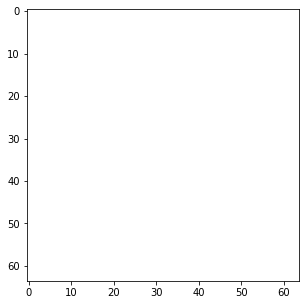

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

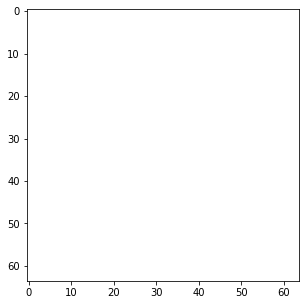

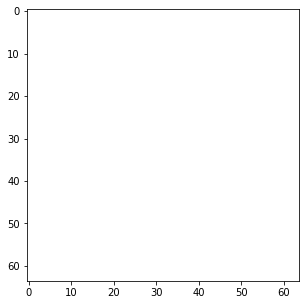

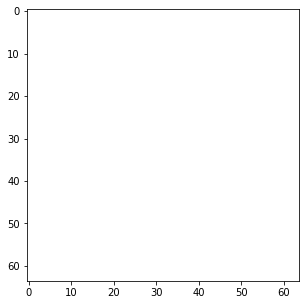

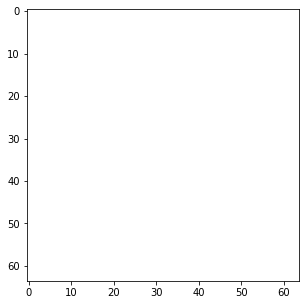

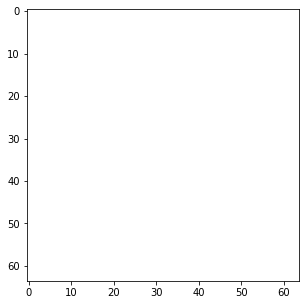

...

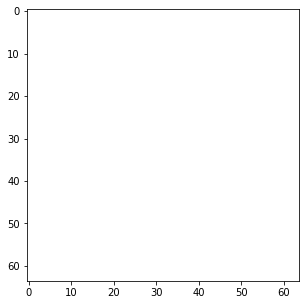

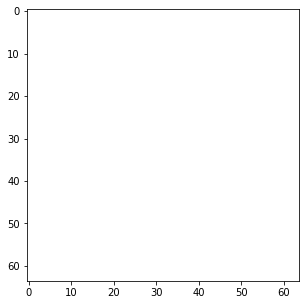

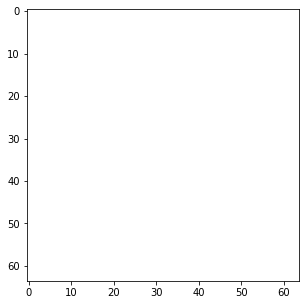

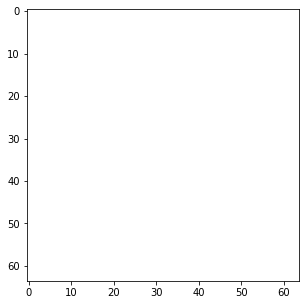

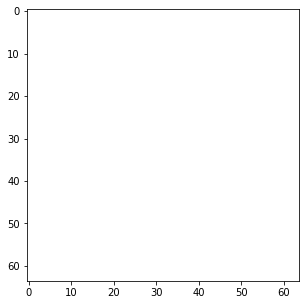

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

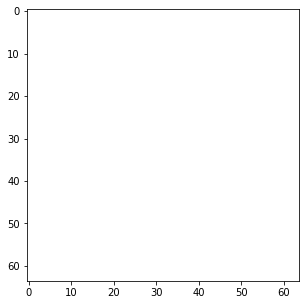

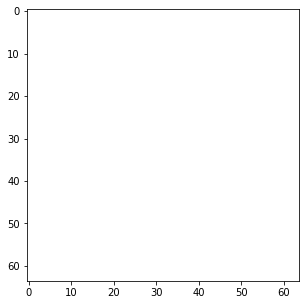

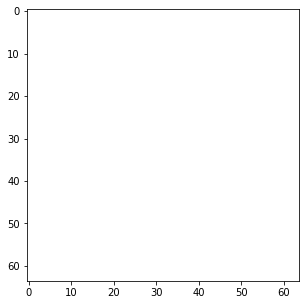

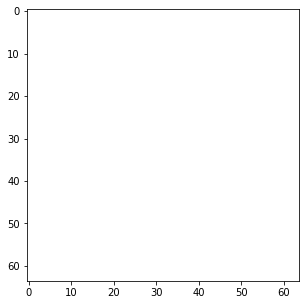

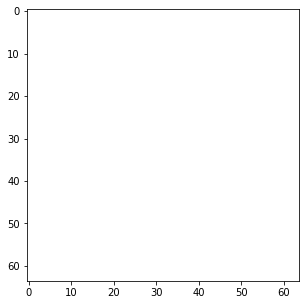

...

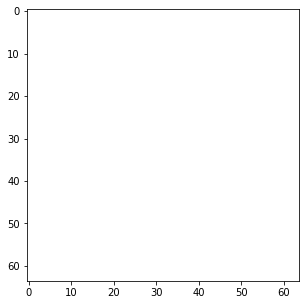

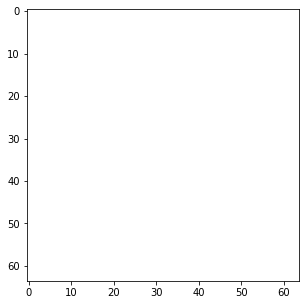

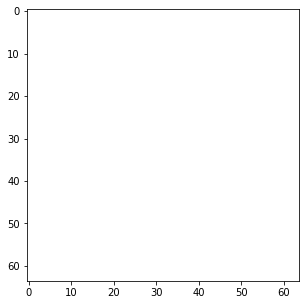

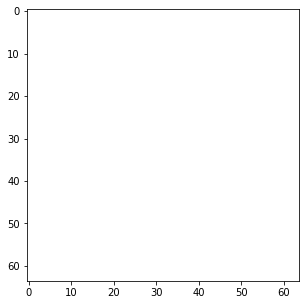

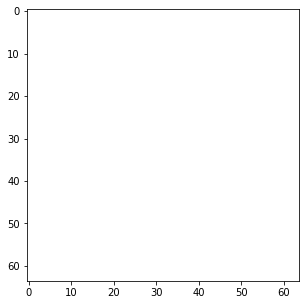

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

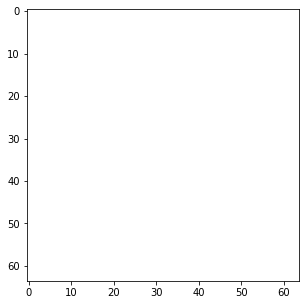

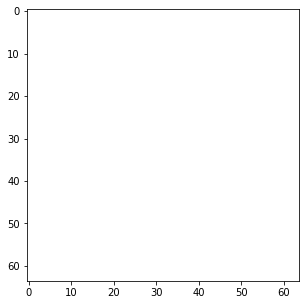

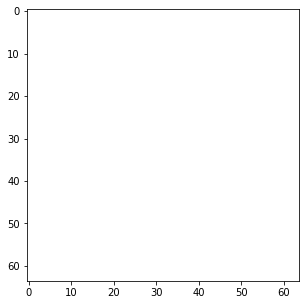

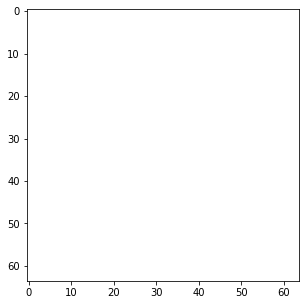

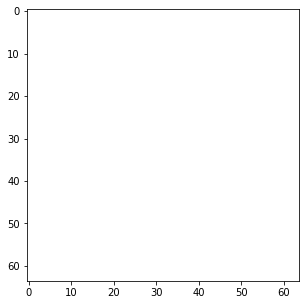

...

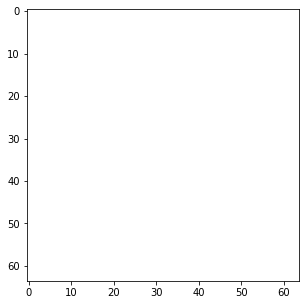

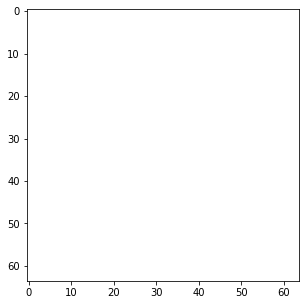

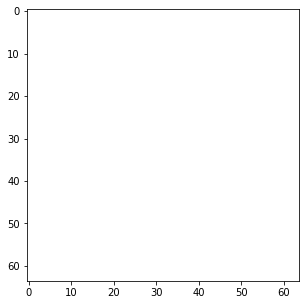

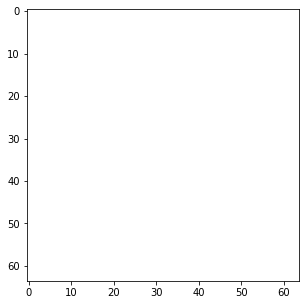

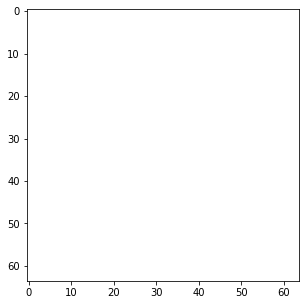

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

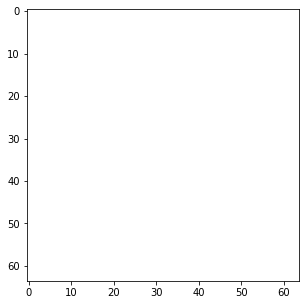

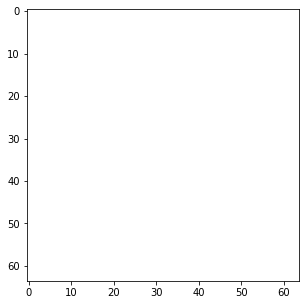

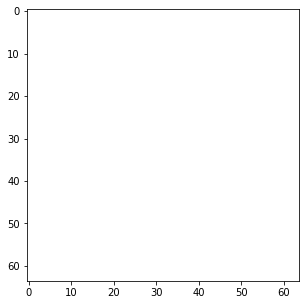

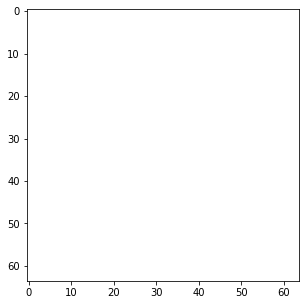

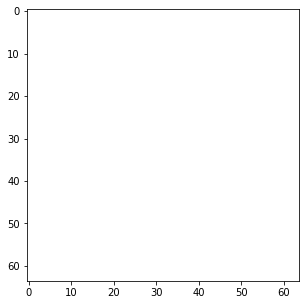

...

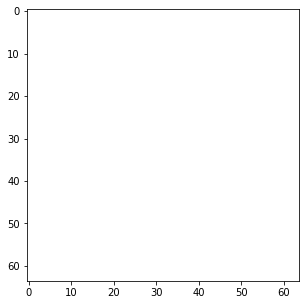

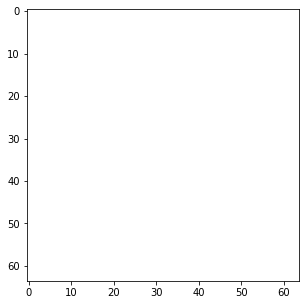

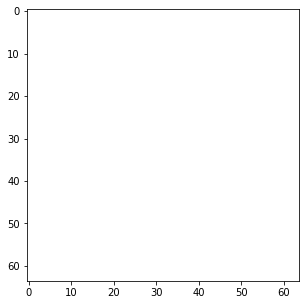

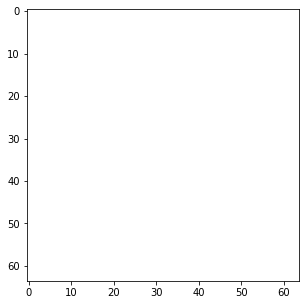

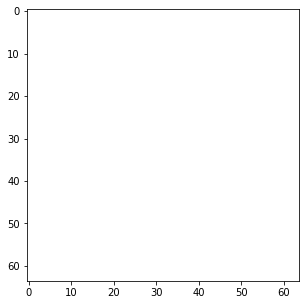

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

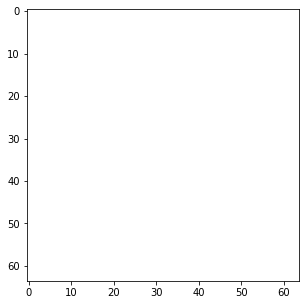

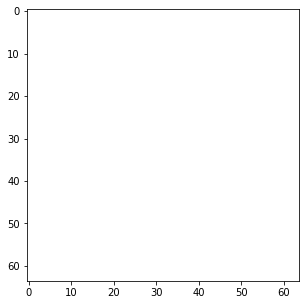

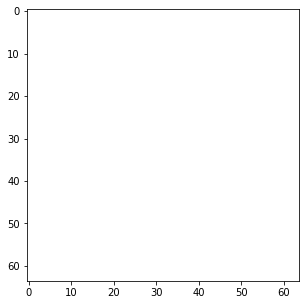

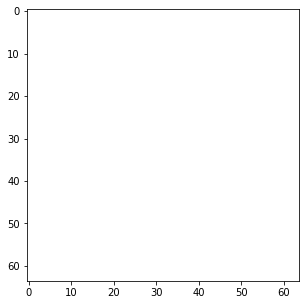

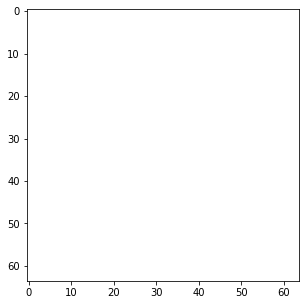

...

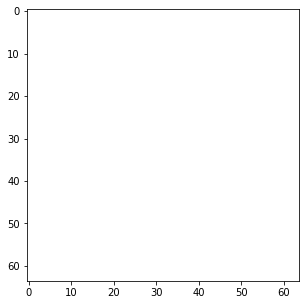

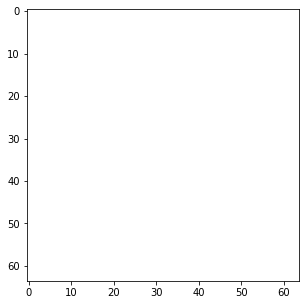

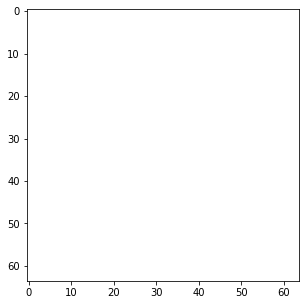

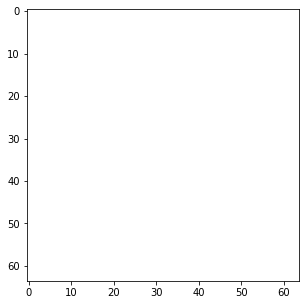

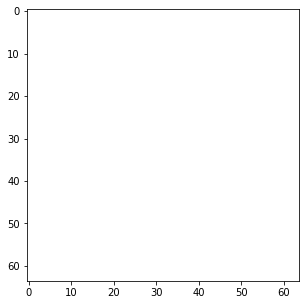

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

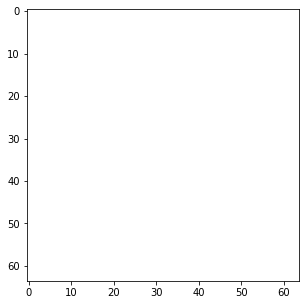

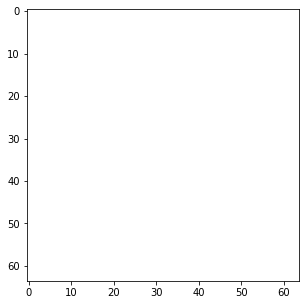

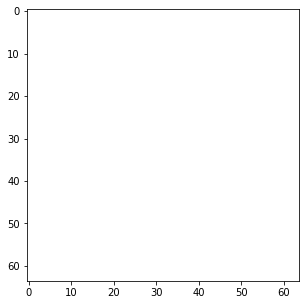

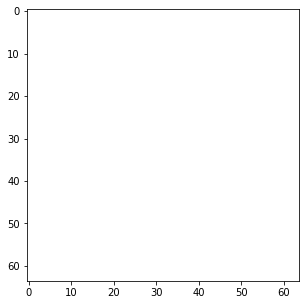

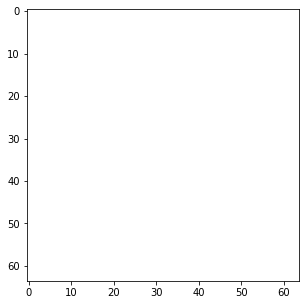

...

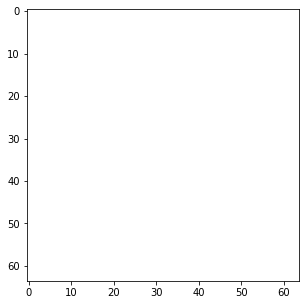

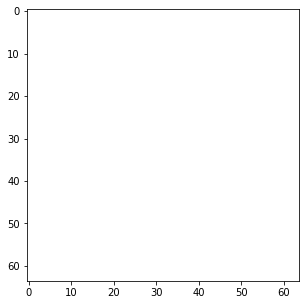

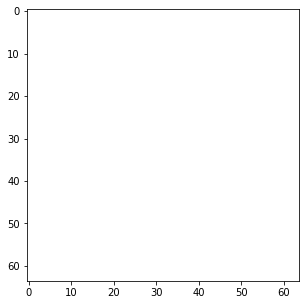

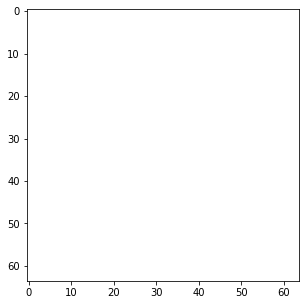

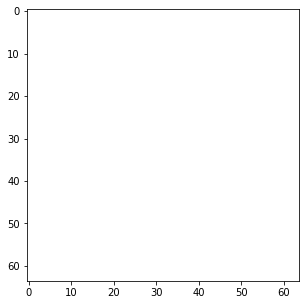

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

In [ ]:
#1 Splitting into ZrNlybdenum square ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_ring_ZrN=[];
pca_ZrN_sqring=[];
for i in range(len(img_sq_ring_ZrN)):
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_ring_ZrN.append(cv2.resize(img_sq_ring_ZrN[i], target_size))
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_ring_ZrN[i])

for i in range(len(f_sq_ring_ZrN)):
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_ring_ZrN[i]) 
  print ("One Channel Shape: ", blue.shape)
#blue channel
  blue_df = pd.DataFrame(data = blue)
  blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  green_df
#red channel
  red_df = pd.DataFrame(data = red)
  red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_sqring.append(rgd_pca_df_np)
  print("img_sq_ring_cr_size_pca",np.array(pca_ZrN_sqring).shape)






#2 Splitting into ZrN rect

f_rect_ZrN=[]; #1
pca_ZrN_rect=[]; #2
for i in range(len(img_rect_ZrN)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_rect_ZrN.append(cv2.resize(img_rect_ZrN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_rect_ZrN[i]) #5

for i in range(len(f_rect_ZrN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_rect_ZrN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)

  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]
  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_rect.append(rgd_pca_df_np)              #8
  print("img_sq_rect_ZrN",np.array(pca_ZrN_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#2 Splitting into ZrN rect

f_cyl_ZrN=[]; #1
pca_ZrN_cyl=[]; #2
for i in range(len(img_cyl_ZrN)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_ZrN.append(cv2.resize(img_cyl_ZrN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_ZrN[i]) #5

for i in range(len(f_cyl_ZrN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_ZrN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)
  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_cyl.append(rgd_pca_df_np)              #8
  print("img_sq_rect_ZrN",np.array(pca_ZrN_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#4 Splitting into ZrN square
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_ZrN=[]; #1
pca_ZrN_sq=[]; #2
for i in range(len(img_sq_ZrN)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_ZrN.append(cv2.resize(img_sq_ZrN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_ZrN[i]) #5

for i in range(len(f_sq_ZrN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_ZrN[i]) #7
  #print ("One Channel Shape: ", blue.shape)
  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  #print ("Blue Data Frame")
  #print (trans_pca_b_df)

  #print ("Green Data Frame")
  #print (trans_pca_g_df)

  #print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_sq.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_ZrN_sq).shape)

#5 Splitting into ZrN triangle

f_tri_ZrN=[]; #1
pca_ZrN_tri=[]; #2
for i in range(len(img_triangle_ZrN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_tri_ZrN.append(cv2.resize(img_triangle_ZrN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_tri_ZrN[i]) #5

for i in range(len(f_tri_ZrN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_tri_ZrN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df

  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_tri.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_ZrN_sq).shape)


#6 Splitting into chromium img_cir_ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_cir_ring_ZrN=[]; #1
pca_ZrN_cir_ring=[]; #2
for i in range(len(img_cir_ring_ZrN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cir_ring_ZrN.append(cv2.resize(img_cir_ring_ZrN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cir_ring_ZrN[i]) #5

for i in range(len(f_cir_ring_ZrN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cir_ring_ZrN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_cir_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_ZrN",np.array(pca_ZrN_cir_ring).shape)

#7 Splitting into chromium img_cross
f_cross_ZrN=[]; #1
pca_ZrN_cross=[]; #2
for i in range(len(img_cross_ZrN)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cross_ZrN.append(cv2.resize(img_cross_ZrN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cross_ZrN[i]) #5
for i in range(len(f_cross_ZrN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cross_ZrN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_cross.append(rgd_pca_df_np)              #8
  print("img_cir_ring_cr",np.array(pca_ZrN_cir_ring).shape)
#Its shape is now 4608x1 instead of 64x72




#8 Splitting into chromium img_ellipse

f_ellipse_ZrN=[]; #1
pca_ZrN_ellipse=[]; #2
for i in range(len(img_ellipse_ZrN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_ellipse_ZrN.append(cv2.resize(img_ellipse_ZrN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_ellipse_ZrN[i]) #5

for i in range(len(f_ellipse_ZrN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_ellipse_ZrN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_ellipse.append(rgd_pca_df_np)              #8
  print("img_ellipse_ZrN",np.array(pca_ZrN_cir_ring).shape)

#8 Splitting into ZrN _elliptical_ring

f_elliptical_ring_ZrN=[]; #1
pca_ZrN_elliptical_ring=[]; #2
for i in range(len(img_elliptical_ring_ZrN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_elliptical_ring_ZrN.append(cv2.resize(img_elliptical_ring_ZrN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_elliptical_ring_ZrN[i]) #5

for i in range(len(f_elliptical_ring_ZrN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_elliptical_ring_ZrN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_elliptical_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_ZrN",np.array(pca_ZrN_cir_ring).shape)

#10 Splitting into chromium _T shaped

f_T_ZrN=[]; #1
pca_ZrN_T=[]; #2
for i in range(len(img_T_ZrN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_T_ZrN.append(cv2.resize(img_T_ZrN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_T_ZrN[i]) #5

for i in range(len(f_T_ZrN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_T_ZrN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_T.append(rgd_pca_df_np)              #8
  print("img_T_ZrN",np.array(pca_ZrN_T).shape)

#10 Splitting into chromium Hexagon

f_hex_ZrN=[]; #1
pca_ZrN_hex=[]; #2
for i in range(len(img_hex_ZrN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_hex_ZrN.append(cv2.resize(img_hex_ZrN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_hex_ZrN[i]) #5
for i in range(len(f_hex_ZrN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_hex_ZrN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_hex.append(rgd_pca_df_np)              #8
  print("img_hex_ZrN",np.array(pca_ZrN_hex).shape)


#11 Splitting into chromium F-shaped

f_F_ZrN=[]; #1
pca_ZrN_F=[]; #2
for i in range(len(img_F_ZrN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_F_ZrN.append(cv2.resize(img_F_ZrN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_F_ZrN[i]) #5

for i in range(len(f_F_ZrN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_F_ZrN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_F.append(rgd_pca_df_np)              #8
  print("img_hex_ZrN",np.array(pca_ZrN_F).shape)


#12 Splitting into chromium Square SC
f_sq_SC_ZrN=[]; #1
pca_ZrN_sq_SC=[]; #2
for i in range(len(img_sq_SC_ZrN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_SC_ZrN.append(cv2.resize(img_sq_SC_ZrN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_SC_ZrN[i]) #5

for i in range(len(f_sq_SC_ZrN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_SC_ZrN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_sq_SC.append(rgd_pca_df_np)              #8
  print("img_hex_sq_SC",np.array(pca_ZrN_sq_SC).shape)

#13 Splitting into chromium Z shaped
f_Z_ZrN=[]; #1
pca_ZrN_Z=[]; #2
for i in range(len(img_Z_ZrN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_Z_ZrN.append(cv2.resize(img_Z_ZrN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_Z_ZrN[i]) #5

for i in range(len(f_Z_ZrN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_Z_ZrN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)
  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_Z.append(rgd_pca_df_np)              #8
  print("img_Z_ZrN",np.array(pca_ZrN_Z).shape)



#14 Splitting into chromium star
f_star_ZrN=[]; #1
pca_ZrN_star=[]; #2
for i in range(len(img_star_ZrN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_star_ZrN.append(cv2.resize(img_star_ZrN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_star_ZrN[i]) #5

for i in range(len(f_star_ZrN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_star_ZrN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)
  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_star.append(rgd_pca_df_np)              #8
  print("img_Z_ZrN",np.array(pca_ZrN_Z).shape)

#16 Splitting into chromium cyl_Sc

f_cyl_SC_ZrN=[]; #1
pca_ZrN_cyl_SC=[]; #2
for i in range(len(img_cyl_SC_ZrN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_SC_ZrN.append(cv2.resize(img_cyl_SC_ZrN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_SC_ZrN[i]) #5

for i in range(len(f_cyl_SC_ZrN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_SC_ZrN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_ZrN_cyl_SC.append(rgd_pca_df_np)              #8
  print("img_Z_ZrN",np.array(pca_ZrN_cyl_SC).shape)



#



In [ ]:
reps = (25,1)
all_pca_sqring_ZrN =np.tile(pca_ZrN_sqring,reps) #1
all_pca_rect_ZrN=np.tile(pca_ZrN_rect,reps) #2
all_pca_cyl_ZrN =np.tile(pca_ZrN_cyl,reps) #3
all_pca_sq_ZrN = np.tile(pca_ZrN_sq,reps) #4
all_pca_tri_ZrN = np.tile(pca_ZrN_tri,reps)#5
all_pca_cir_ring_ZrN = np.tile(pca_ZrN_cir_ring,reps) #6
all_pca_cross_ZrN = np.tile(pca_ZrN_cross,reps) #7
all_pca_ellipse_ZrN = np.tile(pca_ZrN_ellipse,reps) #8
all_pca_elliptical_ring_ZrN = np.tile(pca_ZrN_elliptical_ring,reps) #9
all_pca_T_ZrN = np.tile(pca_ZrN_T,reps)#10
all_pca_hex_ZrN = np.tile(pca_ZrN_hex,reps)#11
all_pca_F_ZrN = np.tile(pca_ZrN_F,reps) #12
all_pca_sq_SC_ZrN = np.tile(pca_ZrN_sq_SC,reps) #13
all_pca_Z_ZrN=np.tile(pca_ZrN_Z,reps)
all_pca_star_ZrN=np.tile(pca_ZrN_star,reps)
all_pca_cyl_SC_ZrN=np.tile(pca_ZrN_cyl_SC,reps)
print(all_pca_cross_ZrN.shape)



(325, 1920)


In [ ]:

all_img_ZrN= np.concatenate((all_pca_sqring_ZrN,all_pca_rect_ZrN,all_pca_cyl_ZrN,all_pca_sq_ZrN,all_pca_tri_ZrN,all_pca_cir_ring_ZrN,all_pca_cross_ZrN,all_pca_ellipse_ZrN,all_pca_elliptical_ring_ZrN,all_pca_T_ZrN,all_pca_hex_ZrN,all_pca_F_ZrN,all_pca_sq_SC_ZrN,all_pca_Z_ZrN,all_pca_star_ZrN,all_pca_cyl_SC_ZrN ),axis=0)
print(all_img_CR.shape)



(5200, 1920)


## Vanadium

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (6, 1920

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_V (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (1, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (2, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (3, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (4, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (5, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (6, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (7, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (8, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (9, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (10, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (11, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (12, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (9, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green D

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_V (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_V (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_V (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_V (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_V (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_V (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_V (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_V (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_V (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_V (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_V (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_V (10, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_V (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_V (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_V (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_V (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (10, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (10, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_V (13, 1920)


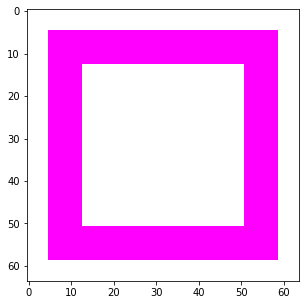

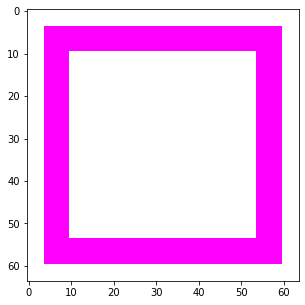

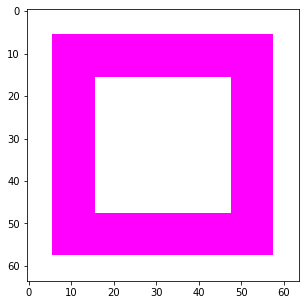

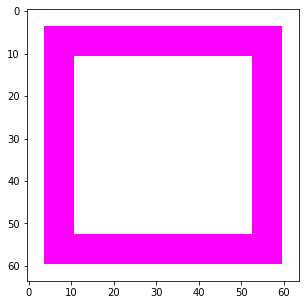

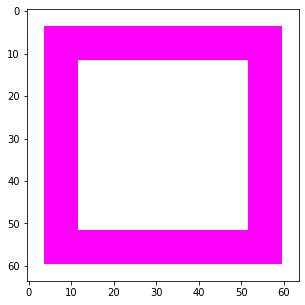

...

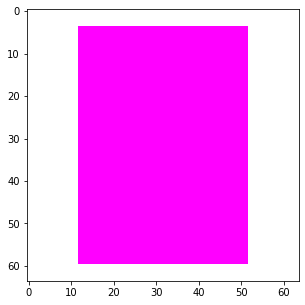

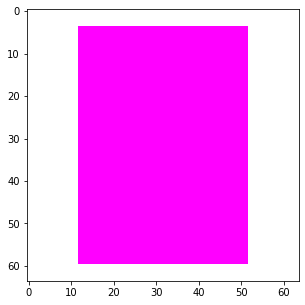

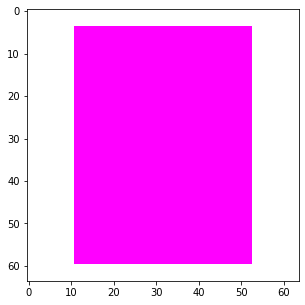

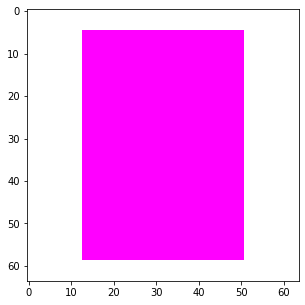

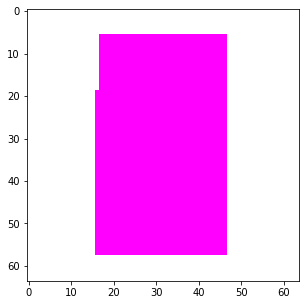

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

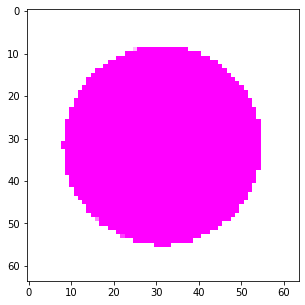

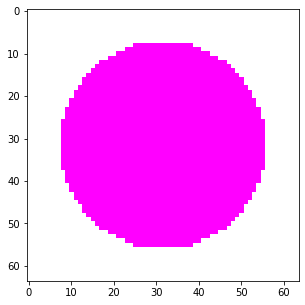

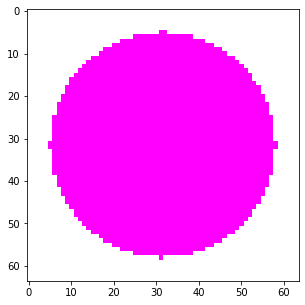

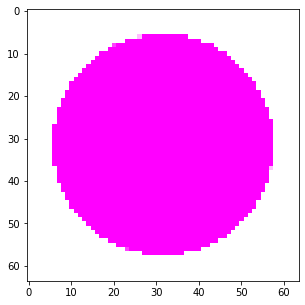

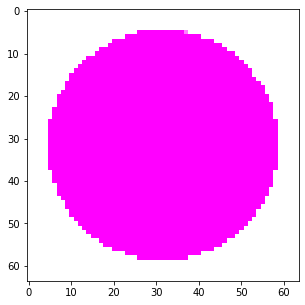

...

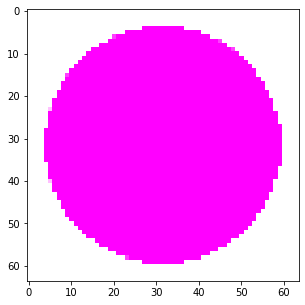

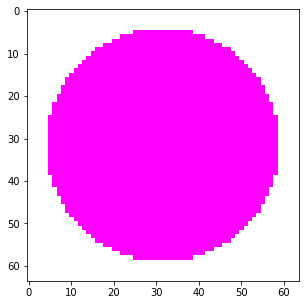

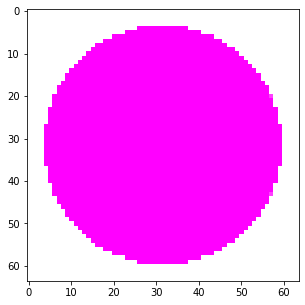

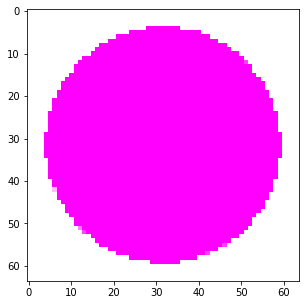

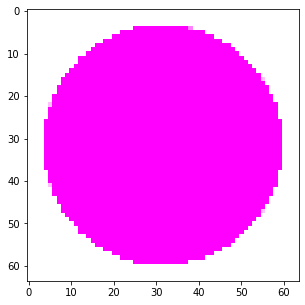

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

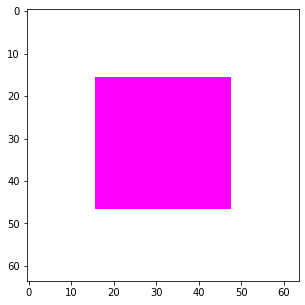

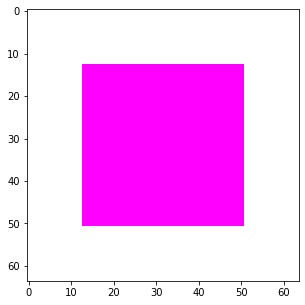

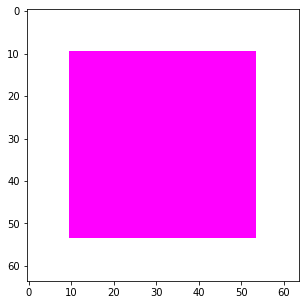

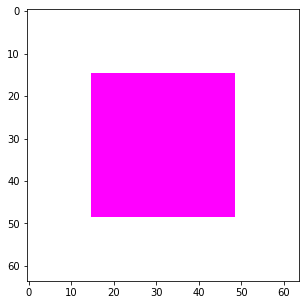

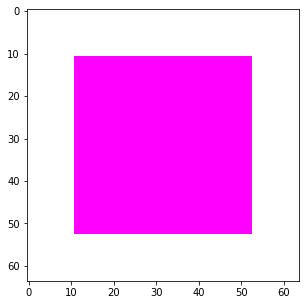

...

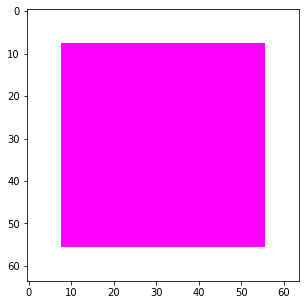

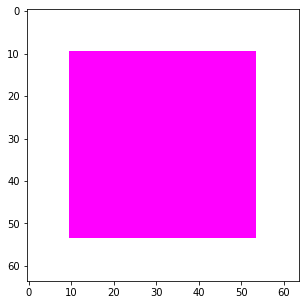

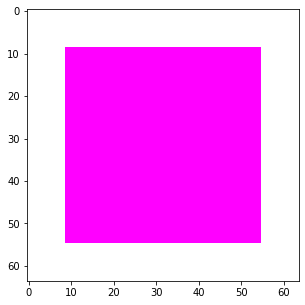

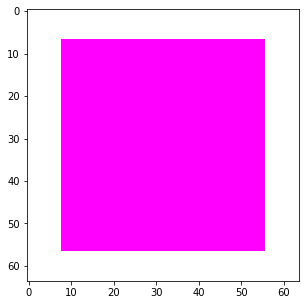

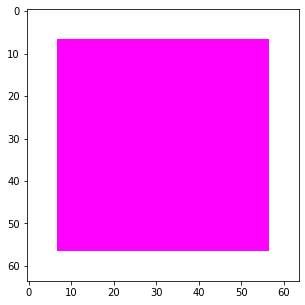

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

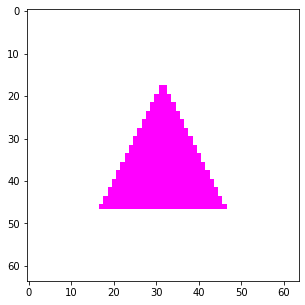

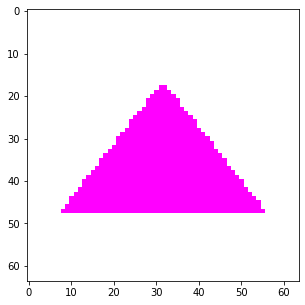

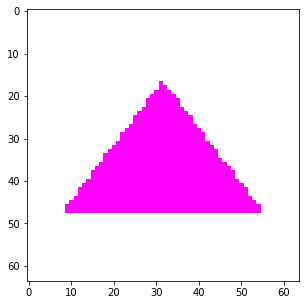

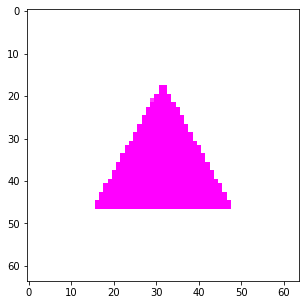

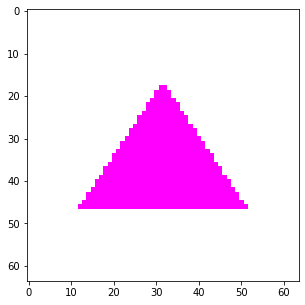

...

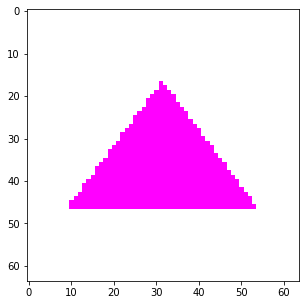

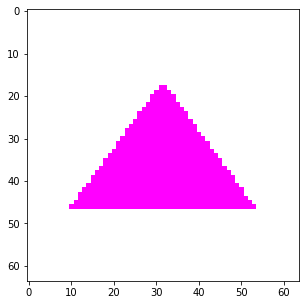

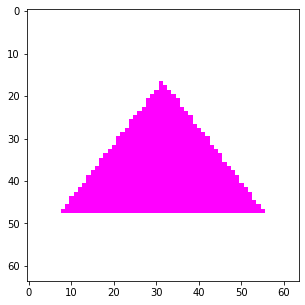

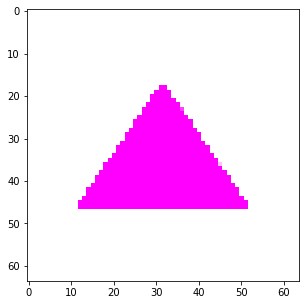

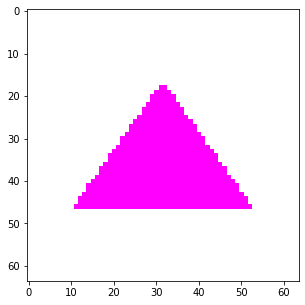

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

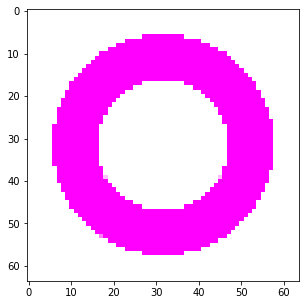

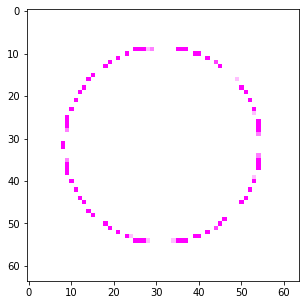

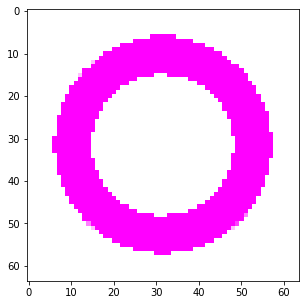

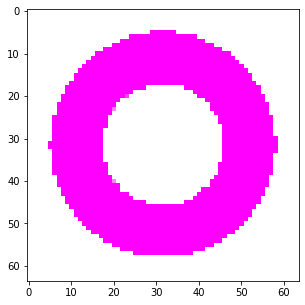

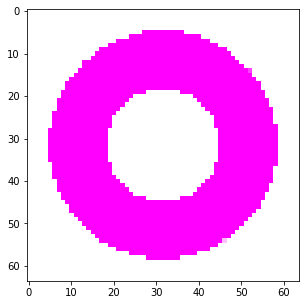

...

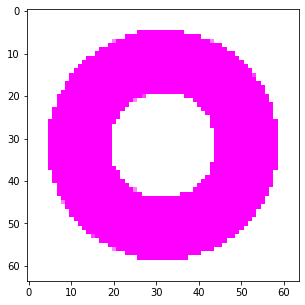

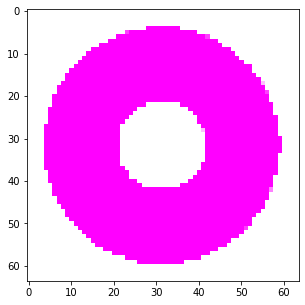

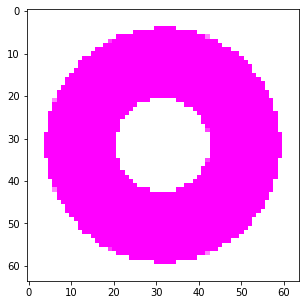

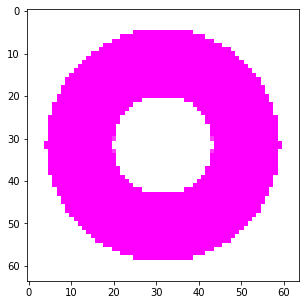

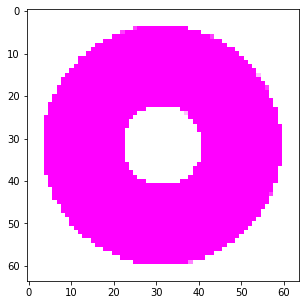

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

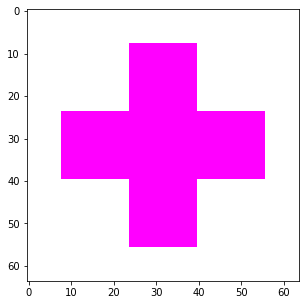

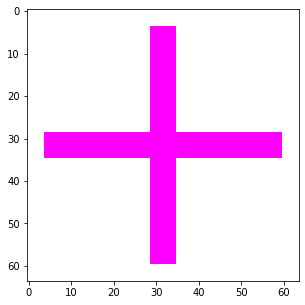

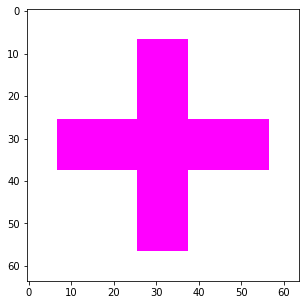

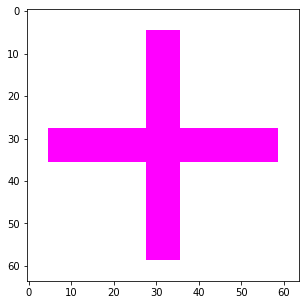

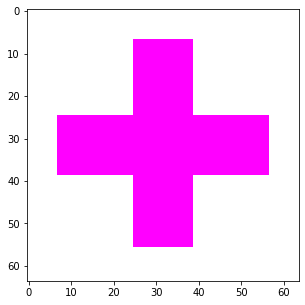

...

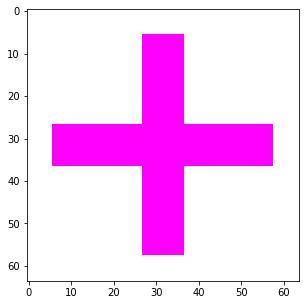

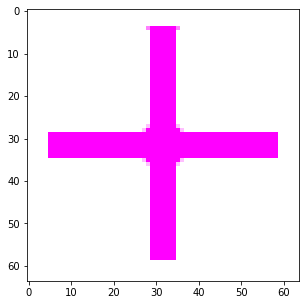

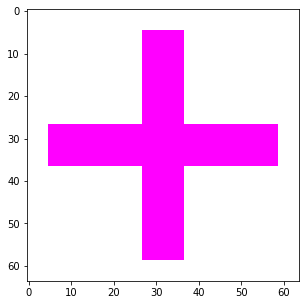

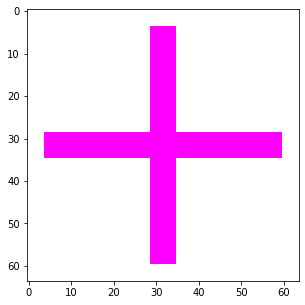

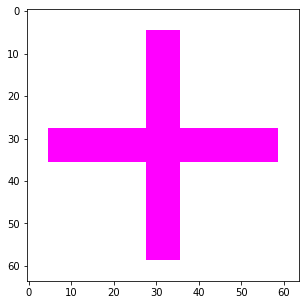

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

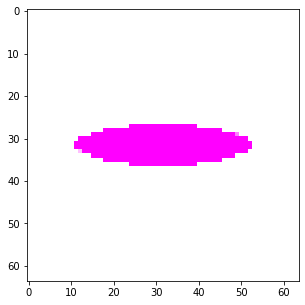

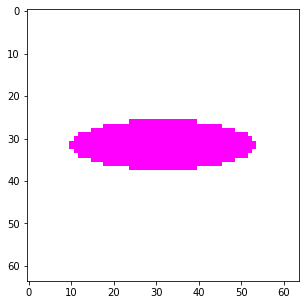

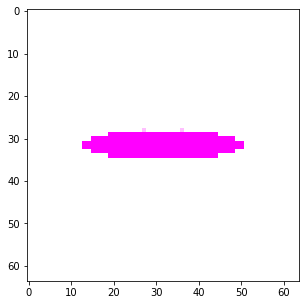

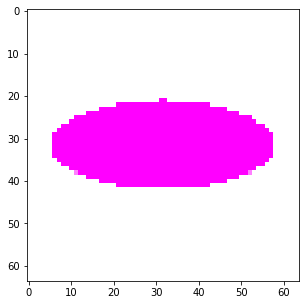

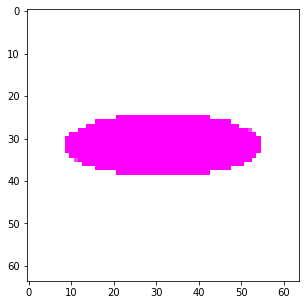

...

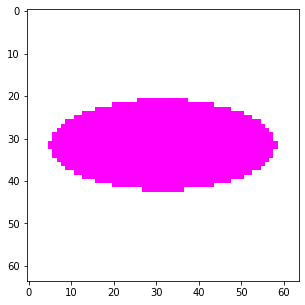

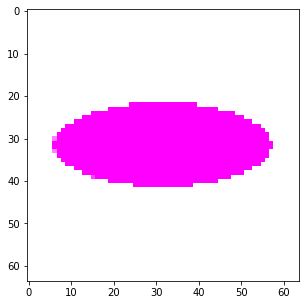

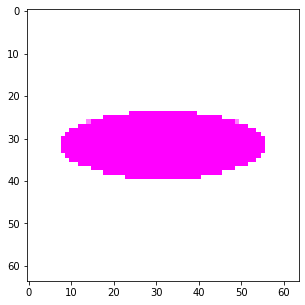

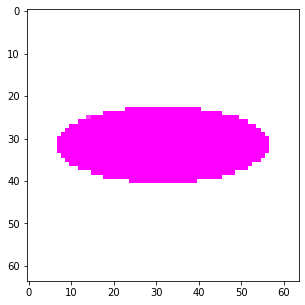

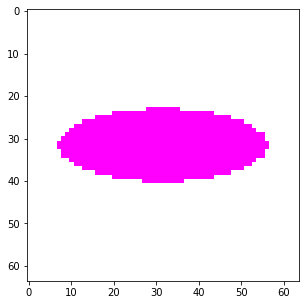

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

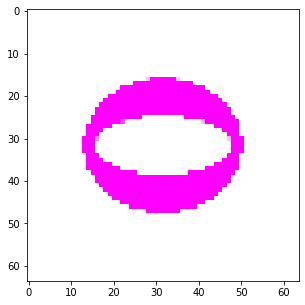

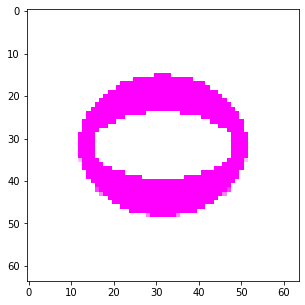

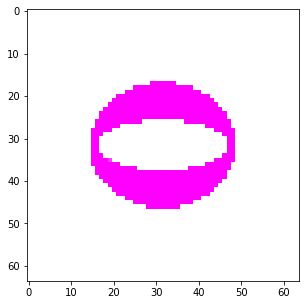

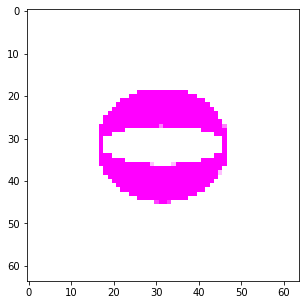

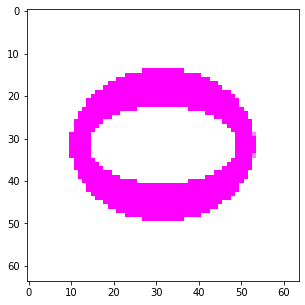

...

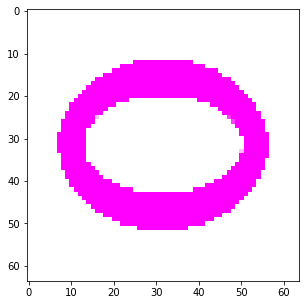

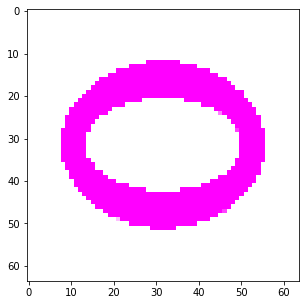

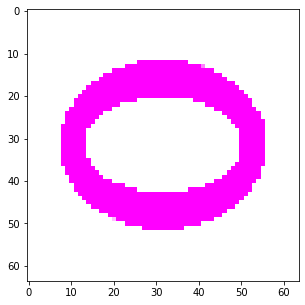

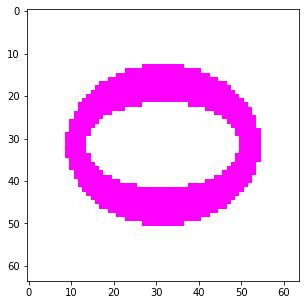

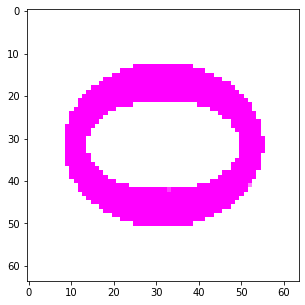

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

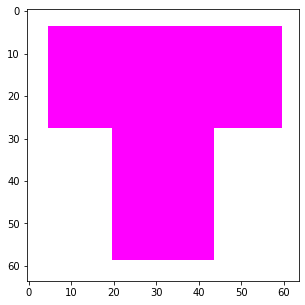

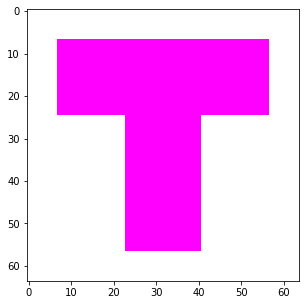

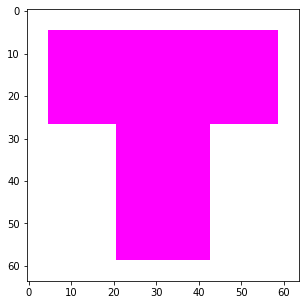

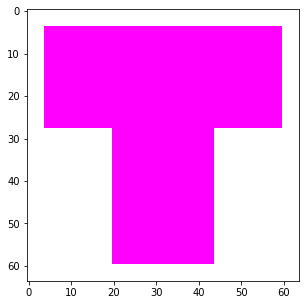

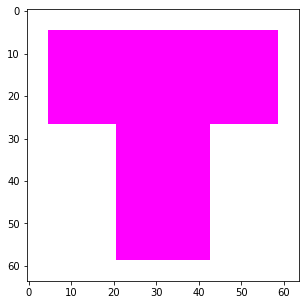

...

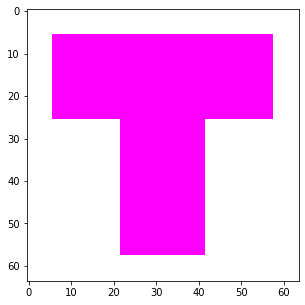

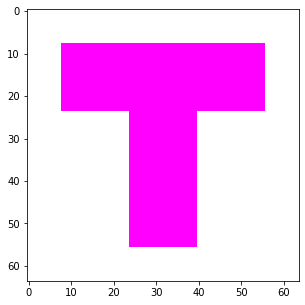

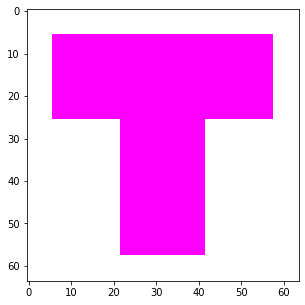

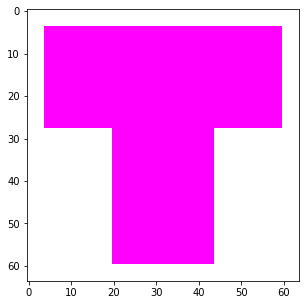

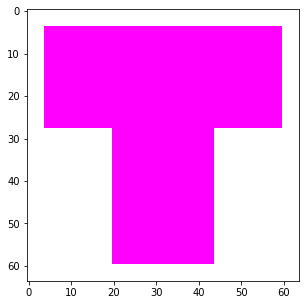

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

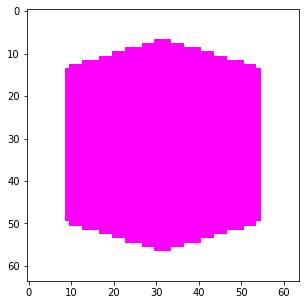

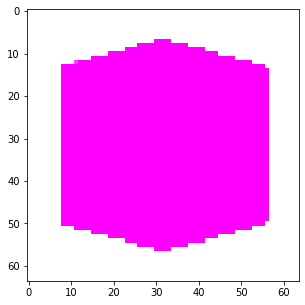

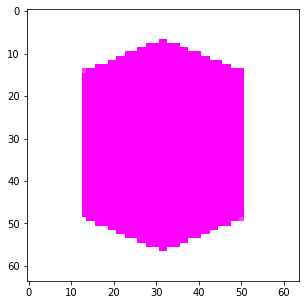

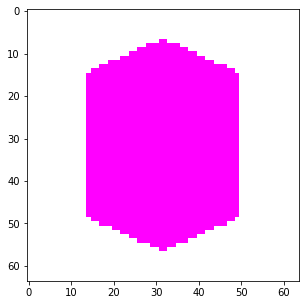

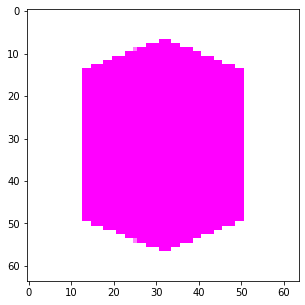

...

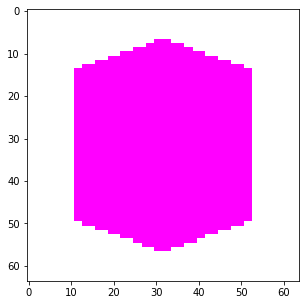

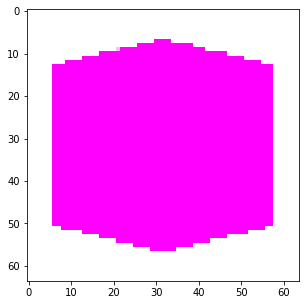

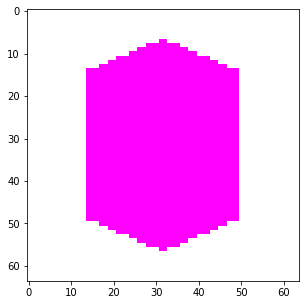

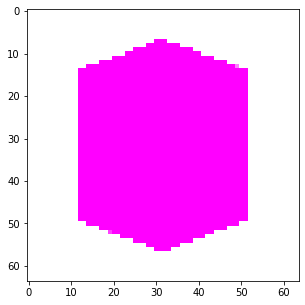

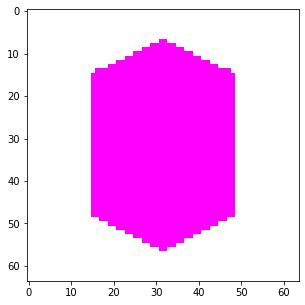

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

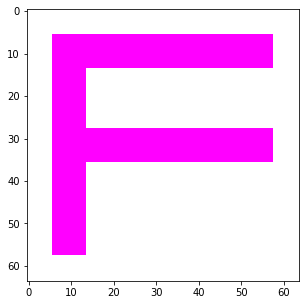

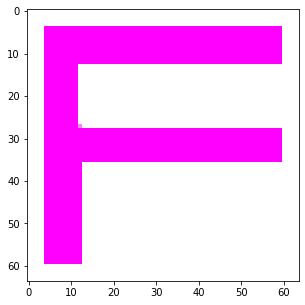

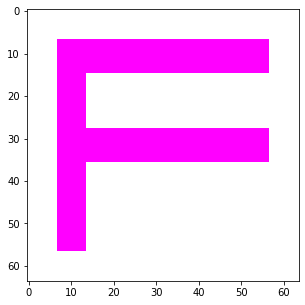

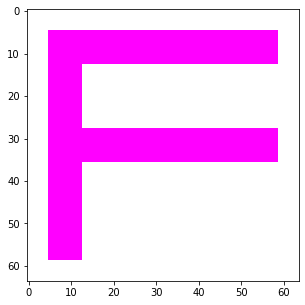

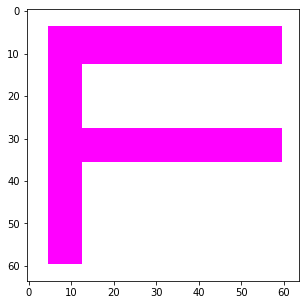

...

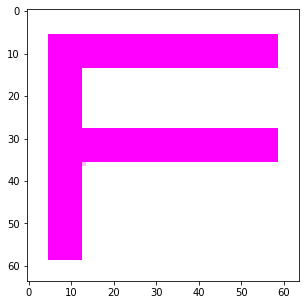

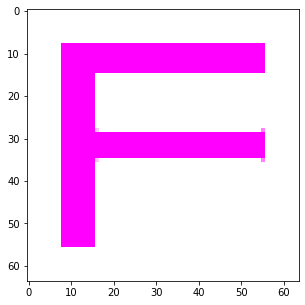

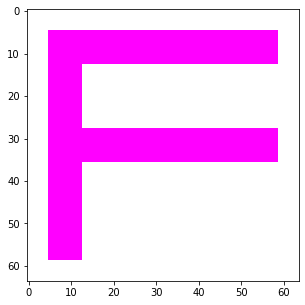

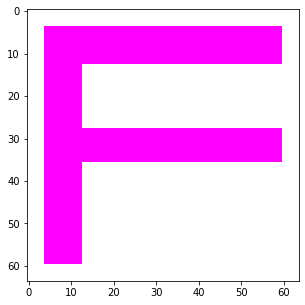

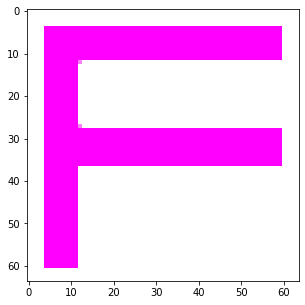

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

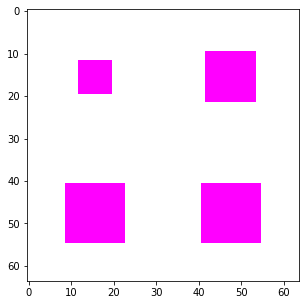

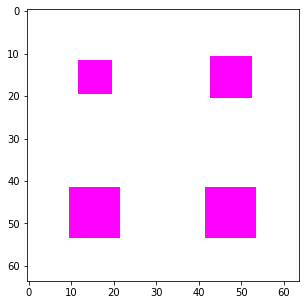

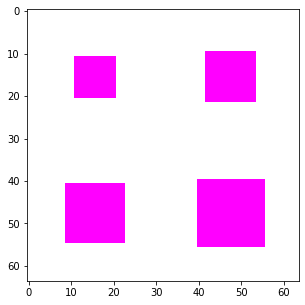

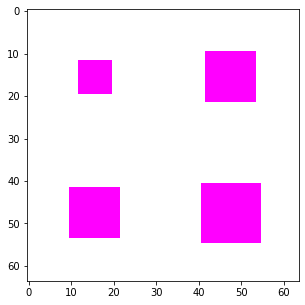

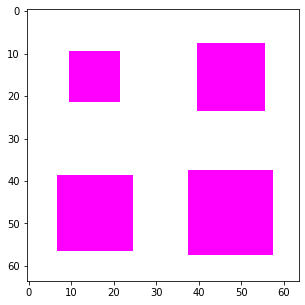

...

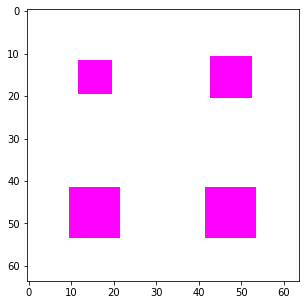

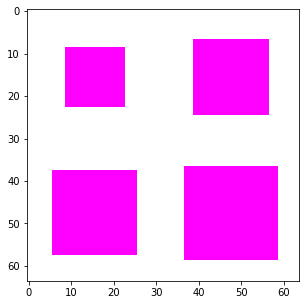

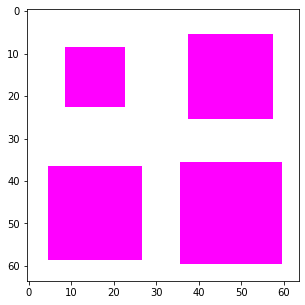

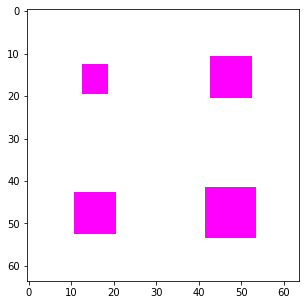

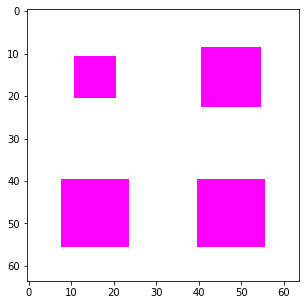

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

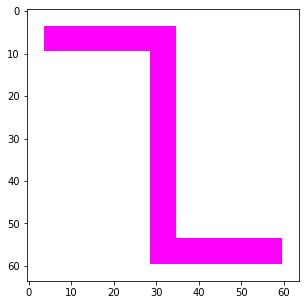

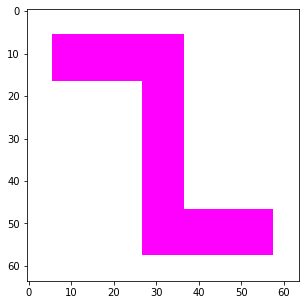

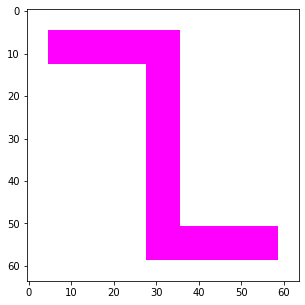

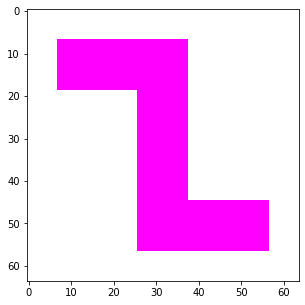

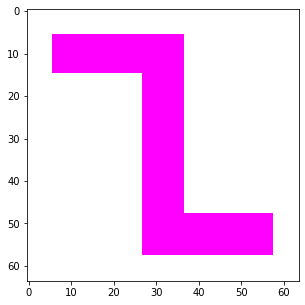

...

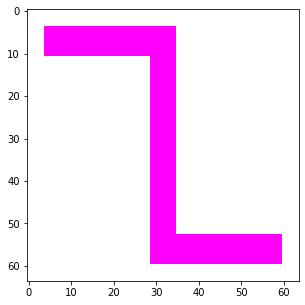

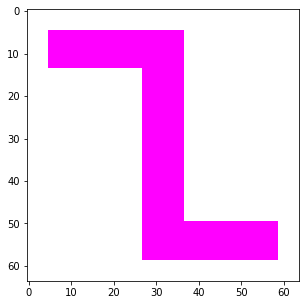

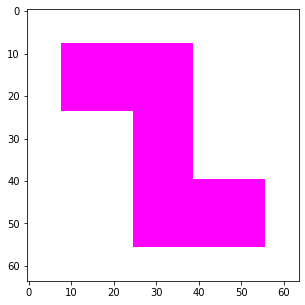

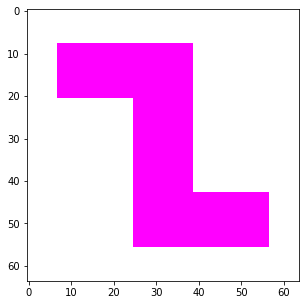

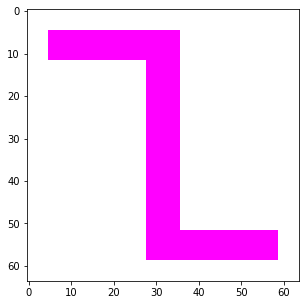

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

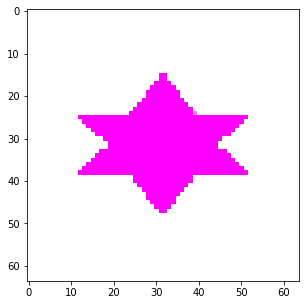

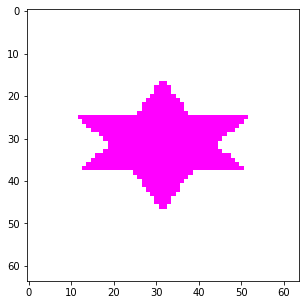

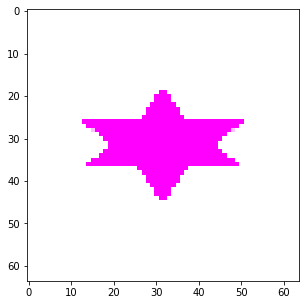

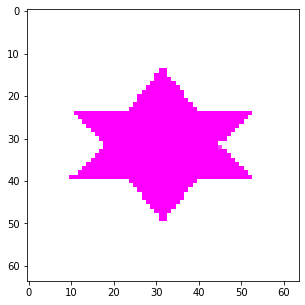

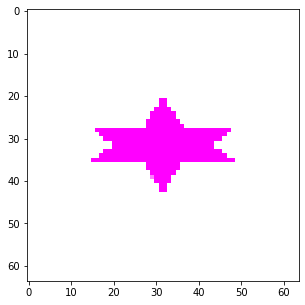

...

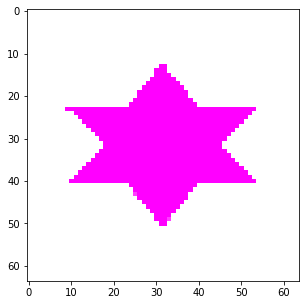

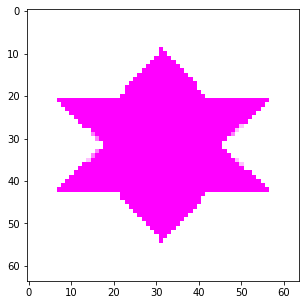

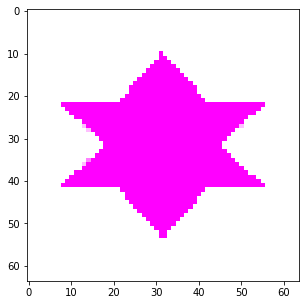

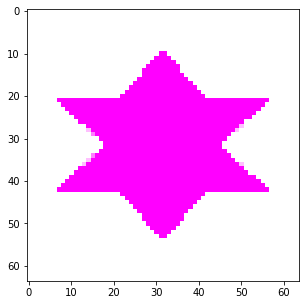

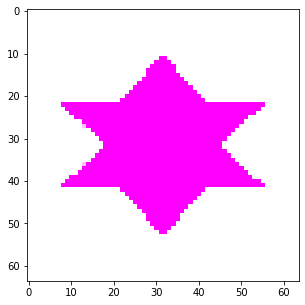

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

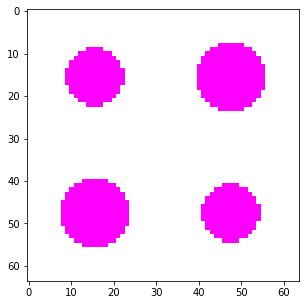

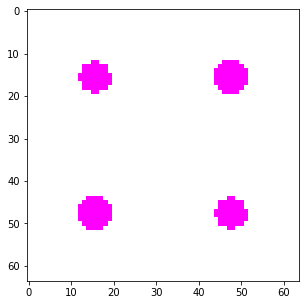

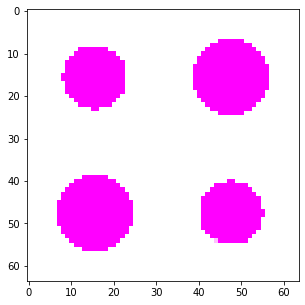

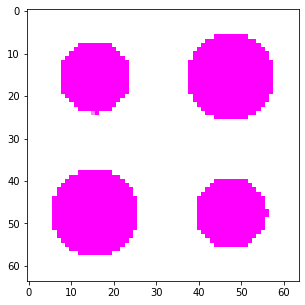

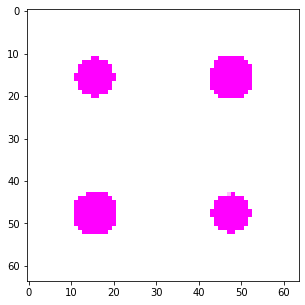

...

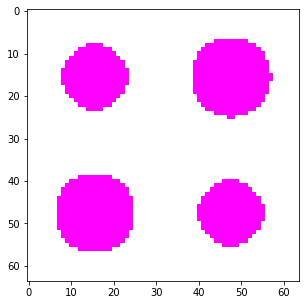

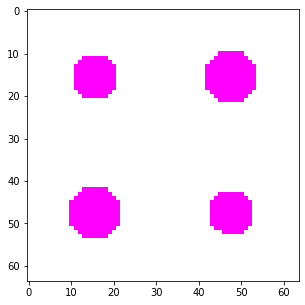

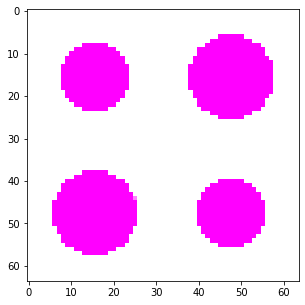

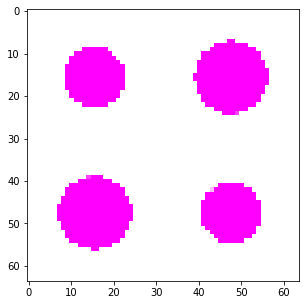

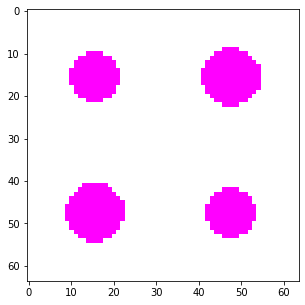

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

In [ ]:
#1 Splitting into Vlybdenum square ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_ring_V=[];
pca_V_sqring=[];
for i in range(len(img_sq_ring_V)):
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_ring_V.append(cv2.resize(img_sq_ring_V[i], target_size))
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_ring_V[i])

for i in range(len(f_sq_ring_V)):
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_ring_V[i]) 
  print ("One Channel Shape: ", blue.shape)
#blue channel
  blue_df = pd.DataFrame(data = blue)
  blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  green_df
#red channel
  red_df = pd.DataFrame(data = red)
  red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_sqring.append(rgd_pca_df_np)
  print("img_sq_ring_cr_size_pca",np.array(pca_V_sqring).shape)






#2 Splitting into V rect

f_rect_V=[]; #1
pca_V_rect=[]; #2
for i in range(len(img_rect_V)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_rect_V.append(cv2.resize(img_rect_V[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_rect_V[i]) #5

for i in range(len(f_rect_V)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_rect_V[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)

  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]
  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_rect.append(rgd_pca_df_np)              #8
  print("img_sq_rect_V",np.array(pca_V_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#2 Splitting into V rect

f_cyl_V=[]; #1
pca_V_cyl=[]; #2
for i in range(len(img_cyl_V)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_V.append(cv2.resize(img_cyl_V[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_V[i]) #5

for i in range(len(f_cyl_V)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_V[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)
  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_cyl.append(rgd_pca_df_np)              #8
  print("img_sq_rect_V",np.array(pca_V_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#4 Splitting into V square
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_V=[]; #1
pca_V_sq=[]; #2
for i in range(len(img_sq_V)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_V.append(cv2.resize(img_sq_V[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_V[i]) #5

for i in range(len(f_sq_V)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_V[i]) #7
  #print ("One Channel Shape: ", blue.shape)
  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  #print ("Blue Data Frame")
  #print (trans_pca_b_df)

  #print ("Green Data Frame")
  #print (trans_pca_g_df)

  #print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_sq.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_V_sq).shape)

#5 Splitting into V triangle

f_tri_V=[]; #1
pca_V_tri=[]; #2
for i in range(len(img_triangle_V)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_tri_V.append(cv2.resize(img_triangle_V[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_tri_V[i]) #5

for i in range(len(f_tri_V)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_tri_V[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df

  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_tri.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_V_sq).shape)


#6 Splitting into chromium img_cir_ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_cir_ring_V=[]; #1
pca_V_cir_ring=[]; #2
for i in range(len(img_cir_ring_V)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cir_ring_V.append(cv2.resize(img_cir_ring_V[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cir_ring_V[i]) #5

for i in range(len(f_cir_ring_V)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cir_ring_V[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_cir_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_V",np.array(pca_V_cir_ring).shape)

#7 Splitting into chromium img_cross
f_cross_V=[]; #1
pca_V_cross=[]; #2
for i in range(len(img_cross_V)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cross_V.append(cv2.resize(img_cross_V[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cross_V[i]) #5
for i in range(len(f_cross_V)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cross_V[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_cross.append(rgd_pca_df_np)              #8
  print("img_cir_ring_cr",np.array(pca_V_cir_ring).shape)
#Its shape is now 4608x1 instead of 64x72




#8 Splitting into chromium img_ellipse

f_ellipse_V=[]; #1
pca_V_ellipse=[]; #2
for i in range(len(img_ellipse_V)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_ellipse_V.append(cv2.resize(img_ellipse_V[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_ellipse_V[i]) #5

for i in range(len(f_ellipse_V)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_ellipse_V[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_ellipse.append(rgd_pca_df_np)              #8
  print("img_ellipse_V",np.array(pca_V_cir_ring).shape)

#8 Splitting into V _elliptical_ring

f_elliptical_ring_V=[]; #1
pca_V_elliptical_ring=[]; #2
for i in range(len(img_elliptical_ring_V)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_elliptical_ring_V.append(cv2.resize(img_elliptical_ring_V[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_elliptical_ring_V[i]) #5

for i in range(len(f_elliptical_ring_V)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_elliptical_ring_V[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_elliptical_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_V",np.array(pca_V_cir_ring).shape)

#10 Splitting into chromium _T shaped

f_T_V=[]; #1
pca_V_T=[]; #2
for i in range(len(img_T_V)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_T_V.append(cv2.resize(img_T_V[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_T_V[i]) #5

for i in range(len(f_T_V)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_T_V[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_T.append(rgd_pca_df_np)              #8
  print("img_T_V",np.array(pca_V_T).shape)

#10 Splitting into chromium Hexagon

f_hex_V=[]; #1
pca_V_hex=[]; #2
for i in range(len(img_hex_V)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_hex_V.append(cv2.resize(img_hex_V[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_hex_V[i]) #5
for i in range(len(f_hex_V)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_hex_V[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_hex.append(rgd_pca_df_np)              #8
  print("img_hex_V",np.array(pca_V_hex).shape)


#11 Splitting into chromium F-shaped

f_F_V=[]; #1
pca_V_F=[]; #2
for i in range(len(img_F_V)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_F_V.append(cv2.resize(img_F_V[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_F_V[i]) #5

for i in range(len(f_F_V)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_F_V[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_F.append(rgd_pca_df_np)              #8
  print("img_hex_V",np.array(pca_V_F).shape)


#12 Splitting into chromium Square SC
f_sq_SC_V=[]; #1
pca_V_sq_SC=[]; #2
for i in range(len(img_sq_SC_V)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_SC_V.append(cv2.resize(img_sq_SC_V[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_SC_V[i]) #5

for i in range(len(f_sq_SC_V)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_SC_V[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_sq_SC.append(rgd_pca_df_np)              #8
  print("img_hex_sq_SC",np.array(pca_V_sq_SC).shape)

#13 Splitting into chromium Z shaped
f_Z_V=[]; #1
pca_V_Z=[]; #2
for i in range(len(img_Z_V)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_Z_V.append(cv2.resize(img_Z_V[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_Z_V[i]) #5

for i in range(len(f_Z_V)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_Z_V[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)
  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_Z.append(rgd_pca_df_np)              #8
  print("img_Z_V",np.array(pca_V_Z).shape)



#14 Splitting into chromium star
f_star_V=[]; #1
pca_V_star=[]; #2
for i in range(len(img_star_V)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_star_V.append(cv2.resize(img_star_V[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_star_V[i]) #5

for i in range(len(f_star_V)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_star_V[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)
  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_star.append(rgd_pca_df_np)              #8
  print("img_Z_V",np.array(pca_V_Z).shape)

#16 Splitting into chromium cyl_Sc

f_cyl_SC_V=[]; #1
pca_V_cyl_SC=[]; #2
for i in range(len(img_cyl_SC_V)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_SC_V.append(cv2.resize(img_cyl_SC_V[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_SC_V[i]) #5

for i in range(len(f_cyl_SC_V)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_SC_V[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_V_cyl_SC.append(rgd_pca_df_np)              #8
  print("img_Z_V",np.array(pca_V_cyl_SC).shape)



#



In [ ]:
reps = (25,1)
all_pca_sqring_V =np.tile(pca_V_sqring,reps) #1
all_pca_rect_V=np.tile(pca_V_rect,reps) #2
all_pca_cyl_V =np.tile(pca_V_cyl,reps) #3
all_pca_sq_V = np.tile(pca_V_sq,reps) #4
all_pca_tri_V = np.tile(pca_V_tri,reps)#5
all_pca_cir_ring_V = np.tile(pca_V_cir_ring,reps) #6
all_pca_cross_V = np.tile(pca_V_cross,reps) #7
all_pca_ellipse_V = np.tile(pca_V_ellipse,reps) #8
all_pca_elliptical_ring_V = np.tile(pca_V_elliptical_ring,reps) #9
all_pca_T_V = np.tile(pca_V_T,reps)#10
all_pca_hex_V = np.tile(pca_V_hex,reps)#11
all_pca_F_V = np.tile(pca_V_F,reps) #12
all_pca_sq_SC_V = np.tile(pca_V_sq_SC,reps) #13
all_pca_Z_V=np.tile(pca_V_Z,reps)
all_pca_star_V=np.tile(pca_V_star,reps)
all_pca_cyl_SC_V=np.tile(pca_V_cyl_SC,reps)
print(all_pca_cross_V.shape)



(325, 1920)


In [ ]:

all_img_V= np.concatenate((all_pca_sqring_V,all_pca_rect_V,all_pca_cyl_V,all_pca_sq_V,all_pca_tri_V,all_pca_cir_ring_V,all_pca_cross_V,all_pca_ellipse_V,all_pca_elliptical_ring_V,all_pca_T_V,all_pca_hex_V,all_pca_F_V,all_pca_sq_SC_V,all_pca_Z_V,all_pca_star_V,all_pca_cyl_SC_V ),axis=0)
print(all_img_CR.shape)



(5200, 1920)


## TiN

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (6, 1920

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_ring_cr_size_pca (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (6, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:96: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:102: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:168: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:176: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:180: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:183: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_rect_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Dat

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:250: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



img_sq_rect_TiN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (1, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (2, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (3, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (4, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (5, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (6, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (7, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (8, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (9, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (10, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (11, 1920)
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (12, 1920)
RGB Data Frame Shape: 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:257: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:263: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:336: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_sq_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:418: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Dat

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:494: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin


rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_cr (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_TiN (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_TiN (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:576: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:583: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_ellipse_TiN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:656: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:660: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:663: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_cir_ring_TiN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_TiN (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_TiN (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_TiN (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_TiN (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_TiN (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_TiN (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_TiN (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_TiN (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_TiN (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_TiN (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_TiN (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:736: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:740: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:743: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_TiN (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_T_TiN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (11, 1920)
One Channel Shape: 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:815: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:818: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:821: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

 (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (4, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (5, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (11, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:896: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:899: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:902: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_TiN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (10, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:975: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:978: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:981: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_hex_sq_SC (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1055: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1059: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1062: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (13, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1135: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (13, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (13, 1920)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (1, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (2, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (3, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (4, 1920)
One Channel Shape:  (64, 64)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war

Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (5, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (6, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (7, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (8, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (9, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1216: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1220: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_war


Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (10, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (11, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (12, 1920)
One Channel Shape:  (64, 64)
Blue Data Frame
Green Data Frame
Red Data Frame
RGB Data Frame Shape:  (64, 30)
rgd_pca_df_1d (1, 1920)
img_Z_TiN (13, 1920)


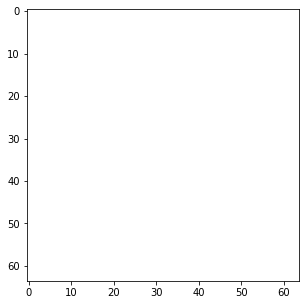

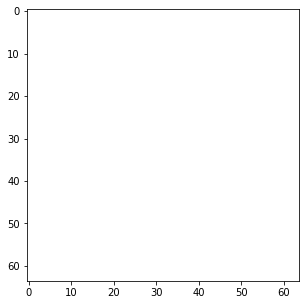

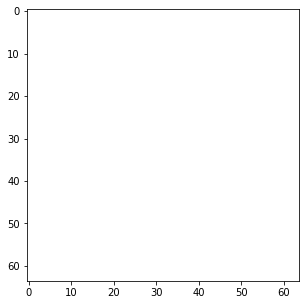

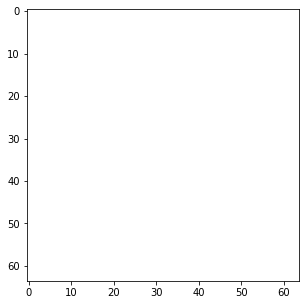

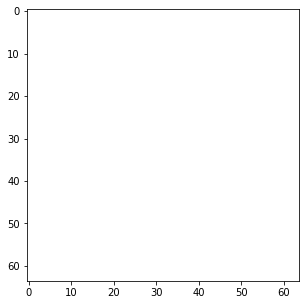

...

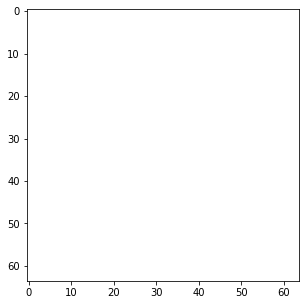

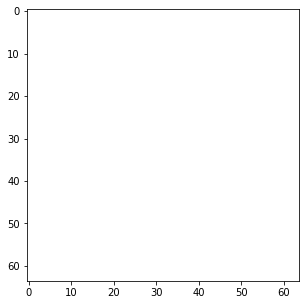

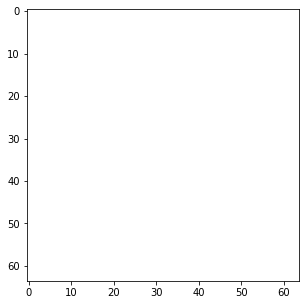

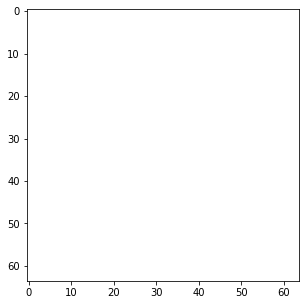

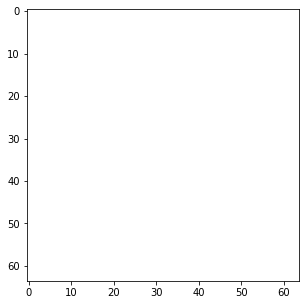

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

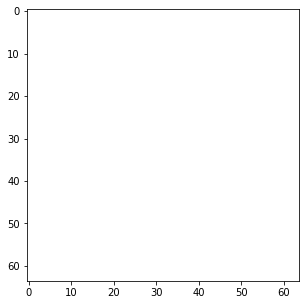

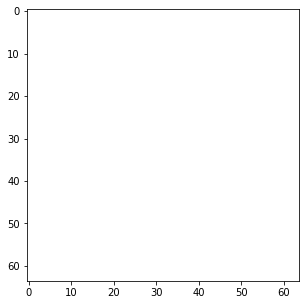

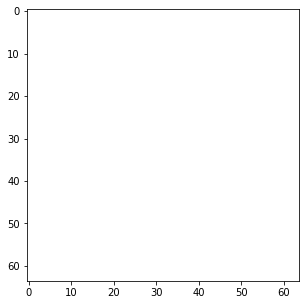

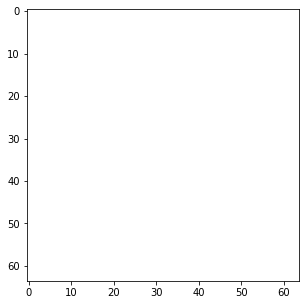

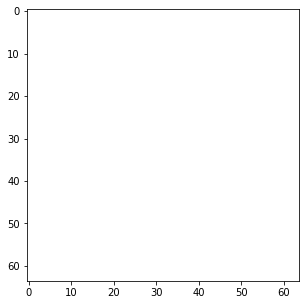

...

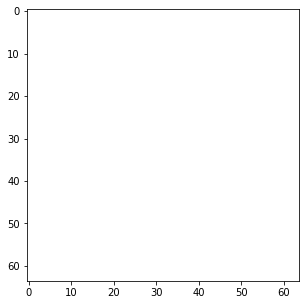

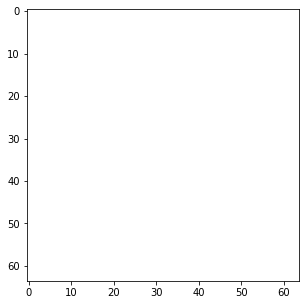

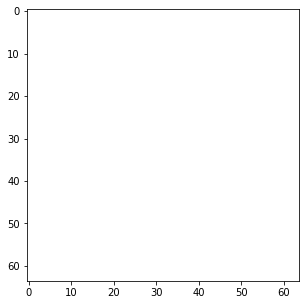

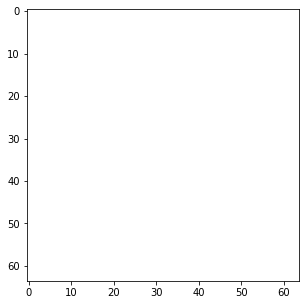

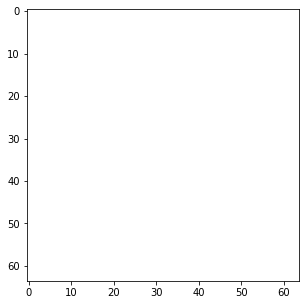

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

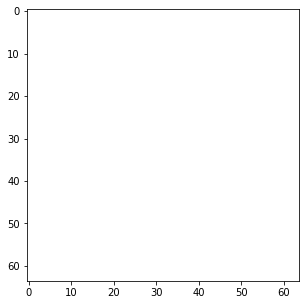

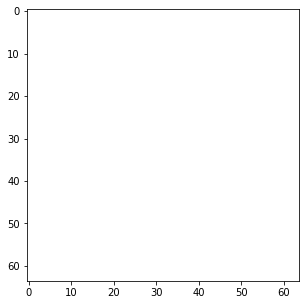

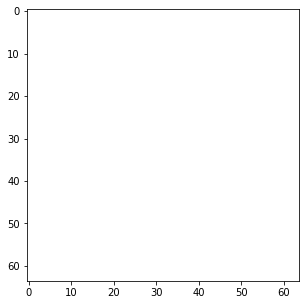

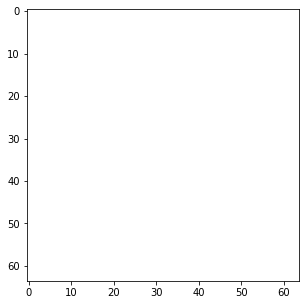

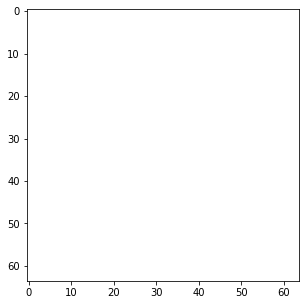

...

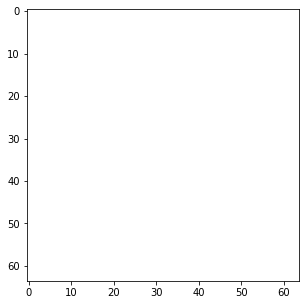

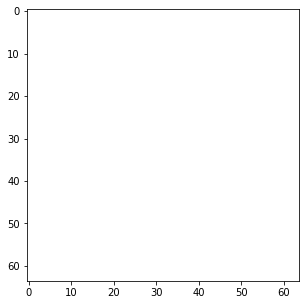

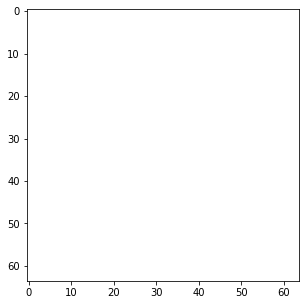

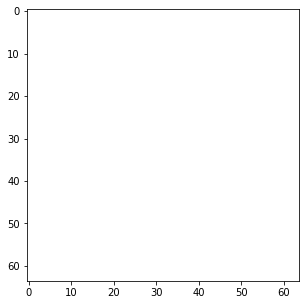

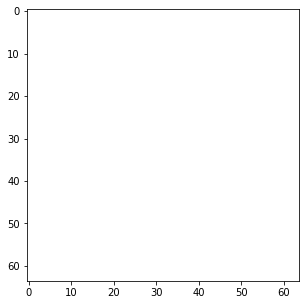

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

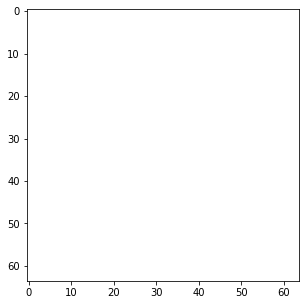

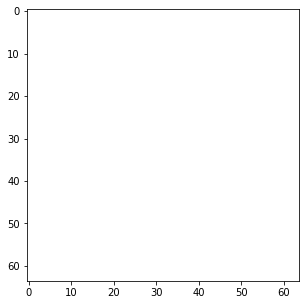

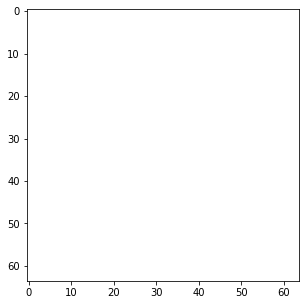

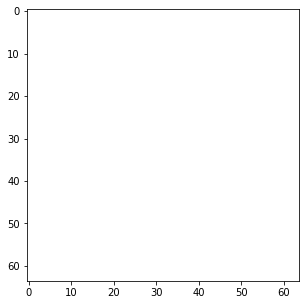

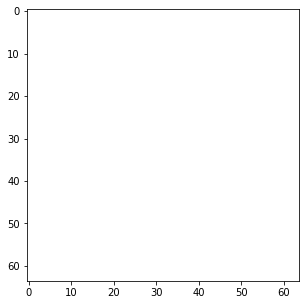

...

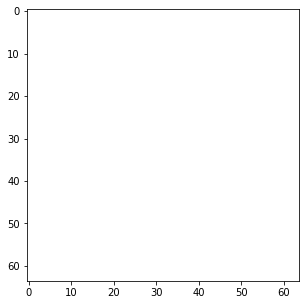

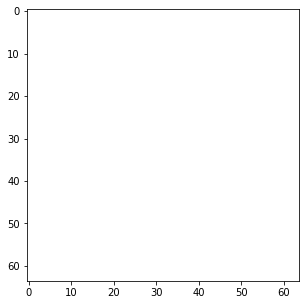

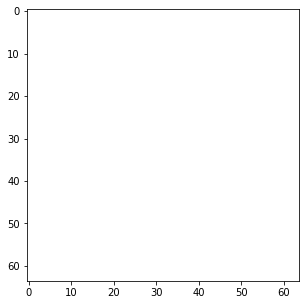

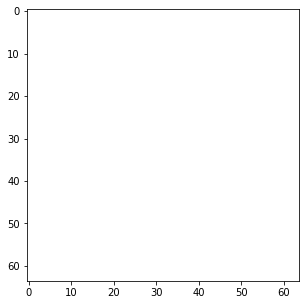

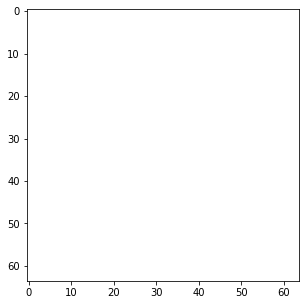

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

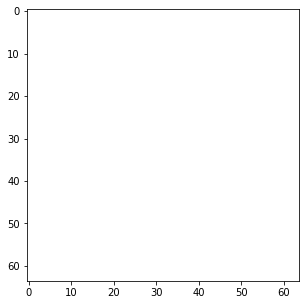

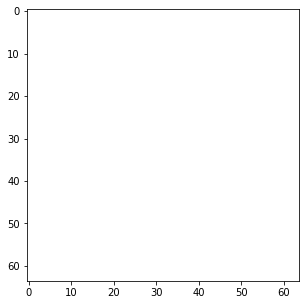

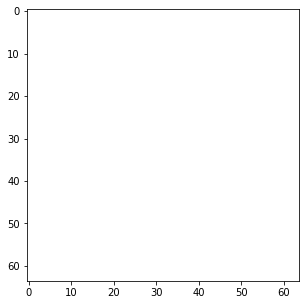

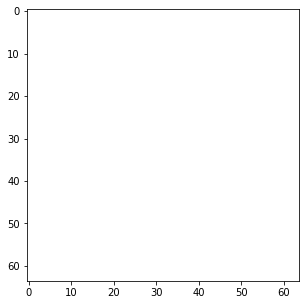

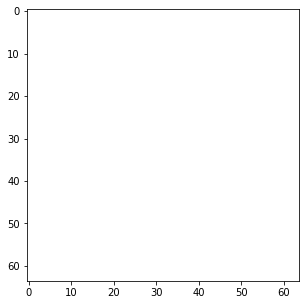

...

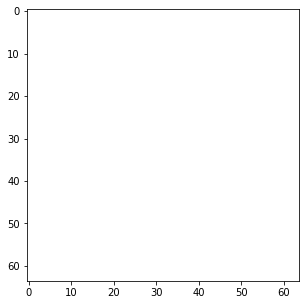

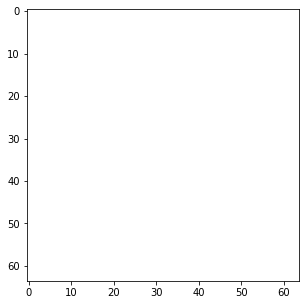

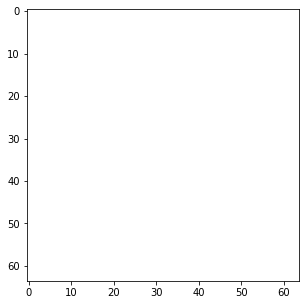

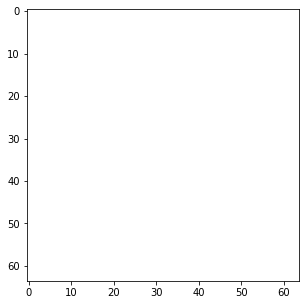

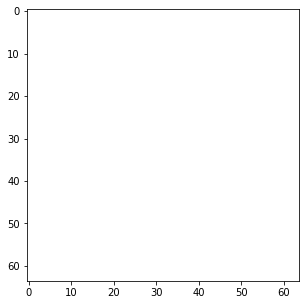

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

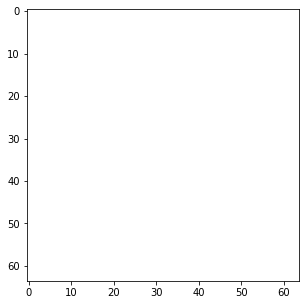

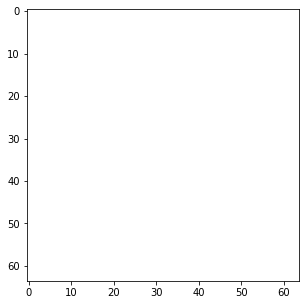

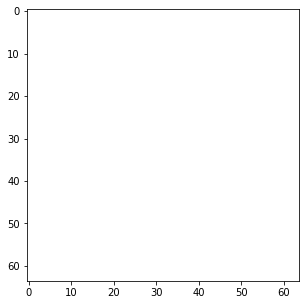

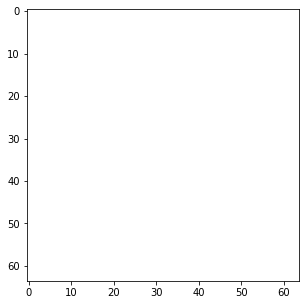

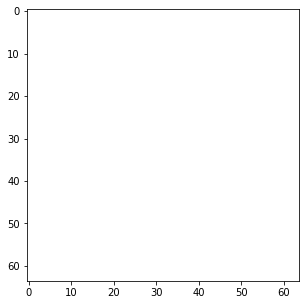

...

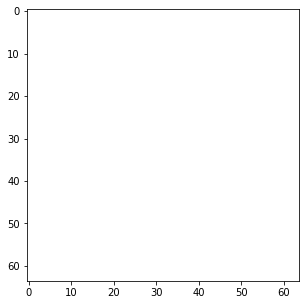

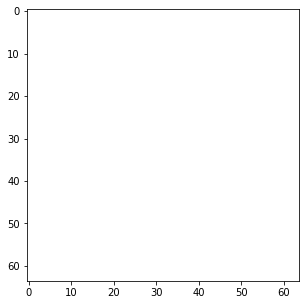

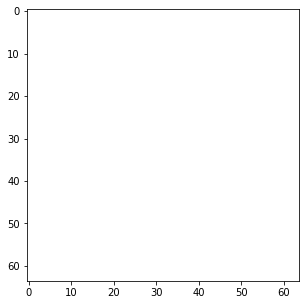

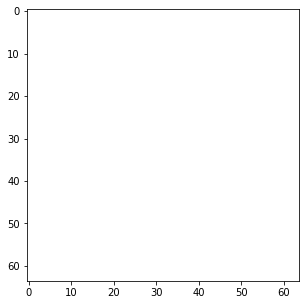

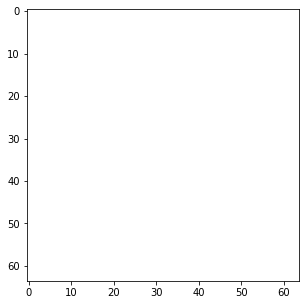

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

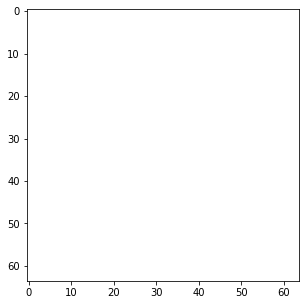

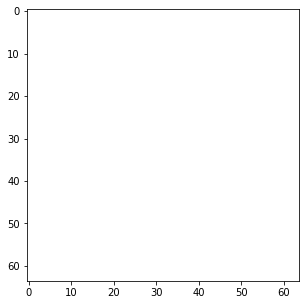

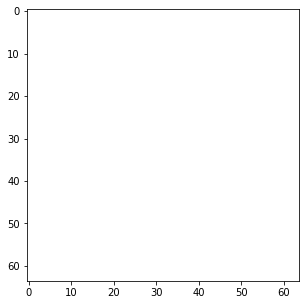

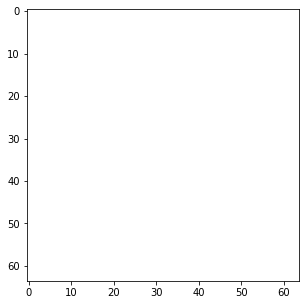

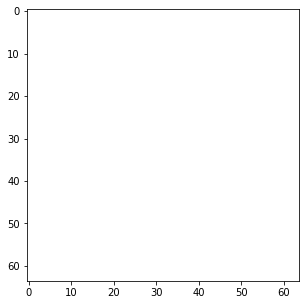

...

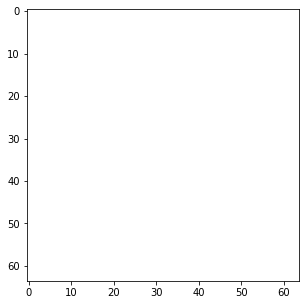

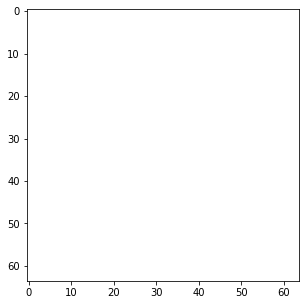

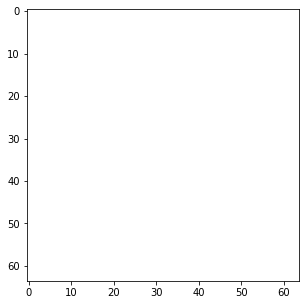

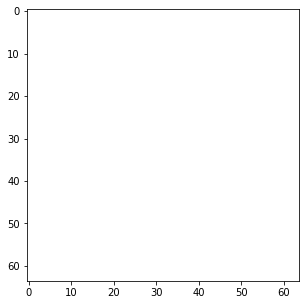

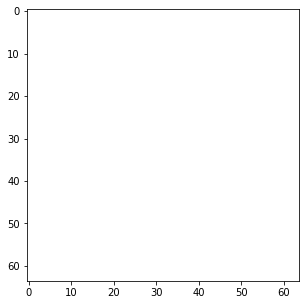

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

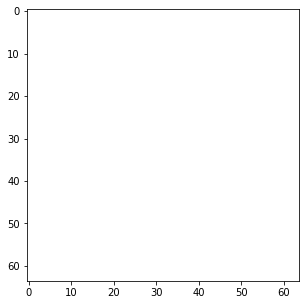

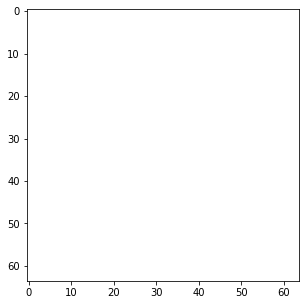

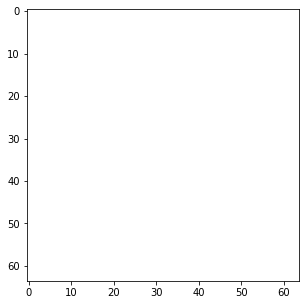

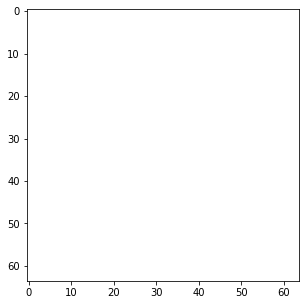

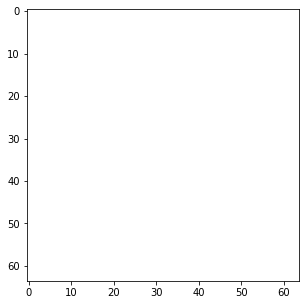

...

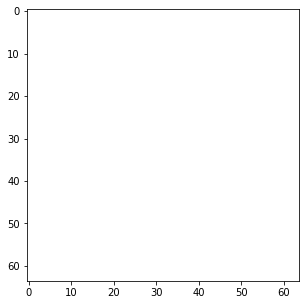

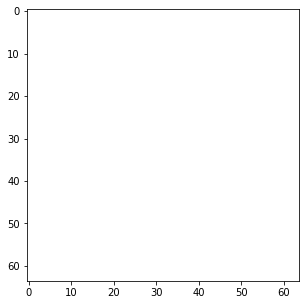

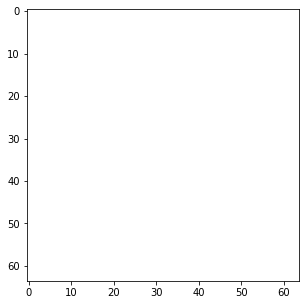

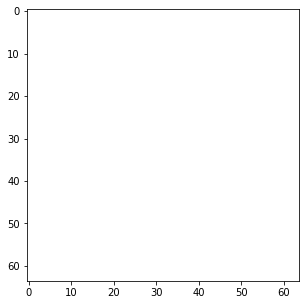

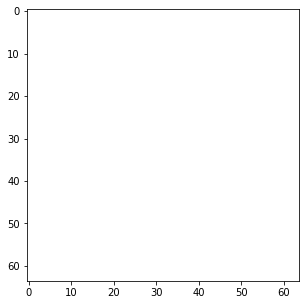

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

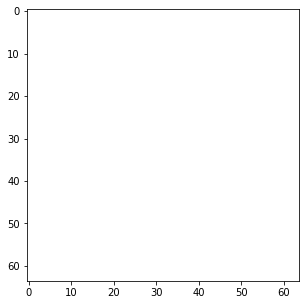

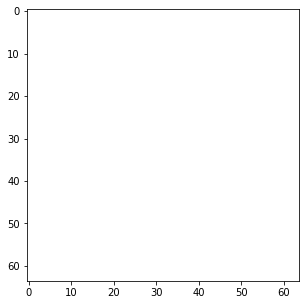

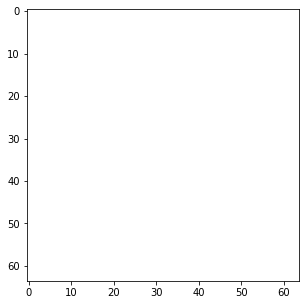

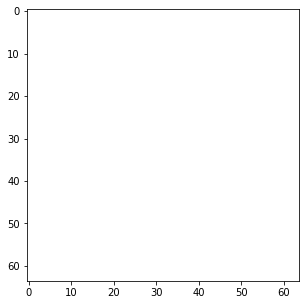

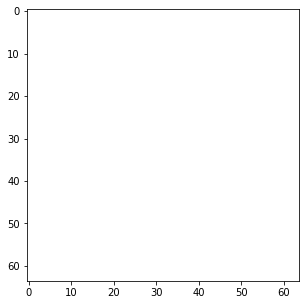

...

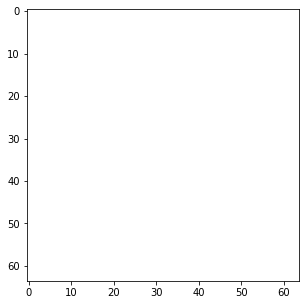

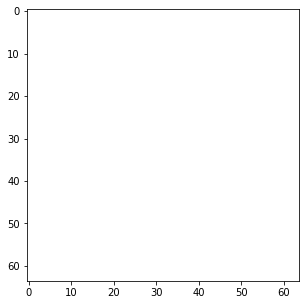

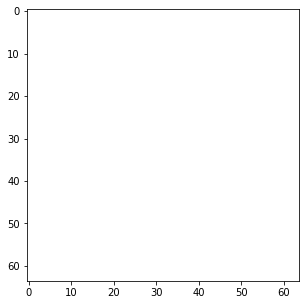

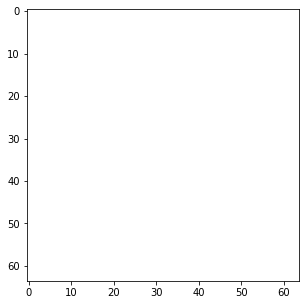

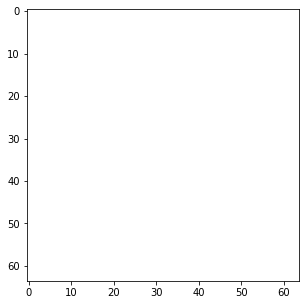

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

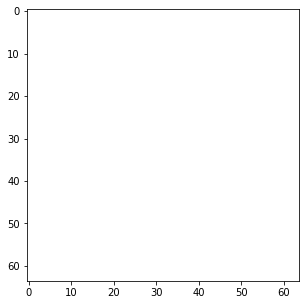

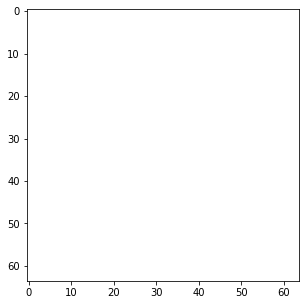

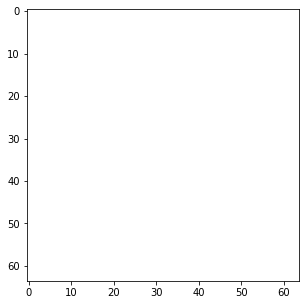

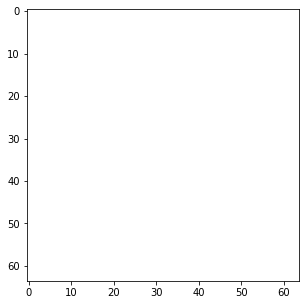

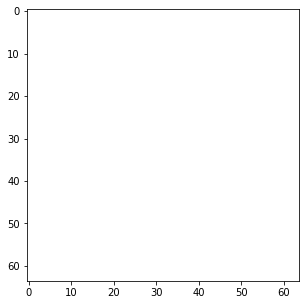

...

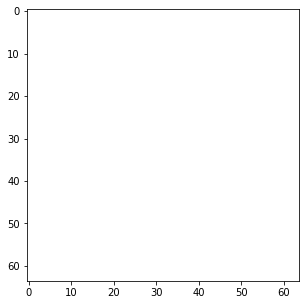

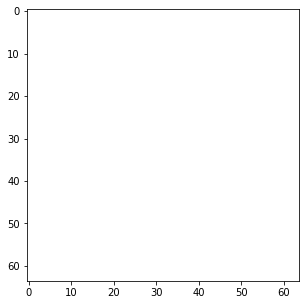

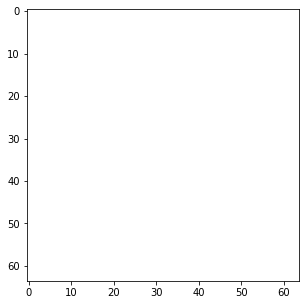

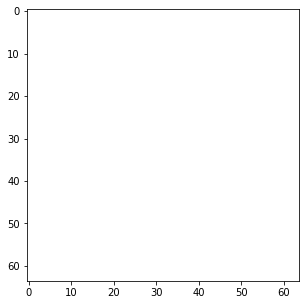

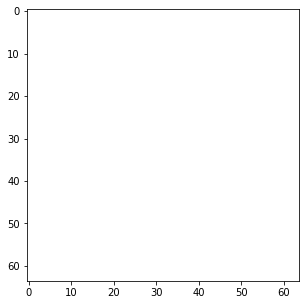

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

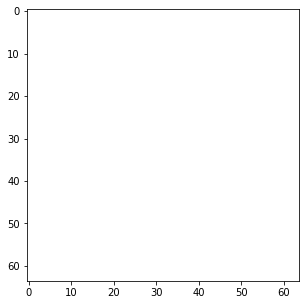

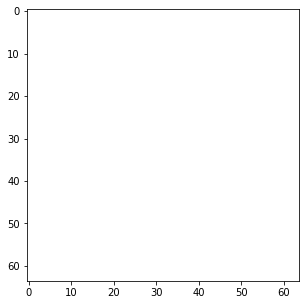

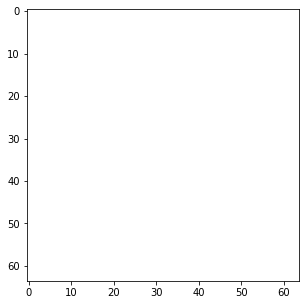

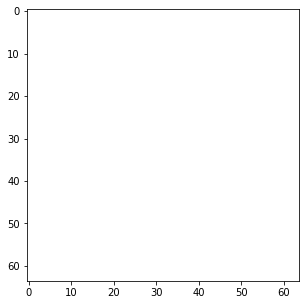

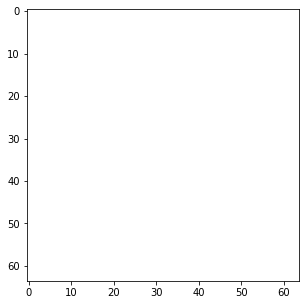

...

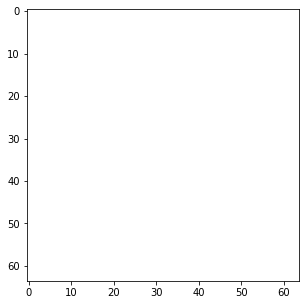

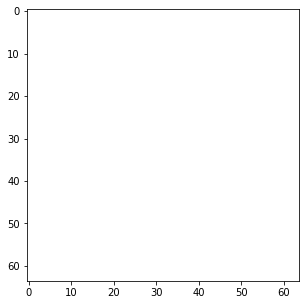

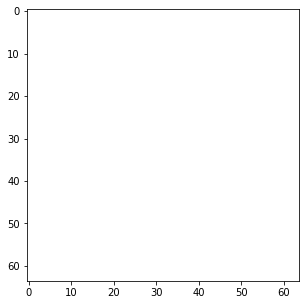

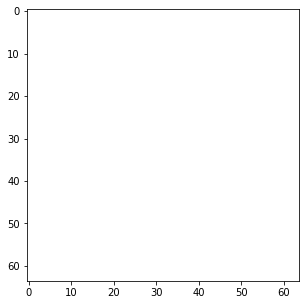

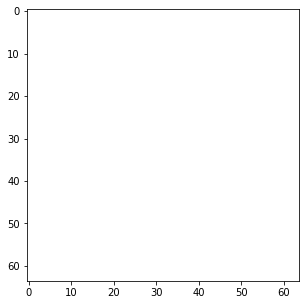

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

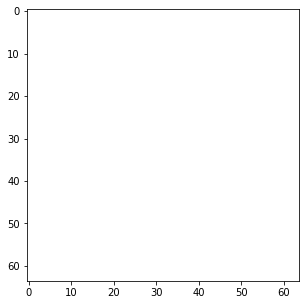

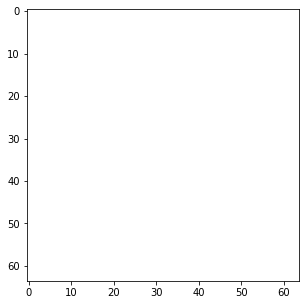

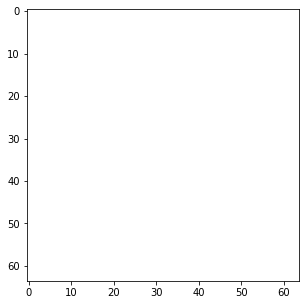

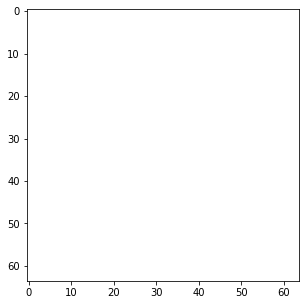

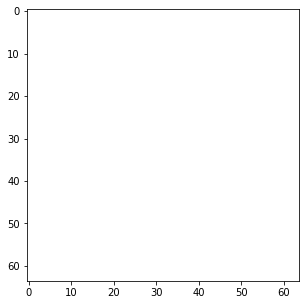

...

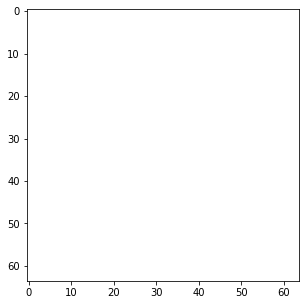

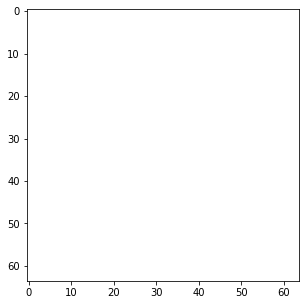

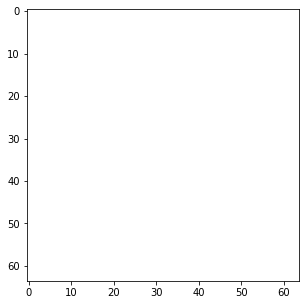

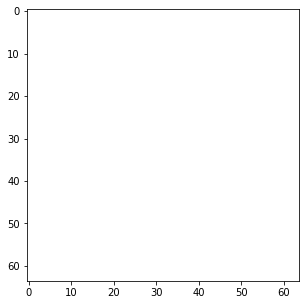

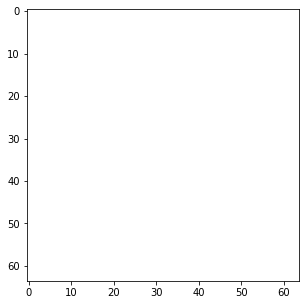

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

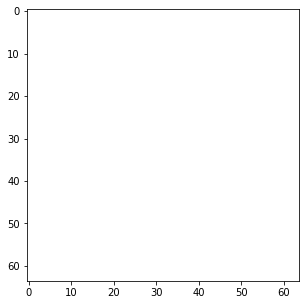

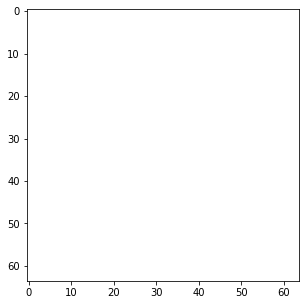

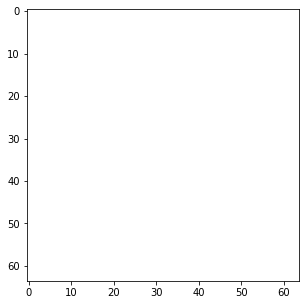

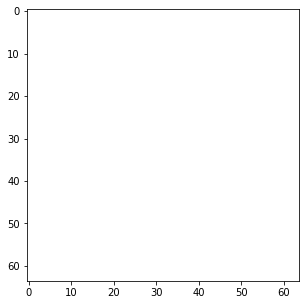

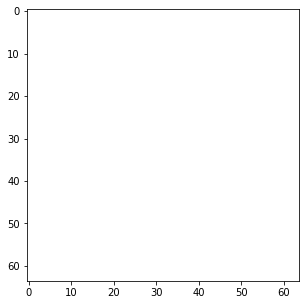

...

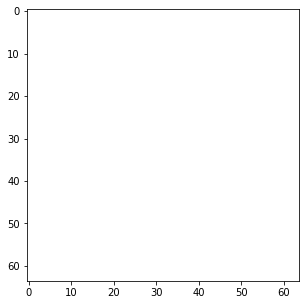

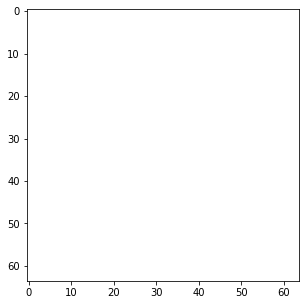

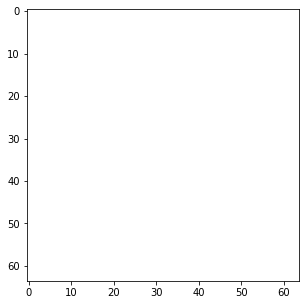

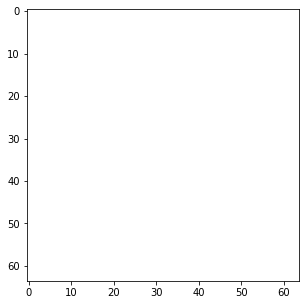

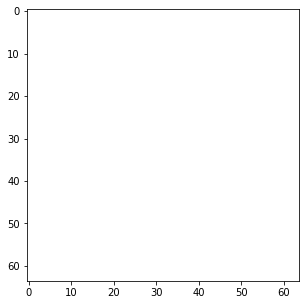

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

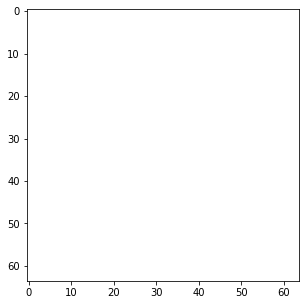

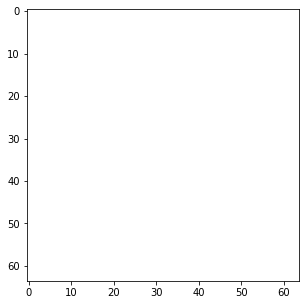

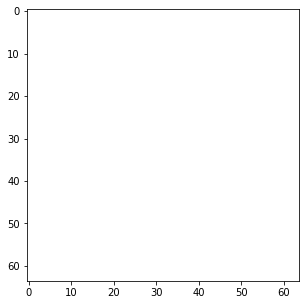

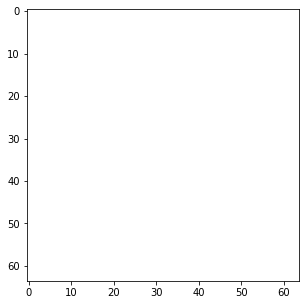

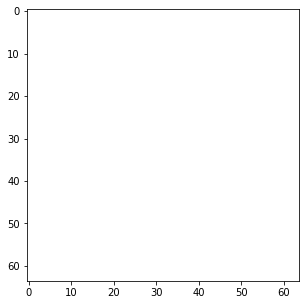

...

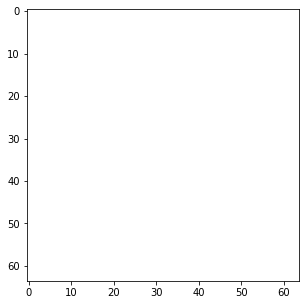

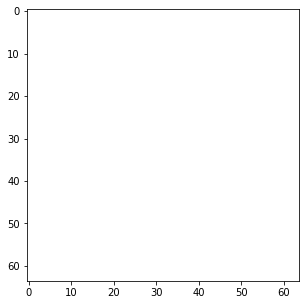

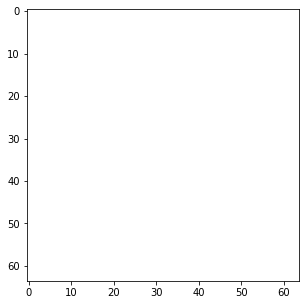

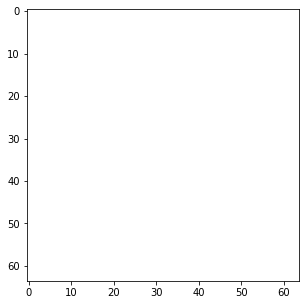

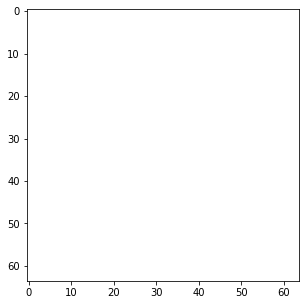

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

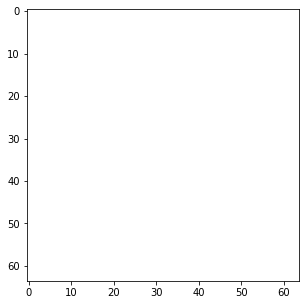

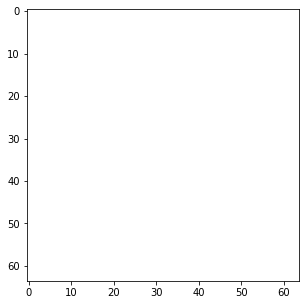

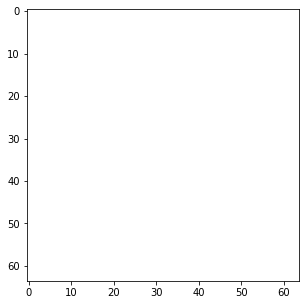

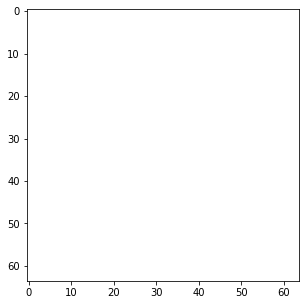

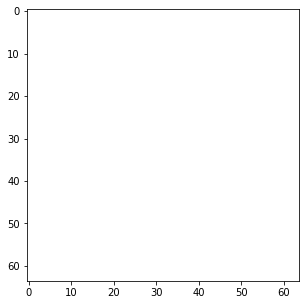

...

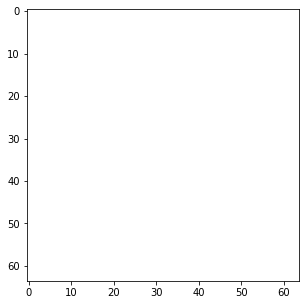

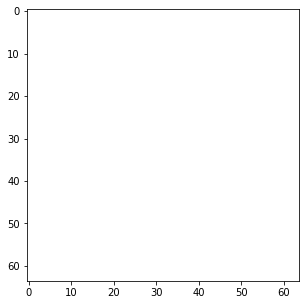

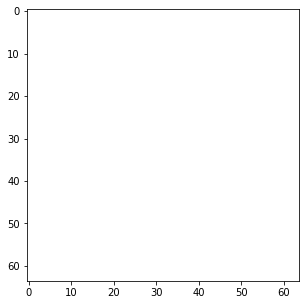

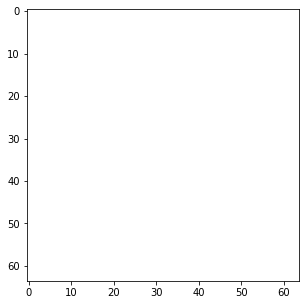

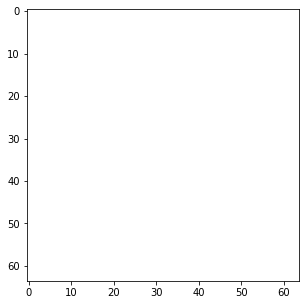

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

In [ ]:
#1 Splitting into TiNlybdenum square ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_ring_TiN=[];
pca_TiN_sqring=[];
for i in range(len(img_sq_ring_TiN)):
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_ring_TiN.append(cv2.resize(img_sq_ring_TiN[i], target_size))
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_ring_TiN[i])

for i in range(len(f_sq_ring_TiN)):
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_ring_TiN[i]) 
  print ("One Channel Shape: ", blue.shape)
#blue channel
  blue_df = pd.DataFrame(data = blue)
  blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  green_df
#red channel
  red_df = pd.DataFrame(data = red)
  red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_sqring.append(rgd_pca_df_np)
  print("img_sq_ring_cr_size_pca",np.array(pca_TiN_sqring).shape)






#2 Splitting into TiN rect

f_rect_TiN=[]; #1
pca_TiN_rect=[]; #2
for i in range(len(img_rect_TiN)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_rect_TiN.append(cv2.resize(img_rect_TiN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_rect_TiN[i]) #5

for i in range(len(f_rect_TiN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_rect_TiN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)

  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]
  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_rect.append(rgd_pca_df_np)              #8
  print("img_sq_rect_TiN",np.array(pca_TiN_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#2 Splitting into TiN rect

f_cyl_TiN=[]; #1
pca_TiN_cyl=[]; #2
for i in range(len(img_cyl_TiN)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_TiN.append(cv2.resize(img_cyl_TiN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_TiN[i]) #5

for i in range(len(f_cyl_TiN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_TiN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)
  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_cyl.append(rgd_pca_df_np)              #8
  print("img_sq_rect_TiN",np.array(pca_TiN_rect).shape)
#Its shape is now 4608x1 instead of 64x72

#4 Splitting into TiN square
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_sq_TiN=[]; #1
pca_TiN_sq=[]; #2
for i in range(len(img_sq_TiN)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_TiN.append(cv2.resize(img_sq_TiN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_TiN[i]) #5

for i in range(len(f_sq_TiN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_TiN[i]) #7
  #print ("One Channel Shape: ", blue.shape)
  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  #print ("Blue Data Frame")
  #print (trans_pca_b_df)

  #print ("Green Data Frame")
  #print (trans_pca_g_df)

  #print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  #rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_sq.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_TiN_sq).shape)

#5 Splitting into TiN triangle

f_tri_TiN=[]; #1
pca_TiN_tri=[]; #2
for i in range(len(img_triangle_TiN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_tri_TiN.append(cv2.resize(img_triangle_TiN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_tri_TiN[i]) #5

for i in range(len(f_tri_TiN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_tri_TiN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df

  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)

  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_tri.append(rgd_pca_df_np)              #8
  print("img_sq_cr",np.array(pca_TiN_sq).shape)


#6 Splitting into chromium img_cir_ring
i=0
target_size = (64,64)
target_size = np.asarray(target_size)
f_cir_ring_TiN=[]; #1
pca_TiN_cir_ring=[]; #2
for i in range(len(img_cir_ring_TiN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cir_ring_TiN.append(cv2.resize(img_cir_ring_TiN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cir_ring_TiN[i]) #5

for i in range(len(f_cir_ring_TiN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cir_ring_TiN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_cir_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_TiN",np.array(pca_TiN_cir_ring).shape)

#7 Splitting into chromium img_cross
f_cross_TiN=[]; #1
pca_TiN_cross=[]; #2
for i in range(len(img_cross_TiN)): #3
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cross_TiN.append(cv2.resize(img_cross_TiN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cross_TiN[i]) #5
for i in range(len(f_cross_TiN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cross_TiN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_cross.append(rgd_pca_df_np)              #8
  print("img_cir_ring_cr",np.array(pca_TiN_cir_ring).shape)
#Its shape is now 4608x1 instead of 64x72




#8 Splitting into chromium img_ellipse

f_ellipse_TiN=[]; #1
pca_TiN_ellipse=[]; #2
for i in range(len(img_ellipse_TiN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_ellipse_TiN.append(cv2.resize(img_ellipse_TiN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_ellipse_TiN[i]) #5

for i in range(len(f_ellipse_TiN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_ellipse_TiN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_ellipse.append(rgd_pca_df_np)              #8
  print("img_ellipse_TiN",np.array(pca_TiN_cir_ring).shape)

#8 Splitting into TiN _elliptical_ring

f_elliptical_ring_TiN=[]; #1
pca_TiN_elliptical_ring=[]; #2
for i in range(len(img_elliptical_ring_TiN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_elliptical_ring_TiN.append(cv2.resize(img_elliptical_ring_TiN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_elliptical_ring_TiN[i]) #5

for i in range(len(f_elliptical_ring_TiN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_elliptical_ring_TiN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_elliptical_ring.append(rgd_pca_df_np)              #8
  print("img_cir_ring_TiN",np.array(pca_TiN_cir_ring).shape)

#10 Splitting into chromium _T shaped

f_T_TiN=[]; #1
pca_TiN_T=[]; #2
for i in range(len(img_T_TiN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_T_TiN.append(cv2.resize(img_T_TiN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_T_TiN[i]) #5

for i in range(len(f_T_TiN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_T_TiN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_T.append(rgd_pca_df_np)              #8
  print("img_T_TiN",np.array(pca_TiN_T).shape)

#10 Splitting into chromium Hexagon

f_hex_TiN=[]; #1
pca_TiN_hex=[]; #2
for i in range(len(img_hex_TiN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_hex_TiN.append(cv2.resize(img_hex_TiN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_hex_TiN[i]) #5
for i in range(len(f_hex_TiN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_hex_TiN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)
  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_hex.append(rgd_pca_df_np)              #8
  print("img_hex_TiN",np.array(pca_TiN_hex).shape)


#11 Splitting into chromium F-shaped

f_F_TiN=[]; #1
pca_TiN_F=[]; #2
for i in range(len(img_F_TiN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_F_TiN.append(cv2.resize(img_F_TiN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_F_TiN[i]) #5

for i in range(len(f_F_TiN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_F_TiN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_F.append(rgd_pca_df_np)              #8
  print("img_hex_TiN",np.array(pca_TiN_F).shape)


#12 Splitting into chromium Square SC
f_sq_SC_TiN=[]; #1
pca_TiN_sq_SC=[]; #2
for i in range(len(img_sq_SC_TiN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_sq_SC_TiN.append(cv2.resize(img_sq_SC_TiN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_sq_SC_TiN[i]) #5

for i in range(len(f_sq_SC_TiN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_sq_SC_TiN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)

  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)

  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_sq_SC.append(rgd_pca_df_np)              #8
  print("img_hex_sq_SC",np.array(pca_TiN_sq_SC).shape)

#13 Splitting into chromium Z shaped
f_Z_TiN=[]; #1
pca_TiN_Z=[]; #2
for i in range(len(img_Z_TiN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_Z_TiN.append(cv2.resize(img_Z_TiN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_Z_TiN[i]) #5

for i in range(len(f_Z_TiN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_Z_TiN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel
#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()
  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)
  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)

  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_Z.append(rgd_pca_df_np)              #8
  print("img_Z_TiN",np.array(pca_TiN_Z).shape)



#14 Splitting into chromium star
f_star_TiN=[]; #1
pca_TiN_star=[]; #2
for i in range(len(img_star_TiN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_star_TiN.append(cv2.resize(img_star_TiN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_star_TiN[i]) #5

for i in range(len(f_star_TiN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_star_TiN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)
  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_star.append(rgd_pca_df_np)              #8
  print("img_Z_TiN",np.array(pca_TiN_Z).shape)

#16 Splitting into chromium cyl_Sc

f_cyl_SC_TiN=[]; #1
pca_TiN_cyl_SC=[]; #2
for i in range(len(img_cyl_SC_TiN)): #3img_triangle
#Splitting into channels
  #img_sq_ring_cr_rs = cv2.resize(img_sq_ring_cr[i], target_size)
  f_cyl_SC_TiN.append(cv2.resize(img_cyl_SC_TiN[i], target_size)) #4
    # Displaying the image
  plt.figure(figsize=[5,5])
  plt.imshow(f_cyl_SC_TiN[i]) #5

for i in range(len(f_cyl_SC_TiN)): #6
  #Splitting into channels
  blue,green,red = cv2.split(f_cyl_SC_TiN[i]) #7
  print ("One Channel Shape: ", blue.shape)

  plt.figure(figsize=[5,5])
  #plt.imshow(blue)


  plt.figure(figsize=[5,5])
  #plt.imshow(green)

  plt.figure(figsize=[5,5])
  #plt.imshow(red)
# make a data frame from each channel

#blue channel
  blue_df = pd.DataFrame(data = blue)
  #blue_df
#green channel
  green_df = pd.DataFrame(data = green)
  #green_df
#red channel
  red_df = pd.DataFrame(data = red)
  #red_df
# We will apply PCA on one channel to get the optimum number of K components
  pca = PCA()

  b = pca.fit(blue)
  g = pca.fit(green)
  r = pca.fit(red)
  pca_b = PCA(n_components=k)
  pca_b.fit(blue_df)
  trans_pca_b = pca_b.transform(blue_df)
  trans_pca_b_df = pd.DataFrame(data = trans_pca_b)

  pca_g = PCA(n_components=k)
  pca_g.fit(green_df)
  trans_pca_g = pca_g.transform(green_df)
  trans_pca_g_df = pd.DataFrame(data = trans_pca_g)


  pca_r = PCA(n_components=k)
  pca_r.fit(red_df)
  trans_pca_r = pca_r.transform(red_df)
  trans_pca_r_df = pd.DataFrame(data = trans_pca_r)
#Print all data frams
  print ("Blue Data Frame")
  #print (trans_pca_b_df)

  print ("Green Data Frame")
  #print (trans_pca_g_df)

  print ("Red Data Frame")
  #print (trans_pca_r_df)
#Now combine all data frames to be included with your other features
  rgb_pd_list = [trans_pca_b_df, trans_pca_g_df, trans_pca_r_df]

  rgd_pca_df = pd.concat(rgb_pd_list, ignore_index=True , axis=1)
  print ("RGB Data Frame Shape: ", rgd_pca_df.shape)
  rgd_pca_df 
  #f_rgd_pca_df=pd.concat(f_rgd_pca_df)
# You need this data frame to be concatinated with your other features to be given as input to the regressor
# Reshaping the feature into 1D to be merged with your other features instead of 64x72 it will become 4608X1
  rgd_pca_df_1d = pd.DataFrame(rgd_pca_df.values.reshape(1, -1)[0]).T
  print ("rgd_pca_df_1d",rgd_pca_df_1d.shape) 
  rgd_pca_df_np = rgd_pca_df.to_numpy()
  rgd_pca_df_np = rgd_pca_df_np.flatten()
  pca_TiN_cyl_SC.append(rgd_pca_df_np)              #8
  print("img_Z_TiN",np.array(pca_TiN_cyl_SC).shape)



#




In [ ]:
reps = (25,1)
all_pca_sqring_TiN =np.tile(pca_TiN_sqring,reps) #1
all_pca_rect_TiN=np.tile(pca_TiN_rect,reps) #2
all_pca_cyl_TiN =np.tile(pca_TiN_cyl,reps) #3
all_pca_sq_TiN = np.tile(pca_TiN_sq,reps) #4
all_pca_tri_TiN = np.tile(pca_TiN_tri,reps)#5
all_pca_cir_ring_TiN = np.tile(pca_TiN_cir_ring,reps) #6
all_pca_cross_TiN = np.tile(pca_TiN_cross,reps) #7
all_pca_ellipse_TiN = np.tile(pca_TiN_ellipse,reps) #8
all_pca_elliptical_ring_TiN = np.tile(pca_TiN_elliptical_ring,reps) #9
all_pca_T_TiN = np.tile(pca_TiN_T,reps)#10
all_pca_hex_TiN = np.tile(pca_TiN_hex,reps)#11
all_pca_F_TiN = np.tile(pca_TiN_F,reps) #12
all_pca_sq_SC_TiN = np.tile(pca_TiN_sq_SC,reps) #13
all_pca_Z_TiN=np.tile(pca_TiN_Z,reps)
all_pca_star_TiN=np.tile(pca_TiN_star,reps)
all_pca_cyl_SC_TiN=np.tile(pca_TiN_cyl_SC,reps)
print(all_pca_cross_TiN.shape)



(325, 1920)


In [ ]:

all_img_TiN= np.concatenate((all_pca_sqring_TiN,all_pca_rect_TiN,all_pca_cyl_TiN,all_pca_sq_TiN,all_pca_tri_TiN,all_pca_cir_ring_TiN,all_pca_cross_TiN,all_pca_ellipse_TiN,all_pca_elliptical_ring_TiN,all_pca_T_TiN,all_pca_hex_TiN,all_pca_F_TiN,all_pca_sq_SC_TiN,all_pca_Z_TiN,all_pca_star_TiN,all_pca_cyl_SC_TiN ),axis=0)
print(all_img_TiN.shape)



(5200, 1920)


In [ ]:
ROOT_PATH = '/content/drive/My Drive/Refractory_Journal/'
names = ['h_pattern', 'h_dielectric', 'period']
input_abs = pd.read_csv(ROOT_PATH +'input_data.csv', names = names)
#df_absorber = df_absorber[0:]
input_abs.head()
#names_op = ['Absorption[:]']
output_abs = pd.read_csv(ROOT_PATH +'output_data.csv')

In [ ]:
X = np.array(input_abs)
Y = np.array(output_abs)
X = X.astype(np.float)
Y = Y.astype(np.float)
#print(X)
#print(Y)
print(X.shape)
print(Y.shape)

(325, 3)
(52000, 500)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


# input concatenation 

In [ ]:
# concatenate
all_img_CR_=np.concatenate((X_total,all_img_CR),axis=1)
all_img_Mo_=np.concatenate((X_total,all_img_Mo),axis=1)
all_img_Nb_=np.concatenate((X_total,all_img_NB),axis=1)
all_img_Re_=np.concatenate((X_total,all_img_Re),axis=1)
all_img_Ta_=np.concatenate((X_total,all_img_Ta),axis=1)
all_img_Ti_=np.concatenate((X_total,all_img_Ti),axis=1)
all_img_W_=np.concatenate((X_total,all_img_W),axis=1)
all_img_ZrN_=np.concatenate((X_total,all_img_ZrN),axis=1)
all_img_V_=np.concatenate((X_total,all_img_V),axis=1)
all_img_TiN_=np.concatenate((X_total,all_img_TiN),axis=1)

total input vector

In [ ]:
input_vector=np.concatenate((all_img_CR_,all_img_Mo_,all_img_Nb_,all_img_Re_,all_img_Ta_,all_img_Ti_,all_img_W_,all_img_ZrN_,all_img_V_,all_img_TiN_),axis=0)
print(input_vector.shape)

(650, 1923)


In [ ]:
xtrain, xtest, ytrain, ytest=train_test_split(input_vector, Y, test_size=0.20,random_state=100)
print("xtrain:", xtrain.shape, "ytrian:", ytrain.shape)

xtrain: (520, 1923) ytrian: (520, 500)


In [ ]:
print('Number of observations in the training data:' , len(xtrain))
print('Number of observations in the training data:' , len(xtest))

Number of observations in the training data: 520
Number of observations in the training data: 130


In [ ]:
import xgboost as xgb 
XGBmodel = MultiOutputRegressor(xgb.XGBRegressor(objective='reg:linear')).fit(input_vector, Y)

#R2 Scores
#Training Data
score = XGBmodel.predict(xtrain)
print("Training MSE = " , np.sqrt(mean_squared_error(ytrain,score)))
print("Training R2 = ",r2_score(ytrain, score))

#Testing Data
score = XGBmodel.predict(xtest)
print("Testing MSE = ", np.sqrt(mean_squared_error(ytest,score)))
print("Testing R2 = ", r2_score(ytest, score))

[06:09:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:09:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:09:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:10:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:10:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:10:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:10:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:10:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

In [ ]:
import pickle
# save the model to disk
filename = ROOT_PATH+'XGBmodel.sav'
saved_model = pickle.dump(XGBmodel, open(filename, 'wb')) 

# load the model from disk
loaded_XGBmodel_Mo = pickle.load(open(filename, 'rb'))

[08:01:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:01:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:01:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:01:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:01:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:01:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:01:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:01:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

In [ ]:
# without pca
# define model
DTmodel = DecisionTreeRegressor()
# define the evaluation procedure
cv = RepeatedKFold(n_splits=10, n_repeats=2, random_state=1)
# evaluate the model and collect the scores
n_scores = cross_val_score(DTmodel, input_vector, Y, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force the scores to be positive
n_scores = absolute(n_scores)
# summarize performance
print('MAE: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

# fit model
DTmodel.fit(xtrain, ytrain)
# make a prediction
#row = [165,	55,	75,	315,85 ] # 20,130 
#yhat = DTmodel.predict([row])
# summarize prediction
#print(yhat[0])

#R2 Scores
#Training Data
score = DTmodel.predict(xtrain)
print("Training MSE = " , np.sqrt(mean_squared_error(ytrain,score)))
print("Training R2 = ",r2_score(ytrain, score))

#Testing Data
score = DTmodel.predict(xtest)
print("Testing MSE = ", np.sqrt(mean_squared_error(ytest,score)))
print("Testing R2 = ", r2_score(ytest, score))

In [ ]:
import pickle
# save the model to disk
filename = ROOT_PATH+'DTmodel.sav'
saved_model = pickle.dump(DTmodel, open(filename, 'wb')) 

# load the model from disk
loaded_DTmodel = pickle.load(open(filename, 'rb'))

In [ ]:
i=300
r=np.reshape(input_vector[i], [1,1923])
y_pred = loaded_DTmodel.predict(r)
print('y_pred',y_pred)
y_real=Y_[i,:]
print('y_real',Y_[i,:])
print(input_vector[i,:])

In [ ]:
i=345
r=np.reshape(xtrain[i], [1,1923])
y_pred_train_data = DTmodel.predict(r)
print(y_pred_train_data)
y_real_train_data=ytrain[i,:]
print(ytrain[i,:])
print(xtrain[i,:])

[[0.85761849 0.86086067 0.86383253 0.8664814  0.86876575 0.87066084
  0.87216169 0.87327952 0.87404478 0.87450591 0.87470836 0.87470701
  0.87455098 0.87428497 0.8739473  0.87357003 0.87317776 0.8727903
  0.8724219  0.87208392 0.87178342 0.87152546 0.87131341 0.87114934
  0.87103435 0.87096882 0.87095267 0.87098543 0.87106645 0.8711949
  0.87136987 0.8715904  0.87185548 0.87216412 0.87251574 0.87290983
  0.87334457 0.87381891 0.8743333  0.87488573 0.87547484 0.87610159
  0.87676284 0.87745921 0.87818854 0.8789506  0.87974346 0.88056693
  0.88141831 0.88229831 0.88320368 0.88413368 0.88508712 0.88606152
  0.88705548 0.88806768 0.88909542 0.89013672 0.89118952 0.89225178
  0.89332071 0.8943938  0.89546843 0.89654185 0.89761119 0.89867348
  0.89972561 0.90076428 0.90178642 0.90278877 0.90376806 0.90472102
  0.90564439 0.90653447 0.90738843 0.90820327 0.90897616 0.90970447
  0.91038581 0.91101804 0.91159933 0.91212637 0.91259807 0.91301484
  0.91337625 0.91368226 0.91392869 0.91412016 0.91

In [ ]:
j=250
r2=np.reshape(xtest[j], [1,1923])
y_pred_test = DTmodel.predict(r2)
#print(y_pred_test_data)
y_real_test=ytest[j,:];
#print(ytest[j,:])
print(xtest[j,:])

[ 4.00000000e+01  6.00000000e+01  3.00000000e+02 ...  1.52162468e+00
 -7.84205675e+00  5.87638142e-03]


In [ ]:
np.savetxt(ROOT_PATH+"y_pred_test_DTR.csv", y_pred_test, delimiter=",")
np.savetxt(ROOT_PATH+"y_pred_train_data_DTR.csv", y_pred_train_data, delimiter=",")
np.savetxt(ROOT_PATH+"y_pred_DTR.csv", y_pred, delimiter=",")

In [ ]:
import csv
  
# exporting a list variable into the csv file
input_variable1 = y_real
input_variable2 = y_real_train_data
input_variable3 = y_real_test

# Example.csv gets created in the current working directory 
with open(ROOT_PATH+'y_real_DTR.csv', 'w', newline = '') as csvfile:
    my_writer = csv.writer(csvfile, delimiter = ',')
    my_writer.writerow(input_variable1)

with open(ROOT_PATH+'y_real_train_DTR.csv', 'w', newline = '') as csvfile:
    my_writer = csv.writer(csvfile, delimiter = ',')
    my_writer.writerow(input_variable2)

with open(ROOT_PATH+'y_real_test_DTR.csv', 'w', newline = '') as csvfile:
    my_writer = csv.writer(csvfile, delimiter = ',')
    my_writer.writerow(input_variable3)
 

In [ ]:
# define model
KNNmodel = KNeighborsRegressor(n_neighbors=10)
# define the evaluation procedure
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate the model and collect the scores
n_scores = cross_val_score(KNNmodel, input_vector, Y, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force the scores to be positive
n_scores = absolute(n_scores)
# summarize performance
print('MAE: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

# fit model
KNNmodel.fit(xtrain,ytrain)
# make a prediction

#R2 Scores
#Training Data
score = KNNmodel.predict(xtrain)
print("Training MSE = " , np.sqrt(mean_squared_error(ytrain,score)))
print("Training R2 = ",r2_score(ytrain, score))

#Testing Data
score = KNNmodel.predict(xtest)
print("Testing MSE = ", np.sqrt(mean_squared_error(ytest,score)))
print("Testing R2 = ", r2_score(ytest, score))

/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:703: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


MAE: 0.062 (0.001)
Training MSE =  0.08352514555457956
Training R2 =  0.8666818092360994
Testing MSE =  0.09572383181661802
Testing R2 =  0.827397417963891


In [ ]:
import pickle
# save the model to disk
filename = ROOT_PATH+'KNNmodel.sav'
saved_model = pickle.dump(KNNmodel, open(filename, 'wb')) 

# load the model from disk
loaded_KNNmodel = pickle.load(open(filename, 'rb'))

In [ ]:
i=976
r=np.reshape(total_input[i], [1,63])
y_pred = KNNmodel.predict(r)
#print('y_pred',y_pred)
y_real=Y[i,:]
#print('y_real',Y_p[i,:])
print(total_input[i,:])

[4.00000000e+01 2.00000000e+01 2.25000000e+02 8.08489025e-01
 1.91407993e-01 7.20000025e-05 3.09999996e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 9.93703008e-01
 3.30300000e-03 2.93600000e-03 5.70000011e-05 9.99999997e-07
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 9.92972016e-01
 5.53999981e-03 1.43700000e-03 4.99999987e-05 9.99999997e-07
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00]


In [ ]:
i=345
r=np.reshape(xtrain[i], [1,63])
y_pred_train_data = KNNmodel.predict(r)
#print(y_pred_train_data)
y_real_train_data=ytrain[i,:]
#print(ytrain[i,:])
print(xtrain[i,:])

[5.00000000e+01 3.00000000e+01 5.00000000e+02 9.14740026e-01
 6.36420026e-02 1.48390001e-02 6.77199988e-03 4.99999987e-06
 9.99999997e-07 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 9.97443974e-01
 1.60399999e-03 2.69000011e-04 2.65999988e-04 1.99999995e-04
 1.44999998e-04 6.70000009e-05 4.99999987e-06 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 9.96128023e-01
 2.52000010e-03 7.35000009e-04 3.04999994e-04 1.84999997e-04
 8.70000003e-05 3.50000009e-05 4.99999987e-06 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00]


In [ ]:
j=250
r2=np.reshape(xtest[j], [1,63])
y_pred_test = KNNmodel.predict(r2)
#print(y_pred_test_data)
y_real_test=ytest[j,:];
#print(ytest[j,:])
print(xtest[j,:])

In [ ]:
np.savetxt(ROOT_PATH+"y_pred_test_data_KNN.csv", y_pred_test, delimiter=",")
np.savetxt(ROOT_PATH+"y_pred_train_data_KNN.csv", y_pred_train_data, delimiter=",")
np.savetxt(ROOT_PATH+"y_pred_KNN.csv", y_pred, delimiter=",")

In [ ]:
import csv
  
# exporting a list variable into the csv file
input_variable1 = y_real
input_variable2 = y_real_train_data
input_variable3 = y_real_test

# Example.csv gets created in the current working directory 
with open(ROOT_PATH+'y_real_KNN.csv', 'w', newline = '') as csvfile:
    my_writer = csv.writer(csvfile, delimiter = ',')
    my_writer.writerow(input_variable1)

with open(ROOT_PATH+'y_real_train_KNN.csv', 'w', newline = '') as csvfile:
    my_writer = csv.writer(csvfile, delimiter = ',')
    my_writer.writerow(input_variable2)

with open(ROOT_PATH+'y_real_test_KNN.csv', 'w', newline = '') as csvfile:
    my_writer = csv.writer(csvfile, delimiter = ',')
    my_writer.writerow(input_variable3)

In [ ]:
# define model
Lmodel = LinearRegression()
# define the evaluation procedure
cv = RepeatedKFold(n_splits=3, n_repeats=2, random_state=1)
# evaluate the model and collect the scores
n_scores = cross_val_score(Lmodel, input_vector, Y, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force the scores to be positive
n_scores = absolute(n_scores)
# summarize performance
print('MAE: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

# fit model
Lmodel.fit(xtrain, ytrain)
# make a prediction

#R2 Scores
#Training Data
score = Lmodel.predict(xtrain)
print("Training MSE = " , np.sqrt(mean_squared_error(ytrain,score)))
print("Training R2 = ",r2_score(ytrain, score))

#Testing Data
score = Lmodel.predict(xtest)
print("Testing MSE = ", np.sqrt(mean_squared_error(ytest,score)))
print("Testing R2 = ", r2_score(ytest, score))

MAE: 0.091 (0.022)
Training MSE =  0.0925702469754354
Training R2 =  0.33658324721219246
Testing MSE =  0.09871689350963624
Testing R2 =  0.3068549079704389


In [ ]:
i=976
r=np.reshape(total_input[i], [1,63])
y_pred = Lmodel.predict(r)
#print('y_pred',y_pred)
y_real=Y[i,:]
#print('y_real',Y_p[i,:])
print(total_input[i,:])

[4.00000000e+01 2.00000000e+01 2.25000000e+02 8.08489025e-01
 1.91407993e-01 7.20000025e-05 3.09999996e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 9.93703008e-01
 3.30300000e-03 2.93600000e-03 5.70000011e-05 9.99999997e-07
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 9.92972016e-01
 5.53999981e-03 1.43700000e-03 4.99999987e-05 9.99999997e-07
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00]


In [ ]:
i=345
r=np.reshape(xtrain[i], [1,63])
y_pred_train_data = Lmodel.predict(r)
#print(y_pred_train_data)
y_real_train_data=ytrain[i,:]
#print(ytrain[i,:])
print(xtrain[i,:])

[5.00000000e+01 3.00000000e+01 5.00000000e+02 9.14740026e-01
 6.36420026e-02 1.48390001e-02 6.77199988e-03 4.99999987e-06
 9.99999997e-07 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 9.97443974e-01
 1.60399999e-03 2.69000011e-04 2.65999988e-04 1.99999995e-04
 1.44999998e-04 6.70000009e-05 4.99999987e-06 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 9.96128023e-01
 2.52000010e-03 7.35000009e-04 3.04999994e-04 1.84999997e-04
 8.70000003e-05 3.50000009e-05 4.99999987e-06 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00]


In [ ]:
j=250
r2=np.reshape(xtest[j], [1,63])
y_pred_test = Lmodel.predict(r2)
#print(y_pred_test_data)
y_real_test=ytest[j,:];
#print(ytest[j,:])
print(xtest[j,:])

[4.00000000e+01 5.00000000e+01 3.25000000e+02 6.54025018e-01
 1.85669005e-01 9.59969983e-02 1.68529991e-02 1.49680004e-02
 8.08500033e-03 4.76399995e-03 3.43100005e-03 3.16100009e-03
 1.71900005e-03 1.67999999e-03 1.58799998e-03 9.94000002e-04
 9.25000000e-04 8.16999993e-04 5.94999990e-04 5.39999979e-04
 5.11999999e-04 3.76000011e-04 3.48000001e-04 9.93600011e-01
 8.91999982e-04 7.06000021e-04 5.09999983e-04 4.34999994e-04
 3.54999996e-04 2.46999989e-04 2.22999995e-04 1.82000003e-04
 1.55999995e-04 1.42000004e-04 1.38000003e-04 1.30999993e-04
 1.28999993e-04 1.20999997e-04 1.19999997e-04 1.11000001e-04
 1.04999999e-04 1.01999998e-04 1.00999998e-04 9.90315974e-01
 3.11900000e-03 1.03199994e-03 6.32999989e-04 5.31999976e-04
 4.83999989e-04 3.60000005e-04 3.00999993e-04 2.39000001e-04
 1.99999995e-04 1.72999993e-04 1.59000003e-04 1.44999998e-04
 1.34999995e-04 1.32999994e-04 1.25000006e-04 1.17000003e-04
 1.15000003e-04 1.09000001e-04 1.01999998e-04]


In [ ]:
np.savetxt(ROOT_PATH+"y_pred_test_data_LR.csv", y_pred_test, delimiter=",")
np.savetxt(ROOT_PATH+"y_pred_train_data_LR.csv", y_pred_train_data, delimiter=",")
np.savetxt(ROOT_PATH+"y_pred_LR.csv", y_pred, delimiter=",")

In [ ]:
import csv
  
# exporting a list variable into the csv file
input_variable1 = y_real
input_variable2 = y_real_train_data
input_variable3 = y_real_test

# Example.csv gets created in the current working directory 
with open(ROOT_PATH+'y_real_LR.csv', 'w', newline = '') as csvfile:
    my_writer = csv.writer(csvfile, delimiter = ',')
    my_writer.writerow(input_variable1)

with open(ROOT_PATH+'y_real_train_LR.csv', 'w', newline = '') as csvfile:
    my_writer = csv.writer(csvfile, delimiter = ',')
    my_writer.writerow(input_variable2)

with open(ROOT_PATH+'y_real_test_LR.csv', 'w', newline = '') as csvfile:
    my_writer = csv.writer(csvfile, delimiter = ',')
    my_writer.writerow(input_variable3)

In [ ]:
# define model
RFmodel = RandomForestRegressor()
# define the evaluation procedure
cv = RepeatedKFold(n_splits=20, n_repeats=2, random_state=1)
# evaluate the model and collect the scores
n_scores = cross_val_score(RFmodel, input_vector, Y, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force the scores to be positive
n_scores = absolute(n_scores)
# summarize performance
print('MAE: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

# fit model
RFmodel.fit(xtrain, ytrain)
# make a prediction
###row = row_1 #[135,	25,	45,	285,	35 ] 
###yhat = RFmodel.predict([row])
# summarize prediction
###print(yhat[0])

#R2 Scores
#Training Data
score = RFmodel.predict(xtrain)
print("Training MSE = " , np.sqrt(mean_squared_error(ytrain,score)))
print("Training R2 = ",r2_score(ytrain, score))

#Testing Data
score = RFmodel.predict(xtest)
print("Testing MSE = ", np.sqrt(mean_squared_error(ytest,score)))
print("Testing R2 = ", r2_score(ytest, score))

KeyboardInterrupt: ignored

In [ ]:
import pickle
# save the model to disk
filename = ROOT_PATH+'RFmodel.sav'
saved_model = pickle.dump(RFmodel, open(filename, 'wb')) 

# load the model from disk
loaded_RFmodel_Mo = pickle.load(open(filename, 'rb'))

In [ ]:
i=976
r=np.reshape(input_vector[i], [1,1923])
y_pred = loaded_RFmodel.predict(r)
#print('y_pred',y_pred)
y_real=Y_[i,:]
#print('y_real',Y_p[i,:])
print(input_vector[i,:])

[ 4.00000000e+01  2.00000000e+01  2.25000000e+02 ... -9.15527344e-05
  7.08590960e-07  6.50451111e-05]


In [ ]:
i=345
r=np.reshape(xtrain[i], [1,1923])
y_pred_train_data = RFmodel.predict(r)
#print(y_pred_train_data)
y_real_train_data=ytrain[i,:]
#print(ytrain[i,:])
print(xtrain[i,:])

[5.00000000e+01 3.00000000e+01 5.00000000e+02 9.14740026e-01
 6.36420026e-02 1.48390001e-02 6.77199988e-03 4.99999987e-06
 9.99999997e-07 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 9.97443974e-01
 1.60399999e-03 2.69000011e-04 2.65999988e-04 1.99999995e-04
 1.44999998e-04 6.70000009e-05 4.99999987e-06 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 9.96128023e-01
 2.52000010e-03 7.35000009e-04 3.04999994e-04 1.84999997e-04
 8.70000003e-05 3.50000009e-05 4.99999987e-06 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00]


In [ ]:
j=250
r2=np.reshape(xtest[j], [1,1923])
y_pred_test = RFmodel.predict(r2)
#print(y_pred_test_data)
y_real_test=ytest[j,:];
#print(ytest[j,:])
print(xtest[j,:])

[4.00000000e+01 5.00000000e+01 3.25000000e+02 6.54025018e-01
 1.85669005e-01 9.59969983e-02 1.68529991e-02 1.49680004e-02
 8.08500033e-03 4.76399995e-03 3.43100005e-03 3.16100009e-03
 1.71900005e-03 1.67999999e-03 1.58799998e-03 9.94000002e-04
 9.25000000e-04 8.16999993e-04 5.94999990e-04 5.39999979e-04
 5.11999999e-04 3.76000011e-04 3.48000001e-04 9.93600011e-01
 8.91999982e-04 7.06000021e-04 5.09999983e-04 4.34999994e-04
 3.54999996e-04 2.46999989e-04 2.22999995e-04 1.82000003e-04
 1.55999995e-04 1.42000004e-04 1.38000003e-04 1.30999993e-04
 1.28999993e-04 1.20999997e-04 1.19999997e-04 1.11000001e-04
 1.04999999e-04 1.01999998e-04 1.00999998e-04 9.90315974e-01
 3.11900000e-03 1.03199994e-03 6.32999989e-04 5.31999976e-04
 4.83999989e-04 3.60000005e-04 3.00999993e-04 2.39000001e-04
 1.99999995e-04 1.72999993e-04 1.59000003e-04 1.44999998e-04
 1.34999995e-04 1.32999994e-04 1.25000006e-04 1.17000003e-04
 1.15000003e-04 1.09000001e-04 1.01999998e-04]


In [ ]:
np.savetxt(ROOT_PATH+"y_pred_test_data_RF.csv", y_pred_test, delimiter=",")
np.savetxt(ROOT_PATH+"y_pred_train_data_RF.csv", y_pred_train_data, delimiter=",")
np.savetxt(ROOT_PATH+"y_pred_RF.csv", y_pred, delimiter=",")

NameError: ignored

In [ ]:
import csv
  
# exporting a list variable into the csv file
input_variable1 = y_real
input_variable2 = y_real_train_data
input_variable3 = y_real_test

# Example.csv gets created in the current working directory 
with open(ROOT_PATH+'y_real_RF.csv', 'w', newline = '') as csvfile:
    my_writer = csv.writer(csvfile, delimiter = ',')
    my_writer.writerow(input_variable1)

with open(ROOT_PATH+'y_real_train_RF)10_only.csv', 'w', newline = '') as csvfile:
    my_writer = csv.writer(csvfile, delimiter = ',')
    my_writer.writerow(input_variable2)

with open(ROOT_PATH+'y_real_test_RF.csv', 'w', newline = '') as csvfile:
    my_writer = csv.writer(csvfile, delimiter = ',')
    my_writer.writerow(input_variable3)

In [ ]:
from numpy import arange
# define model
LSmodel = MultiTaskLasso(alpha=0.1)
# define the evaluation procedure
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate the model and collect the scores
n_scores = cross_val_score(LSmodel, input_vector, Y, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force the scores to be positive
n_scores = absolute(n_scores)
# summarize performance
print('MAE: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

# fit model
LSmodel.fit(xtrain, ytrain)
# make a prediction
#row = [50, 310, 60] # 20,130
#yhat = Lmodel.predict([row])
# summarize prediction
#print(yhat[0])

print('The scikit-learn version is {}.'.format(sklearn.__version__))
# summarize chosen configuration
print('alpha: %f' % LSmodel.alpha)
print('n_features : ', LSmodel.coef_)

MAE: 0.078 (0.004)
The scikit-learn version is 1.0.2.
alpha: 0.100000
n_features :  [[0.00115512 0.00074592 0.         ... 0.         0.         0.        ]
 [0.00112568 0.00072606 0.         ... 0.         0.         0.        ]
 [0.00109912 0.00070471 0.         ... 0.         0.         0.        ]
 ...
 [0.00516006 0.00125733 0.         ... 0.         0.         0.        ]
 [0.0051586  0.00125959 0.         ... 0.         0.         0.        ]
 [0.00515714 0.00126185 0.         ... 0.         0.         0.        ]]


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:2450: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 91.38808567673345, tolerance: 0.34397848108996965
  random,


In [ ]:
score = LSmodel.predict(xtrain)
print("Training MSE = " , np.sqrt(mean_squared_error(ytrain,score)))
print("Training R2 = ",r2_score(ytrain, score))

#Testing Data
score = LSmodel.predict(xtest)
print("Testing MSE = ", np.sqrt(mean_squared_error(ytest,score)))
print("Testing R2 = ", r2_score(ytest, score))

Training MSE =  0.0925718744230822
Training R2 =  0.3365619709074757
Testing MSE =  0.09864775494633973
Testing R2 =  0.3077406721329749


In [ ]:
import pickle
# save the model to disk
filename = ROOT_PATH+'LSmodel.sav'
saved_model = pickle.dump(LSmodel, open(filename, 'wb')) 

# load the model from disk
loaded_LSmodel_Re_last4 = pickle.load(open(filename, 'rb'))

In [ ]:
i=976
r=np.reshape(total_input[i], [1,63])
y_pred = LSmodel.predict(r)
#print('y_pred',y_pred)
y_real=Y[i,:]
#print('y_real',Y_p[i,:])
print(total_input[i,:])

[4.00000000e+01 2.00000000e+01 2.25000000e+02 8.08489025e-01
 1.91407993e-01 7.20000025e-05 3.09999996e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 9.93703008e-01
 3.30300000e-03 2.93600000e-03 5.70000011e-05 9.99999997e-07
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 9.92972016e-01
 5.53999981e-03 1.43700000e-03 4.99999987e-05 9.99999997e-07
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00]


In [ ]:
i=345
r=np.reshape(xtrain[i], [1,63])
y_pred_train_data = LSmodel.predict(r)
#print(y_pred_train_data)
y_real_train_data=ytrain[i,:]
#print(ytrain[i,:])
print(xtrain[i,:])

[5.00000000e+01 3.00000000e+01 5.00000000e+02 9.14740026e-01
 6.36420026e-02 1.48390001e-02 6.77199988e-03 4.99999987e-06
 9.99999997e-07 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 9.97443974e-01
 1.60399999e-03 2.69000011e-04 2.65999988e-04 1.99999995e-04
 1.44999998e-04 6.70000009e-05 4.99999987e-06 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 9.96128023e-01
 2.52000010e-03 7.35000009e-04 3.04999994e-04 1.84999997e-04
 8.70000003e-05 3.50000009e-05 4.99999987e-06 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00]


In [ ]:
j=250
r2=np.reshape(xtest[j], [1,63])
y_pred_test = LSmodel.predict(r2)
#print(y_pred_test_data)
y_real_test=ytest[j,:];
#print(ytest[j,:])
print(xtest[j,:])

[4.00000000e+01 5.00000000e+01 3.25000000e+02 6.54025018e-01
 1.85669005e-01 9.59969983e-02 1.68529991e-02 1.49680004e-02
 8.08500033e-03 4.76399995e-03 3.43100005e-03 3.16100009e-03
 1.71900005e-03 1.67999999e-03 1.58799998e-03 9.94000002e-04
 9.25000000e-04 8.16999993e-04 5.94999990e-04 5.39999979e-04
 5.11999999e-04 3.76000011e-04 3.48000001e-04 9.93600011e-01
 8.91999982e-04 7.06000021e-04 5.09999983e-04 4.34999994e-04
 3.54999996e-04 2.46999989e-04 2.22999995e-04 1.82000003e-04
 1.55999995e-04 1.42000004e-04 1.38000003e-04 1.30999993e-04
 1.28999993e-04 1.20999997e-04 1.19999997e-04 1.11000001e-04
 1.04999999e-04 1.01999998e-04 1.00999998e-04 9.90315974e-01
 3.11900000e-03 1.03199994e-03 6.32999989e-04 5.31999976e-04
 4.83999989e-04 3.60000005e-04 3.00999993e-04 2.39000001e-04
 1.99999995e-04 1.72999993e-04 1.59000003e-04 1.44999998e-04
 1.34999995e-04 1.32999994e-04 1.25000006e-04 1.17000003e-04
 1.15000003e-04 1.09000001e-04 1.01999998e-04]


In [ ]:
np.savetxt(ROOT_PATH+"y_pred_test_data_LS_Cr.csv", y_pred_test, delimiter=",")
np.savetxt(ROOT_PATH+"y_pred_train_data_LS_Cr.csv", y_pred_train_data, delimiter=",")
np.savetxt(ROOT_PATH+"y_pred_LS_Cr.csv", y_pred, delimiter=",")

In [ ]:
import csv
  
# exporting a list variable into the csv file
input_variable1 = y_real
input_variable2 = y_real_train_data
input_variable3 = y_real_test

# Example.csv gets created in the current working directory 
with open(ROOT_PATH+'y_real_LS.csv', 'w', newline = '') as csvfile:
    my_writer = csv.writer(csvfile, delimiter = ',')
    my_writer.writerow(input_variable1)

with open(ROOT_PATH+'y_real_train_LS.csv', 'w', newline = '') as csvfile:
    my_writer = csv.writer(csvfile, delimiter = ',')
    my_writer.writerow(input_variable2)

with open(ROOT_PATH+'y_real_test_LS.csv', 'w', newline = '') as csvfile:
    my_writer = csv.writer(csvfile, delimiter = ',')
    my_writer.writerow(input_variable3)